In [17]:
import warnings                                  # do not disturbe mode
warnings.filterwarnings('ignore')

# Load packages
import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
import matplotlib.pyplot as plt                  # plots
import seaborn as sns                            # more plots

from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions
from tqdm import tqdm_notebook

# Importing everything from forecasting quality metrics
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric
import matplotlib.pyplot as plt

In [18]:
# MAPE
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

In [19]:
train_path = '../input/data-storm-30/train_data.csv'
train_dataset = pd.read_csv(train_path)
train_dataset = train_dataset.drop_duplicates(keep = 'first')

cat_1_train_dataset = train_dataset.loc[train_dataset['CategoryCode'] == 'category_1']
cat_2_train_dataset = train_dataset.loc[train_dataset['CategoryCode'] == 'category_2']
cat_3_train_dataset = train_dataset.loc[train_dataset['CategoryCode'] == 'category_3']
cat_4_train_dataset = train_dataset.loc[train_dataset['CategoryCode'] == 'category_4']

cat_1_train_dataset["DateID"] = pd.to_datetime(cat_1_train_dataset["DateID"])
cat_1_train_dataset.sort_values(by='DateID', inplace=True)

cat_1_timeseries = cat_1_train_dataset.groupby('DateID')['DailySales'].sum()

In [ ]:
Item_3148_train_dataset = cat_1_train_dataset.loc[cat_1_train_dataset['ItemCode'] == 3418]
print(Item_3148_train_dataset)
Item_3148_train_dataset_forTraining = Item_3148_train_dataset[['DateID', 'DailySales']]
Item_3148_train_dataset_forTraining.head()

In [ ]:
Item_3148_train_dataset_forTraining.plot(x='DateID',y='DailySales', grid = True, figsize = (20,8))

In [ ]:
Item_3148_train_dataset_forTraining.index = range(129)
Item_3148_series = Item_3148_train_dataset_forTraining["DailySales"].squeeze()
Item_3148_series

In [ ]:
#Item_3148_series.max()

In [ ]:
tsplot(Item_3148_train_dataset_forTraining["DailySales"], lags=7)

In [ ]:
Phophet_df = Item_3148_train_dataset_forTraining.rename(columns= {'DateID':'ds', 'DailySales': 'y'})
Phophet_df.head()

In [ ]:
m = Prophet(growth="logistic",
            daily_seasonality=False,
            weekly_seasonality=True,
            yearly_seasonality=False,
            )
cap = Phophet_df['y']
flr = Phophet_df['ds']
Phophet_df['cap'] = Phophet_df['y'].max()+10
Phophet_df['floor'] = 0
m.fit(Phophet_df)

future = m.make_future_dataframe(periods=28, freq='D')
future['floor'] = 0
future['cap'] = Phophet_df['y'].max()+10



forecast = m.predict(future)
print("HERE IS YOUR FORECAST")
print(len(forecast))
forecast_list = forecast['yhat'].tolist()[-28:]
forecast_array = np.array(forecast_list)
#print(forecast_array)
print(np.sum(forecast_array[0:7]))
print(np.sum(forecast_array[7:14]))
print(np.sum(forecast_array[14:21]))
print(np.sum(forecast_array[21:28]))
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)
plt.show()
fig2 = m.plot_components(forecast)
plt.show()
df_cv = cross_validation(m, initial='100 days', horizon='28 days')
df_p = performance_metrics(df_cv)
fig = plot_cross_validation_metric(df_cv, metric='mape')
plt.show()
print('mape:', '{:.2f}%'.format(100 * df_p['mape'].mean()))

In [9]:
list_test = [9925,16936, 23200, 32245, 35449, 35530, 36898, 37510 , 37861, 38518, 39436,41830, 42424,42496, 43630, 43738, 57058, 65788, 86992, 87046, 87559, 88450, 111382,111436,117610,119554,123307,130993,132334,145330,145978,169504,174436,213802,216151,225259,262384,267478,370195, 371104,687616,731104,753613,815101,837943,838456,839374,858886,872260,893824,903976,906595,999403,1003183,1003192,1006090,1006099,1021264,1024810,1032532,1032559,1032568,1044610,1044691,1047967,1049776,1054978,1056463,1060630,1061341,1063600,1067074,1067119,1067128,1068883,1070818,1071115,1075651,1076929,1077118,1081060,1081069,1081078,1081321,1081339,1082743,1085749,1090024,1090258,1092184,1101553,1101562,1101571,1101769,1103056,1105018,1105027]

print(len(list_test))

list_new = [1105018,1105027]

97


9925
      CategoryCode  ItemCode     DateID  DailySales
11041   category_2      9925   1/1/2022           2
6428    category_2      9925  1/11/2022           4
14409   category_2      9925  1/12/2022           1
6646    category_2      9925  1/13/2022           1
12218   category_2      9925  1/15/2022           1
...            ...       ...        ...         ...
10741   category_2      9925   2/4/2022           2
10374   category_2      9925   2/5/2022           2
16483   category_2      9925   2/7/2022           1
230     category_2      9925   2/8/2022          13
597     category_2      9925   2/9/2022           1

[96 rows x 4 columns]


Initial log joint probability = -105.41
Iteration  1. Log joint probability =    47.6144. Improved by 153.024.
Iteration  2. Log joint probability =    90.2623. Improved by 42.6479.
Iteration  3. Log joint probability =    121.905. Improved by 31.6429.
Iteration  4. Log joint probability =    126.862. Improved by 4.95706.
Iteration  5. Log join

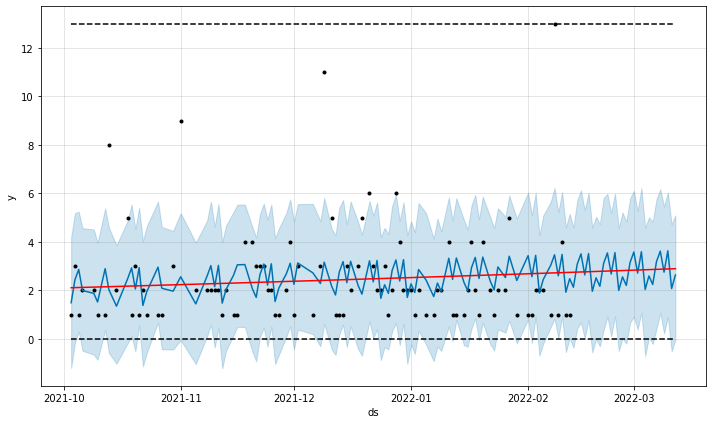

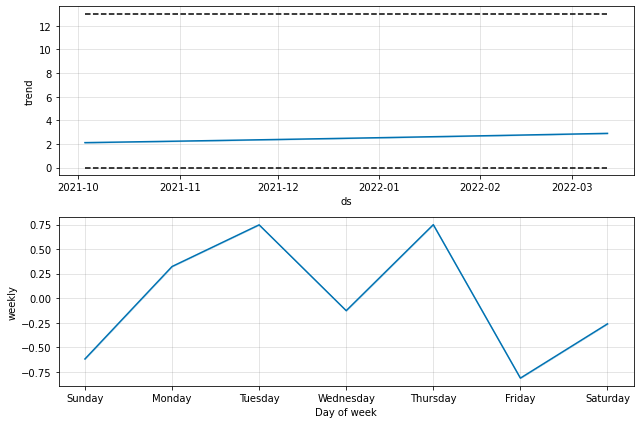

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -17.0035
Iteration  1. Log joint probability =    38.0536. Improved by 55.0572.
Iteration  2. Log joint probability =    60.8687. Improved by 22.815.
Iteration  3. Log joint probability =    62.0414. Improved by 1.17276.
Iteration  4. Log joint probability =    62.3191. Improved by 0.277685.
Iteration  5. Log joint probability =    62.7263. Improved by 0.407198.
Iteration  6. Log joint probability =    62.7683. Improved by 0.0419293.
Iteration  7. Log joint probability =    62.7806. Improved by 0.0123159.
Iteration  8. Log joint probability =    62.8095. Improved by 0.0289258.
Iteration  9. Log joint probability =    62.8353. Improved by 0.0258158.
Iteration 10. Log joint probability =     62.841. Improved by 0.00571148.
Iteration 11. Log joint probability =     62.848. Improved by 0.00696598.
Iteration 12. Log joint probability =    62.8528. Improved by 0.00480616.
Iteration 13. Log joint probability =    62.8577. Improved by 0.00489051.
Iteration 14. 

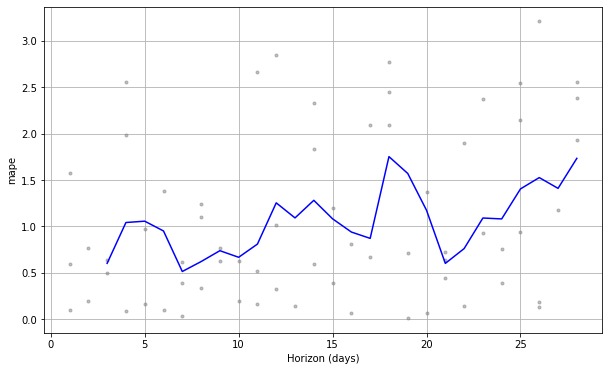

mape: 106.20%

16936
      CategoryCode  ItemCode     DateID  DailySales
10162   category_3     16936   1/1/2022           7
14294   category_3     16936  1/10/2022          11
6095    category_3     16936  1/11/2022           5
13815   category_3     16936  1/12/2022          10
6285    category_3     16936  1/13/2022           2
...            ...       ...        ...         ...
11997   category_3     16936   2/4/2022           2
12211   category_3     16936   2/6/2022           6
18704   category_3     16936   2/7/2022           6
1939    category_3     16936   2/8/2022           2
1276    category_3     16936   2/9/2022           8

[111 rows x 4 columns]

Initial log joint probability = -2.71965
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       205.308   9.59427e-07       99.3177      0.6236      0.6236      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       205

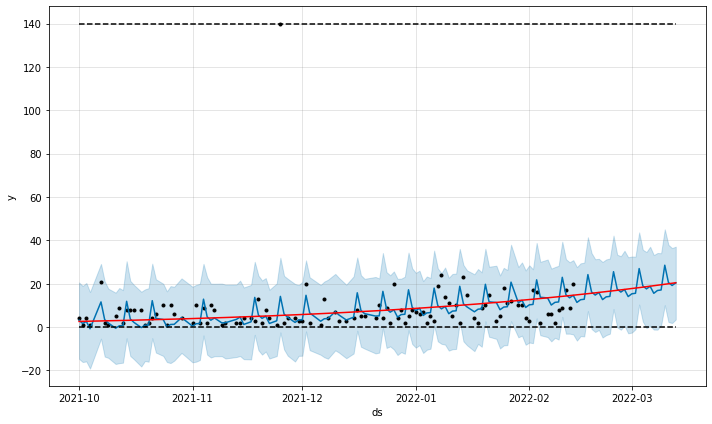

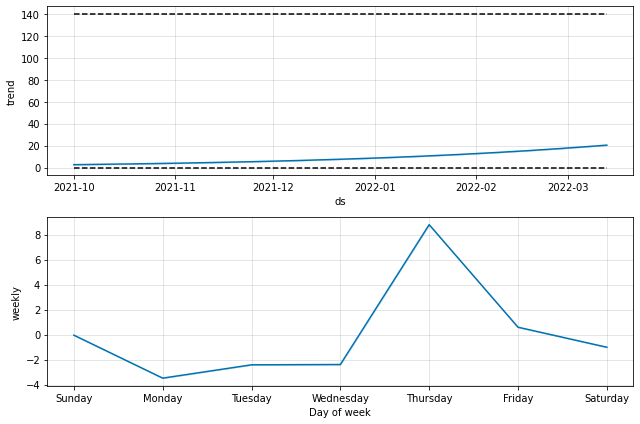

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -29.36
Iteration  1. Log joint probability =    18.0626. Improved by 47.4226.
Iteration  2. Log joint probability =    86.5725. Improved by 68.5099.
Iteration  3. Log joint probability =    94.4236. Improved by 7.85112.
Iteration  4. Log joint probability =    95.9935. Improved by 1.56994.
Iteration  5. Log joint probability =    97.7252. Improved by 1.73173.
Iteration  6. Log joint probability =     97.886. Improved by 0.16076.
Iteration  7. Log joint probability =    98.5005. Improved by 0.614479.
Iteration  8. Log joint probability =    98.6246. Improved by 0.124086.
Iteration  9. Log joint probability =    98.8588. Improved by 0.234191.
Iteration 10. Log joint probability =    98.8777. Improved by 0.0189057.
Iteration 11. Log joint probability =    99.0169. Improved by 0.139226.
Iteration 12. Log joint probability =    99.0215. Improved by 0.00461944.
Iteration 13. Log joint probability =    99.1016. Improved by 0.0800601.
Iteration 14. Log joint pr

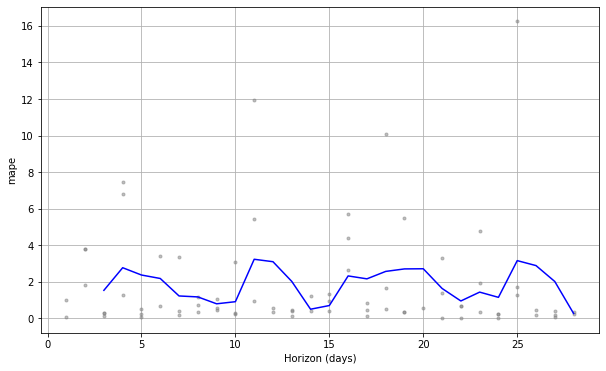

mape: 186.40%

23200
      CategoryCode  ItemCode      DateID  DailySales
11524   category_4     23200    1/1/2022           6
19836   category_4     23200   10/1/2021           2
19236   category_4     23200  10/10/2021           3
8599    category_4     23200  10/12/2021           2
18198   category_4     23200  10/13/2021           6
...            ...       ...         ...         ...
594     category_4     23200   12/7/2021          26
15954   category_4     23200   12/8/2021          24
320     category_4     23200   12/9/2021          21
12366   category_4     23200   2/12/2022           5
10224   category_4     23200   2/13/2022          17

[79 rows x 4 columns]


Initial log joint probability = -44.7747
Iteration  1. Log joint probability =     2.9134. Improved by 47.6881.
Iteration  2. Log joint probability =    6.82033. Improved by 3.90693.
Iteration  3. Log joint probability =    47.1052. Improved by 40.2849.
Iteration  4. Log joint probability =    47.1459. Improved by 0.

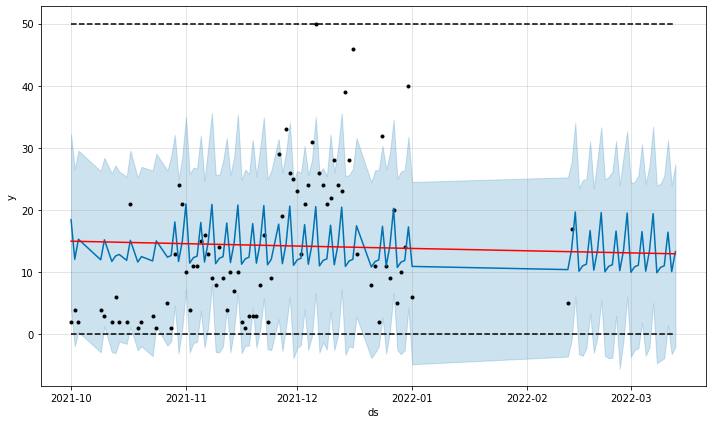

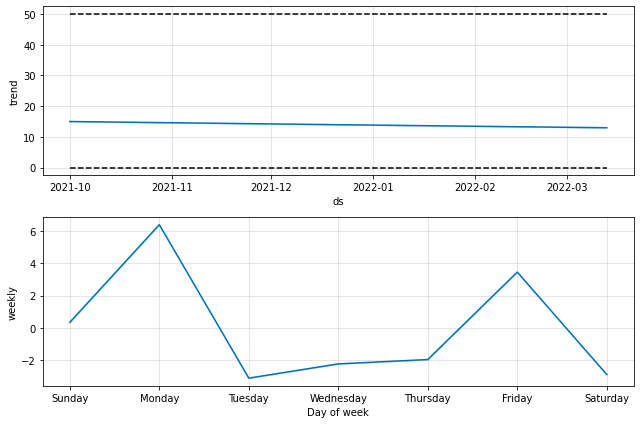

  0%|          | 0/1 [00:00<?, ?it/s]


Initial log joint probability = -43.4134
Iteration  1. Log joint probability =    62.4896. Improved by 105.903.
Iteration  2. Log joint probability =    82.0471. Improved by 19.5575.
Iteration  3. Log joint probability =    85.8124. Improved by 3.7653.
Iteration  4. Log joint probability =     86.058. Improved by 0.245663.
Iteration  5. Log joint probability =    88.0338. Improved by 1.97573.
Iteration  6. Log joint probability =    88.0887. Improved by 0.0549764.
Iteration  7. Log joint probability =    88.0977. Improved by 0.00896765.
Iteration  8. Log joint probability =     88.144. Improved by 0.0463234.
Iteration  9. Log joint probability =    88.1561. Improved by 0.0120621.
Iteration 10. Log joint probability =    88.1737. Improved by 0.0175889.
Iteration 11. Log joint probability =    88.1766. Improved by 0.00291527.
Iteration 12. Log joint probability =    88.1878. Improved by 0.0112218.
Iteration 13. Log joint probability =    88.1929. Improved by 0.00507378.
Iteration 14. Lo

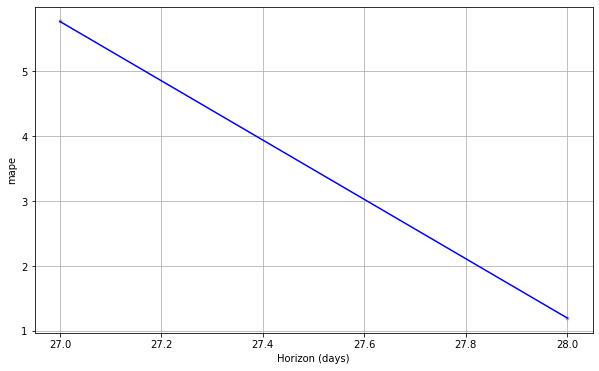

mape: 348.50%

32245
      CategoryCode  ItemCode     DateID  DailySales
11891   category_2     32245   1/1/2022           1
13144   category_2     32245  1/10/2022           1
6183    category_2     32245  1/11/2022           5
7398    category_2     32245  1/13/2022           2
11479   category_2     32245  1/14/2022          12
...            ...       ...        ...         ...
10428   category_2     32245   2/5/2022           4
11634   category_2     32245   2/6/2022          12
15247   category_2     32245   2/7/2022           6
175     category_2     32245   2/8/2022           2
94      category_2     32245   2/9/2022           2

[128 rows x 4 columns]

Initial log joint probability = -3.35964
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      51       211.073   0.000113435       98.7264   1.156e-06       0.001      100  LS failed, Hessian reset 
      99       211.095    4.5559e-08       97.4376       0.439           1      165   

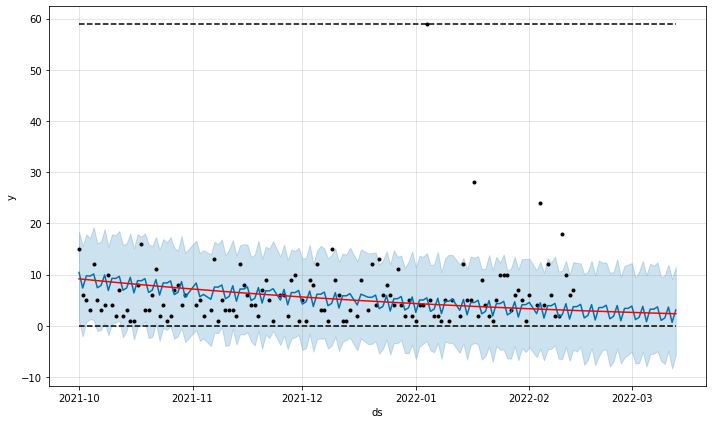

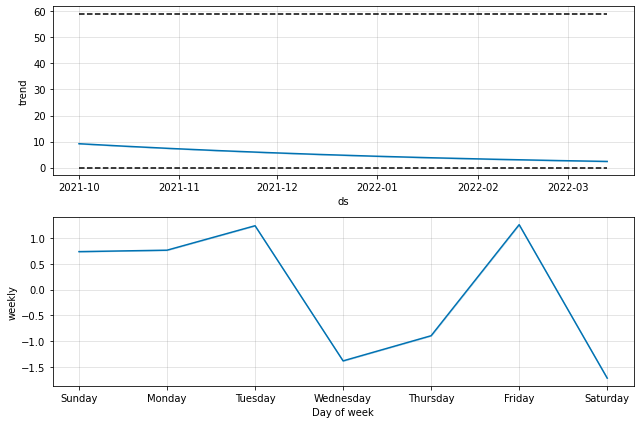

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -41.6928
Iteration  1. Log joint probability =    29.9049. Improved by 71.5977.
Iteration  2. Log joint probability =    56.1151. Improved by 26.2101.
Iteration  3. Log joint probability =    61.6297. Improved by 5.51469.
Iteration  4. Log joint probability =    63.6782. Improved by 2.04848.
Iteration  5. Log joint probability =    63.6905. Improved by 0.0122382.
Iteration  6. Log joint probability =    63.7109. Improved by 0.0204823.
Iteration  7. Log joint probability =    63.7214. Improved by 0.010445.
Iteration  8. Log joint probability =    63.7736. Improved by 0.052236.
Iteration  9. Log joint probability =    63.8273. Improved by 0.0536549.
Iteration 10. Log joint probability =    63.9904. Improved by 0.163143.
Iteration 11. Log joint probability =    64.0404. Improved by 0.0499246.
Iteration 12. Log joint probability =    64.1073. Improved by 0.0669773.
Iteration 13. Log joint probability =    64.2118. Improved by 0.104471.
Iteration 14. Log joi

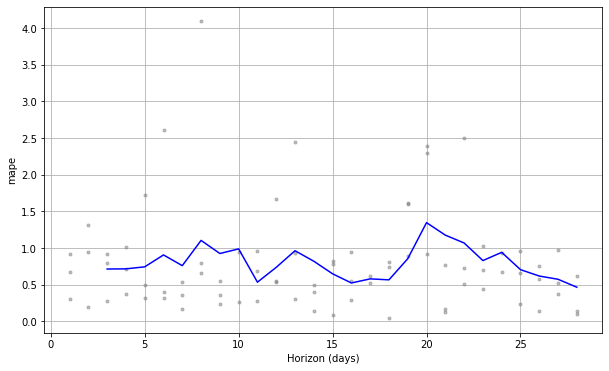

mape: 80.12%

35449
      CategoryCode  ItemCode     DateID  DailySales
13940   category_1     35449  1/10/2022           5
6109    category_1     35449  1/11/2022           1
6254    category_1     35449  1/13/2022           3
12038   category_1     35449  1/14/2022           1
12274   category_1     35449  1/15/2022           4
...            ...       ...        ...         ...
12333   category_1     35449   2/5/2022           2
11388   category_1     35449   2/6/2022           2
18584   category_1     35449   2/7/2022           7
1711    category_1     35449   2/8/2022           8
485     category_1     35449   2/9/2022           8

[79 rows x 4 columns]


Initial log joint probability = -42.9979
Iteration  1. Log joint probability =    57.4908. Improved by 100.489.
Iteration  2. Log joint probability =    95.8123. Improved by 38.3215.
Iteration  3. Log joint probability =    98.9971. Improved by 3.18478.
Iteration  4. Log joint probability =    100.886. Improved by 1.88907.
Iterat

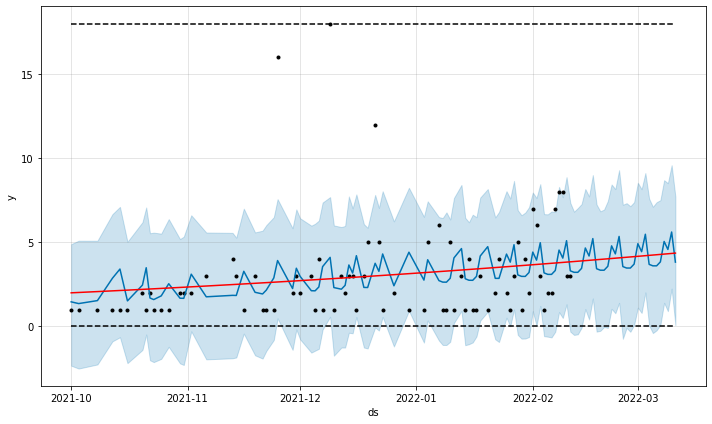

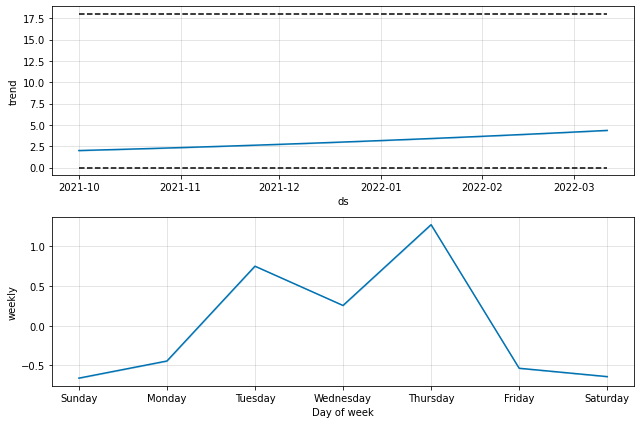

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -67.3942
Iteration  1. Log joint probability =   -10.3591. Improved by 57.035.
Iteration  2. Log joint probability =     7.1384. Improved by 17.4976.
Iteration  3. Log joint probability =     37.437. Improved by 30.2986.
Iteration  4. Log joint probability =    44.4647. Improved by 7.02764.
Iteration  5. Log joint probability =    44.4773. Improved by 0.0126657.
Iteration  6. Log joint probability =    44.4837. Improved by 0.00633034.
Iteration  7. Log joint probability =    44.5078. Improved by 0.0241494.
Iteration  8. Log joint probability =    44.7631. Improved by 0.255307.
Iteration  9. Log joint probability =    44.9399. Improved by 0.17681.
Iteration 10. Log joint probability =    46.3155. Improved by 1.3756.
Iteration 11. Log joint probability =    47.3457. Improved by 1.03018.
Iteration 12. Log joint probability =    48.5852. Improved by 1.23952.
Iteration 13. Log joint probability =     48.589. Improved by 0.00374071.
Iteration 14. Log joint pr

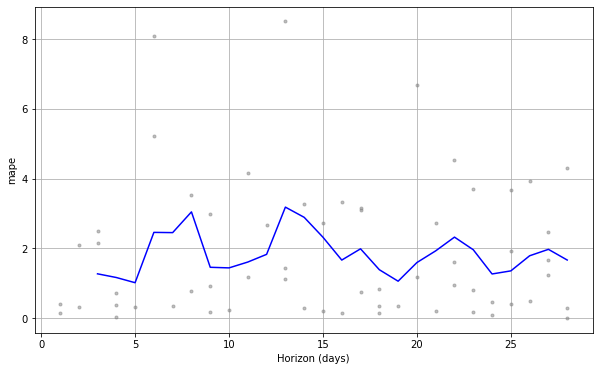

mape: 185.02%

35530
      CategoryCode  ItemCode     DateID  DailySales
12094   category_1     35530   1/1/2022           2
13339   category_1     35530  1/10/2022           7
6298    category_1     35530  1/11/2022           1
12773   category_1     35530  1/12/2022           1
7140    category_1     35530  1/13/2022           6
...            ...       ...        ...         ...
1926    category_1     35530  12/7/2021          10
194     category_1     35530  12/9/2021           9
7575    category_1     35530  2/10/2022           5
10283   category_1     35530  2/13/2022           1
1377    category_1     35530   2/9/2022          16

[74 rows x 4 columns]


Initial log joint probability = -39.4065
Iteration  1. Log joint probability =    22.6579. Improved by 62.0644.
Iteration  2. Log joint probability =    36.7343. Improved by 14.0764.
Iteration  3. Log joint probability =    56.5085. Improved by 19.7742.
Iteration  4. Log joint probability =    57.1441. Improved by 0.635632.
Iter

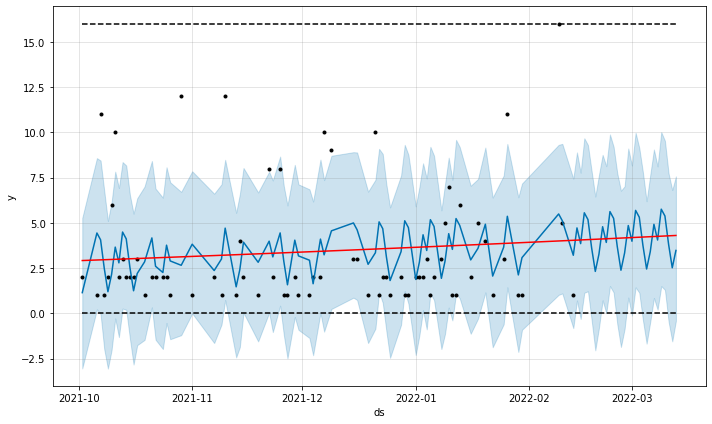

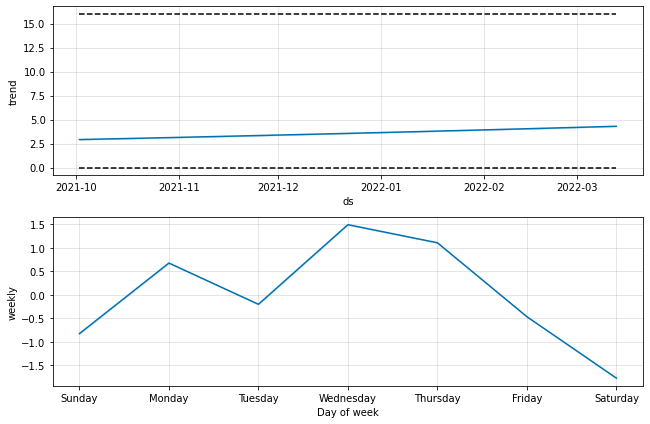

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -10.9386
Iteration  1. Log joint probability =    10.6333. Improved by 21.5719.
Iteration  2. Log joint probability =    32.4751. Improved by 21.8418.
Iteration  3. Log joint probability =    34.6842. Improved by 2.20909.
Iteration  4. Log joint probability =    35.3399. Improved by 0.655765.
Iteration  5. Log joint probability =    35.4675. Improved by 0.127552.
Iteration  6. Log joint probability =    35.4972. Improved by 0.0297084.
Iteration  7. Log joint probability =    35.5147. Improved by 0.0174956.
Iteration  8. Log joint probability =    35.5219. Improved by 0.00721168.
Iteration  9. Log joint probability =     35.529. Improved by 0.00712657.
Iteration 10. Log joint probability =      35.57. Improved by 0.0409333.
Iteration 11. Log joint probability =    35.5904. Improved by 0.0204671.
Iteration 12. Log joint probability =    35.7915. Improved by 0.201091.
Iteration 13. Log joint probability =    35.8008. Improved by 0.00929758.
Iteration 14. L

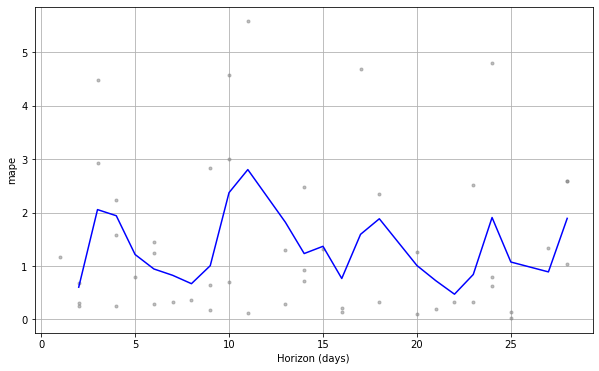

mape: 133.10%

36898
      CategoryCode  ItemCode     DateID  DailySales
10782   category_1     36898   1/1/2022          16
12516   category_1     36898  1/10/2022           3
7010    category_1     36898  1/11/2022          16
12528   category_1     36898  1/12/2022          12
6490    category_1     36898  1/13/2022          17
...            ...       ...        ...         ...
11756   category_1     36898   2/5/2022          12
9993    category_1     36898   2/6/2022          11
18721   category_1     36898   2/7/2022          13
905     category_1     36898   2/8/2022           4
826     category_1     36898   2/9/2022          11

[135 rows x 4 columns]

Initial log joint probability = -3.97703
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70       192.202   8.67168e-09       101.168      0.6687      0.6687       96   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

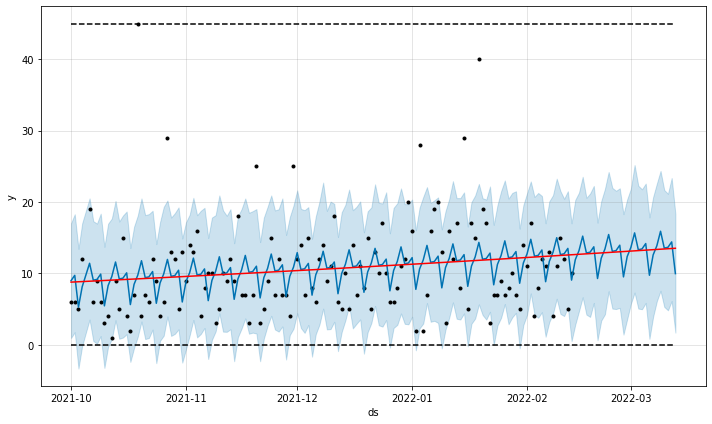

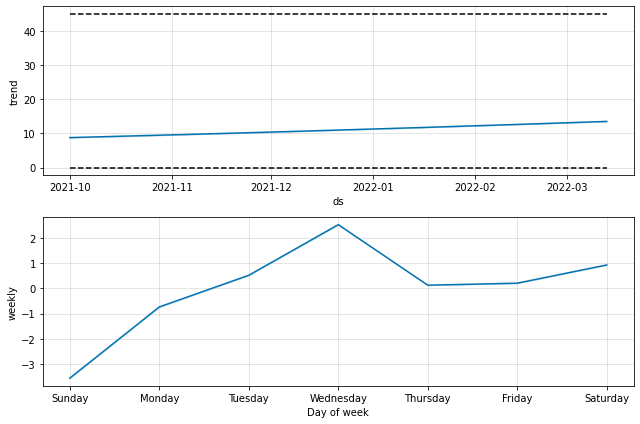

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -43.2457
Iteration  1. Log joint probability =    34.3168. Improved by 77.5625.
Iteration  2. Log joint probability =    98.2013. Improved by 63.8845.
Iteration  3. Log joint probability =    111.174. Improved by 12.9731.
Iteration  4. Log joint probability =    114.841. Improved by 3.66616.
Iteration  5. Log joint probability =    115.595. Improved by 0.754192.
Iteration  6. Log joint probability =    115.717. Improved by 0.122646.
Iteration  7. Log joint probability =    115.769. Improved by 0.0519065.
Iteration  8. Log joint probability =    115.778. Improved by 0.00917444.
Iteration  9. Log joint probability =    115.799. Improved by 0.0207587.
Iteration 10. Log joint probability =    115.827. Improved by 0.0274452.
Iteration 11. Log joint probability =    115.846. Improved by 0.0190172.
Iteration 12. Log joint probability =    115.858. Improved by 0.0125933.
Iteration 13. Log joint probability =     115.87. Improved by 0.0118629.
Iteration 14. Log 

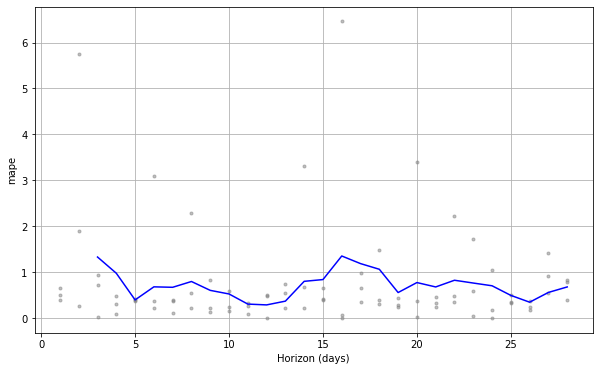

mape: 71.25%

37510
      CategoryCode  ItemCode     DateID  DailySales
12477   category_1     37510  1/10/2022           1
7454    category_1     37510  1/11/2022           1
7251    category_1     37510  1/13/2022           3
12005   category_1     37510  1/14/2022           1
10292   category_1     37510  1/15/2022           1
...            ...       ...        ...         ...
3922    category_1     37510   2/3/2022           2
11316   category_1     37510   2/6/2022           3
15597   category_1     37510   2/7/2022           3
1559    category_1     37510   2/8/2022           1
1815    category_1     37510   2/9/2022           1

[74 rows x 4 columns]


Initial log joint probability = -76.8093
Iteration  1. Log joint probability =   -31.9365. Improved by 44.8728.
Iteration  2. Log joint probability =    5.46448. Improved by 37.401.
Iteration  3. Log joint probability =    60.3155. Improved by 54.851.
Iteration  4. Log joint probability =    63.3126. Improved by 2.99711.
Iteratio

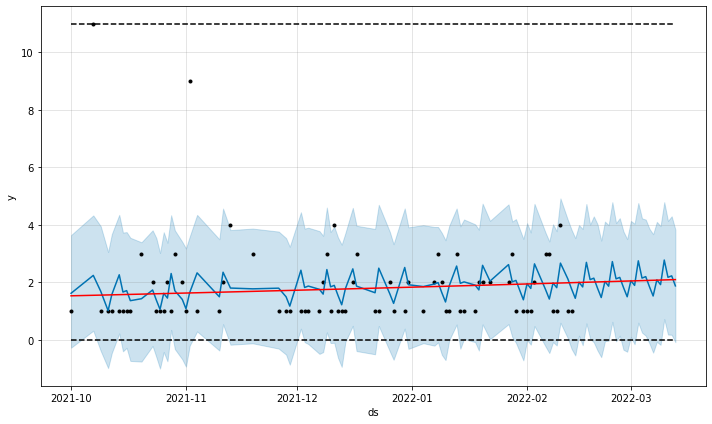

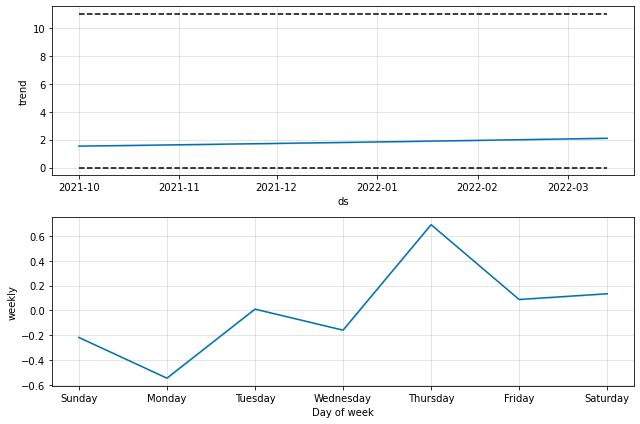

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -7.63429
Iteration  1. Log joint probability =    29.8955. Improved by 37.5298.
Iteration  2. Log joint probability =    48.1927. Improved by 18.2972.
Iteration  3. Log joint probability =    49.0967. Improved by 0.903979.
Iteration  4. Log joint probability =    49.2613. Improved by 0.16462.
Iteration  5. Log joint probability =    49.3147. Improved by 0.0533647.
Iteration  6. Log joint probability =    49.4375. Improved by 0.12288.
Iteration  7. Log joint probability =    49.4718. Improved by 0.0342246.
Iteration  8. Log joint probability =    49.4828. Improved by 0.0110065.
Iteration  9. Log joint probability =    49.5064. Improved by 0.0236293.
Iteration 10. Log joint probability =    49.5371. Improved by 0.0307159.
Iteration 11. Log joint probability =    49.5414. Improved by 0.00430785.
Iteration 12. Log joint probability =    49.5476. Improved by 0.00613644.
Iteration 13. Log joint probability =    49.5581. Improved by 0.0105748.
Iteration 14. Lo

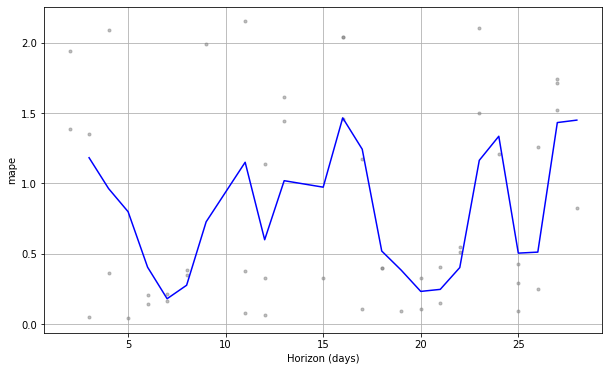

mape: 79.91%

37861
      CategoryCode  ItemCode     DateID  DailySales
10990   category_3     37861   1/1/2022           5
13459   category_3     37861  1/10/2022          36
6056    category_3     37861  1/11/2022          25
12982   category_3     37861  1/12/2022          11
5382    category_3     37861  1/13/2022          18
...            ...       ...        ...         ...
12314   category_3     37861   2/5/2022           1
10433   category_3     37861   2/6/2022          20
15590   category_3     37861   2/7/2022          14
1243    category_3     37861   2/8/2022          63
917     category_3     37861   2/9/2022          16

[135 rows x 4 columns]

Initial log joint probability = -3.34345
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       217.762   1.49299e-06       99.3868           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       217.

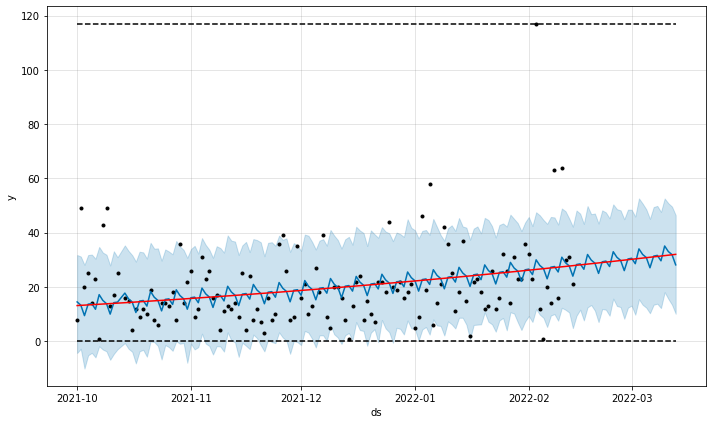

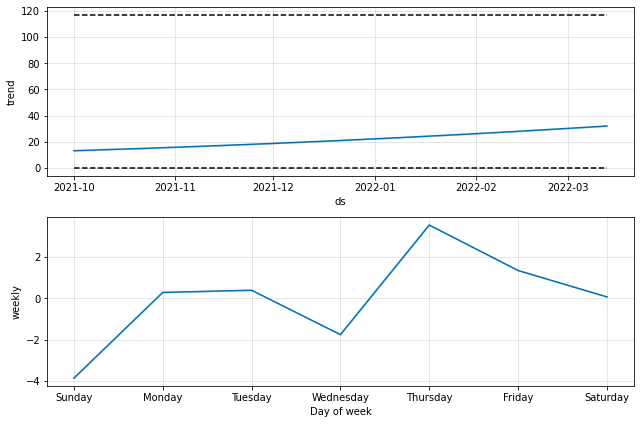

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -44.4278
Iteration  1. Log joint probability =     22.526. Improved by 66.9538.
Iteration  2. Log joint probability =     76.314. Improved by 53.788.
Iteration  3. Log joint probability =    80.2496. Improved by 3.93563.
Iteration  4. Log joint probability =     80.502. Improved by 0.252382.
Iteration  5. Log joint probability =    80.5038. Improved by 0.00181401.
Iteration  6. Log joint probability =    80.5056. Improved by 0.00174877.
Iteration  7. Log joint probability =    80.5795. Improved by 0.0739174.
Iteration  8. Log joint probability =    81.0176. Improved by 0.438096.
Iteration  9. Log joint probability =    81.0222. Improved by 0.00464432.
Iteration 10. Log joint probability =    81.0788. Improved by 0.0565521.
Iteration 11. Log joint probability =    81.1122. Improved by 0.0334408.
Iteration 12. Log joint probability =    81.1206. Improved by 0.00833849.
Iteration 13. Log joint probability =    81.1339. Improved by 0.0133697.
Iteration 14. 

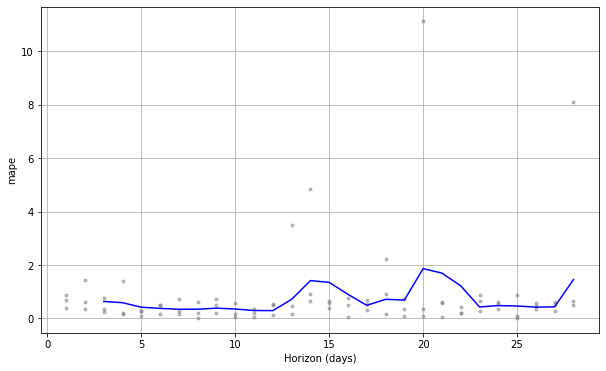

mape: 72.20%

38518
      CategoryCode  ItemCode     DateID  DailySales
10603   category_1     38518   1/1/2022           4
14745   category_1     38518  1/10/2022           1
6414    category_1     38518  1/11/2022           6
5635    category_1     38518  1/13/2022           1
11566   category_1     38518  1/14/2022           3
...            ...       ...        ...         ...
11307   category_1     38518   2/5/2022           1
11458   category_1     38518   2/6/2022           3
15319   category_1     38518   2/7/2022           4
430     category_1     38518   2/8/2022           2
1241    category_1     38518   2/9/2022           6

[109 rows x 4 columns]

Initial log joint probability = -3.68593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       145.221   9.19439e-09       95.2458      0.3543      0.3543       88   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE I

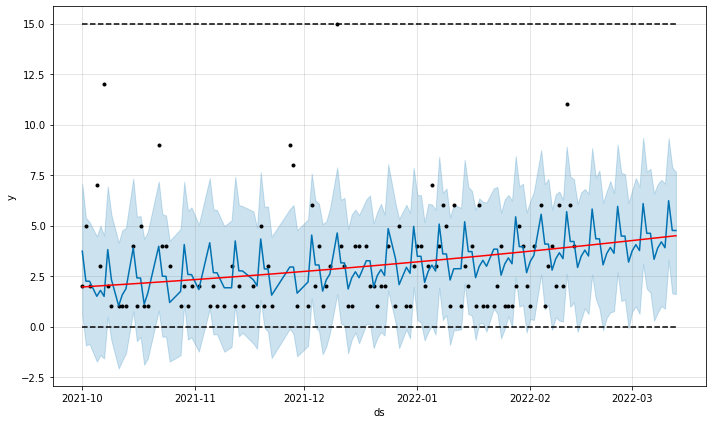

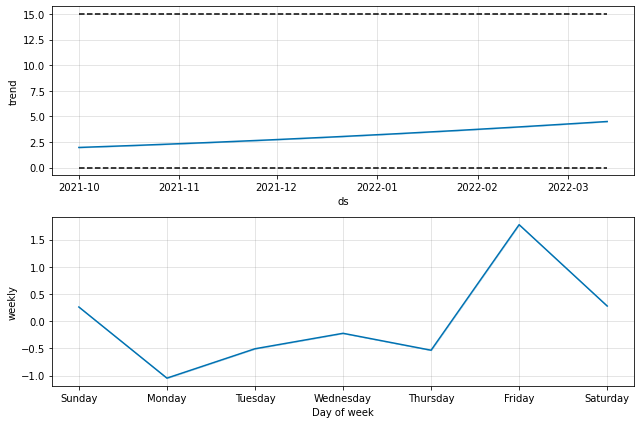

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -47.1661
Iteration  1. Log joint probability =    12.4294. Improved by 59.5955.
Iteration  2. Log joint probability =    54.2288. Improved by 41.7994.
Iteration  3. Log joint probability =    66.4324. Improved by 12.2036.
Iteration  4. Log joint probability =    68.6555. Improved by 2.22312.
Iteration  5. Log joint probability =    69.6845. Improved by 1.02904.
Iteration  6. Log joint probability =    69.7025. Improved by 0.0179412.
Iteration  7. Log joint probability =    69.9531. Improved by 0.250577.
Iteration  8. Log joint probability =    70.1826. Improved by 0.229581.
Iteration  9. Log joint probability =    70.2342. Improved by 0.0515469.
Iteration 10. Log joint probability =    70.2355. Improved by 0.00131537.
Iteration 11. Log joint probability =    70.2378. Improved by 0.0023433.
Iteration 12. Log joint probability =    70.2423. Improved by 0.00445452.
Iteration 13. Log joint probability =    70.2561. Improved by 0.0138217.
Iteration 14. Log j

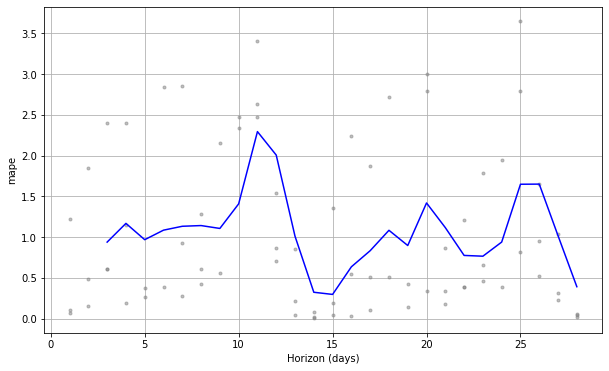

mape: 107.92%

39436
      CategoryCode  ItemCode     DateID  DailySales
12331   category_2     39436   1/1/2022           1
6098    category_2     39436  1/11/2022           6
12789   category_2     39436  1/12/2022           5
5423    category_2     39436  1/13/2022           2
11964   category_2     39436  1/14/2022           1
...            ...       ...        ...         ...
11700   category_2     39436   2/4/2022           1
11419   category_2     39436   2/5/2022           2
10587   category_2     39436   2/6/2022           6
18825   category_2     39436   2/7/2022           2
1078    category_2     39436   2/8/2022           3

[115 rows x 4 columns]

Initial log joint probability = -28.3476
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       185.106   9.63747e-09       99.5318      0.2493      0.2493       86   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

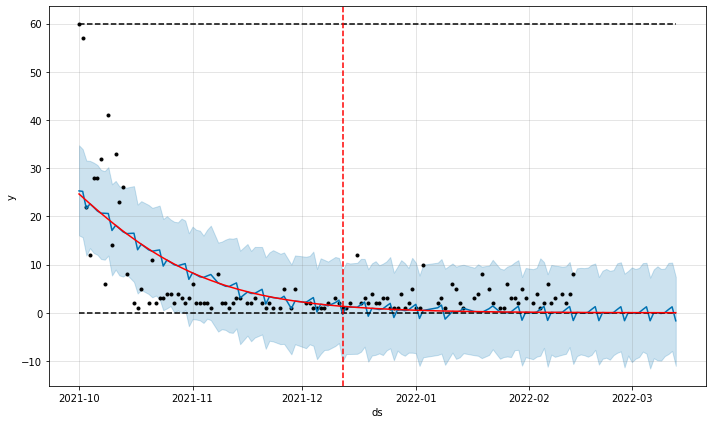

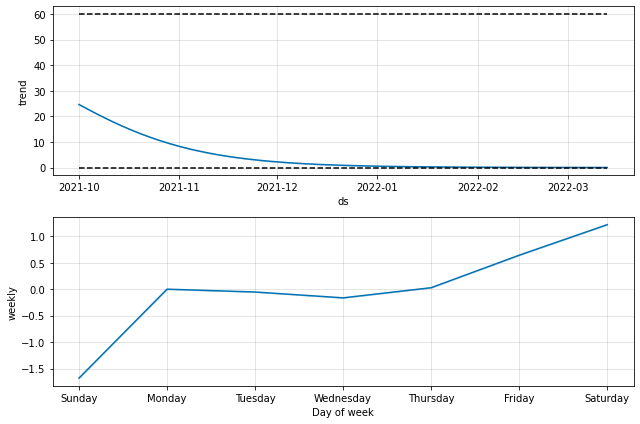

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -44.762
Iteration  1. Log joint probability =   -2.21676. Improved by 42.5452.
Iteration  2. Log joint probability =    28.0783. Improved by 30.2951.
Iteration  3. Log joint probability =    46.4501. Improved by 18.3717.
Iteration  4. Log joint probability =    46.4622. Improved by 0.0121381.
Iteration  5. Log joint probability =    46.4773. Improved by 0.0151052.
Iteration  6. Log joint probability =    46.5071. Improved by 0.0298027.
Iteration  7. Log joint probability =    46.5142. Improved by 0.00705366.
Iteration  8. Log joint probability =      46.56. Improved by 0.0458604.
Iteration  9. Log joint probability =     46.572. Improved by 0.0119891.
Iteration 10. Log joint probability =     46.807. Improved by 0.234965.
Iteration 11. Log joint probability =    46.8253. Improved by 0.0183604.
Iteration 12. Log joint probability =    63.5107. Improved by 16.6854.
Iteration 13. Log joint probability =    63.5327. Improved by 0.0219842.
Iteration 14. Log 

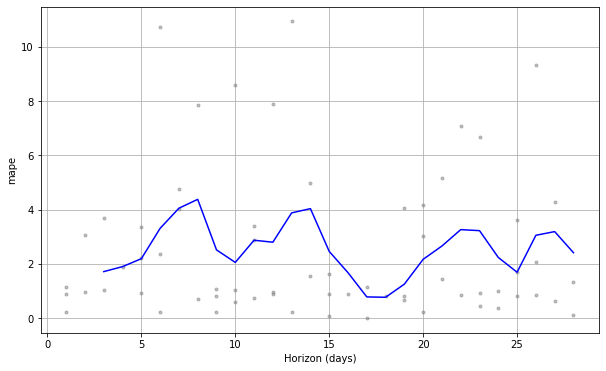

mape: 256.00%

41830
      CategoryCode  ItemCode     DateID  DailySales
11243   category_2     41830   1/1/2022           5
13332   category_2     41830  1/10/2022           2
7520    category_2     41830  1/11/2022           4
12639   category_2     41830  1/12/2022           1
6671    category_2     41830  1/13/2022           3
...            ...       ...        ...         ...
10967   category_2     41830   2/5/2022           5
11842   category_2     41830   2/6/2022           2
18858   category_2     41830   2/7/2022           1
1496    category_2     41830   2/8/2022           1
98      category_2     41830   2/9/2022           2

[118 rows x 4 columns]

Initial log joint probability = -33.1281
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       105.772   8.75506e-09       96.5984      0.3104      0.3104       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

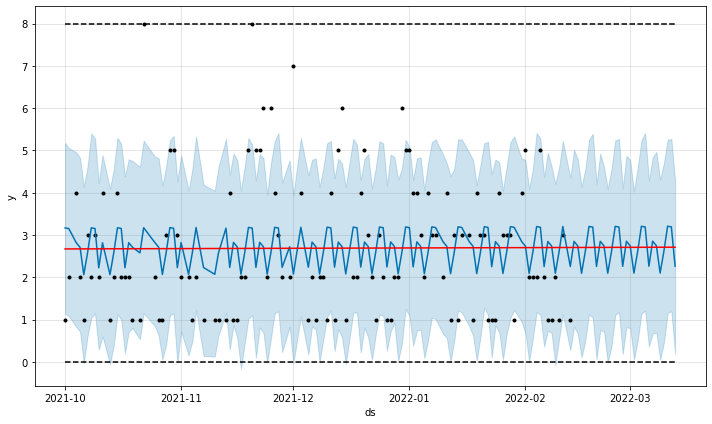

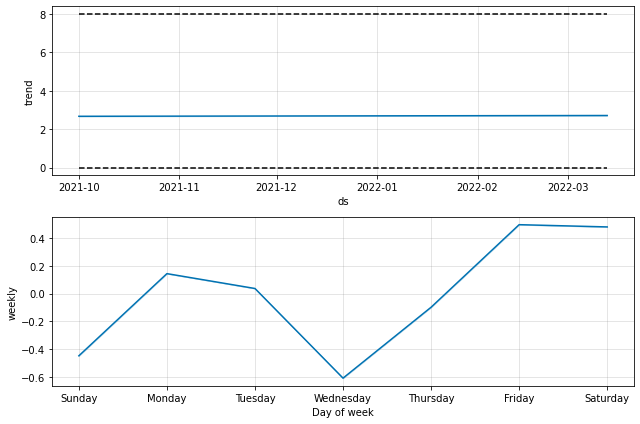

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -31.7807
Iteration  1. Log joint probability =    9.02154. Improved by 40.8023.
Iteration  2. Log joint probability =    62.8663. Improved by 53.8448.
Iteration  3. Log joint probability =    65.7535. Improved by 2.88713.
Iteration  4. Log joint probability =    67.6365. Improved by 1.88304.
Iteration  5. Log joint probability =     68.011. Improved by 0.374535.
Iteration  6. Log joint probability =    68.0959. Improved by 0.0848269.
Iteration  7. Log joint probability =    68.2427. Improved by 0.146883.
Iteration  8. Log joint probability =    68.2596. Improved by 0.0169003.
Iteration  9. Log joint probability =    68.2609. Improved by 0.00124512.
Iteration 10. Log joint probability =     68.261. Improved by 9.26495e-05.
Iteration 11. Log joint probability =    68.2615. Improved by 0.00057211.
Iteration 12. Log joint probability =    68.2652. Improved by 0.00368554.
Iteration 13. Log joint probability =    68.2659. Improved by 0.000676152.
Iteration 14

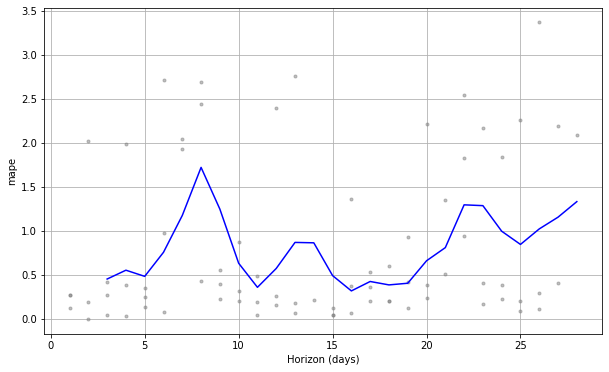

mape: 81.61%

42424
      CategoryCode  ItemCode     DateID  DailySales
11791   category_1     42424   1/1/2022           6
12514   category_1     42424  1/10/2022           7
5925    category_1     42424  1/11/2022          19
13834   category_1     42424  1/12/2022           6
5679    category_1     42424  1/13/2022           4
...            ...       ...        ...         ...
11712   category_1     42424   2/5/2022           6
10332   category_1     42424   2/6/2022          13
15725   category_1     42424   2/7/2022           4
938     category_1     42424   2/8/2022          11
953     category_1     42424   2/9/2022          10

[128 rows x 4 columns]

Initial log joint probability = -14.6263
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       179.268    2.9139e-06       84.3347   3.562e-08       0.001      152  LS failed, Hessian reset 
      99       179.268   3.52878e-08       76.4001      0.1959      0.1959      163   


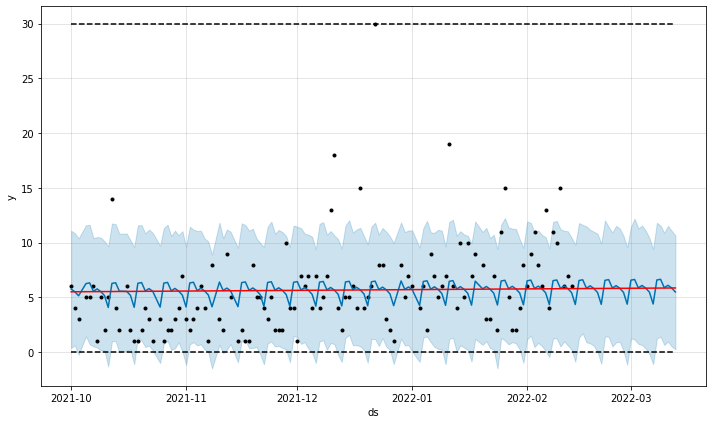

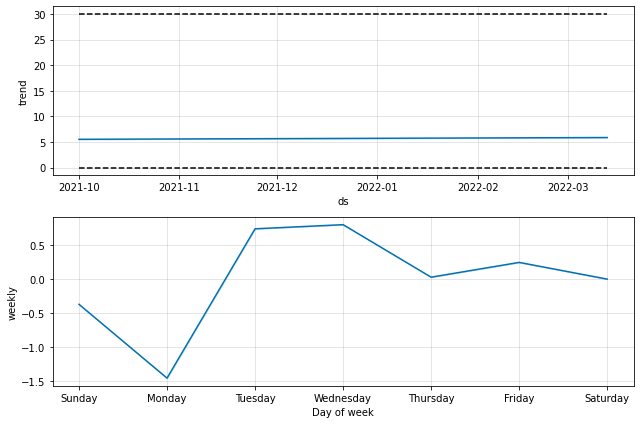

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -39.5507
Iteration  1. Log joint probability =    74.4317. Improved by 113.982.
Iteration  2. Log joint probability =    88.5129. Improved by 14.0812.
Iteration  3. Log joint probability =     89.812. Improved by 1.29907.
Iteration  4. Log joint probability =    89.8198. Improved by 0.00779563.
Iteration  5. Log joint probability =    89.8279. Improved by 0.00804982.
Iteration  6. Log joint probability =     89.899. Improved by 0.071115.
Iteration  7. Log joint probability =    90.0432. Improved by 0.144255.
Iteration  8. Log joint probability =    90.1148. Improved by 0.0715636.
Iteration  9. Log joint probability =    90.1849. Improved by 0.0700892.
Iteration 10. Log joint probability =    90.2533. Improved by 0.0683791.
Iteration 11. Log joint probability =    90.3858. Improved by 0.132586.
Iteration 12. Log joint probability =    90.3917. Improved by 0.00590308.
Iteration 13. Log joint probability =    90.5761. Improved by 0.18437.
Iteration 14. Log

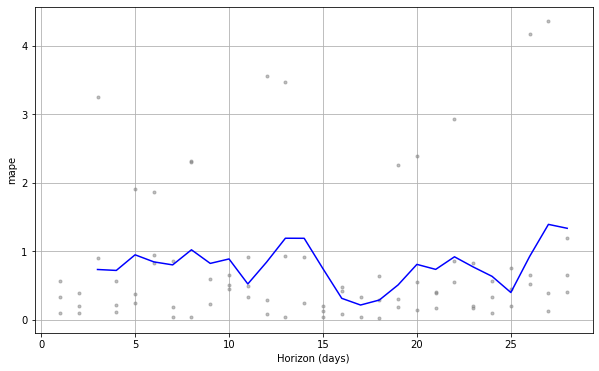

mape: 78.67%

42496
      CategoryCode  ItemCode     DateID  DailySales
10411   category_1     42496   1/1/2022           6
7383    category_1     42496  1/11/2022           1
14609   category_1     42496  1/12/2022          10
5541    category_1     42496  1/13/2022          13
11018   category_1     42496  1/14/2022           3
...            ...       ...        ...         ...
10754   category_1     42496   2/5/2022           1
11065   category_1     42496   2/6/2022           3
15819   category_1     42496   2/7/2022           5
854     category_1     42496   2/8/2022           2
416     category_1     42496   2/9/2022           7

[123 rows x 4 columns]

Initial log joint probability = -3.50904
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        173.53   1.91095e-07       85.7647      0.2969           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121        173

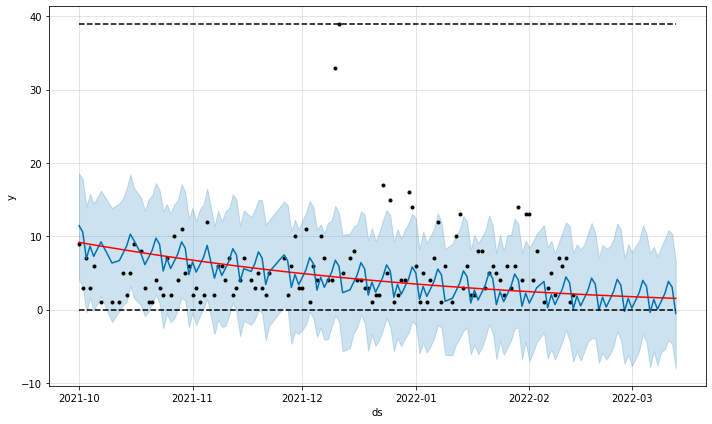

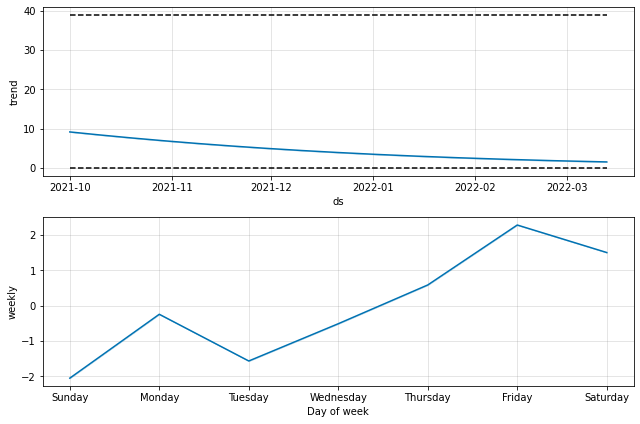

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -33.4833
Iteration  1. Log joint probability =     17.233. Improved by 50.7163.
Iteration  2. Log joint probability =    31.0776. Improved by 13.8446.
Iteration  3. Log joint probability =    59.0904. Improved by 28.0129.
Iteration  4. Log joint probability =    59.0955. Improved by 0.0050862.
Iteration  5. Log joint probability =    59.1566. Improved by 0.0610461.
Iteration  6. Log joint probability =    60.5404. Improved by 1.38381.
Iteration  7. Log joint probability =    65.9715. Improved by 5.43108.
Iteration  8. Log joint probability =    67.3502. Improved by 1.37875.
Iteration  9. Log joint probability =    75.1698. Improved by 7.81955.
Iteration 10. Log joint probability =    82.2897. Improved by 7.11995.
Iteration 11. Log joint probability =    85.3602. Improved by 3.07052.
Iteration 12. Log joint probability =    86.0976. Improved by 0.737386.
Iteration 13. Log joint probability =    86.8489. Improved by 0.75131.
Iteration 14. Log joint probab

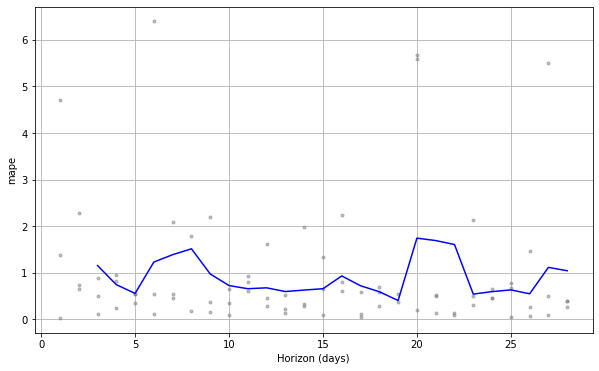

mape: 91.08%

43630
      CategoryCode  ItemCode     DateID  DailySales
10056   category_2     43630   1/1/2022           2
13094   category_2     43630  1/10/2022           1
7350    category_2     43630  1/11/2022           2
14086   category_2     43630  1/12/2022           3
10791   category_2     43630  1/14/2022           9
...            ...       ...        ...         ...
9988    category_2     43630   2/5/2022           4
11627   category_2     43630   2/6/2022           2
16114   category_2     43630   2/7/2022           4
1081    category_2     43630   2/8/2022          12
1185    category_2     43630   2/9/2022           6

[131 rows x 4 columns]

Initial log joint probability = -4.36731
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        175.42     0.0316377       90.4111      0.8934      0.8934      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       176.

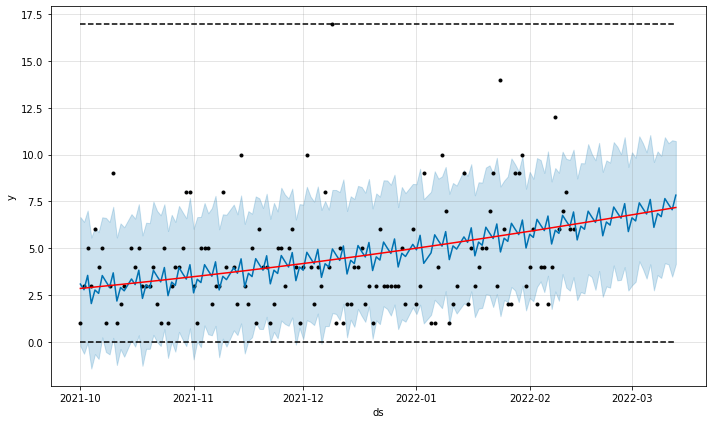

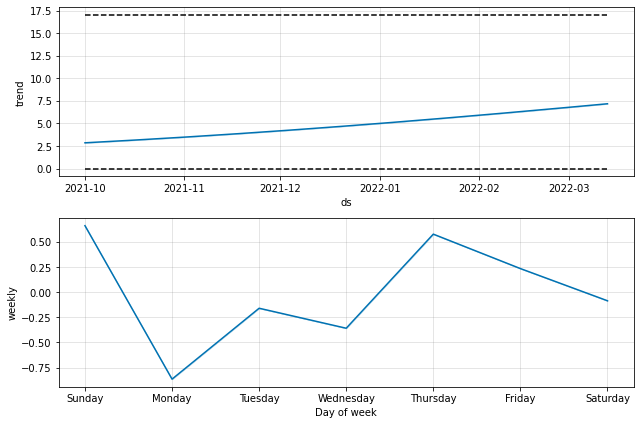

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -42.3691
Iteration  1. Log joint probability =    8.83312. Improved by 51.2022.
Iteration  2. Log joint probability =    40.8305. Improved by 31.9974.
Iteration  3. Log joint probability =    69.9552. Improved by 29.1247.
Iteration  4. Log joint probability =    69.9872. Improved by 0.0320077.
Iteration  5. Log joint probability =    69.9952. Improved by 0.00800224.
Iteration  6. Log joint probability =    70.0888. Improved by 0.0935541.
Iteration  7. Log joint probability =    70.1451. Improved by 0.0563638.
Iteration  8. Log joint probability =    70.1592. Improved by 0.0140918.
Iteration  9. Log joint probability =    70.1663. Improved by 0.007046.
Iteration 10. Log joint probability =    70.2502. Improved by 0.0839757.
Iteration 11. Log joint probability =    70.2922. Improved by 0.041948.
Iteration 12. Log joint probability =    70.3132. Improved by 0.0209748.
Iteration 13. Log joint probability =    70.3315. Improved by 0.0183376.
Iteration 14. Lo

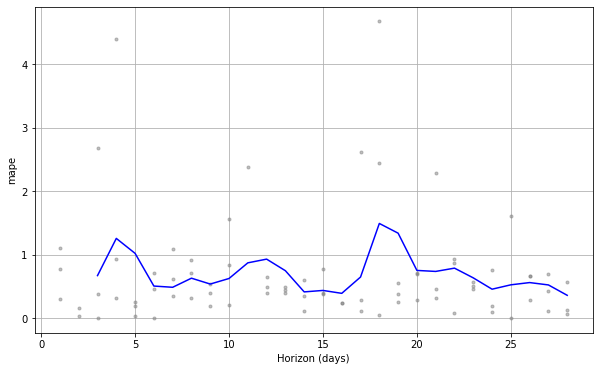

mape: 70.76%

43738
      CategoryCode  ItemCode     DateID  DailySales
13387   category_1     43738  1/10/2022           2
5310    category_1     43738  1/11/2022          10
14078   category_1     43738  1/12/2022           5
5432    category_1     43738  1/13/2022           1
10561   category_1     43738  1/14/2022           3
...            ...       ...        ...         ...
10195   category_1     43738   2/5/2022           4
10151   category_1     43738   2/6/2022           1
15521   category_1     43738   2/7/2022           3
606     category_1     43738   2/8/2022          11
1357    category_1     43738   2/9/2022           5

[109 rows x 4 columns]

Initial log joint probability = -23.1063
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       113.913   5.47581e-09       91.3955      0.3334      0.3334       88   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE I

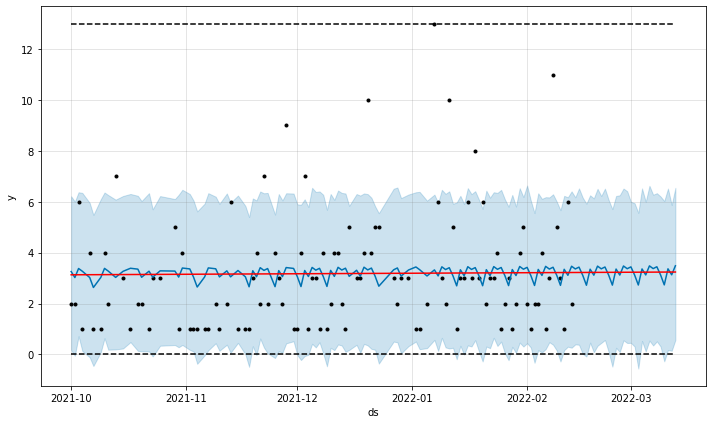

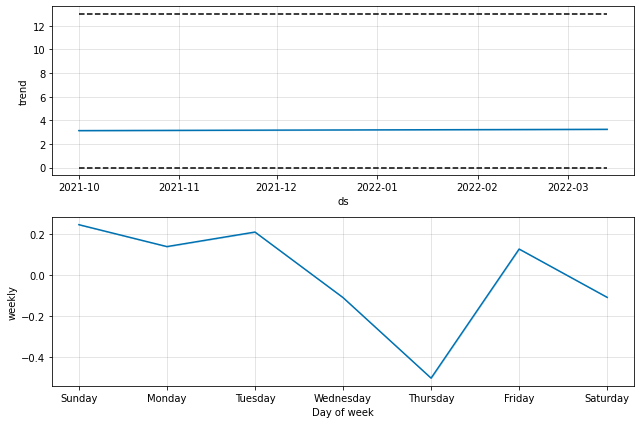

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -25.6452
Iteration  1. Log joint probability =    52.9618. Improved by 78.607.
Iteration  2. Log joint probability =    58.9722. Improved by 6.01039.
Iteration  3. Log joint probability =    66.8185. Improved by 7.84633.
Iteration  4. Log joint probability =    67.4794. Improved by 0.660873.
Iteration  5. Log joint probability =    67.4847. Improved by 0.00530077.
Iteration  6. Log joint probability =    67.4967. Improved by 0.0119568.
Iteration  7. Log joint probability =    67.5605. Improved by 0.0638706.
Iteration  8. Log joint probability =    67.7368. Improved by 0.176257.
Iteration  9. Log joint probability =    67.8115. Improved by 0.0747135.
Iteration 10. Log joint probability =    68.0388. Improved by 0.22731.
Iteration 11. Log joint probability =    68.0399. Improved by 0.00113279.
Iteration 12. Log joint probability =      68.07. Improved by 0.0300766.
Iteration 13. Log joint probability =    68.1154. Improved by 0.0454144.
Iteration 14. Log 

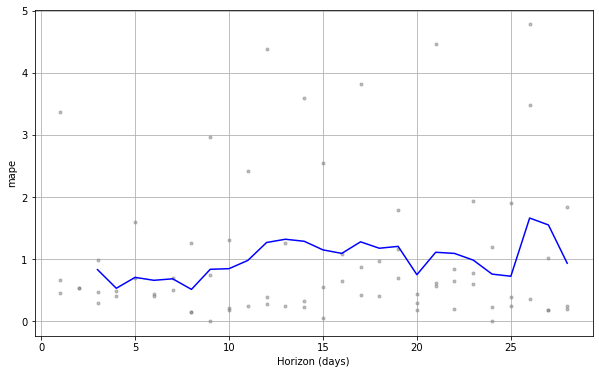

mape: 99.57%

57058
      CategoryCode  ItemCode     DateID  DailySales
12157   category_2     57058   1/1/2022           3
14371   category_2     57058  1/10/2022           2
7217    category_2     57058  1/11/2022           2
10535   category_2     57058  1/15/2022           3
5813    category_2     57058  1/17/2022          16
...            ...       ...        ...         ...
14466   category_2     57058   2/2/2022           2
4384    category_2     57058   2/3/2022           3
11227   category_2     57058   2/4/2022           2
11135   category_2     57058   2/5/2022           1
12223   category_2     57058   2/6/2022           1

[68 rows x 4 columns]


Initial log joint probability = -45.2554
Iteration  1. Log joint probability =    81.1515. Improved by 126.407.
Iteration  2. Log joint probability =    96.8262. Improved by 15.6746.
Iteration  3. Log joint probability =     100.32. Improved by 3.49392.
Iteration  4. Log joint probability =    103.156. Improved by 2.83604.
Iterat

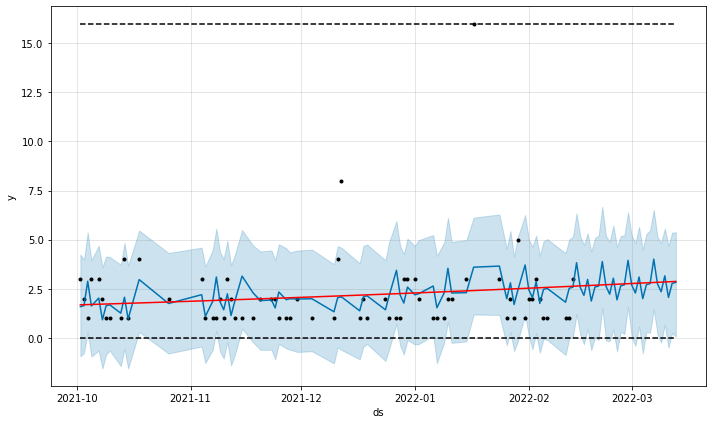

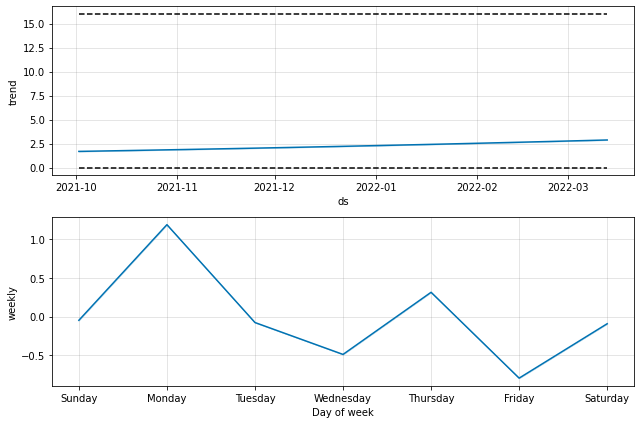

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -4.69747
Iteration  1. Log joint probability =    30.4917. Improved by 35.1892.
Iteration  2. Log joint probability =    37.8714. Improved by 7.37975.
Iteration  3. Log joint probability =    38.5902. Improved by 0.718769.
Iteration  4. Log joint probability =    41.1039. Improved by 2.51371.
Iteration  5. Log joint probability =    41.1065. Improved by 0.00257924.
Iteration  6. Log joint probability =    41.1132. Improved by 0.00666965.
Iteration  7. Log joint probability =     41.118. Improved by 0.0047773.
Iteration  8. Log joint probability =    41.1734. Improved by 0.0554397.
Iteration  9. Log joint probability =    41.2352. Improved by 0.0617753.
Iteration 10. Log joint probability =     41.409. Improved by 0.17383.
Iteration 11. Log joint probability =    41.7359. Improved by 0.326863.
Iteration 12. Log joint probability =    41.8651. Improved by 0.129211.
Iteration 13. Log joint probability =    47.0967. Improved by 5.23163.
Iteration 14. Log jo

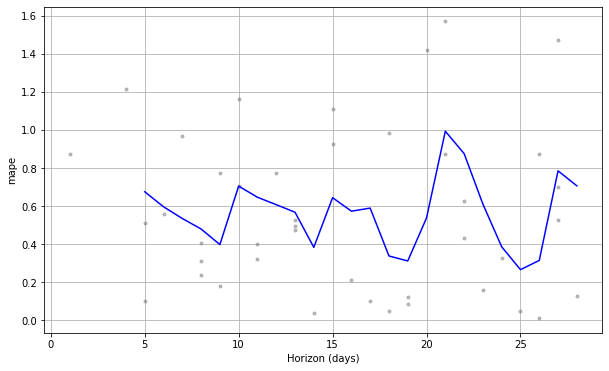

mape: 56.35%

65788
      CategoryCode  ItemCode     DateID  DailySales
11107   category_2     65788   1/1/2022           2
12499   category_2     65788  1/10/2022           3
7577    category_2     65788  1/13/2022           1
10004   category_2     65788  1/14/2022           3
10968   category_2     65788  1/15/2022           1
...            ...       ...        ...         ...
3960    category_2     65788   2/3/2022           3
12158   category_2     65788   2/4/2022           2
11894   category_2     65788   2/5/2022           1
10459   category_2     65788   2/6/2022           2
16238   category_2     65788   2/7/2022           2

[109 rows x 4 columns]

Initial log joint probability = -3.77878
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       152.512   8.63084e-09       87.1688      0.5605      0.5605      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE I

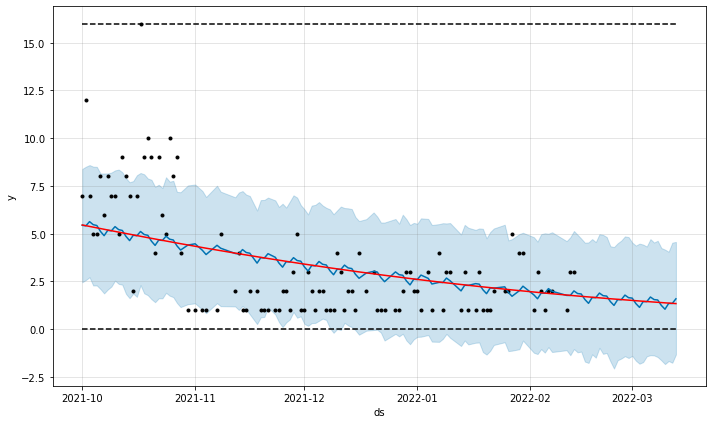

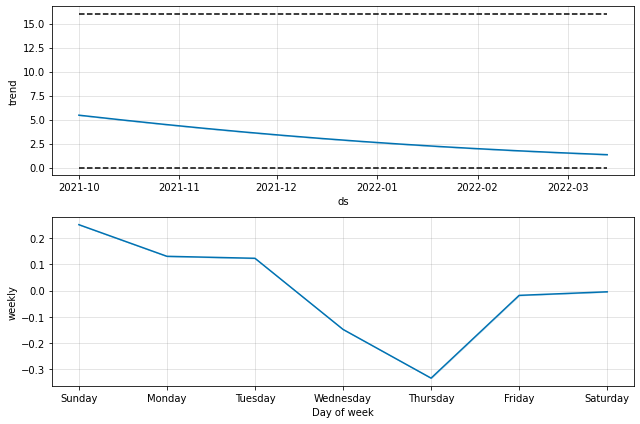

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -32.4332
Iteration  1. Log joint probability =    37.2259. Improved by 69.659.
Iteration  2. Log joint probability =    55.5989. Improved by 18.373.
Iteration  3. Log joint probability =    66.8256. Improved by 11.2267.
Iteration  4. Log joint probability =    66.8382. Improved by 0.0126105.
Iteration  5. Log joint probability =    66.8707. Improved by 0.0325232.
Iteration  6. Log joint probability =    67.0196. Improved by 0.148944.
Iteration  7. Log joint probability =    67.7958. Improved by 0.776116.
Iteration  8. Log joint probability =    76.3973. Improved by 8.60153.
Iteration  9. Log joint probability =    77.2755. Improved by 0.878204.
Iteration 10. Log joint probability =    77.4454. Improved by 0.169892.
Iteration 11. Log joint probability =    77.4683. Improved by 0.0229036.
Iteration 12. Log joint probability =    77.4835. Improved by 0.0151728.
Iteration 13. Log joint probability =    80.3689. Improved by 2.8854.
Iteration 14. Log joint pr

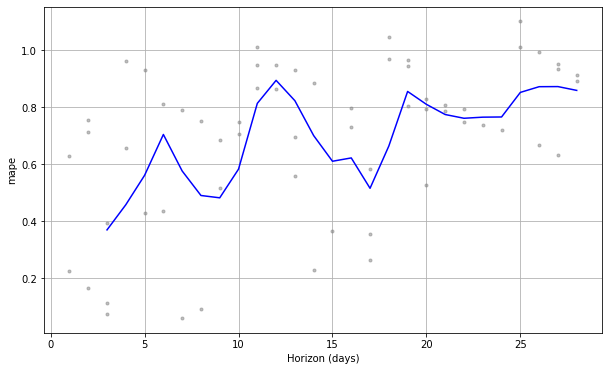

mape: 69.44%

86992
      CategoryCode  ItemCode     DateID  DailySales
11476   category_1     86992   1/1/2022           7
12576   category_1     86992  1/10/2022           9
6272    category_1     86992  1/11/2022          13
14869   category_1     86992  1/12/2022           2
6279    category_1     86992  1/13/2022           5
...            ...       ...        ...         ...
10008   category_1     86992   2/5/2022           5
11400   category_1     86992   2/6/2022           6
15501   category_1     86992   2/7/2022          11
258     category_1     86992   2/8/2022          27
1376    category_1     86992   2/9/2022          12

[135 rows x 4 columns]

Initial log joint probability = -3.78194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56       183.744   9.30291e-09       99.3355      0.3205      0.3205       78   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE I

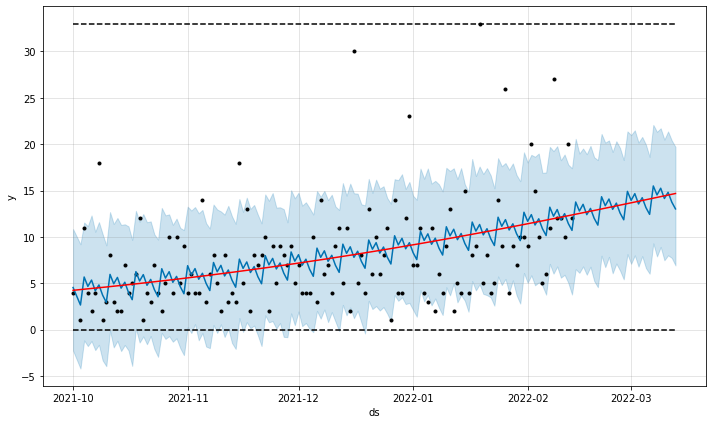

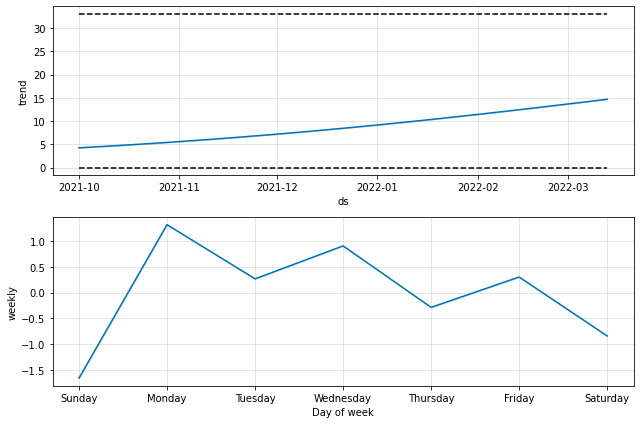

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -69.9007
Iteration  1. Log joint probability =    0.91801. Improved by 70.8188.
Iteration  2. Log joint probability =    100.986. Improved by 100.068.
Iteration  3. Log joint probability =    103.051. Improved by 2.0653.
Iteration  4. Log joint probability =    106.205. Improved by 3.15402.
Iteration  5. Log joint probability =    106.219. Improved by 0.0139203.
Iteration  6. Log joint probability =    106.232. Improved by 0.0130609.
Iteration  7. Log joint probability =     106.26. Improved by 0.0276481.
Iteration  8. Log joint probability =      106.3. Improved by 0.0403168.
Iteration  9. Log joint probability =    106.321. Improved by 0.0201334.
Iteration 10. Log joint probability =    106.325. Improved by 0.00490792.
Iteration 11. Log joint probability =    106.364. Improved by 0.0387925.
Iteration 12. Log joint probability =    106.511. Improved by 0.146888.
Iteration 13. Log joint probability =    106.548. Improved by 0.0366604.
Iteration 14. Log 

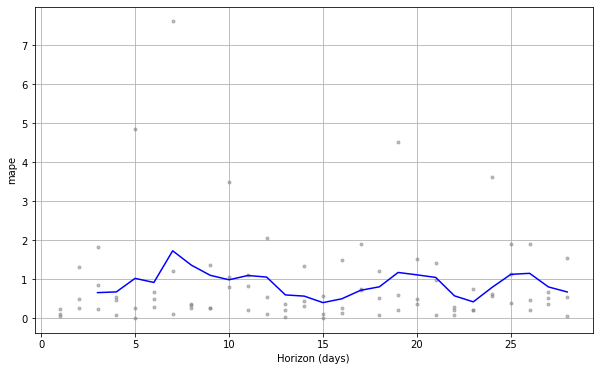

mape: 88.18%

87046
      CategoryCode  ItemCode      DateID  DailySales
10945   category_2     87046    1/1/2022           2
13336   category_2     87046   1/10/2022           1
7682    category_2     87046   1/11/2022           1
13141   category_2     87046   1/12/2022           2
6307    category_2     87046   1/13/2022           1
...            ...       ...         ...         ...
11463   category_2     87046  12/31/2021           5
10188   category_2     87046   12/5/2021           7
19476   category_2     87046   12/6/2021           4
16282   category_2     87046   12/8/2021           3
80      category_2     87046   12/9/2021           3

[71 rows x 4 columns]


Initial log joint probability = -35.8731
Iteration  1. Log joint probability =    29.5486. Improved by 65.4217.
Iteration  2. Log joint probability =    45.4684. Improved by 15.9198.
Iteration  3. Log joint probability =    45.4695. Improved by 0.00103137.
Iteration  4. Log joint probability =    45.4714. Improved by 

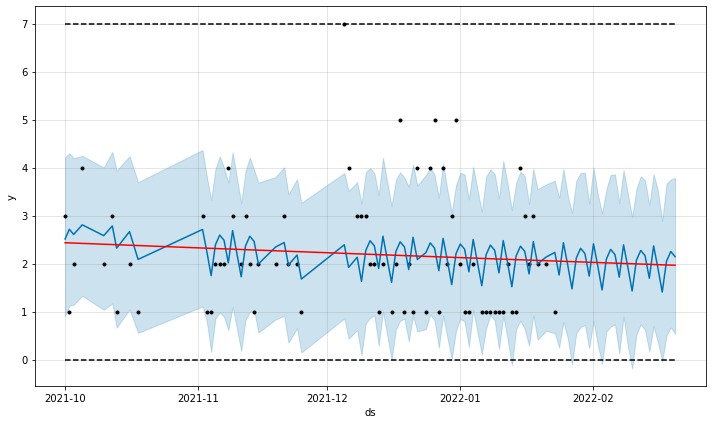

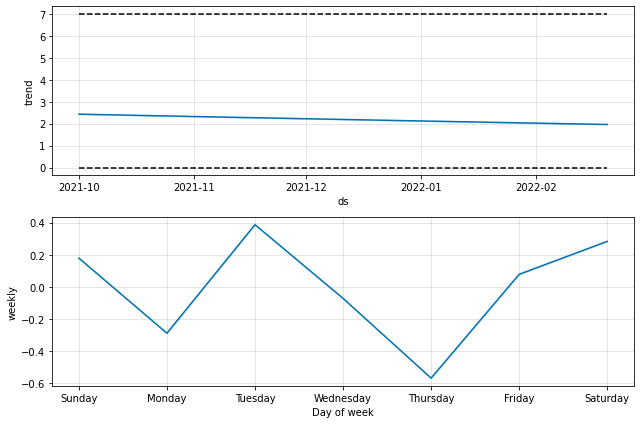

  0%|          | 0/2 [00:00<?, ?it/s]


Initial log joint probability = -0.889417
Iteration  1. Log joint probability =    22.8764. Improved by 23.7658.
Iteration  2. Log joint probability =    31.6527. Improved by 8.77625.
Iteration  3. Log joint probability =    39.2885. Improved by 7.63587.
Iteration  4. Log joint probability =    44.4804. Improved by 5.1919.
Iteration  5. Log joint probability =    45.2431. Improved by 0.762656.
Iteration  6. Log joint probability =    45.2847. Improved by 0.0415677.
Iteration  7. Log joint probability =    45.4313. Improved by 0.146671.
Iteration  8. Log joint probability =    45.4654. Improved by 0.0341221.
Iteration  9. Log joint probability =    45.5558. Improved by 0.0903181.
Iteration 10. Log joint probability =     45.573. Improved by 0.0172726.
Iteration 11. Log joint probability =    45.6024. Improved by 0.0293361.
Iteration 12. Log joint probability =    45.6239. Improved by 0.0215135.
Iteration 13. Log joint probability =     45.627. Improved by 0.00314263.
Iteration 14. Log 

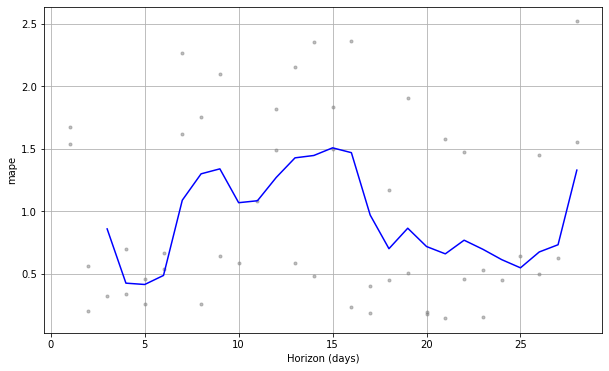

mape: 93.89%

87559
      CategoryCode  ItemCode     DateID  DailySales
12203   category_2     87559   1/1/2022           6
13634   category_2     87559  1/10/2022           7
5836    category_2     87559  1/11/2022           1
13985   category_2     87559  1/12/2022           6
6603    category_2     87559  1/13/2022           4
...            ...       ...        ...         ...
12177   category_2     87559   2/5/2022           1
10556   category_2     87559   2/6/2022           3
16314   category_2     87559   2/7/2022           2
486     category_2     87559   2/8/2022           3
1678    category_2     87559   2/9/2022           1

[127 rows x 4 columns]

Initial log joint probability = -14.8056
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      58       142.205   3.51898e-09       100.982      0.1616      0.1616       77   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE I

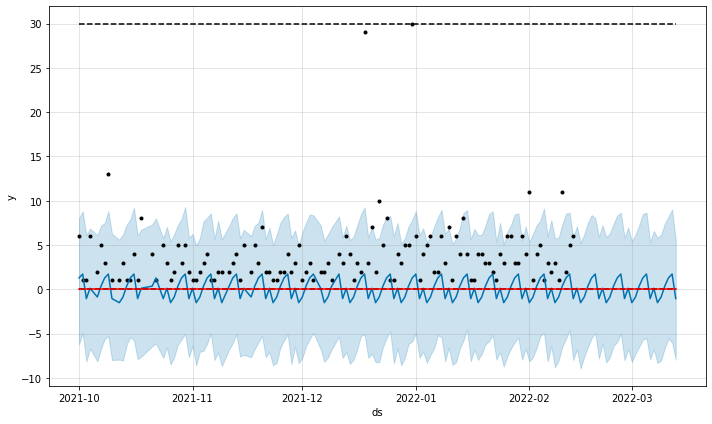

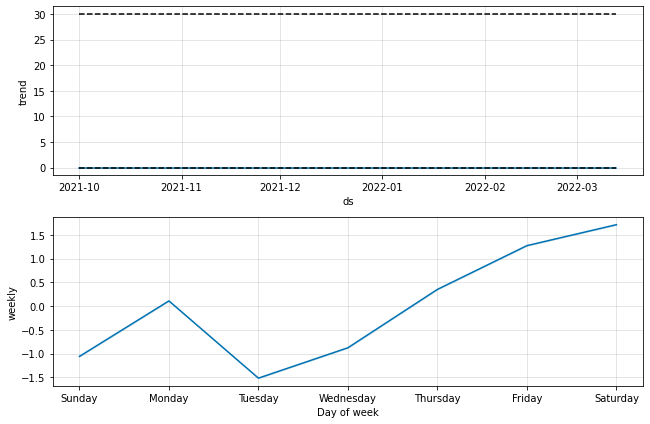

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -35.0408
Iteration  1. Log joint probability =    66.7905. Improved by 101.831.
Iteration  2. Log joint probability =    89.6815. Improved by 22.891.
Iteration  3. Log joint probability =    108.656. Improved by 18.9741.
Iteration  4. Log joint probability =    108.657. Improved by 0.00192489.
Iteration  5. Log joint probability =     108.66. Improved by 0.00269574.
Iteration  6. Log joint probability =    108.663. Improved by 0.00257538.
Iteration  7. Log joint probability =    108.678. Improved by 0.0148672.
Iteration  8. Log joint probability =    108.702. Improved by 0.0247415.
Iteration  9. Log joint probability =    108.745. Improved by 0.0424617.
Iteration 10. Log joint probability =    108.851. Improved by 0.106523.
Iteration 11. Log joint probability =    111.655. Improved by 2.80318.
Iteration 12. Log joint probability =    111.668. Improved by 0.0131586.
Iteration 13. Log joint probability =    111.671. Improved by 0.00329984.
Iteration 14. L

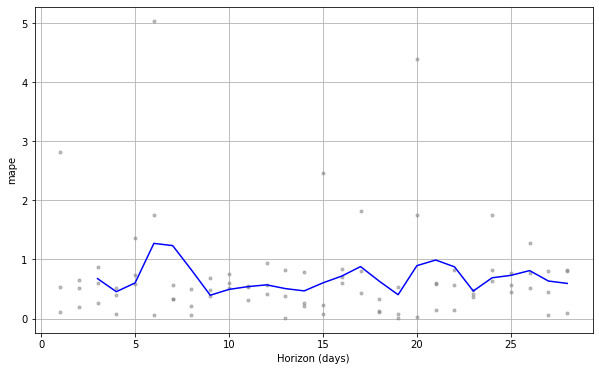

mape: 69.03%

88450
      CategoryCode  ItemCode     DateID  DailySales
11179   category_3     88450   1/1/2022           6
13188   category_3     88450  1/10/2022          14
6278    category_3     88450  1/11/2022          13
12780   category_3     88450  1/12/2022          22
5334    category_3     88450  1/13/2022          10
...            ...       ...        ...         ...
10591   category_3     88450   2/5/2022           9
10673   category_3     88450   2/6/2022           2
15022   category_3     88450   2/7/2022          13
1211    category_3     88450   2/8/2022          10
275     category_3     88450   2/9/2022          52

[131 rows x 4 columns]

Initial log joint probability = -4.63906
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       174.297    2.0945e-06        95.505           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       174.

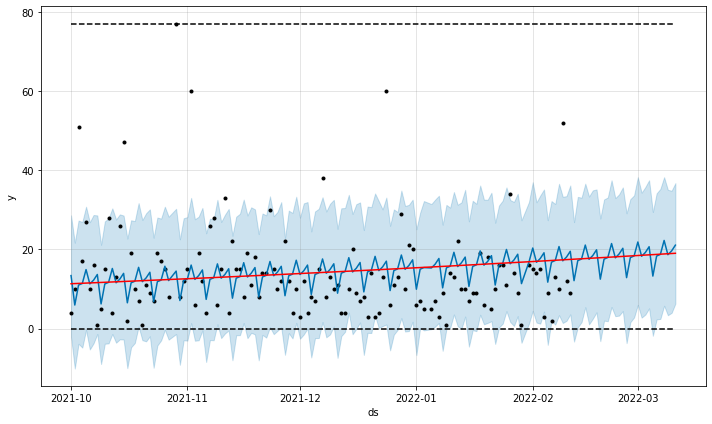

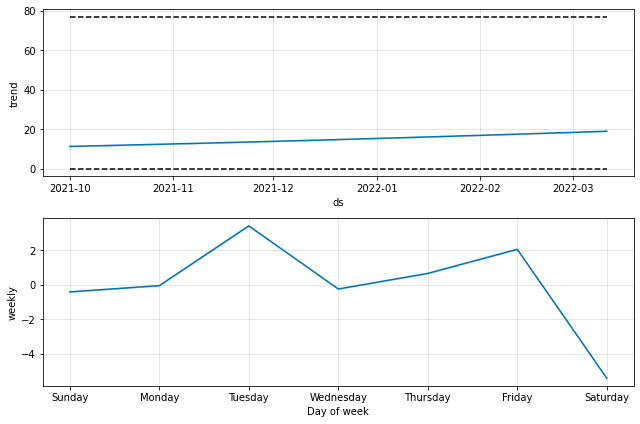

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -42.0261
Iteration  1. Log joint probability =    28.6744. Improved by 70.7005.
Iteration  2. Log joint probability =    59.4015. Improved by 30.7271.
Iteration  3. Log joint probability =    63.6536. Improved by 4.25209.
Iteration  4. Log joint probability =    63.7146. Improved by 0.0610038.
Iteration  5. Log joint probability =    63.7573. Improved by 0.0427033.
Iteration  6. Log joint probability =    63.7696. Improved by 0.0123081.
Iteration  7. Log joint probability =    63.7889. Improved by 0.0193511.
Iteration  8. Log joint probability =     63.801. Improved by 0.0120716.
Iteration  9. Log joint probability =    63.8048. Improved by 0.00381963.
Iteration 10. Log joint probability =    63.9348. Improved by 0.129958.
Iteration 11. Log joint probability =    63.9457. Improved by 0.0108985.
Iteration 12. Log joint probability =    64.0809. Improved by 0.135224.
Iteration 13. Log joint probability =    64.0978. Improved by 0.016894.
Iteration 14. Log

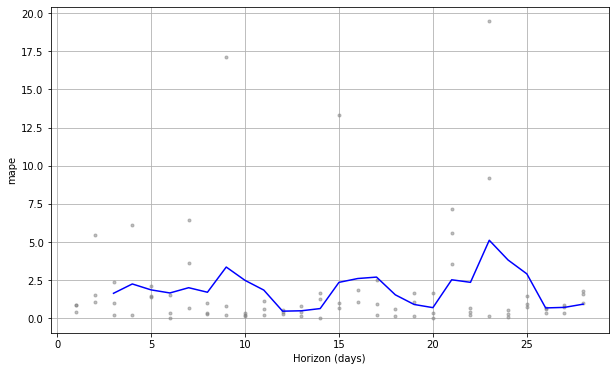

mape: 193.94%

111382
      CategoryCode  ItemCode     DateID  DailySales
12352   category_2    111382   1/1/2022           2
7326    category_2    111382  1/11/2022           2
13944   category_2    111382  1/12/2022           1
5556    category_2    111382  1/13/2022           5
12342   category_2    111382  1/14/2022           1
...            ...       ...        ...         ...
11057   category_2    111382   2/4/2022           1
12344   category_2    111382   2/6/2022           2
18817   category_2    111382   2/7/2022           2
1764    category_2    111382   2/8/2022           1
1264    category_2    111382   2/9/2022           1

[107 rows x 4 columns]

Initial log joint probability = -5.45806
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       101.684    0.00579626       78.9648      0.6416      0.6416      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10

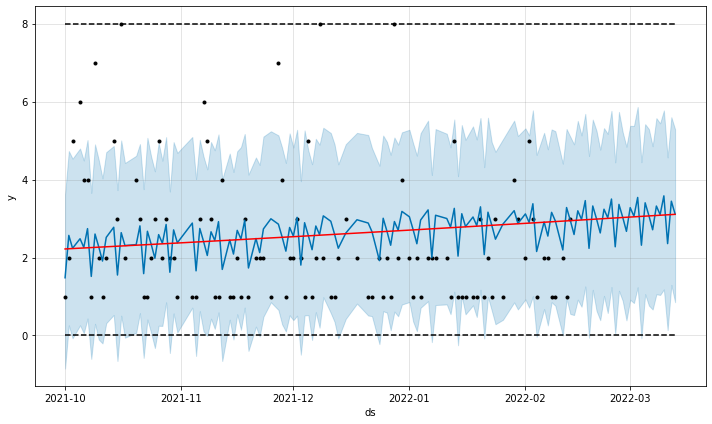

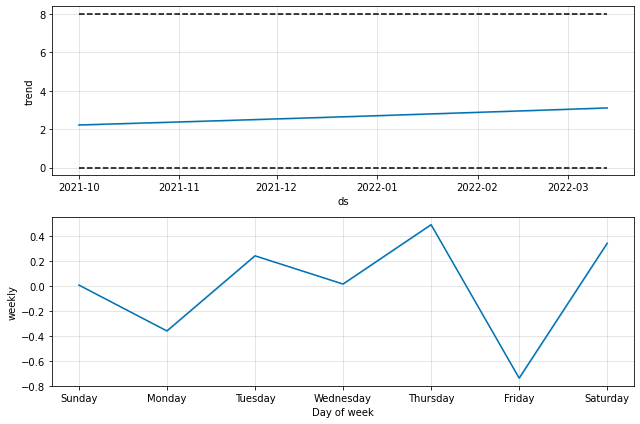

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -30.5833
Iteration  1. Log joint probability =    33.6049. Improved by 64.1882.
Iteration  2. Log joint probability =    50.9868. Improved by 17.3818.
Iteration  3. Log joint probability =    65.5423. Improved by 14.5555.
Iteration  4. Log joint probability =     65.981. Improved by 0.438738.
Iteration  5. Log joint probability =    66.0462. Improved by 0.065156.
Iteration  6. Log joint probability =    66.0719. Improved by 0.0257686.
Iteration  7. Log joint probability =    66.0873. Improved by 0.015337.
Iteration  8. Log joint probability =    66.1043. Improved by 0.0169941.
Iteration  9. Log joint probability =    66.1117. Improved by 0.00741489.
Iteration 10. Log joint probability =    66.1196. Improved by 0.00795465.
Iteration 11. Log joint probability =    66.1236. Improved by 0.00394873.
Iteration 12. Log joint probability =    66.1278. Improved by 0.00417689.
Iteration 13. Log joint probability =     66.129. Improved by 0.00121383.
Iteration 14.

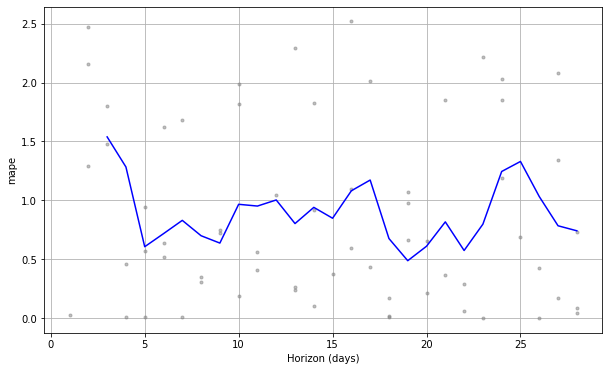

mape: 89.09%

111436
      CategoryCode  ItemCode     DateID  DailySales
12280   category_2    111436   1/1/2022           4
12551   category_2    111436  1/10/2022           4
6384    category_2    111436  1/11/2022           2
7262    category_2    111436  1/13/2022           2
11491   category_2    111436  1/15/2022           3
...            ...       ...        ...         ...
7388    category_2    111436  2/11/2022           1
14444   category_2    111436   2/2/2022           1
3755    category_2    111436   2/3/2022           5
16392   category_2    111436   2/7/2022           2
1578    category_2    111436   2/8/2022           1

[81 rows x 4 columns]


Initial log joint probability = -80.2186
Iteration  1. Log joint probability =    57.0009. Improved by 137.22.
Iteration  2. Log joint probability =    81.4391. Improved by 24.4382.
Iteration  3. Log joint probability =    95.3674. Improved by 13.9282.
Iteration  4. Log joint probability =    96.5881. Improved by 1.22072.
Iterat

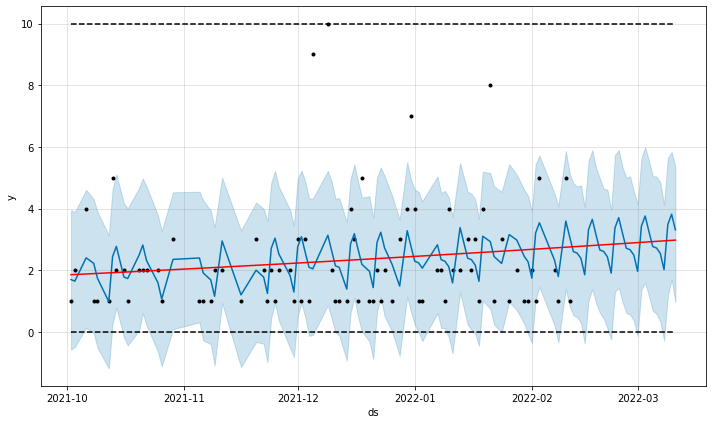

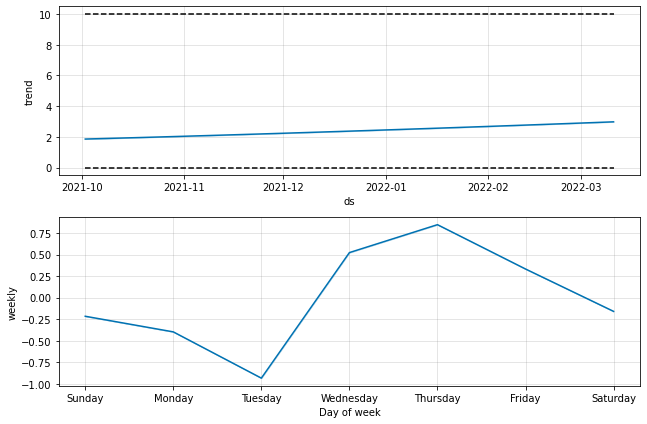

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -44.3115
Iteration  1. Log joint probability =    14.4878. Improved by 58.7994.
Iteration  2. Log joint probability =    45.8969. Improved by 31.4091.
Iteration  3. Log joint probability =    52.2024. Improved by 6.30543.
Iteration  4. Log joint probability =    53.2511. Improved by 1.04874.
Iteration  5. Log joint probability =    53.8534. Improved by 0.602266.
Iteration  6. Log joint probability =    53.9947. Improved by 0.141303.
Iteration  7. Log joint probability =     54.166. Improved by 0.171368.
Iteration  8. Log joint probability =    54.3659. Improved by 0.199887.
Iteration  9. Log joint probability =    54.4274. Improved by 0.0614971.
Iteration 10. Log joint probability =    54.5916. Improved by 0.164152.
Iteration 11. Log joint probability =     55.345. Improved by 0.753401.
Iteration 12. Log joint probability =    55.3652. Improved by 0.0202653.
Iteration 13. Log joint probability =    55.4665. Improved by 0.101302.
Iteration 14. Log joint 

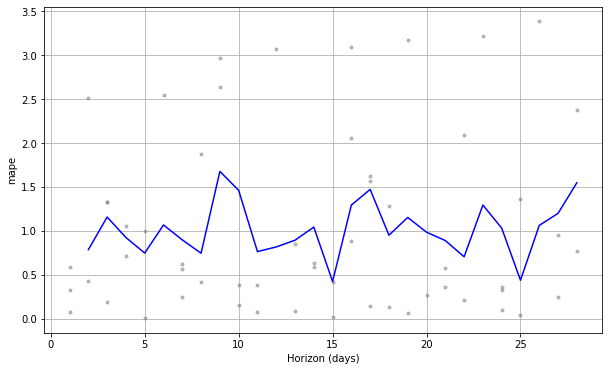

mape: 101.49%

117610
      CategoryCode  ItemCode     DateID  DailySales
12337   category_2    117610   1/1/2022           1
5804    category_2    117610  1/11/2022           2
14425   category_2    117610  1/12/2022           1
6565    category_2    117610  1/13/2022           2
12050   category_2    117610  1/16/2022           6
...            ...       ...        ...         ...
13110   category_2    117610  2/12/2022           1
13694   category_2    117610   2/2/2022           2
4921    category_2    117610   2/3/2022           2
12088   category_2    117610   2/6/2022           2
701     category_2    117610   2/8/2022           3

[100 rows x 4 columns]

Initial log joint probability = -81.9882
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       67.3672   4.75289e-06       98.6203   4.561e-08       0.001      152  LS failed, Hessian reset 
      95       67.3675   7.18054e-09       95.1911      0.1889      0.1889      172  

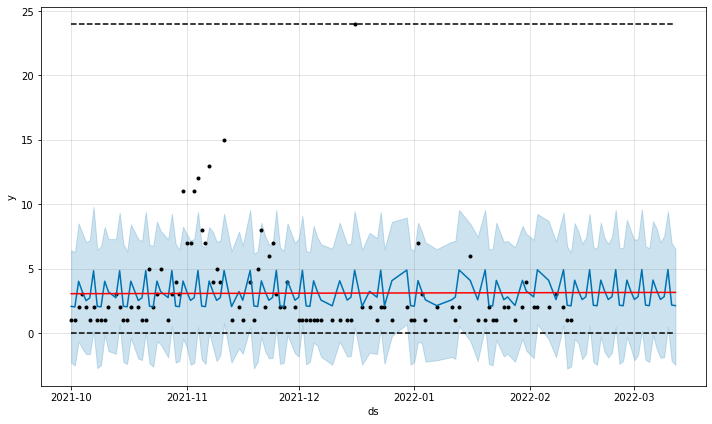

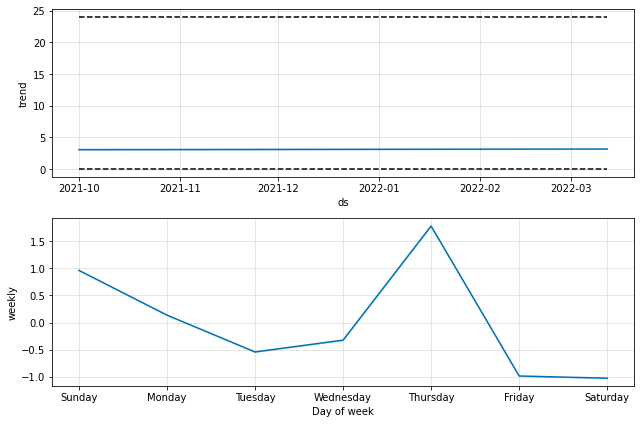

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -32.2493
Iteration  1. Log joint probability =    10.4841. Improved by 42.7334.
Iteration  2. Log joint probability =    22.6702. Improved by 12.1861.
Iteration  3. Log joint probability =    24.3744. Improved by 1.70417.
Iteration  4. Log joint probability =    24.3767. Improved by 0.00226543.
Iteration  5. Log joint probability =    24.3908. Improved by 0.0141719.
Iteration  6. Log joint probability =    24.4114. Improved by 0.0205215.
Iteration  7. Log joint probability =    24.4216. Improved by 0.0102009.
Iteration  8. Log joint probability =    24.4738. Improved by 0.0522688.
Iteration  9. Log joint probability =    24.5261. Improved by 0.052282.
Iteration 10. Log joint probability =    24.7014. Improved by 0.175267.
Iteration 11. Log joint probability =    24.7668. Improved by 0.0654722.
Iteration 12. Log joint probability =    24.8105. Improved by 0.0436838.
Iteration 13. Log joint probability =    61.7242. Improved by 36.9137.
Iteration 14. Log 

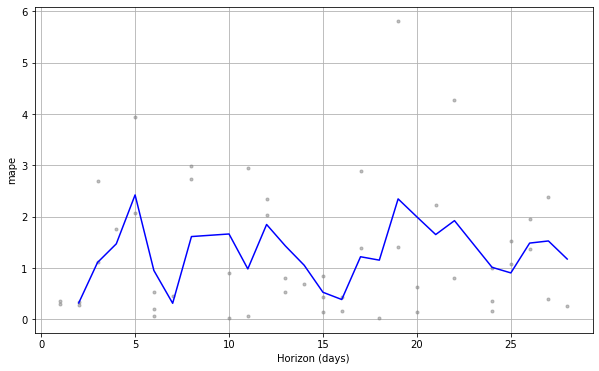

mape: 129.93%

119554
      CategoryCode  ItemCode     DateID  DailySales
11583   category_1    119554   1/1/2022           8
12586   category_1    119554  1/10/2022          32
6161    category_1    119554  1/11/2022           9
13981   category_1    119554  1/12/2022          34
5891    category_1    119554  1/13/2022          37
...            ...       ...        ...         ...
11318   category_1    119554   2/5/2022          21
11604   category_1    119554   2/6/2022          23
15342   category_1    119554   2/7/2022          18
698     category_1    119554   2/8/2022          13
1469    category_1    119554   2/9/2022          49

[136 rows x 4 columns]

Initial log joint probability = -3.8565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       234.502   2.59179e-05        103.63   2.657e-07       0.001      116  LS failed, Hessian reset 
      99       234.504   1.94378e-07       95.4925      0.4185      0.4185      161   

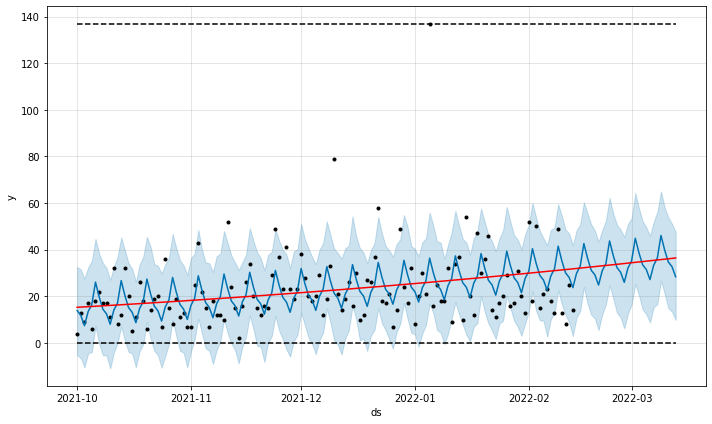

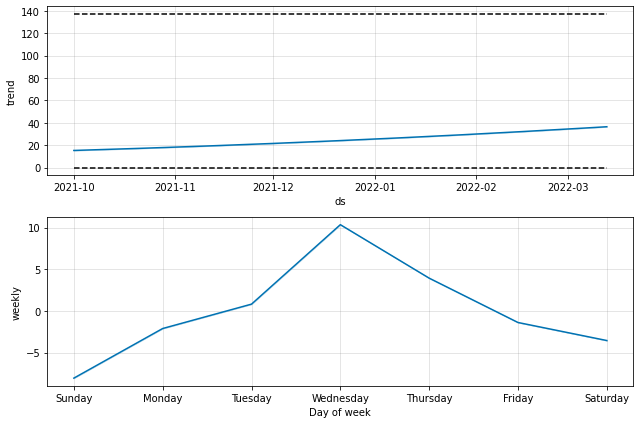

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -43.9995
Iteration  1. Log joint probability =    53.7684. Improved by 97.7679.
Iteration  2. Log joint probability =    107.298. Improved by 53.5292.
Iteration  3. Log joint probability =    116.157. Improved by 8.85978.
Iteration  4. Log joint probability =    116.416. Improved by 0.258666.
Iteration  5. Log joint probability =    117.402. Improved by 0.985729.
Iteration  6. Log joint probability =    117.447. Improved by 0.0451284.
Iteration  7. Log joint probability =    117.467. Improved by 0.0202713.
Iteration  8. Log joint probability =    117.487. Improved by 0.0194089.
Iteration  9. Log joint probability =     117.59. Improved by 0.103457.
Iteration 10. Log joint probability =    117.795. Improved by 0.204887.
Iteration 11. Log joint probability =    117.803. Improved by 0.00788549.
Iteration 12. Log joint probability =    117.928. Improved by 0.125379.
Iteration 13. Log joint probability =    118.694. Improved by 0.766283.
Iteration 14. Log jo

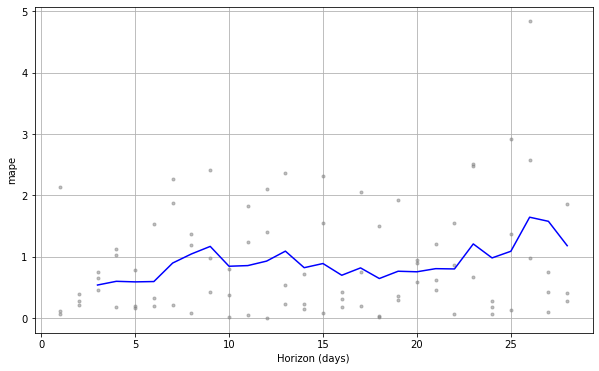

mape: 91.75%

123307
      CategoryCode  ItemCode     DateID  DailySales
11133   category_4    123307   1/1/2022          48
12381   category_4    123307  1/10/2022          64
6760    category_4    123307  1/11/2022          89
13382   category_4    123307  1/12/2022          85
5623    category_4    123307  1/13/2022          81
...            ...       ...        ...         ...
10955   category_4    123307   2/4/2022          82
10080   category_4    123307   2/5/2022         123
11424   category_4    123307   2/6/2022          20
15023   category_4    123307   2/7/2022          36
87      category_4    123307   2/9/2022           2

[132 rows x 4 columns]

Initial log joint probability = -7.31795
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       173.584   0.000305887        92.562           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       173

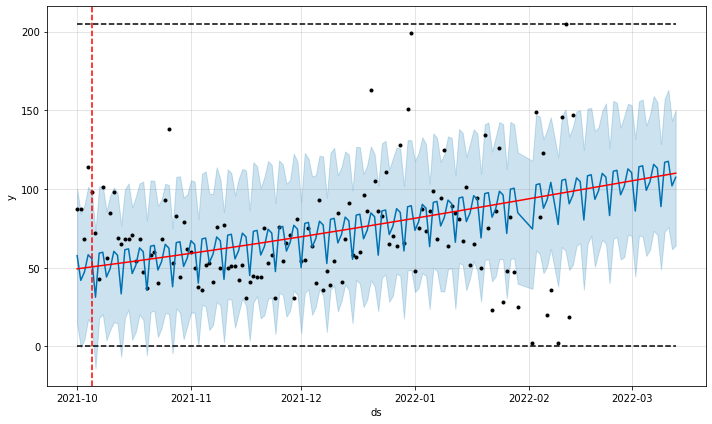

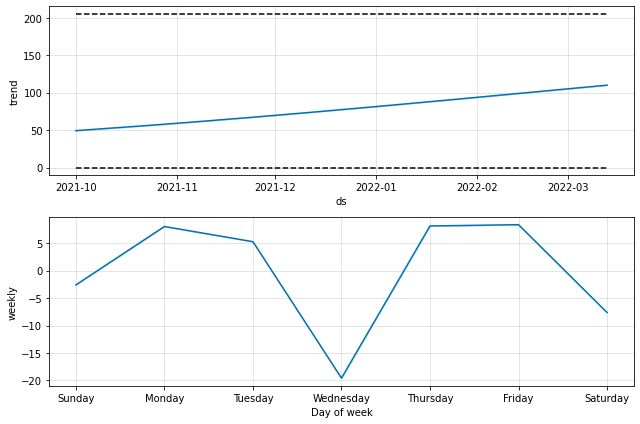

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -49.2914
Iteration  1. Log joint probability =    48.0224. Improved by 97.3138.
Iteration  2. Log joint probability =    71.3433. Improved by 23.3208.
Iteration  3. Log joint probability =    86.1891. Improved by 14.8459.
Iteration  4. Log joint probability =    96.0033. Improved by 9.81416.
Iteration  5. Log joint probability =    98.9573. Improved by 2.95395.
Iteration  6. Log joint probability =    110.702. Improved by 11.7452.
Iteration  7. Log joint probability =    113.475. Improved by 2.77299.
Iteration  8. Log joint probability =    113.481. Improved by 0.00569935.
Iteration  9. Log joint probability =    114.483. Improved by 1.00179.
Iteration 10. Log joint probability =     114.59. Improved by 0.107421.
Iteration 11. Log joint probability =    114.737. Improved by 0.146629.
Iteration 12. Log joint probability =    114.804. Improved by 0.0667294.
Iteration 13. Log joint probability =    115.022. Improved by 0.217878.
Iteration 14. Log joint pro

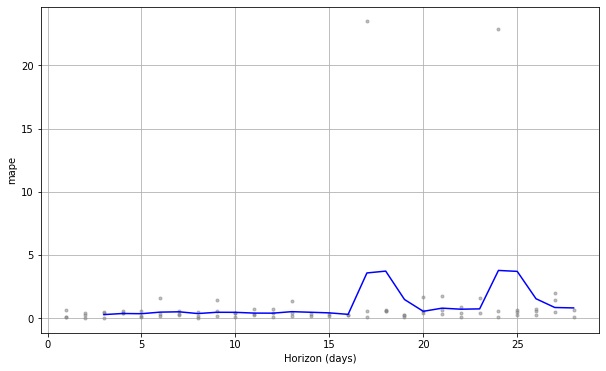

mape: 106.30%

130993
      CategoryCode  ItemCode     DateID  DailySales
12245   category_2    130993   1/1/2022           3
13741   category_2    130993  1/10/2022           3
5841    category_2    130993  1/11/2022           1
6121    category_2    130993  1/13/2022           3
11073   category_2    130993  1/14/2022          14
...            ...       ...        ...         ...
10068   category_2    130993  2/13/2022          13
13922   category_2    130993   2/2/2022           1
12238   category_2    130993   2/5/2022           1
18990   category_2    130993   2/7/2022           1
83      category_2    130993   2/8/2022           7

[96 rows x 4 columns]


Initial log joint probability = -60.8748
Iteration  1. Log joint probability =    32.0977. Improved by 92.9726.
Iteration  2. Log joint probability =    65.2422. Improved by 33.1444.
Iteration  3. Log joint probability =    65.4166. Improved by 0.174444.
Iteration  4. Log joint probability =    65.4427. Improved by 0.0260558.
I

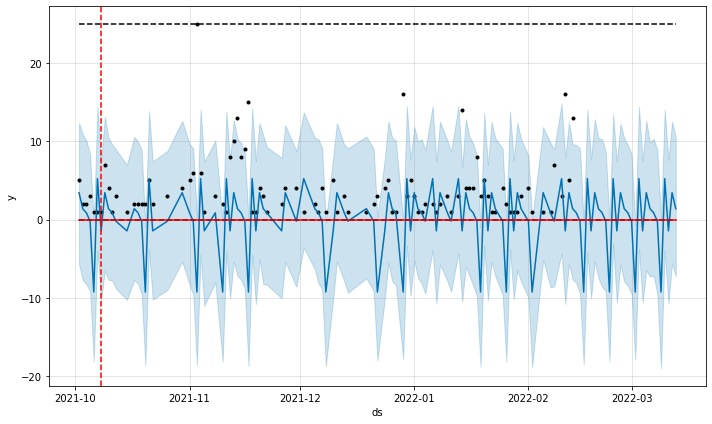

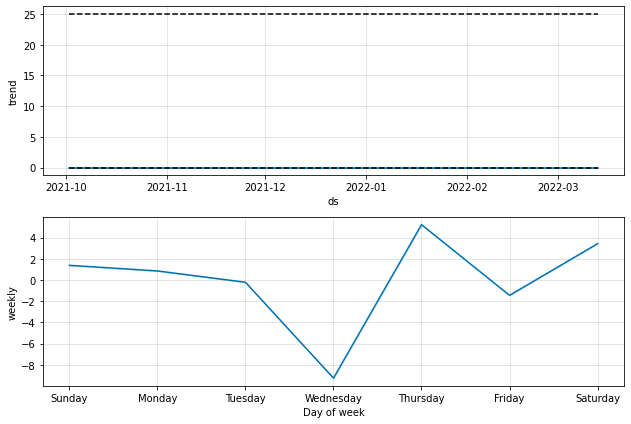

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -17.8218
Iteration  1. Log joint probability =     10.483. Improved by 28.3048.
Iteration  2. Log joint probability =    28.6797. Improved by 18.1968.
Iteration  3. Log joint probability =    38.1522. Improved by 9.47243.
Iteration  4. Log joint probability =    38.1756. Improved by 0.0234847.
Iteration  5. Log joint probability =    38.2151. Improved by 0.0394545.
Iteration  6. Log joint probability =    38.2693. Improved by 0.0541914.
Iteration  7. Log joint probability =    38.2964. Improved by 0.0271015.
Iteration  8. Log joint probability =    38.3099. Improved by 0.0135025.
Iteration  9. Log joint probability =    38.4235. Improved by 0.113636.
Iteration 10. Log joint probability =    38.4518. Improved by 0.0282577.
Iteration 11. Log joint probability =    38.5164. Improved by 0.0645988.
Iteration 12. Log joint probability =    38.6008. Improved by 0.0844581.
Iteration 13. Log joint probability =    38.6672. Improved by 0.0663192.
Iteration 14. Lo

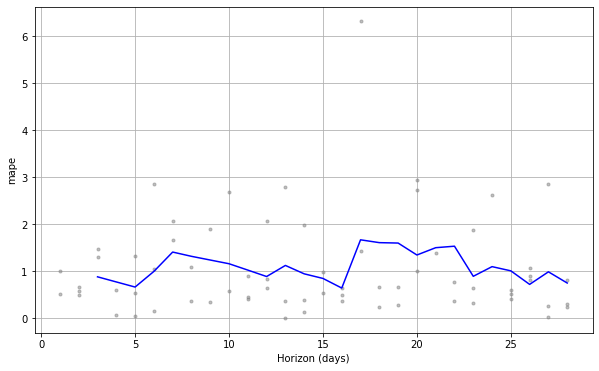

mape: 110.03%

132334
      CategoryCode  ItemCode     DateID  DailySales
11148   category_3    132334   1/1/2022          12
7687    category_3    132334  1/11/2022           1
13597   category_3    132334  1/12/2022           1
5821    category_3    132334  1/13/2022           1
11340   category_3    132334  1/14/2022           8
...            ...       ...        ...         ...
3987    category_3    132334   2/3/2022           4
12354   category_3    132334   2/4/2022           1
10777   category_3    132334   2/5/2022           1
10165   category_3    132334   2/6/2022           6
15306   category_3    132334   2/7/2022           2

[114 rows x 4 columns]

Initial log joint probability = -3.87905
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38        148.61   0.000147364       91.2464   1.504e-06       0.001       88  LS failed, Hessian reset 
      99       148.634   1.79928e-07       104.044      0.5129      0.5129      165  

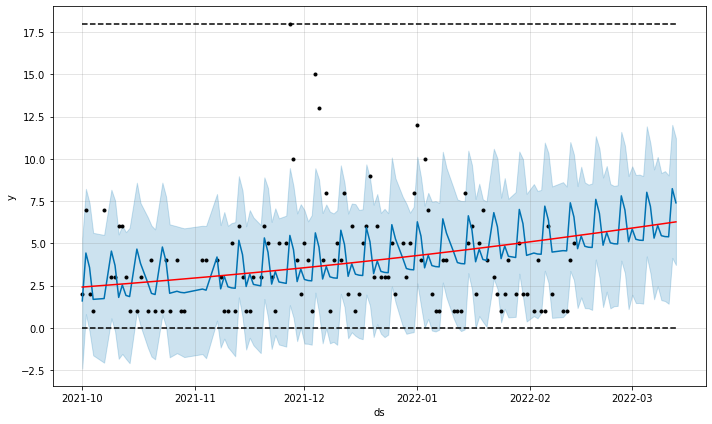

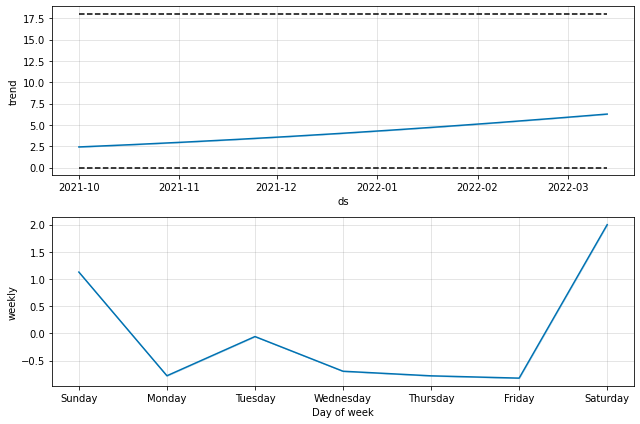

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -30.1738
Iteration  1. Log joint probability =    11.2248. Improved by 41.3986.
Iteration  2. Log joint probability =    58.4486. Improved by 47.2238.
Iteration  3. Log joint probability =    81.2739. Improved by 22.8253.
Iteration  4. Log joint probability =    84.8283. Improved by 3.55439.
Iteration  5. Log joint probability =    85.5272. Improved by 0.698951.
Iteration  6. Log joint probability =    86.3006. Improved by 0.773329.
Iteration  7. Log joint probability =    86.3227. Improved by 0.0220803.
Iteration  8. Log joint probability =     86.406. Improved by 0.0833117.
Iteration  9. Log joint probability =    86.4329. Improved by 0.0269319.
Iteration 10. Log joint probability =    86.5436. Improved by 0.110742.
Iteration 11. Log joint probability =    86.5779. Improved by 0.0342217.
Iteration 12. Log joint probability =    86.5924. Improved by 0.0145479.
Iteration 13. Log joint probability =    86.6577. Improved by 0.0652676.
Iteration 14. Log jo

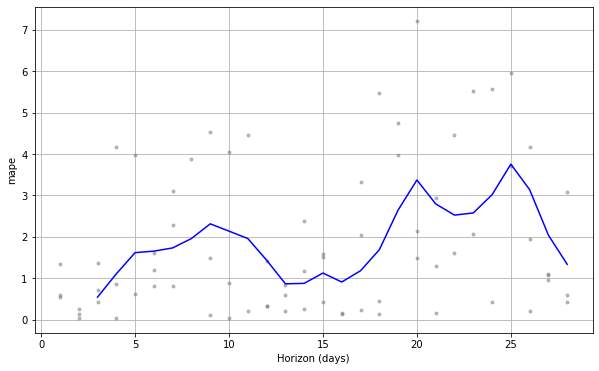

mape: 193.61%

145330
      CategoryCode  ItemCode     DateID  DailySales
11284   category_1    145330   1/1/2022           4
6862    category_1    145330  1/11/2022           4
12708   category_1    145330  1/12/2022           1
7360    category_1    145330  1/13/2022           1
12306   category_1    145330  1/14/2022           1
...            ...       ...        ...         ...
12255   category_1    145330   2/4/2022           1
11413   category_1    145330   2/5/2022           1
11130   category_1    145330   2/6/2022           1
16357   category_1    145330   2/7/2022           1
1947    category_1    145330   2/9/2022           1

[108 rows x 4 columns]

Initial log joint probability = -3.38377
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       153.399   4.12335e-05       94.8306           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15

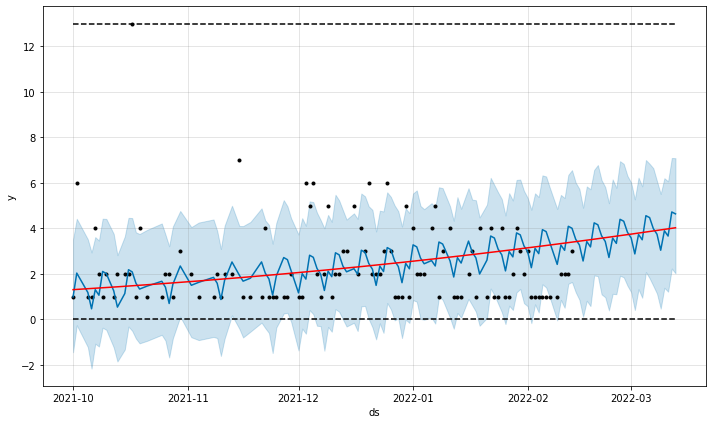

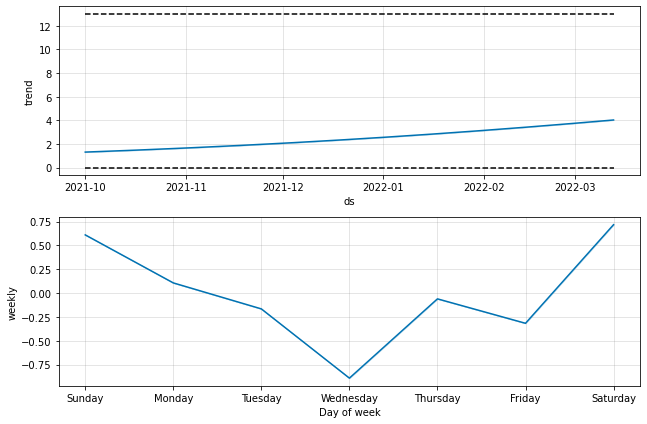

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -22.3656
Iteration  1. Log joint probability =    5.78887. Improved by 28.1545.
Iteration  2. Log joint probability =    59.0362. Improved by 53.2473.
Iteration  3. Log joint probability =    68.5515. Improved by 9.51531.
Iteration  4. Log joint probability =    71.4034. Improved by 2.85194.
Iteration  5. Log joint probability =    76.2258. Improved by 4.82236.
Iteration  6. Log joint probability =     76.974. Improved by 0.748165.
Iteration  7. Log joint probability =    76.9742. Improved by 0.000281225.
Iteration  8. Log joint probability =    76.9761. Improved by 0.00186523.
Iteration  9. Log joint probability =    77.0773. Improved by 0.101225.
Iteration 10. Log joint probability =    77.4146. Improved by 0.33724.
Iteration 11. Log joint probability =    77.4535. Improved by 0.0389183.
Iteration 12. Log joint probability =    77.5937. Improved by 0.14026.
Iteration 13. Log joint probability =    77.6625. Improved by 0.068725.
Iteration 14. Log joint

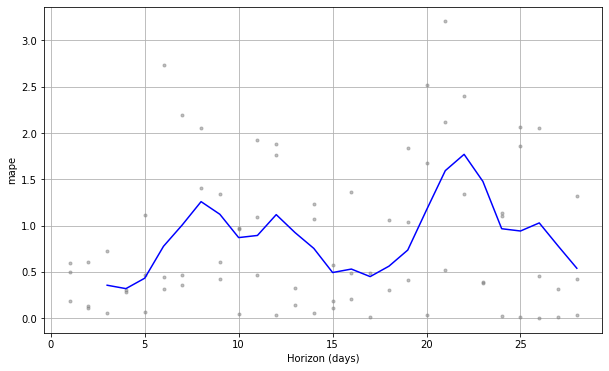

mape: 87.91%

145978
      CategoryCode  ItemCode     DateID  DailySales
10229   category_1    145978   1/1/2022           9
13790   category_1    145978  1/10/2022           4
5634    category_1    145978  1/11/2022           6
13554   category_1    145978  1/12/2022           3
5309    category_1    145978  1/13/2022           6
...            ...       ...        ...         ...
12212   category_1    145978   2/5/2022           2
10850   category_1    145978   2/6/2022           8
15086   category_1    145978   2/7/2022           4
876     category_1    145978   2/8/2022           8
1623    category_1    145978   2/9/2022           1

[134 rows x 4 columns]

Initial log joint probability = -5.60018
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       142.251   1.44305e-05       107.091           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       142

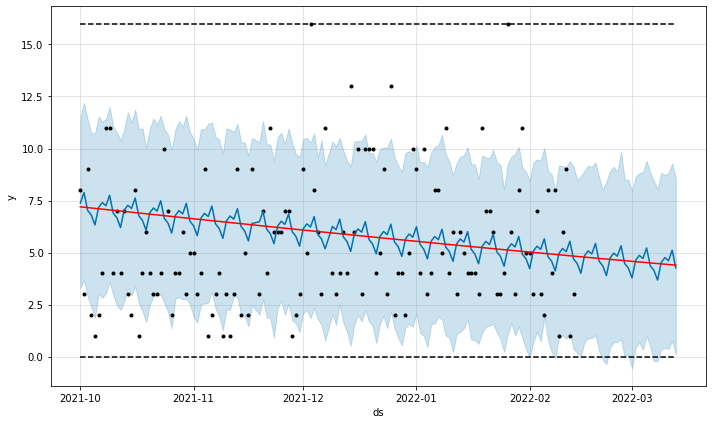

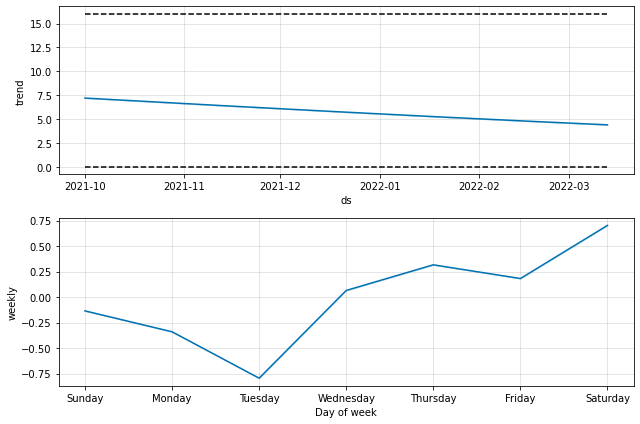

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -44.3227
Iteration  1. Log joint probability =     57.116. Improved by 101.439.
Iteration  2. Log joint probability =    61.3685. Improved by 4.25248.
Iteration  3. Log joint probability =     63.984. Improved by 2.61543.
Iteration  4. Log joint probability =    63.9932. Improved by 0.0092099.
Iteration  5. Log joint probability =    64.0077. Improved by 0.0145511.
Iteration  6. Log joint probability =    64.0181. Improved by 0.0104061.
Iteration  7. Log joint probability =    64.0385. Improved by 0.0203893.
Iteration  8. Log joint probability =    64.0605. Improved by 0.0219771.
Iteration  9. Log joint probability =    64.1134. Improved by 0.0529095.
Iteration 10. Log joint probability =    64.1434. Improved by 0.0299797.
Iteration 11. Log joint probability =    64.2257. Improved by 0.0823359.
Iteration 12. Log joint probability =    64.2542. Improved by 0.0284538.
Iteration 13. Log joint probability =    64.3382. Improved by 0.0840541.
Iteration 14. L

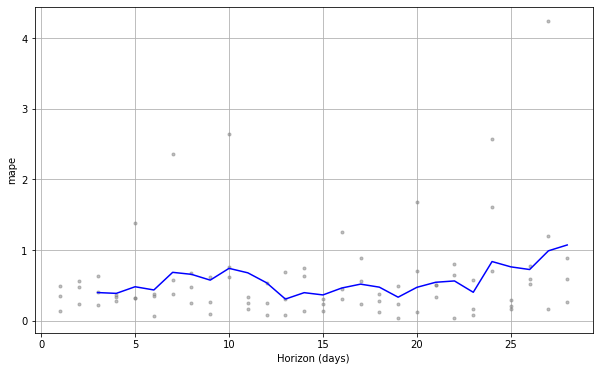

mape: 57.08%

169504
      CategoryCode  ItemCode     DateID  DailySales
10851   category_3    169504   1/1/2022          48
14082   category_3    169504  1/10/2022         157
6996    category_3    169504  1/11/2022          63
14231   category_3    169504  1/12/2022          63
5573    category_3    169504  1/13/2022          73
...            ...       ...        ...         ...
11692   category_3    169504   2/5/2022          96
11734   category_3    169504   2/6/2022          12
16452   category_3    169504   2/7/2022          69
1139    category_3    169504   2/8/2022          41
1113    category_3    169504   2/9/2022          49

[135 rows x 4 columns]

Initial log joint probability = -3.37516
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       209.868     0.0507448       102.824           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       210

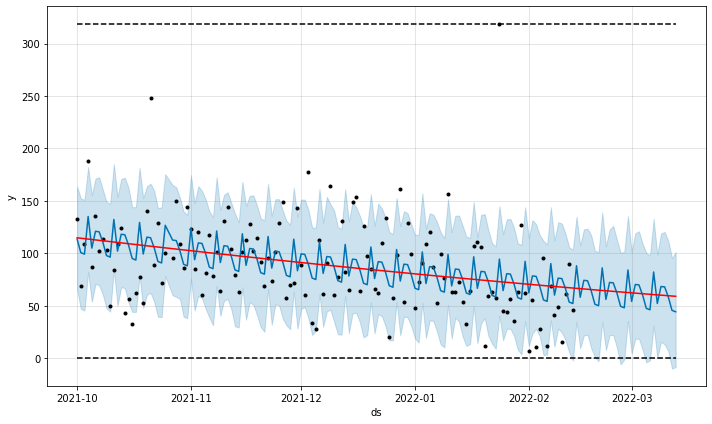

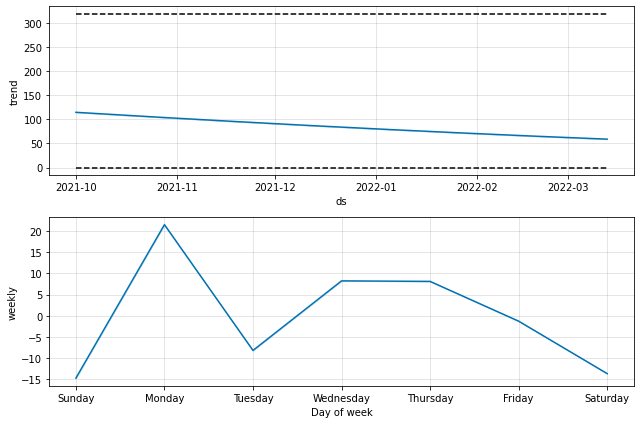

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -42.7828
Iteration  1. Log joint probability =     67.719. Improved by 110.502.
Iteration  2. Log joint probability =    84.1507. Improved by 16.4317.
Iteration  3. Log joint probability =    106.259. Improved by 22.1078.
Iteration  4. Log joint probability =    110.607. Improved by 4.34857.
Iteration  5. Log joint probability =    112.975. Improved by 2.36801.
Iteration  6. Log joint probability =    112.987. Improved by 0.0122978.
Iteration  7. Log joint probability =    113.015. Improved by 0.0277678.
Iteration  8. Log joint probability =    113.026. Improved by 0.0108957.
Iteration  9. Log joint probability =    113.037. Improved by 0.0108163.
Iteration 10. Log joint probability =    113.042. Improved by 0.00540141.
Iteration 11. Log joint probability =    113.049. Improved by 0.00690994.
Iteration 12. Log joint probability =    113.178. Improved by 0.128571.
Iteration 13. Log joint probability =    113.571. Improved by 0.393348.
Iteration 14. Log j

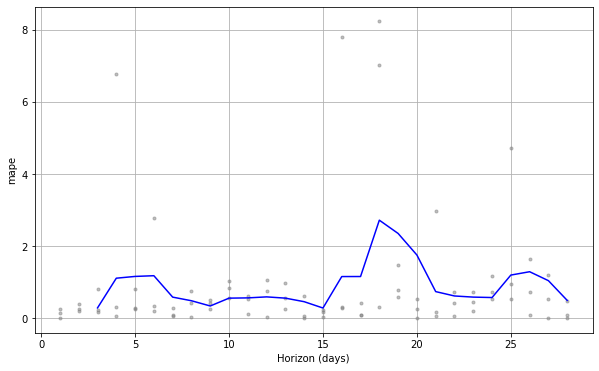

mape: 91.67%

174436
      CategoryCode  ItemCode     DateID  DailySales
10015   category_2    174436   1/1/2022           3
12472   category_2    174436  1/10/2022           4
6954    category_2    174436  1/11/2022           6
12626   category_2    174436  1/12/2022           8
5963    category_2    174436  1/13/2022          11
...            ...       ...        ...         ...
11710   category_2    174436   2/5/2022           2
11772   category_2    174436   2/6/2022           6
15146   category_2    174436   2/7/2022          11
374     category_2    174436   2/8/2022           2
568     category_2    174436   2/9/2022           4

[135 rows x 4 columns]

Initial log joint probability = -5.06787
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       144.863   3.15767e-07       96.3308      0.4201      0.9578      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       144

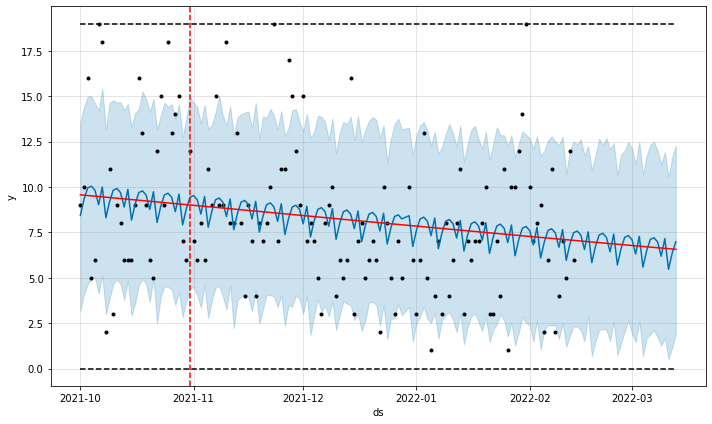

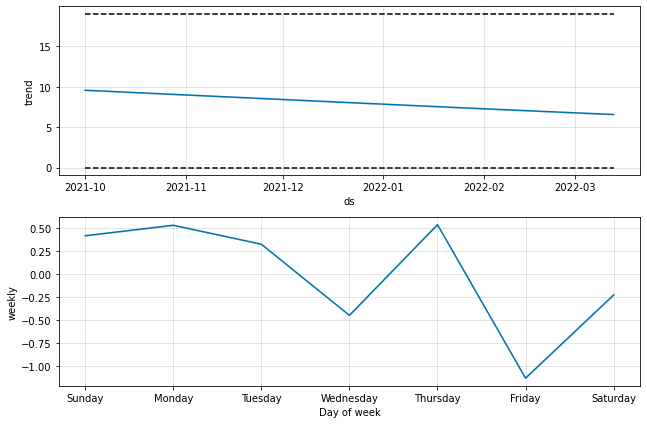

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -44.8295
Iteration  1. Log joint probability =    75.8823. Improved by 120.712.
Iteration  2. Log joint probability =    81.1068. Improved by 5.22444.
Iteration  3. Log joint probability =    83.1565. Improved by 2.04977.
Iteration  4. Log joint probability =    83.7546. Improved by 0.598041.
Iteration  5. Log joint probability =    83.8166. Improved by 0.0619767.
Iteration  6. Log joint probability =     83.838. Improved by 0.0214551.
Iteration  7. Log joint probability =    83.8434. Improved by 0.00537706.
Iteration  8. Log joint probability =     83.848. Improved by 0.00461265.
Iteration  9. Log joint probability =    83.8551. Improved by 0.00708763.
Iteration 10. Log joint probability =    83.8569. Improved by 0.00184867.
Iteration 11. Log joint probability =    83.8574. Improved by 0.000495706.
Iteration 12. Log joint probability =    83.8576. Improved by 0.000205229.
Iteration 13. Log joint probability =     83.858. Improved by 0.000347755.
Iterat

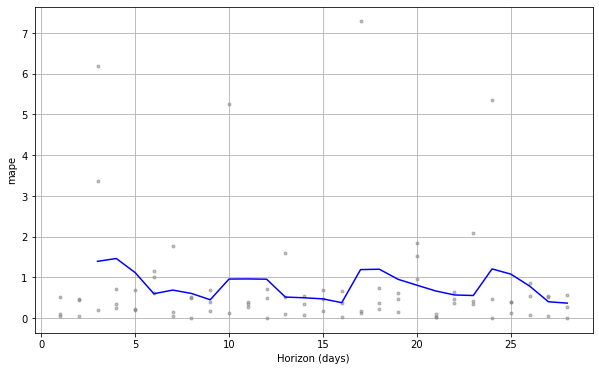

mape: 80.41%

213802
      CategoryCode  ItemCode     DateID  DailySales
13923   category_2    213802  1/10/2022           1
7771    category_2    213802  1/11/2022           2
13123   category_2    213802  1/12/2022           2
7156    category_2    213802  1/13/2022           1
12282   category_2    213802  1/14/2022           2
...            ...       ...        ...         ...
14487   category_2    213802   2/2/2022           2
4046    category_2    213802   2/3/2022           1
10995   category_2    213802   2/5/2022           2
10265   category_2    213802   2/6/2022           2
1905    category_2    213802   2/8/2022           1

[91 rows x 4 columns]


Initial log joint probability = -54.0781
Iteration  1. Log joint probability =    57.4696. Improved by 111.548.
Iteration  2. Log joint probability =     109.14. Improved by 51.6703.
Iteration  3. Log joint probability =    120.021. Improved by 10.8814.
Iteration  4. Log joint probability =    120.832. Improved by 0.810687.
Iter

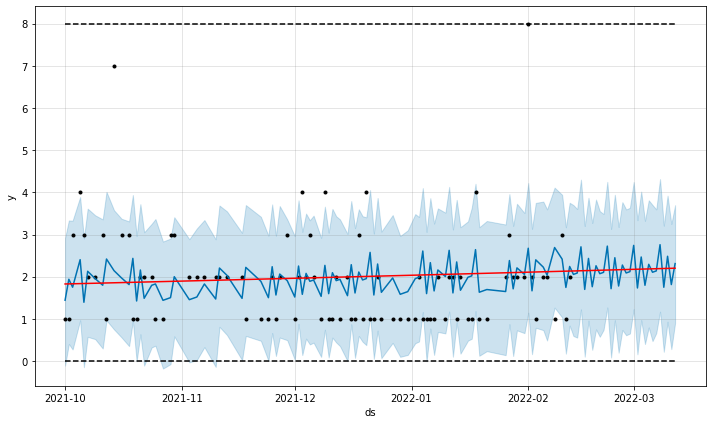

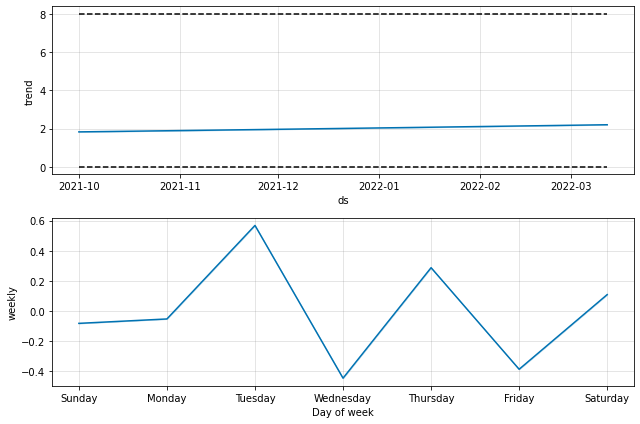

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -17.0217
Iteration  1. Log joint probability =    12.9782. Improved by 30.
Iteration  2. Log joint probability =    36.2068. Improved by 23.2285.
Iteration  3. Log joint probability =    53.7345. Improved by 17.5277.
Iteration  4. Log joint probability =    57.6638. Improved by 3.92926.
Iteration  5. Log joint probability =     64.519. Improved by 6.85528.
Iteration  6. Log joint probability =    65.6848. Improved by 1.16576.
Iteration  7. Log joint probability =    65.7102. Improved by 0.0254229.
Iteration  8. Log joint probability =    65.7247. Improved by 0.0144666.
Iteration  9. Log joint probability =    65.7467. Improved by 0.0220104.
Iteration 10. Log joint probability =    65.8379. Improved by 0.0912538.
Iteration 11. Log joint probability =    65.8493. Improved by 0.0113257.
Iteration 12. Log joint probability =    65.9652. Improved by 0.115902.
Iteration 13. Log joint probability =    66.0985. Improved by 0.133323.
Iteration 14. Log joint prob

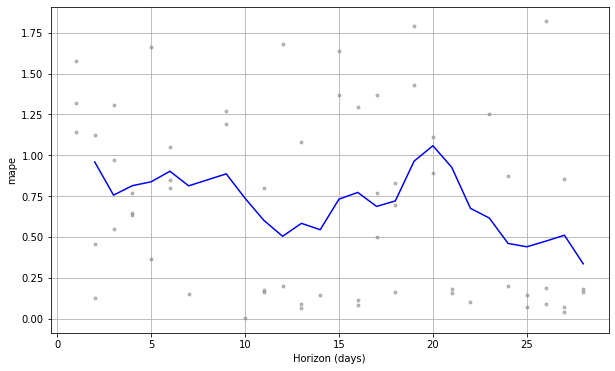

mape: 70.37%

216151
      CategoryCode  ItemCode     DateID  DailySales
10675   category_2    216151   1/1/2022           3
13317   category_2    216151  1/10/2022           5
7248    category_2    216151  1/11/2022           3
12418   category_2    216151  1/12/2022           2
5649    category_2    216151  1/13/2022           6
...            ...       ...        ...         ...
5027    category_2    216151   2/3/2022           2
10514   category_2    216151   2/5/2022           2
10182   category_2    216151   2/6/2022           3
15740   category_2    216151   2/7/2022           1
434     category_2    216151   2/9/2022           2

[121 rows x 4 columns]

Initial log joint probability = -5.75264
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       144.666   7.71898e-09       90.5251      0.3568           1      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

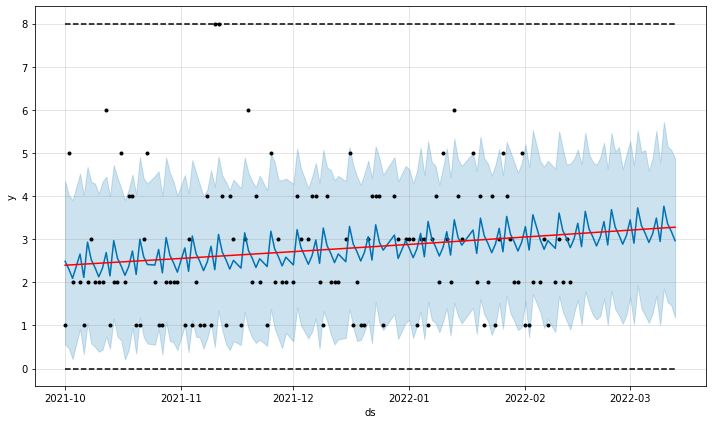

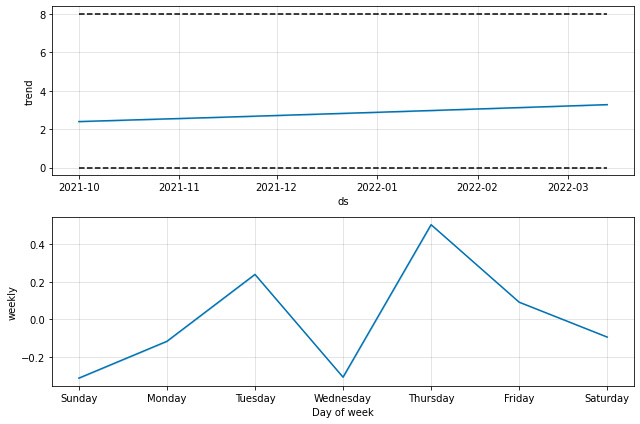

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -64.1683
Iteration  1. Log joint probability =    46.6071. Improved by 110.775.
Iteration  2. Log joint probability =    72.0975. Improved by 25.4904.
Iteration  3. Log joint probability =    76.0321. Improved by 3.93467.
Iteration  4. Log joint probability =    78.6172. Improved by 2.58511.
Iteration  5. Log joint probability =    79.7204. Improved by 1.10315.
Iteration  6. Log joint probability =    79.7224. Improved by 0.00201345.
Iteration  7. Log joint probability =    79.7234. Improved by 0.00100667.
Iteration  8. Log joint probability =    79.7273. Improved by 0.00387988.
Iteration  9. Log joint probability =     79.736. Improved by 0.00868327.
Iteration 10. Log joint probability =    79.7399. Improved by 0.00394349.
Iteration 11. Log joint probability =    79.7466. Improved by 0.00670421.
Iteration 12. Log joint probability =    79.7526. Improved by 0.00596864.
Iteration 13. Log joint probability =    79.7571. Improved by 0.00454768.
Iteration 1

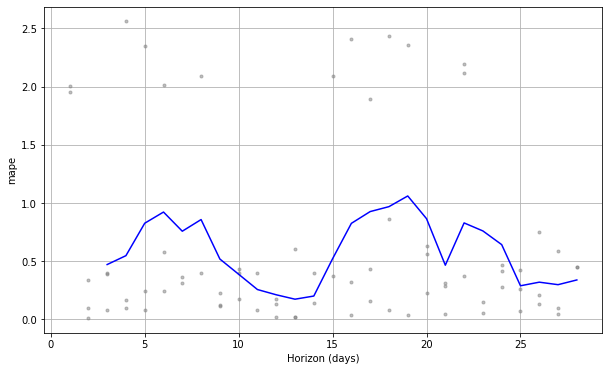

mape: 58.66%

225259
      CategoryCode  ItemCode     DateID  DailySales
11827   category_2    225259   1/1/2022           1
14933   category_2    225259  1/10/2022           1
6331    category_2    225259  1/11/2022           3
14729   category_2    225259  1/12/2022           4
7412    category_2    225259  1/13/2022           2
...            ...       ...        ...         ...
10773   category_2    225259   2/4/2022           5
12320   category_2    225259   2/5/2022           1
10866   category_2    225259   2/6/2022           2
15119   category_2    225259   2/7/2022           3
1886    category_2    225259   2/9/2022           1

[94 rows x 4 columns]


Initial log joint probability = -96.3944
Iteration  1. Log joint probability =   -21.4773. Improved by 74.9171.
Iteration  2. Log joint probability =     1.3829. Improved by 22.8602.
Iteration  3. Log joint probability =    56.9226. Improved by 55.5397.
Iteration  4. Log joint probability =    56.9316. Improved by 0.00903539.
It

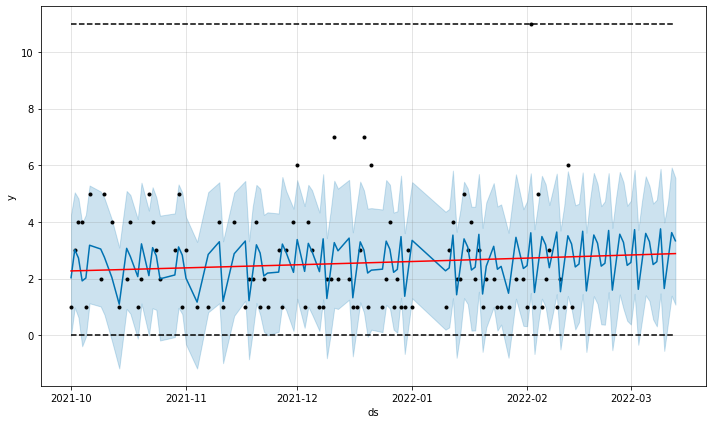

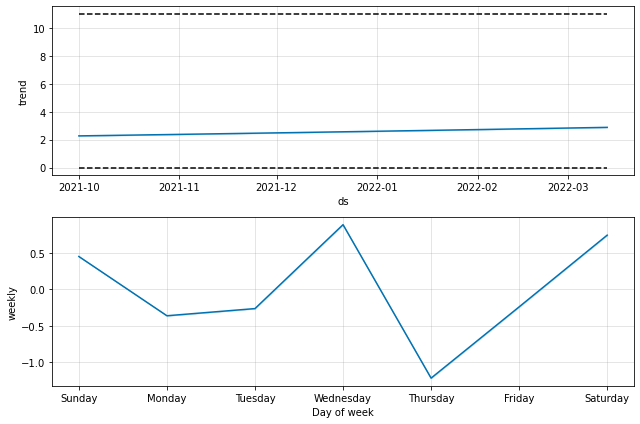

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -22.0239
Iteration  1. Log joint probability =     3.0041. Improved by 25.028.
Iteration  2. Log joint probability =    37.5044. Improved by 34.5003.
Iteration  3. Log joint probability =    51.0615. Improved by 13.5572.
Iteration  4. Log joint probability =    53.3494. Improved by 2.28787.
Iteration  5. Log joint probability =    53.8664. Improved by 0.516958.
Iteration  6. Log joint probability =    54.6042. Improved by 0.737799.
Iteration  7. Log joint probability =    54.6892. Improved by 0.0850376.
Iteration  8. Log joint probability =    54.7616. Improved by 0.0723374.
Iteration  9. Log joint probability =    54.8072. Improved by 0.0456574.
Iteration 10. Log joint probability =    54.8321. Improved by 0.0249389.
Iteration 11. Log joint probability =    54.8568. Improved by 0.0246792.
Iteration 12. Log joint probability =    54.8621. Improved by 0.00522717.
Iteration 13. Log joint probability =    54.8647. Improved by 0.00263932.
Iteration 14. Log 

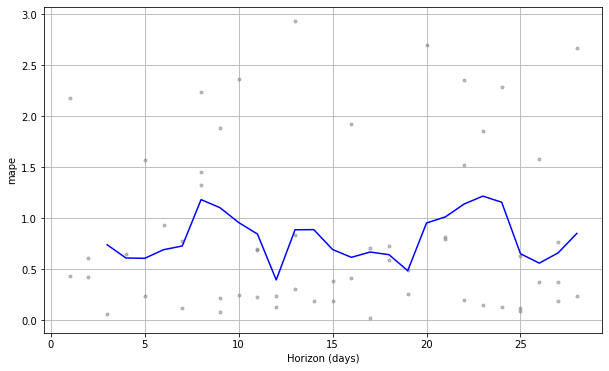

mape: 80.40%

262384
      CategoryCode  ItemCode     DateID  DailySales
11714   category_2    262384   1/1/2022           7
13072   category_2    262384  1/10/2022           6
6057    category_2    262384  1/11/2022           1
14329   category_2    262384  1/12/2022           1
5536    category_2    262384  1/13/2022           3
...            ...       ...        ...         ...
11783   category_2    262384   2/5/2022           4
11609   category_2    262384   2/6/2022           1
15130   category_2    262384   2/7/2022           3
1132    category_2    262384   2/8/2022           8
632     category_2    262384   2/9/2022           1

[109 rows x 4 columns]

Initial log joint probability = -5.66691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       119.087   8.78646e-09       96.2896           1           1      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

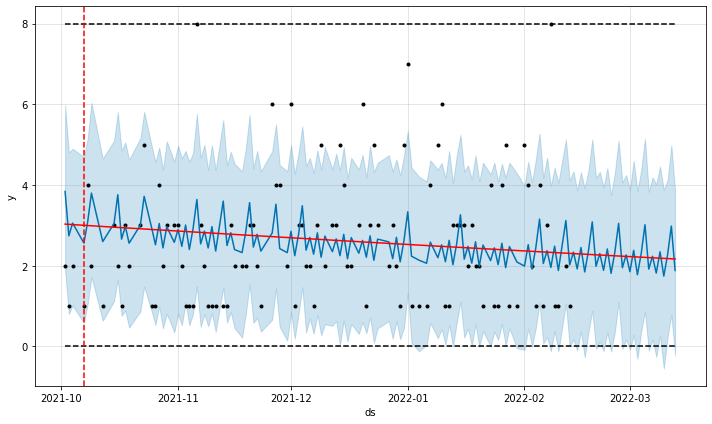

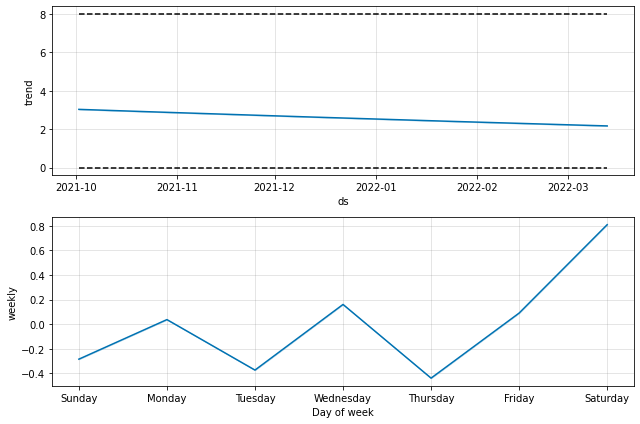

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -27.0747
Iteration  1. Log joint probability =     55.278. Improved by 82.3527.
Iteration  2. Log joint probability =     78.078. Improved by 22.8.
Iteration  3. Log joint probability =    80.2141. Improved by 2.13604.
Iteration  4. Log joint probability =    80.4394. Improved by 0.225295.
Iteration  5. Log joint probability =    80.4406. Improved by 0.00124733.
Iteration  6. Log joint probability =    80.4467. Improved by 0.0060543.
Iteration  7. Log joint probability =    80.4587. Improved by 0.0120176.
Iteration  8. Log joint probability =    80.4641. Improved by 0.00538855.
Iteration  9. Log joint probability =    80.4837. Improved by 0.0196365.
Iteration 10. Log joint probability =    80.4935. Improved by 0.00978773.
Iteration 11. Log joint probability =    80.5297. Improved by 0.036159.
Iteration 12. Log joint probability =    80.5473. Improved by 0.0176072.
Iteration 13. Log joint probability =    80.7979. Improved by 0.250663.
Iteration 14. Log 

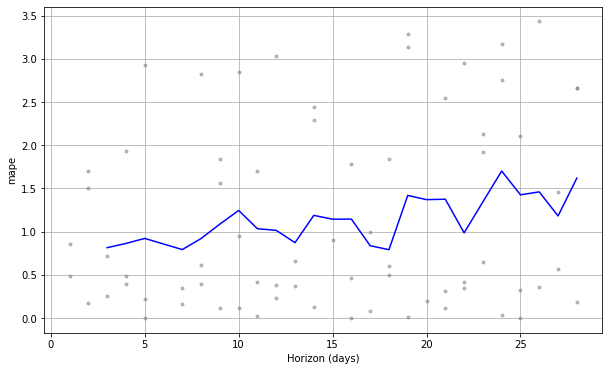

mape: 114.21%

267478
      CategoryCode  ItemCode     DateID  DailySales
10973   category_2    267478   1/1/2022           1
7187    category_2    267478  1/11/2022           2
5301    category_2    267478  1/13/2022           3
11931   category_2    267478  1/14/2022           2
10814   category_2    267478  1/15/2022           1
...            ...       ...        ...         ...
11937   category_2    267478   2/4/2022           1
10746   category_2    267478   2/5/2022           1
10981   category_2    267478   2/6/2022           2
15659   category_2    267478   2/7/2022           1
1068    category_2    267478   2/8/2022           4

[86 rows x 4 columns]


Initial log joint probability = -48.8636
Iteration  1. Log joint probability =    74.2903. Improved by 123.154.
Iteration  2. Log joint probability =    136.086. Improved by 61.796.
Iteration  3. Log joint probability =    140.719. Improved by 4.63283.
Iteration  4. Log joint probability =    141.785. Improved by 1.06628.
Itera

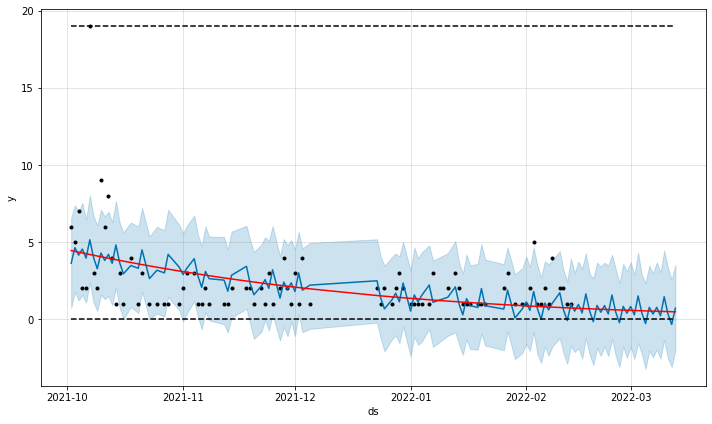

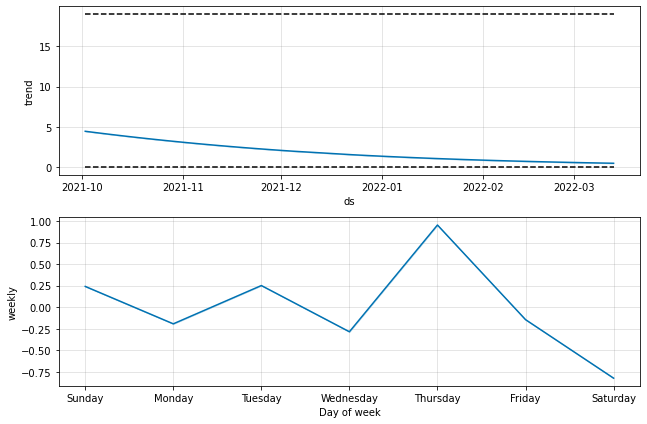

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -13.7315
Iteration  1. Log joint probability =    53.5823. Improved by 67.3138.
Iteration  2. Log joint probability =    68.4454. Improved by 14.8631.
Iteration  3. Log joint probability =    70.7606. Improved by 2.31518.
Iteration  4. Log joint probability =    71.6554. Improved by 0.894861.
Iteration  5. Log joint probability =    71.8431. Improved by 0.187626.
Iteration  6. Log joint probability =    72.0177. Improved by 0.174616.
Iteration  7. Log joint probability =    72.0768. Improved by 0.0591626.
Iteration  8. Log joint probability =    72.1066. Improved by 0.0297714.
Iteration  9. Log joint probability =     72.119. Improved by 0.01243.
Iteration 10. Log joint probability =    72.1239. Improved by 0.00488041.
Iteration 11. Log joint probability =    72.1341. Improved by 0.0101522.
Iteration 12. Log joint probability =    72.1341. Improved by 9.15532e-06.
Iteration 13. Log joint probability =    72.1397. Improved by 0.00567552.
Iteration 14. Lo

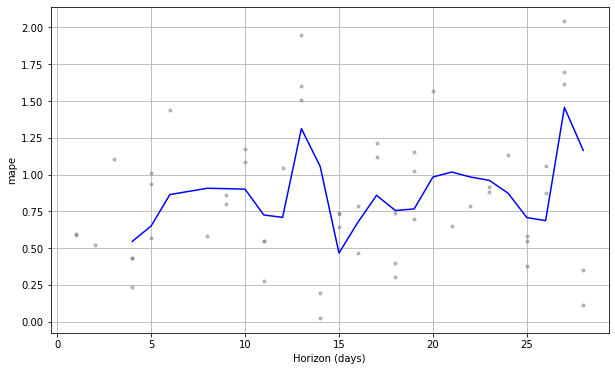

mape: 87.16%

370195
      CategoryCode  ItemCode     DateID  DailySales
10108   category_1    370195   1/1/2022           2
13016   category_1    370195  1/10/2022           1
7106    category_1    370195  1/11/2022           3
13230   category_1    370195  1/12/2022           5
5949    category_1    370195  1/13/2022           7
...            ...       ...        ...         ...
11299   category_1    370195   2/5/2022          17
10553   category_1    370195   2/6/2022           3
18818   category_1    370195   2/7/2022           1
1161    category_1    370195   2/8/2022           3
779     category_1    370195   2/9/2022           2

[118 rows x 4 columns]

Initial log joint probability = -5.85742
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        163.33   4.97337e-06        87.881      0.3063           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       163

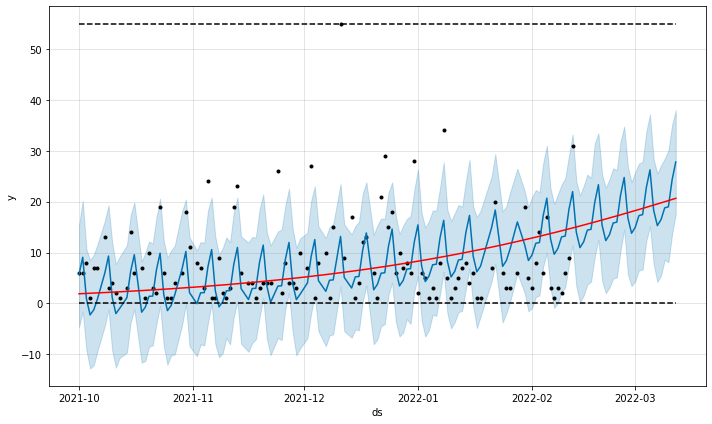

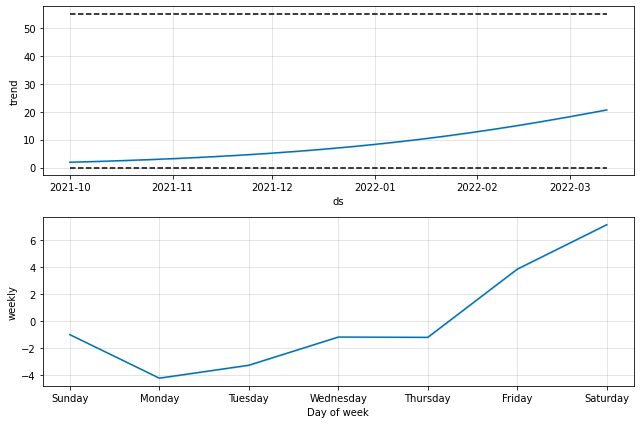

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -32.4582
Iteration  1. Log joint probability =    68.8661. Improved by 101.324.
Iteration  2. Log joint probability =    81.9274. Improved by 13.0613.
Iteration  3. Log joint probability =    85.0359. Improved by 3.10853.
Iteration  4. Log joint probability =    85.0393. Improved by 0.00339693.
Iteration  5. Log joint probability =    85.0477. Improved by 0.00841614.
Iteration  6. Log joint probability =    85.0533. Improved by 0.00556657.
Iteration  7. Log joint probability =    85.0634. Improved by 0.0101087.
Iteration  8. Log joint probability =    85.0833. Improved by 0.0199266.
Iteration  9. Log joint probability =    85.0988. Improved by 0.0154779.
Iteration 10. Log joint probability =     85.118. Improved by 0.019161.
Iteration 11. Log joint probability =    85.1557. Improved by 0.0377697.
Iteration 12. Log joint probability =    85.1746. Improved by 0.018877.
Iteration 13. Log joint probability =     85.192. Improved by 0.0173389.
Iteration 14. 

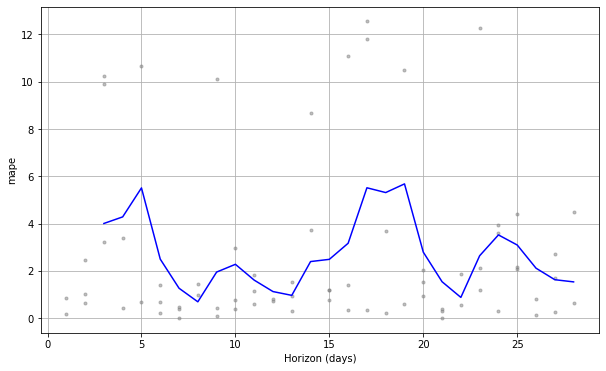

mape: 270.85%

371104
      CategoryCode  ItemCode     DateID  DailySales
11239   category_1    371104   1/1/2022           2
12375   category_1    371104  1/10/2022           1
14353   category_1    371104  1/12/2022           3
5716    category_1    371104  1/13/2022           2
10975   category_1    371104  1/14/2022           1
...            ...       ...        ...         ...
13585   category_1    371104  2/12/2022           2
10476   category_1    371104  2/13/2022           1
18634   category_1    371104   2/7/2022           9
1480    category_1    371104   2/8/2022           1
116     category_1    371104   2/9/2022           5

[80 rows x 4 columns]


Initial log joint probability = -111.827
Iteration  1. Log joint probability =    38.0479. Improved by 149.875.
Iteration  2. Log joint probability =    53.7291. Improved by 15.6812.
Iteration  3. Log joint probability =    89.8669. Improved by 36.1378.
Iteration  4. Log joint probability =    105.398. Improved by 15.5311.
Iter

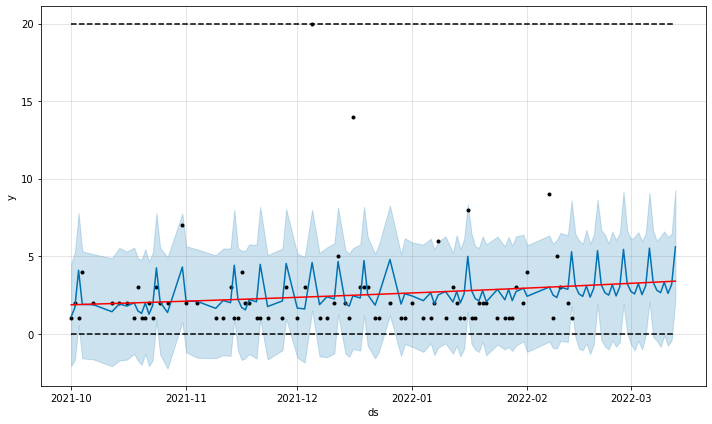

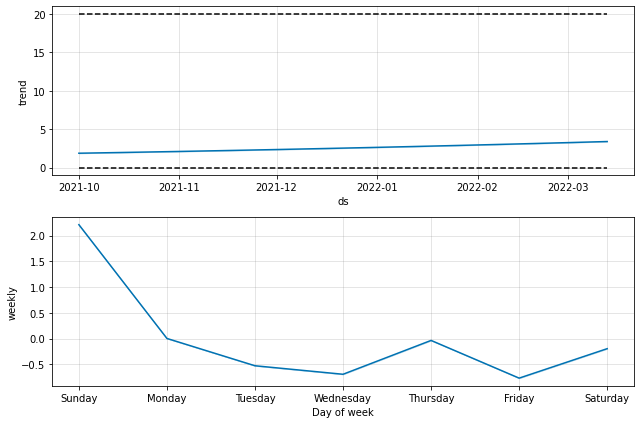

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -11.1851
Iteration  1. Log joint probability =    38.8713. Improved by 50.0564.
Iteration  2. Log joint probability =    58.7821. Improved by 19.9108.
Iteration  3. Log joint probability =    60.9023. Improved by 2.12019.
Iteration  4. Log joint probability =    61.2491. Improved by 0.346794.
Iteration  5. Log joint probability =    61.2935. Improved by 0.0444315.
Iteration  6. Log joint probability =    61.3695. Improved by 0.075952.
Iteration  7. Log joint probability =    62.0019. Improved by 0.632472.
Iteration  8. Log joint probability =    62.0063. Improved by 0.00441046.
Iteration  9. Log joint probability =    62.0191. Improved by 0.0127355.
Iteration 10. Log joint probability =    62.0242. Improved by 0.0051634.
Iteration 11. Log joint probability =    62.0282. Improved by 0.00392104.
Iteration 12. Log joint probability =    62.0288. Improved by 0.00061556.
Iteration 13. Log joint probability =     62.029. Improved by 0.000190457.
Iteration 14.

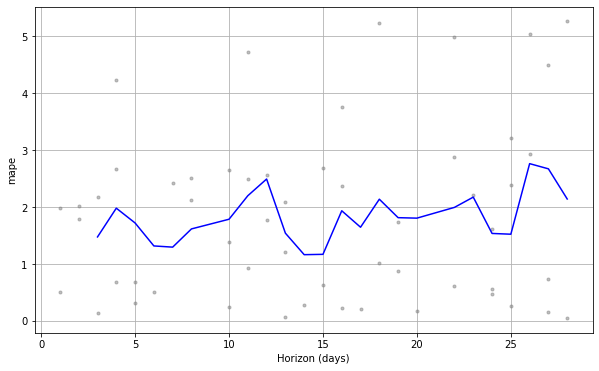

mape: 182.99%

687616
      CategoryCode  ItemCode     DateID  DailySales
14069   category_2    687616  1/10/2022           5
6332    category_2    687616  1/11/2022           2
14472   category_2    687616  1/12/2022           3
7741    category_2    687616  1/13/2022           2
10221   category_2    687616  1/15/2022           2
...            ...       ...        ...         ...
3958    category_2    687616   2/3/2022           4
11910   category_2    687616   2/5/2022           1
10867   category_2    687616   2/6/2022           5
15613   category_2    687616   2/7/2022           2
1022    category_2    687616   2/8/2022           4

[96 rows x 4 columns]


Initial log joint probability = -59.4103
Iteration  1. Log joint probability =    74.9811. Improved by 134.391.
Iteration  2. Log joint probability =    103.471. Improved by 28.4904.
Iteration  3. Log joint probability =     112.77. Improved by 9.29832.
Iteration  4. Log joint probability =    115.487. Improved by 2.71683.
Iter

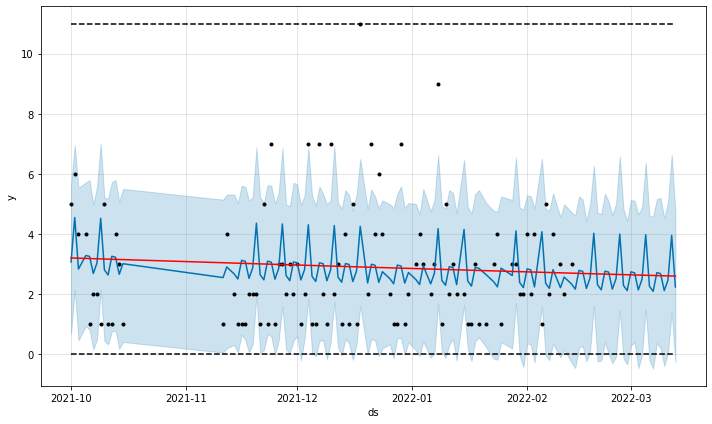

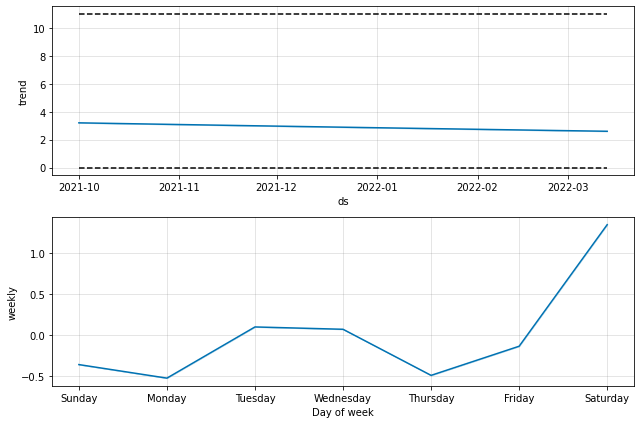

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -27.3849
Iteration  1. Log joint probability =    26.7979. Improved by 54.1828.
Iteration  2. Log joint probability =    34.9758. Improved by 8.17799.
Iteration  3. Log joint probability =    46.2658. Improved by 11.2899.
Iteration  4. Log joint probability =    46.2668. Improved by 0.000959819.
Iteration  5. Log joint probability =    46.2702. Improved by 0.00347369.
Iteration  6. Log joint probability =    46.2749. Improved by 0.00469936.
Iteration  7. Log joint probability =    46.2889. Improved by 0.0139936.
Iteration  8. Log joint probability =    46.3028. Improved by 0.0138819.
Iteration  9. Log joint probability =    46.3245. Improved by 0.0217474.
Iteration 10. Log joint probability =    46.3463. Improved by 0.0217299.
Iteration 11. Log joint probability =    46.4358. Improved by 0.0895348.
Iteration 12. Log joint probability =     46.447. Improved by 0.0111954.
Iteration 13. Log joint probability =    46.4835. Improved by 0.0365373.
Iteration 1

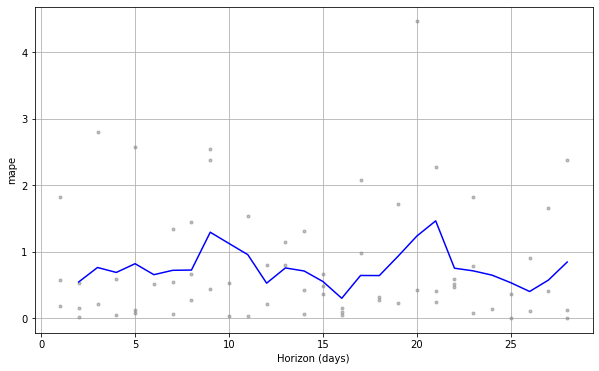

mape: 76.10%

731104
      CategoryCode  ItemCode     DateID  DailySales
13781   category_4    731104  1/10/2022           7
11405   category_4    731104  1/16/2022           3
5261    category_4    731104  1/17/2022           6
13538   category_4    731104  1/18/2022           4
11582   category_4    731104   1/2/2022          10
...            ...       ...        ...         ...
11439   category_4    731104  12/5/2021           7
19201   category_4    731104  12/6/2021           1
1262    category_4    731104  12/7/2021           1
12755   category_4    731104   2/1/2022          12
12412   category_4    731104   2/2/2022          12

[78 rows x 4 columns]


Initial log joint probability = -44.408
Iteration  1. Log joint probability =    53.1114. Improved by 97.5194.
Iteration  2. Log joint probability =    64.1916. Improved by 11.0802.
Iteration  3. Log joint probability =    81.3413. Improved by 17.1497.
Iteration  4. Log joint probability =    81.3468. Improved by 0.00549968.
Ite

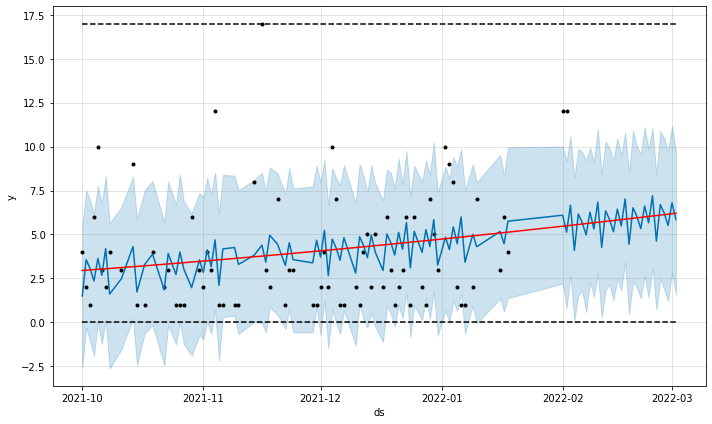

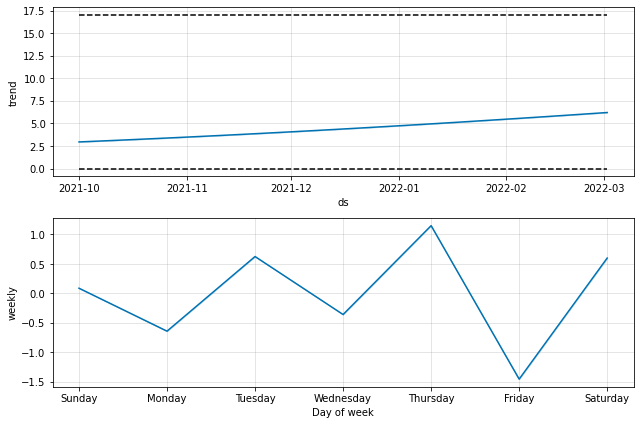

  0%|          | 0/2 [00:00<?, ?it/s]


Initial log joint probability = -22.6316
Iteration  1. Log joint probability =    56.6879. Improved by 79.3195.
Iteration  2. Log joint probability =    69.4544. Improved by 12.7665.
Iteration  3. Log joint probability =     69.849. Improved by 0.394616.
Iteration  4. Log joint probability =    70.0902. Improved by 0.241181.
Iteration  5. Log joint probability =    70.1383. Improved by 0.0480715.
Iteration  6. Log joint probability =    70.1416. Improved by 0.00330149.
Iteration  7. Log joint probability =    70.1491. Improved by 0.0075615.
Iteration  8. Log joint probability =    70.1584. Improved by 0.00929872.
Iteration  9. Log joint probability =    70.1608. Improved by 0.00236188.
Iteration 10. Log joint probability =    70.1636. Improved by 0.00275717.
Iteration 11. Log joint probability =    70.1637. Improved by 0.0001593.
Iteration 12. Log joint probability =     70.165. Improved by 0.00131768.
Iteration 13. Log joint probability =    70.1653. Improved by 0.000276247.
Iteratio

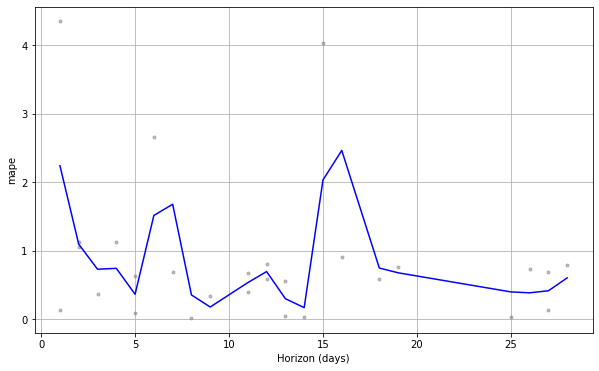

mape: 87.32%

753613
      CategoryCode  ItemCode     DateID  DailySales
6238    category_4    753613  1/11/2022          16
14113   category_4    753613  1/12/2022          20
6668    category_4    753613  1/13/2022          23
13488   category_4    753613  1/18/2022          44
6099    category_4    753613  1/19/2022          33
...            ...       ...        ...         ...
10329   category_4    753613   2/5/2022           8
10130   category_4    753613   2/6/2022           6
16206   category_4    753613   2/7/2022          22
828     category_4    753613   2/8/2022          19
599     category_4    753613   2/9/2022          68

[90 rows x 4 columns]


Initial log joint probability = -52.9726
Iteration  1. Log joint probability =    23.7442. Improved by 76.7168.
Iteration  2. Log joint probability =    93.6825. Improved by 69.9382.
Iteration  3. Log joint probability =    107.361. Improved by 13.6787.
Iteration  4. Log joint probability =    107.411. Improved by 0.0497702.
Ite

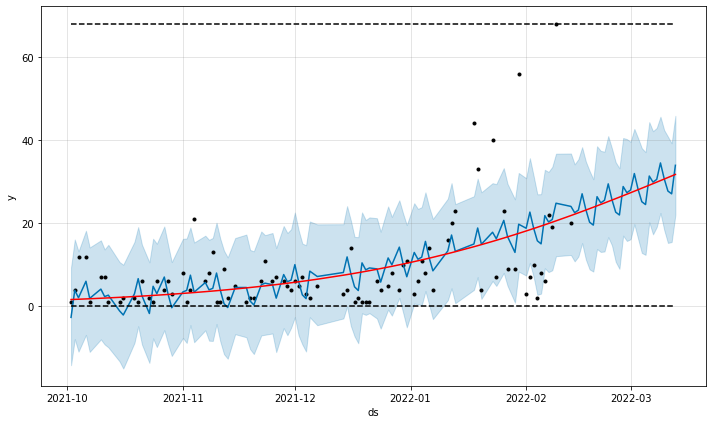

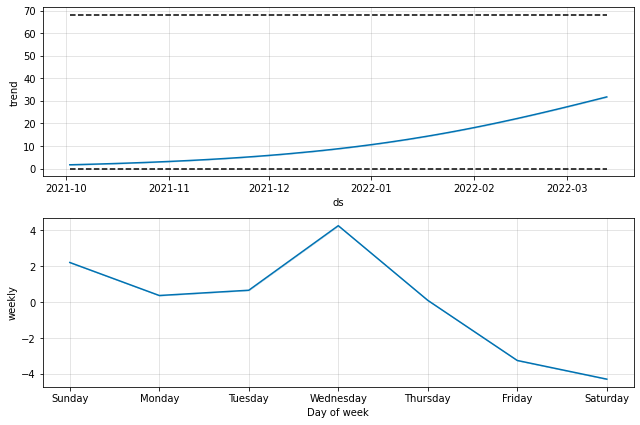

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -167.4
Iteration  1. Log joint probability =   -41.6347. Improved by 125.765.
Iteration  2. Log joint probability =    20.7262. Improved by 62.3609.
Iteration  3. Log joint probability =    36.1832. Improved by 15.457.
Iteration  4. Log joint probability =    46.8675. Improved by 10.6843.
Iteration  5. Log joint probability =    54.6331. Improved by 7.76563.
Iteration  6. Log joint probability =    55.1141. Improved by 0.481028.
Iteration  7. Log joint probability =    55.1737. Improved by 0.0595765.
Iteration  8. Log joint probability =    55.2833. Improved by 0.109634.
Iteration  9. Log joint probability =    55.3004. Improved by 0.0170287.
Iteration 10. Log joint probability =    55.3061. Improved by 0.00572023.
Iteration 11. Log joint probability =    55.3614. Improved by 0.0553448.
Iteration 12. Log joint probability =    55.3752. Improved by 0.0137266.
Iteration 13. Log joint probability =    55.3845. Improved by 0.00937797.
Iteration 14. Log join

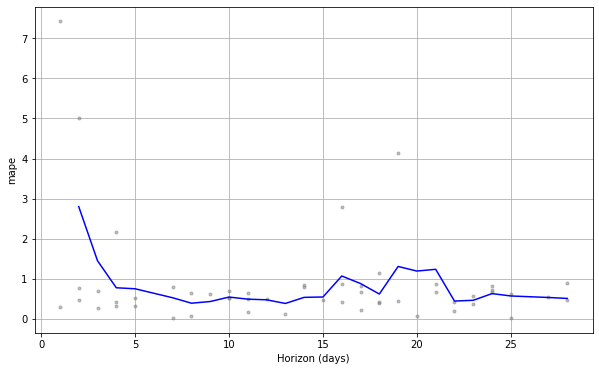

mape: 78.30%

815101
      CategoryCode  ItemCode     DateID  DailySales
11758   category_2    815101   1/1/2022           4
14222   category_2    815101  1/10/2022           5
5894    category_2    815101  1/11/2022           3
14137   category_2    815101  1/12/2022           3
7661    category_2    815101  1/13/2022           1
...            ...       ...        ...         ...
11814   category_2    815101   2/5/2022           2
11376   category_2    815101   2/6/2022           1
18709   category_2    815101   2/7/2022           3
640     category_2    815101   2/8/2022           2
517     category_2    815101   2/9/2022           2

[130 rows x 4 columns]

Initial log joint probability = -4.91225
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       173.145   6.09569e-07       80.1892      0.3751      0.3751      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       173

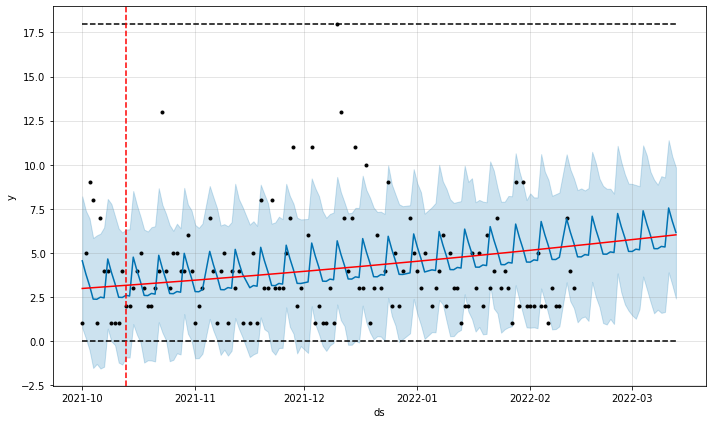

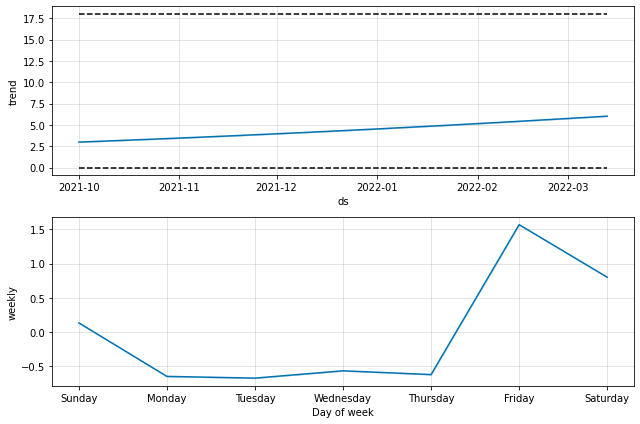

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -104.994
Iteration  1. Log joint probability =   -37.1587. Improved by 67.8357.
Iteration  2. Log joint probability =    81.0417. Improved by 118.2.
Iteration  3. Log joint probability =    83.5965. Improved by 2.55475.
Iteration  4. Log joint probability =    90.6712. Improved by 7.07474.
Iteration  5. Log joint probability =     90.673. Improved by 0.00177651.
Iteration  6. Log joint probability =    90.6762. Improved by 0.00323917.
Iteration  7. Log joint probability =    90.6819. Improved by 0.00567859.
Iteration  8. Log joint probability =    90.6847. Improved by 0.00283907.
Iteration  9. Log joint probability =    90.6894. Improved by 0.00465855.
Iteration 10. Log joint probability =    90.7393. Improved by 0.0499226.
Iteration 11. Log joint probability =    90.9284. Improved by 0.189059.
Iteration 12. Log joint probability =    91.1497. Improved by 0.221283.
Iteration 13. Log joint probability =    91.1625. Improved by 0.0128285.
Iteration 14. Lo

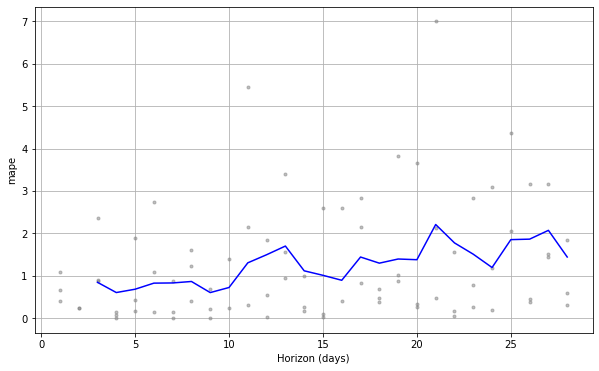

mape: 126.56%

837943
      CategoryCode  ItemCode     DateID  DailySales
10150   category_2    837943   1/1/2022          15
13507   category_2    837943  1/10/2022          13
6335    category_2    837943  1/11/2022           6
14191   category_2    837943  1/12/2022           4
6545    category_2    837943  1/13/2022           4
...            ...       ...        ...         ...
11396   category_2    837943   2/5/2022           8
10978   category_2    837943   2/6/2022          10
16081   category_2    837943   2/7/2022           8
966     category_2    837943   2/8/2022           7
233     category_2    837943   2/9/2022          10

[136 rows x 4 columns]

Initial log joint probability = -5.08317
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       183.748   2.24448e-09       103.356      0.2176      0.2176       94   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE

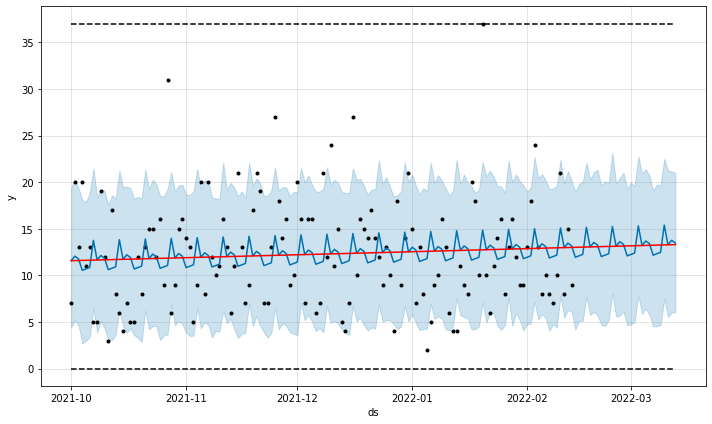

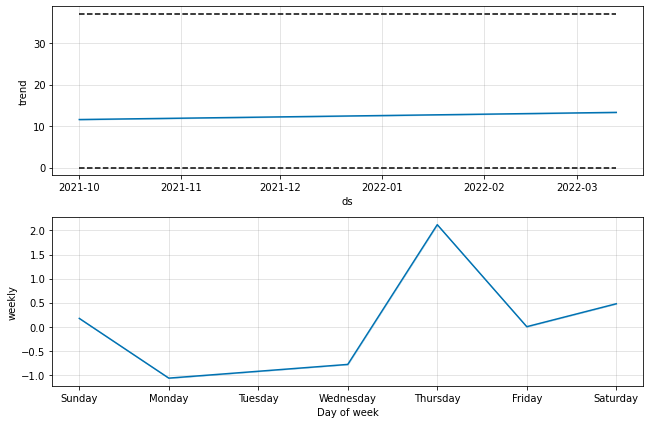

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -44.2823
Iteration  1. Log joint probability =    63.2285. Improved by 107.511.
Iteration  2. Log joint probability =     83.764. Improved by 20.5356.
Iteration  3. Log joint probability =    90.8082. Improved by 7.04412.
Iteration  4. Log joint probability =    92.7145. Improved by 1.90633.
Iteration  5. Log joint probability =    92.7286. Improved by 0.0141533.
Iteration  6. Log joint probability =    92.7388. Improved by 0.0101247.
Iteration  7. Log joint probability =    92.7561. Improved by 0.0173341.
Iteration  8. Log joint probability =     92.773. Improved by 0.0169223.
Iteration  9. Log joint probability =    92.8205. Improved by 0.0475012.
Iteration 10. Log joint probability =    92.8374. Improved by 0.0168773.
Iteration 11. Log joint probability =     92.859. Improved by 0.0216045.
Iteration 12. Log joint probability =    92.9779. Improved by 0.118887.
Iteration 13. Log joint probability =    93.0454. Improved by 0.0675225.
Iteration 14. Log 

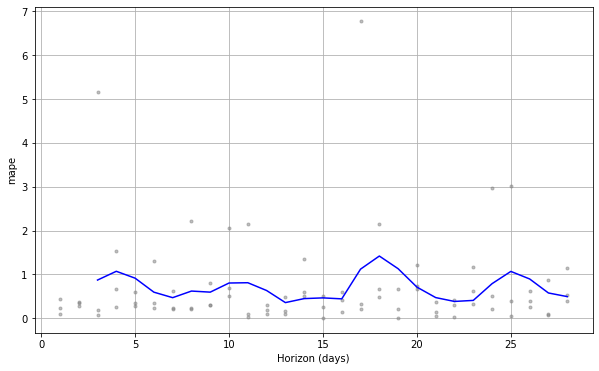

mape: 71.40%

838456
      CategoryCode  ItemCode     DateID  DailySales
10942   category_2    838456   1/1/2022           8
14059   category_2    838456  1/10/2022           2
7375    category_2    838456  1/11/2022           1
14469   category_2    838456  1/12/2022           9
6938    category_2    838456  1/13/2022           3
...            ...       ...        ...         ...
12150   category_2    838456   2/5/2022           1
10422   category_2    838456   2/6/2022           2
18992   category_2    838456   2/7/2022           1
1596    category_2    838456   2/8/2022           1
534     category_2    838456   2/9/2022           2

[121 rows x 4 columns]

Initial log joint probability = -5.27843
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       144.202   8.11396e-09        96.861      0.2305      0.2305      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

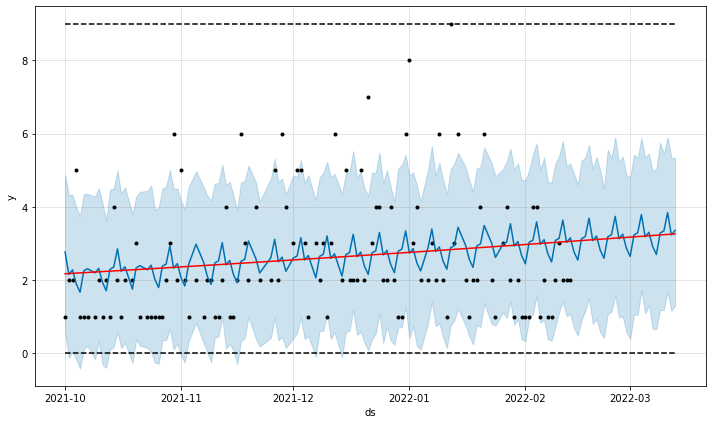

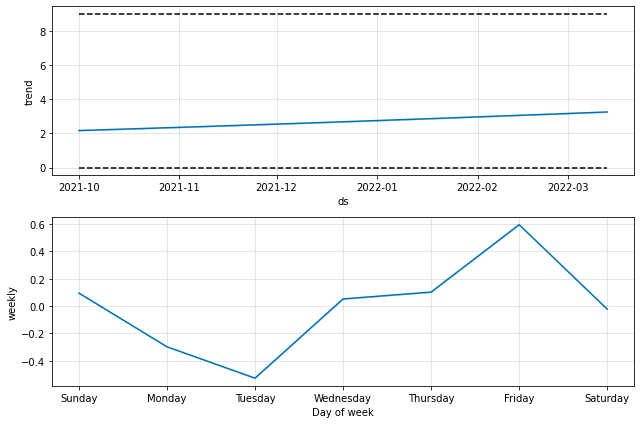

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -34.9498
Iteration  1. Log joint probability =    53.9998. Improved by 88.9496.
Iteration  2. Log joint probability =    54.4293. Improved by 0.429592.
Iteration  3. Log joint probability =    58.0352. Improved by 3.60583.
Iteration  4. Log joint probability =    63.9063. Improved by 5.8711.
Iteration  5. Log joint probability =     63.918. Improved by 0.0117165.
Iteration  6. Log joint probability =    63.9363. Improved by 0.0183106.
Iteration  7. Log joint probability =    63.9665. Improved by 0.0301748.
Iteration  8. Log joint probability =    63.9782. Improved by 0.0116731.
Iteration  9. Log joint probability =    64.0025. Improved by 0.0243294.
Iteration 10. Log joint probability =    64.0139. Improved by 0.0113766.
Iteration 11. Log joint probability =    64.0511. Improved by 0.0372376.
Iteration 12. Log joint probability =    64.1839. Improved by 0.132843.
Iteration 13. Log joint probability =    64.2324. Improved by 0.0484744.
Iteration 14. Log 

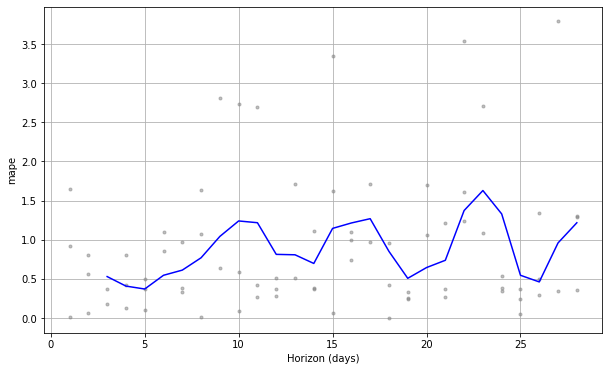

mape: 88.19%

839374
      CategoryCode  ItemCode     DateID  DailySales
12701   category_1    839374  1/10/2022           6
6818    category_1    839374  1/11/2022          18
14392   category_1    839374  1/12/2022          10
6764    category_1    839374  1/13/2022          11
11545   category_1    839374  1/16/2022          10
...            ...       ...        ...         ...
11430   category_1    839374   2/5/2022           5
10415   category_1    839374   2/6/2022          20
15101   category_1    839374   2/7/2022          15
1737    category_1    839374   2/8/2022           2
60      category_1    839374   2/9/2022           8

[109 rows x 4 columns]

Initial log joint probability = -3.23264
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67       161.737   5.45905e-09       101.972      0.3542      0.3542       92   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

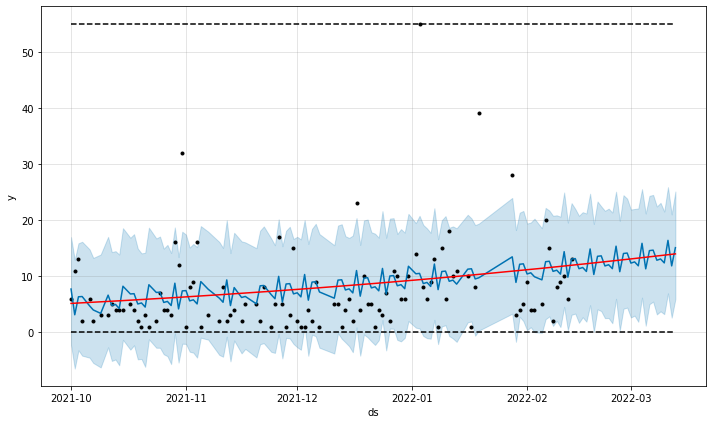

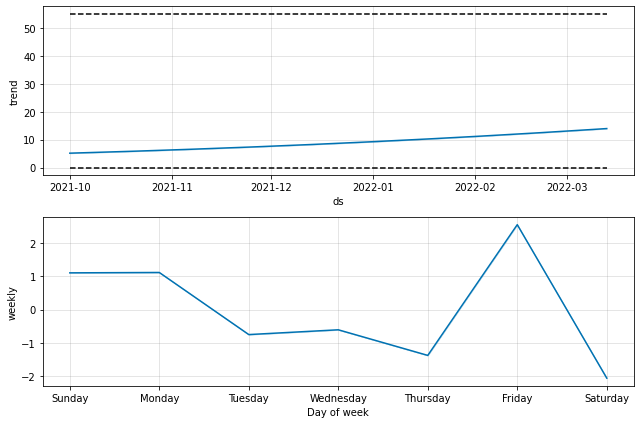

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -30.2378
Iteration  1. Log joint probability =    68.0195. Improved by 98.2573.
Iteration  2. Log joint probability =    77.5584. Improved by 9.53895.
Iteration  3. Log joint probability =    79.8483. Improved by 2.28983.
Iteration  4. Log joint probability =    80.5867. Improved by 0.738408.
Iteration  5. Log joint probability =    81.1322. Improved by 0.545496.
Iteration  6. Log joint probability =     81.366. Improved by 0.233825.
Iteration  7. Log joint probability =    81.4115. Improved by 0.0454961.
Iteration  8. Log joint probability =    81.4117. Improved by 0.00023659.
Iteration  9. Log joint probability =    81.4489. Improved by 0.0371918.
Iteration 10. Log joint probability =     81.461. Improved by 0.0120516.
Iteration 11. Log joint probability =    81.4729. Improved by 0.0119703.
Iteration 12. Log joint probability =    81.4791. Improved by 0.00615792.
Iteration 13. Log joint probability =    81.4816. Improved by 0.00245915.
Iteration 14. L

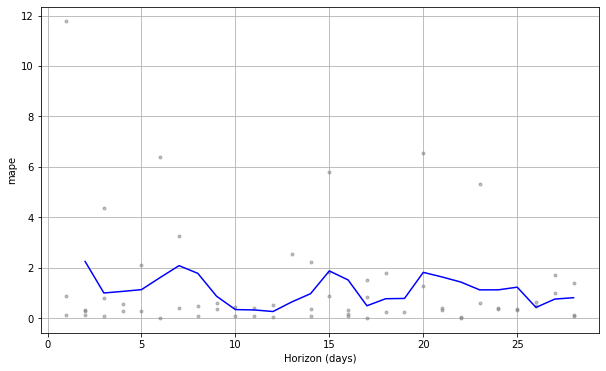

mape: 111.09%

858886
      CategoryCode  ItemCode     DateID  DailySales
13261   category_2    858886  1/10/2022           2
7274    category_2    858886  1/11/2022           2
14573   category_2    858886  1/12/2022           1
12270   category_2    858886  1/14/2022           2
10254   category_2    858886  1/15/2022           2
...            ...       ...        ...         ...
12196   category_2    858886  2/13/2022           4
13227   category_2    858886   2/2/2022           3
11812   category_2    858886   2/5/2022           4
12315   category_2    858886   2/6/2022           1
18660   category_2    858886   2/7/2022           2

[85 rows x 4 columns]


Initial log joint probability = -48.7159
Iteration  1. Log joint probability =    47.2859. Improved by 96.0018.
Iteration  2. Log joint probability =    89.0795. Improved by 41.7936.
Iteration  3. Log joint probability =    89.2946. Improved by 0.215093.
Iteration  4. Log joint probability =    104.297. Improved by 15.0021.
Ite

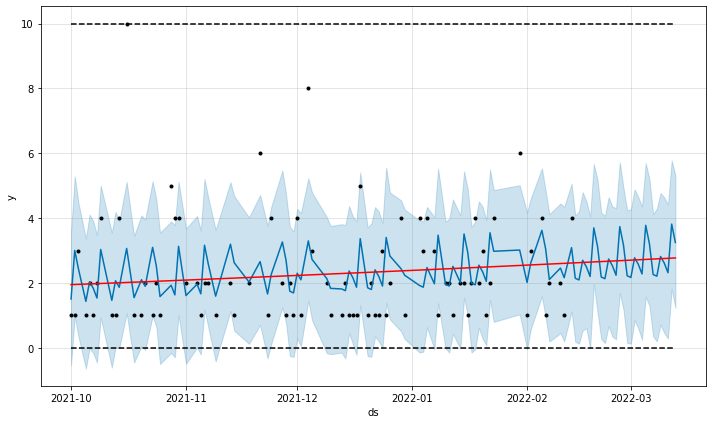

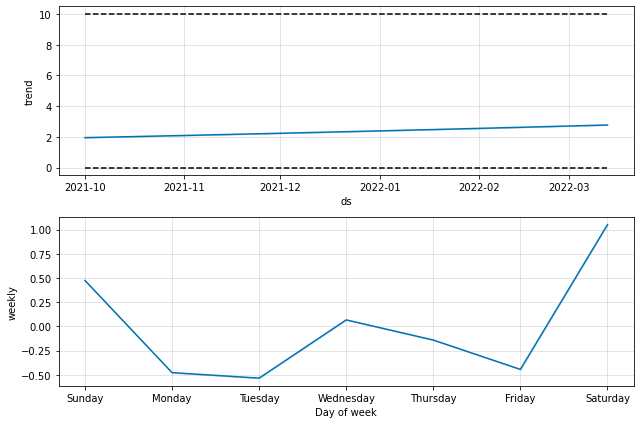

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -15.5082
Iteration  1. Log joint probability =    42.5077. Improved by 58.0159.
Iteration  2. Log joint probability =    61.0747. Improved by 18.5669.
Iteration  3. Log joint probability =    61.1709. Improved by 0.0961974.
Iteration  4. Log joint probability =    61.4873. Improved by 0.316482.
Iteration  5. Log joint probability =    61.6636. Improved by 0.176262.
Iteration  6. Log joint probability =    61.6667. Improved by 0.00305762.
Iteration  7. Log joint probability =    61.6688. Improved by 0.00215268.
Iteration  8. Log joint probability =    61.6824. Improved by 0.0136043.
Iteration  9. Log joint probability =    61.7106. Improved by 0.0281836.
Iteration 10. Log joint probability =    61.7915. Improved by 0.0808518.
Iteration 11. Log joint probability =     61.852. Improved by 0.0605345.
Iteration 12. Log joint probability =     61.853. Improved by 0.00102647.
Iteration 13. Log joint probability =    61.9974. Improved by 0.144435.
Iteration 14.

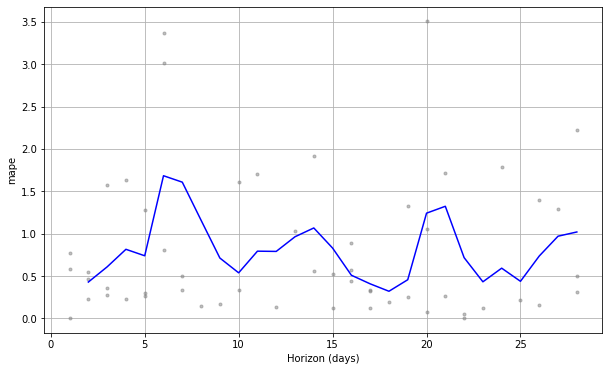

mape: 81.07%

872260
      CategoryCode  ItemCode     DateID  DailySales
11267   category_4    872260   1/1/2022           2
14708   category_4    872260  1/10/2022           3
7105    category_4    872260  1/11/2022           6
12401   category_4    872260  1/12/2022           8
6529    category_4    872260  1/13/2022           6
...            ...       ...        ...         ...
1971    category_4    872260  12/7/2021           3
18719   category_4    872260  12/8/2021           4
365     category_4    872260  12/9/2021           3
13140   category_4    872260   2/1/2022           2
11794   category_4    872260  2/13/2022          12

[88 rows x 4 columns]


Initial log joint probability = -52.4587
Iteration  1. Log joint probability =    78.4012. Improved by 130.86.
Iteration  2. Log joint probability =    106.566. Improved by 28.1644.
Iteration  3. Log joint probability =    116.411. Improved by 9.84571.
Iteration  4. Log joint probability =    130.679. Improved by 14.2675.
Iterat

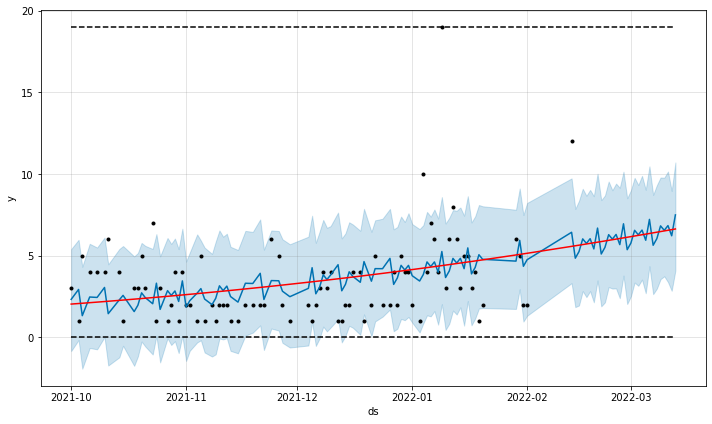

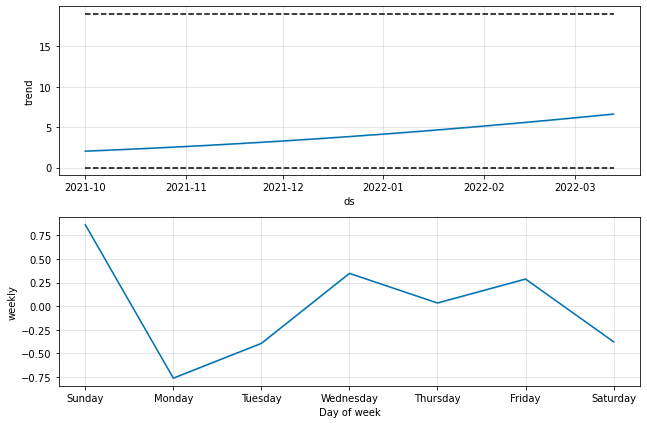

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -21.3269
Iteration  1. Log joint probability =    26.2649. Improved by 47.5918.
Iteration  2. Log joint probability =    50.6105. Improved by 24.3456.
Iteration  3. Log joint probability =    57.5109. Improved by 6.90042.
Iteration  4. Log joint probability =    58.0225. Improved by 0.511581.
Iteration  5. Log joint probability =    59.0648. Improved by 1.0423.
Iteration  6. Log joint probability =    59.2347. Improved by 0.169864.
Iteration  7. Log joint probability =    59.2377. Improved by 0.00308521.
Iteration  8. Log joint probability =    59.2465. Improved by 0.00878446.
Iteration  9. Log joint probability =    59.2663. Improved by 0.019814.
Iteration 10. Log joint probability =    59.2958. Improved by 0.0294632.
Iteration 11. Log joint probability =    59.3593. Improved by 0.0634927.
Iteration 12. Log joint probability =    59.5004. Improved by 0.141079.
Iteration 13. Log joint probability =    59.5028. Improved by 0.00241944.
Iteration 14. Log j

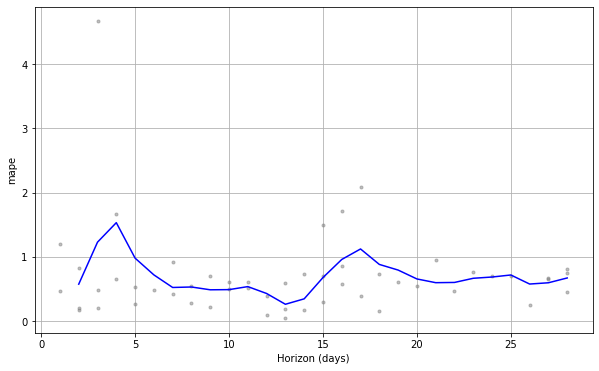

mape: 69.85%

893824
      CategoryCode  ItemCode     DateID  DailySales
11101   category_3    893824   1/1/2022           1
13483   category_3    893824  1/10/2022          10
7505    category_3    893824  1/11/2022          11
13452   category_3    893824  1/12/2022           6
12006   category_3    893824  1/14/2022          19
...            ...       ...        ...         ...
10148   category_3    893824   2/4/2022           6
12056   category_3    893824   2/5/2022          10
11786   category_3    893824   2/6/2022           6
16073   category_3    893824   2/7/2022          10
992     category_3    893824   2/9/2022           6

[91 rows x 4 columns]


Initial log joint probability = -55.6049
Iteration  1. Log joint probability =    66.9366. Improved by 122.541.
Iteration  2. Log joint probability =    106.973. Improved by 40.0366.
Iteration  3. Log joint probability =    116.673. Improved by 9.69957.
Iteration  4. Log joint probability =    116.673. Improved by 0.000578329.
I

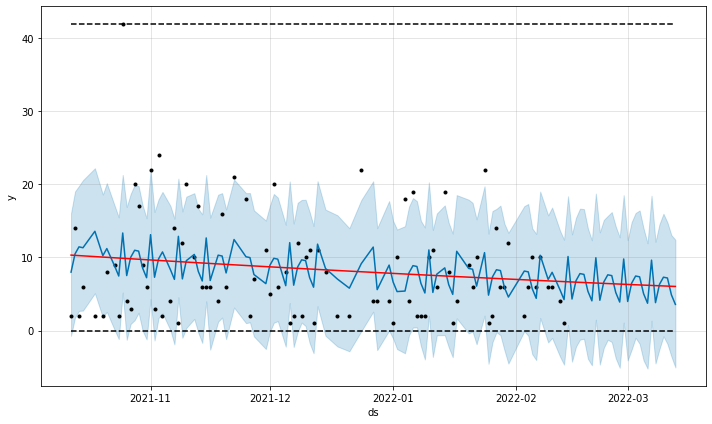

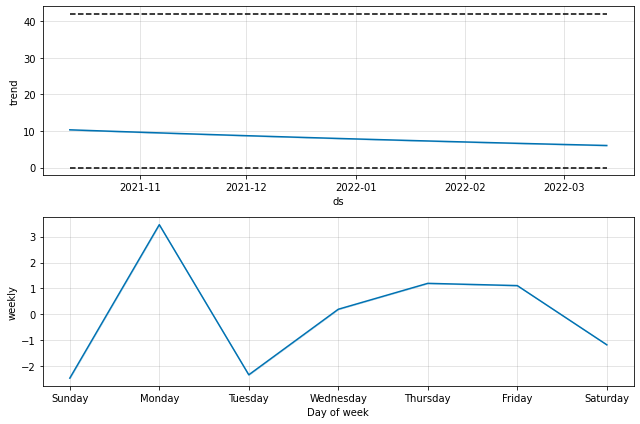

  0%|          | 0/2 [00:00<?, ?it/s]


Initial log joint probability = -24.8625
Iteration  1. Log joint probability =    9.89804. Improved by 34.7606.
Iteration  2. Log joint probability =      16.32. Improved by 6.42195.
Iteration  3. Log joint probability =    16.3276. Improved by 0.00765643.
Iteration  4. Log joint probability =    16.3414. Improved by 0.0137546.
Iteration  5. Log joint probability =     16.365. Improved by 0.0235629.
Iteration  6. Log joint probability =    16.3767. Improved by 0.0117836.
Iteration  7. Log joint probability =      16.44. Improved by 0.0632494.
Iteration  8. Log joint probability =    16.4449. Improved by 0.00493371.
Iteration  9. Log joint probability =    16.5908. Improved by 0.145861.
Iteration 10. Log joint probability =    16.8318. Improved by 0.241025.
Iteration 11. Log joint probability =    16.8419. Improved by 0.0100527.
Iteration 12. Log joint probability =    16.9239. Improved by 0.0820751.
Iteration 13. Log joint probability =    17.5793. Improved by 0.655332.
Iteration 14. 

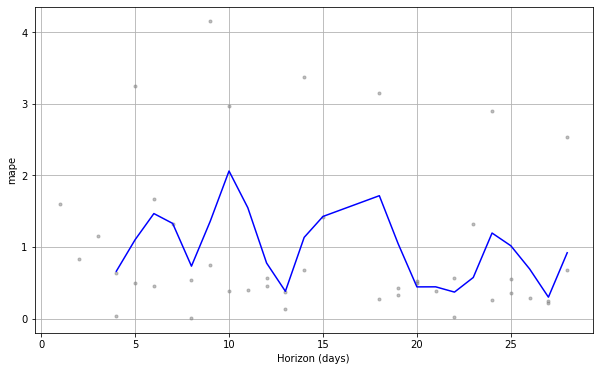

mape: 98.56%

903976
      CategoryCode  ItemCode     DateID  DailySales
10298   category_2    903976   1/1/2022           2
12877   category_2    903976  1/10/2022           5
13678   category_2    903976  1/12/2022           6
7573    category_2    903976  1/13/2022           3
11066   category_2    903976  1/14/2022           3
...            ...       ...        ...         ...
10723   category_2    903976   2/4/2022           1
12253   category_2    903976   2/5/2022           2
11328   category_2    903976   2/6/2022          11
15312   category_2    903976   2/7/2022           9
1016    category_2    903976   2/9/2022          13

[104 rows x 4 columns]

Initial log joint probability = -3.81793
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       135.343   9.73234e-09       101.075      0.5105      0.5105      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE 

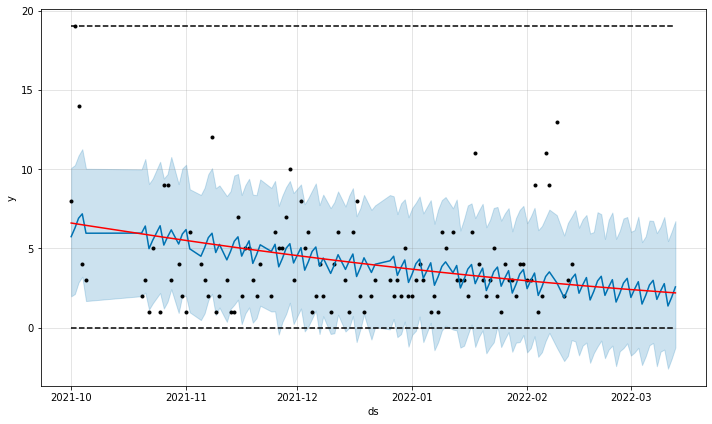

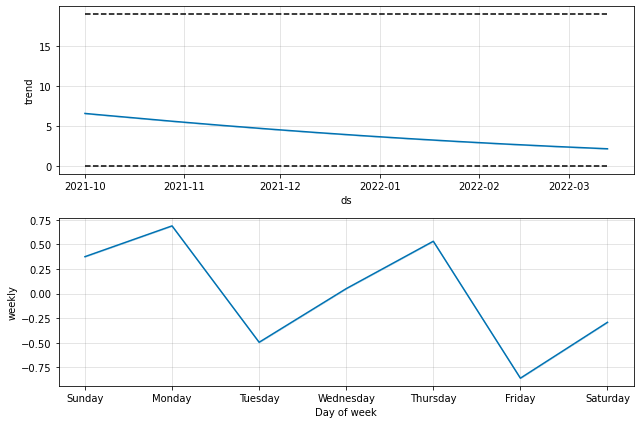

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -21.6656
Iteration  1. Log joint probability =    31.0507. Improved by 52.7164.
Iteration  2. Log joint probability =     49.134. Improved by 18.0832.
Iteration  3. Log joint probability =    58.0766. Improved by 8.94261.
Iteration  4. Log joint probability =     58.078. Improved by 0.00144627.
Iteration  5. Log joint probability =    58.0874. Improved by 0.0094165.
Iteration  6. Log joint probability =    62.0646. Improved by 3.97718.
Iteration  7. Log joint probability =    62.0674. Improved by 0.00283732.
Iteration  8. Log joint probability =    62.0778. Improved by 0.0103412.
Iteration  9. Log joint probability =    64.1275. Improved by 2.04968.
Iteration 10. Log joint probability =    64.5534. Improved by 0.425918.
Iteration 11. Log joint probability =    67.7116. Improved by 3.15818.
Iteration 12. Log joint probability =     67.983. Improved by 0.271431.
Iteration 13. Log joint probability =    68.2098. Improved by 0.226821.
Iteration 14. Log join

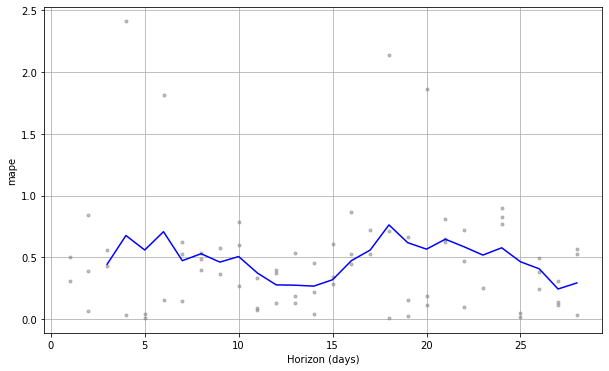

mape: 48.35%

906595
      CategoryCode  ItemCode     DateID  DailySales
10218   category_2    906595   1/1/2022           2
12486   category_2    906595  1/10/2022           1
6091    category_2    906595  1/11/2022           1
14186   category_2    906595  1/12/2022           1
5479    category_2    906595  1/13/2022           3
...            ...       ...        ...         ...
13335   category_2    906595   2/2/2022           2
3671    category_2    906595   2/3/2022           2
10288   category_2    906595   2/4/2022           3
10147   category_2    906595   2/5/2022           3
18735   category_2    906595   2/7/2022           2

[97 rows x 4 columns]


Initial log joint probability = -60.693
Iteration  1. Log joint probability =    58.6992. Improved by 119.392.
Iteration  2. Log joint probability =    66.4349. Improved by 7.73567.
Iteration  3. Log joint probability =    66.4396. Improved by 0.00466428.
Iteration  4. Log joint probability =    66.4403. Improved by 0.000702071.

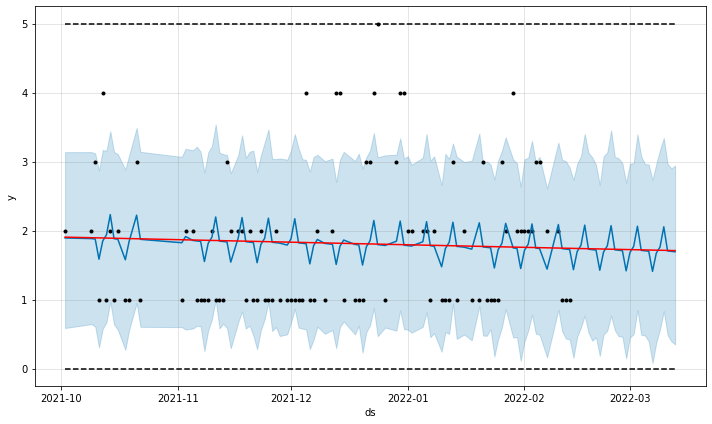

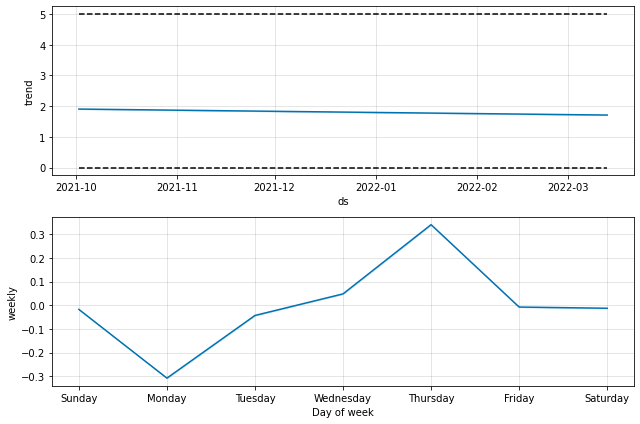

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -20.1631
Iteration  1. Log joint probability =    41.4196. Improved by 61.5826.
Iteration  2. Log joint probability =    55.3155. Improved by 13.8959.
Iteration  3. Log joint probability =    55.9405. Improved by 0.625015.
Iteration  4. Log joint probability =    56.0353. Improved by 0.0947563.
Iteration  5. Log joint probability =    56.5134. Improved by 0.478133.
Iteration  6. Log joint probability =    56.5487. Improved by 0.035304.
Iteration  7. Log joint probability =    56.6207. Improved by 0.0719399.
Iteration  8. Log joint probability =    56.6997. Improved by 0.0790471.
Iteration  9. Log joint probability =    56.7076. Improved by 0.00784905.
Iteration 10. Log joint probability =    56.7139. Improved by 0.00636998.
Iteration 11. Log joint probability =    56.7165. Improved by 0.00254526.
Iteration 12. Log joint probability =    56.7179. Improved by 0.001454.
Iteration 13. Log joint probability =    56.7188. Improved by 0.000888655.
Iteration 14

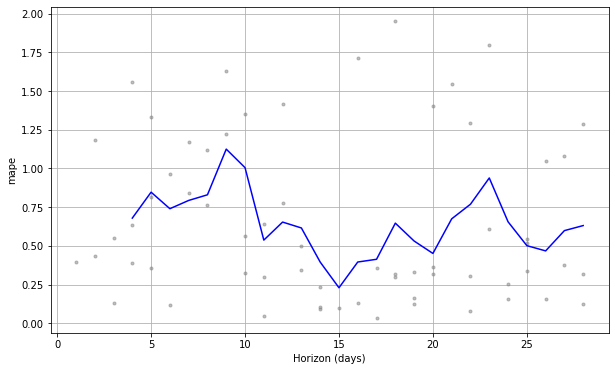

mape: 64.50%

999403
      CategoryCode  ItemCode     DateID  DailySales
10044   category_2    999403   1/1/2022           3
7598    category_2    999403  1/11/2022           4
6809    category_2    999403  1/13/2022           4
10256   category_2    999403  1/14/2022           4
11830   category_2    999403  1/16/2022           1
...            ...       ...        ...         ...
11947   category_2    999403   2/5/2022           1
11905   category_2    999403   2/6/2022           1
16445   category_2    999403   2/7/2022           3
1546    category_2    999403   2/8/2022           1
1252    category_2    999403   2/9/2022           4

[105 rows x 4 columns]

Initial log joint probability = -68.9194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       94.8524   2.33598e-05        94.773   2.408e-07       0.001      147  LS failed, Hessian reset 
      99       94.8538   7.33863e-07       101.756       1.315      0.1315      173   

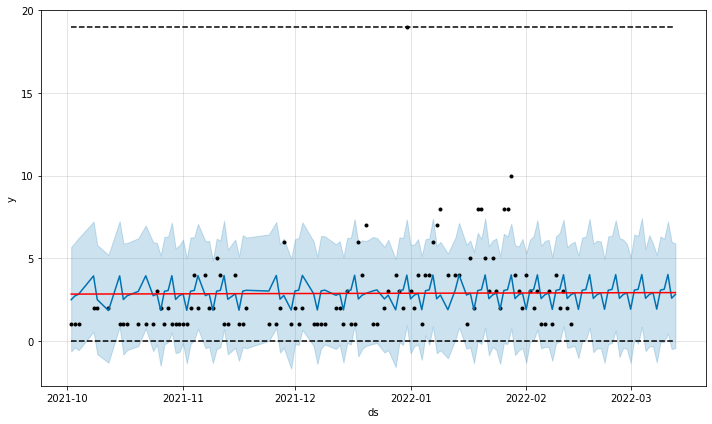

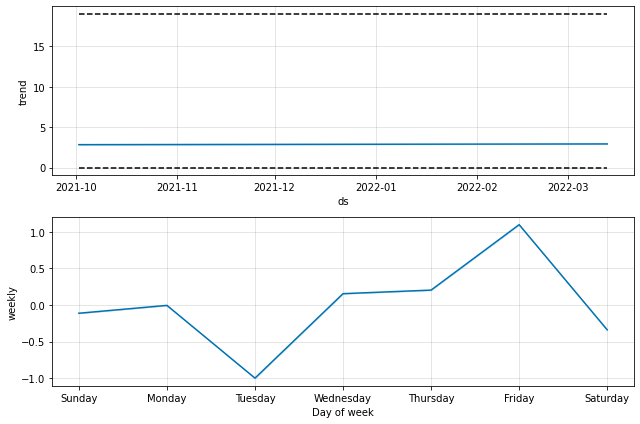

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -21.3736
Iteration  1. Log joint probability =    45.9967. Improved by 67.3704.
Iteration  2. Log joint probability =    57.2129. Improved by 11.2161.
Iteration  3. Log joint probability =    58.5458. Improved by 1.33289.
Iteration  4. Log joint probability =    59.2574. Improved by 0.711595.
Iteration  5. Log joint probability =    59.3306. Improved by 0.0732145.
Iteration  6. Log joint probability =    59.3407. Improved by 0.0101526.
Iteration  7. Log joint probability =    59.3426. Improved by 0.00189916.
Iteration  8. Log joint probability =    59.3567. Improved by 0.0141046.
Iteration  9. Log joint probability =    59.4499. Improved by 0.0932212.
Iteration 10. Log joint probability =    59.6102. Improved by 0.160227.
Iteration 11. Log joint probability =    59.6103. Improved by 0.000107251.
Iteration 12. Log joint probability =    59.6165. Improved by 0.00626134.
Iteration 13. Log joint probability =     59.637. Improved by 0.0204616.
Iteration 14.

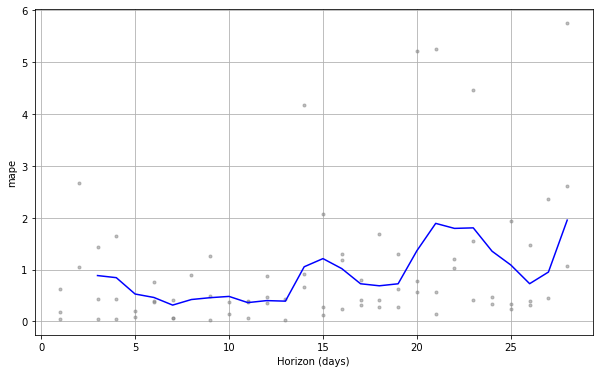

mape: 92.06%

1003183
      CategoryCode  ItemCode     DateID  DailySales
10482   category_4   1003183   1/1/2022           3
14740   category_4   1003183  1/10/2022           2
14600   category_4   1003183  1/12/2022           1
7377    category_4   1003183  1/13/2022           5
10456   category_4   1003183  1/16/2022           3
...            ...       ...        ...         ...
10694   category_4   1003183   2/5/2022           2
11216   category_4   1003183   2/6/2022           3
18814   category_4   1003183   2/7/2022           2
939     category_4   1003183   2/8/2022          14
468     category_4   1003183   2/9/2022           4

[95 rows x 4 columns]


Initial log joint probability = -58.8175
Iteration  1. Log joint probability =    50.5476. Improved by 109.365.
Iteration  2. Log joint probability =    85.6915. Improved by 35.1438.
Iteration  3. Log joint probability =    92.6664. Improved by 6.97493.
Iteration  4. Log joint probability =    99.9323. Improved by 7.26585.
Iter

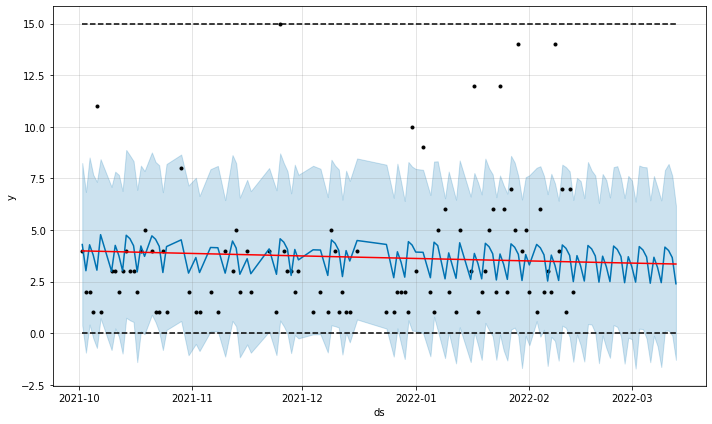

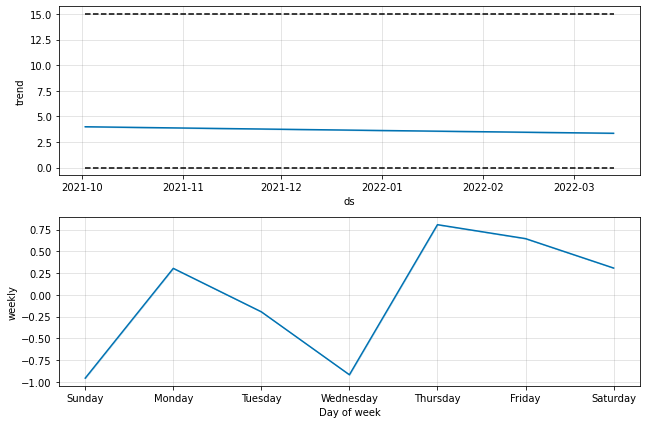

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -22.0507
Iteration  1. Log joint probability =    48.4743. Improved by 70.525.
Iteration  2. Log joint probability =    65.5005. Improved by 17.0262.
Iteration  3. Log joint probability =    66.6424. Improved by 1.14188.
Iteration  4. Log joint probability =    66.8777. Improved by 0.235349.
Iteration  5. Log joint probability =    66.8831. Improved by 0.00535619.
Iteration  6. Log joint probability =    66.9153. Improved by 0.0321682.
Iteration  7. Log joint probability =    66.9442. Improved by 0.028978.
Iteration  8. Log joint probability =    66.9682. Improved by 0.0239599.
Iteration  9. Log joint probability =    66.9798. Improved by 0.0115528.
Iteration 10. Log joint probability =    67.0391. Improved by 0.0593197.
Iteration 11. Log joint probability =    67.0539. Improved by 0.0148134.
Iteration 12. Log joint probability =    67.0579. Improved by 0.00397993.
Iteration 13. Log joint probability =    67.2033. Improved by 0.14544.
Iteration 14. Log 

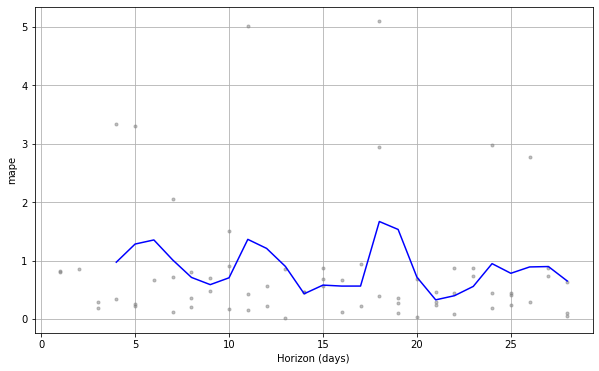

mape: 86.30%

1003192
      CategoryCode  ItemCode     DateID  DailySales
11244   category_4   1003192   1/1/2022          11
14379   category_4   1003192  1/10/2022           2
7373    category_4   1003192  1/11/2022           4
12679   category_4   1003192  1/12/2022           7
5653    category_4   1003192  1/13/2022          13
...            ...       ...        ...         ...
11522   category_4   1003192   2/5/2022           7
10744   category_4   1003192   2/6/2022           5
16128   category_4   1003192   2/7/2022          14
1266    category_4   1003192   2/8/2022          19
62      category_4   1003192   2/9/2022          11

[101 rows x 4 columns]

Initial log joint probability = -5.4578
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       98.0934   5.33682e-07       92.6394   6.343e-09       0.001      163  LS failed, Hessian reset 
      99       98.0934    5.7695e-08       88.4462           1           1      173   

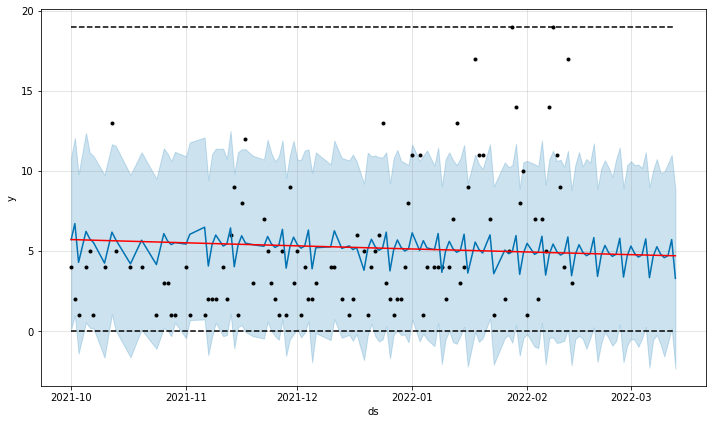

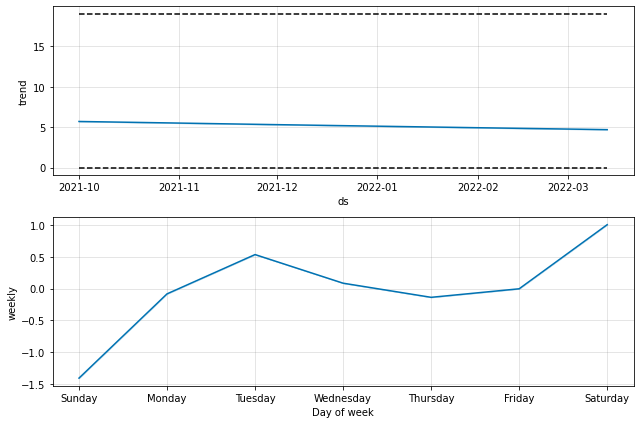

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -18.5021
Iteration  1. Log joint probability =    44.4314. Improved by 62.9335.
Iteration  2. Log joint probability =      55.46. Improved by 11.0286.
Iteration  3. Log joint probability =    57.1372. Improved by 1.67723.
Iteration  4. Log joint probability =    57.6147. Improved by 0.477484.
Iteration  5. Log joint probability =      58.33. Improved by 0.715297.
Iteration  6. Log joint probability =    58.3327. Improved by 0.00265023.
Iteration  7. Log joint probability =     58.345. Improved by 0.012298.
Iteration  8. Log joint probability =    58.3568. Improved by 0.011833.
Iteration  9. Log joint probability =    58.3629. Improved by 0.00606447.
Iteration 10. Log joint probability =    58.3637. Improved by 0.000814473.
Iteration 11. Log joint probability =    58.3645. Improved by 0.000821282.
Iteration 12. Log joint probability =    58.3649. Improved by 0.000375439.
Iteration 13. Log joint probability =     58.366. Improved by 0.00109503.
Iteration 

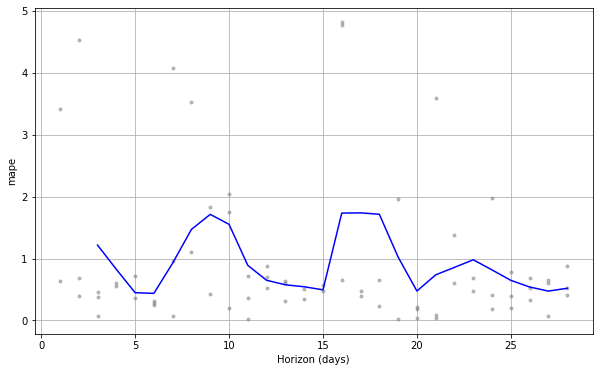

mape: 92.43%

1006090
      CategoryCode  ItemCode     DateID  DailySales
10368   category_2   1006090   1/1/2022           1
14682   category_2   1006090  1/10/2022           1
7668    category_2   1006090  1/11/2022           1
6558    category_2   1006090  1/13/2022           1
11278   category_2   1006090  1/14/2022           7
...            ...       ...        ...         ...
4465    category_2   1006090   2/3/2022           1
12024   category_2   1006090   2/5/2022           1
12260   category_2   1006090   2/6/2022           1
15932   category_2   1006090   2/7/2022           6
76      category_2   1006090   2/8/2022           5

[117 rows x 4 columns]

Initial log joint probability = -54.8027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       103.816   2.14784e-07       100.181      0.5986      0.5986      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       10

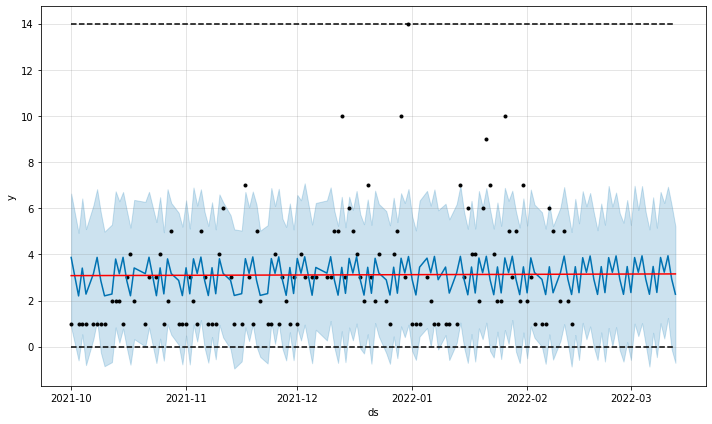

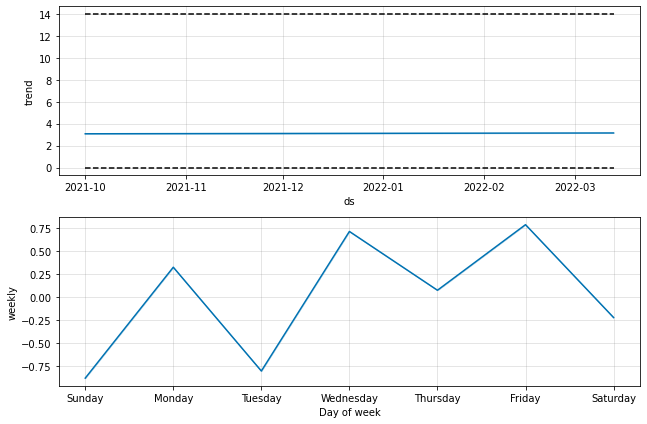

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -32.2413
Iteration  1. Log joint probability =    12.0976. Improved by 44.3389.
Iteration  2. Log joint probability =    67.0172. Improved by 54.9196.
Iteration  3. Log joint probability =     88.831. Improved by 21.8137.
Iteration  4. Log joint probability =    89.6335. Improved by 0.802513.
Iteration  5. Log joint probability =    90.6537. Improved by 1.02022.
Iteration  6. Log joint probability =    91.3783. Improved by 0.724643.
Iteration  7. Log joint probability =    91.6108. Improved by 0.232497.
Iteration  8. Log joint probability =    91.7535. Improved by 0.142656.
Iteration  9. Log joint probability =    91.7712. Improved by 0.0177368.
Iteration 10. Log joint probability =    91.8145. Improved by 0.0432446.
Iteration 11. Log joint probability =    91.8597. Improved by 0.0452397.
Iteration 12. Log joint probability =    91.8798. Improved by 0.0200939.
Iteration 13. Log joint probability =    91.8867. Improved by 0.00690451.
Iteration 14. Log jo

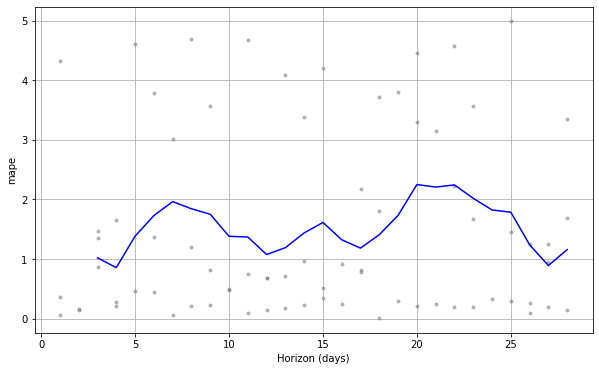

mape: 153.33%

1006099
      CategoryCode  ItemCode     DateID  DailySales
14521   category_2   1006099  1/10/2022           1
7221    category_2   1006099  1/11/2022           1
10149   category_2   1006099  1/14/2022           8
10205   category_2   1006099  1/16/2022           4
7623    category_2   1006099  1/17/2022           3
...            ...       ...        ...         ...
12510   category_2   1006099   2/2/2022           7
4020    category_2   1006099   2/3/2022           2
12275   category_2   1006099   2/5/2022          10
10558   category_2   1006099   2/6/2022           1
16034   category_2   1006099   2/7/2022           9

[67 rows x 4 columns]


Initial log joint probability = -32.3961
Iteration  1. Log joint probability =    58.5645. Improved by 90.9605.
Iteration  2. Log joint probability =      70.37. Improved by 11.8055.
Iteration  3. Log joint probability =    70.9616. Improved by 0.591576.
Iteration  4. Log joint probability =    70.9938. Improved by 0.0322058.


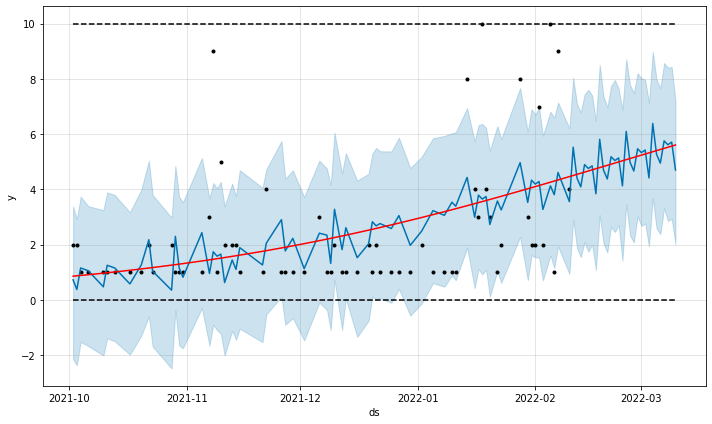

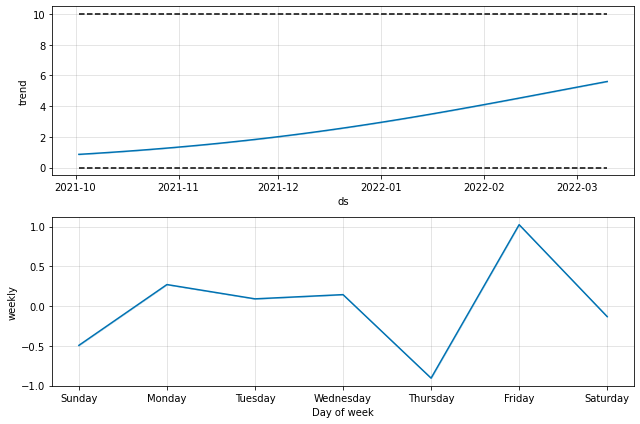

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -3.69412
Iteration  1. Log joint probability =    25.2967. Improved by 28.9908.
Iteration  2. Log joint probability =      45.59. Improved by 20.2933.
Iteration  3. Log joint probability =    46.2247. Improved by 0.63473.
Iteration  4. Log joint probability =    48.3444. Improved by 2.11975.
Iteration  5. Log joint probability =    48.3872. Improved by 0.0427201.
Iteration  6. Log joint probability =    48.7682. Improved by 0.381017.
Iteration  7. Log joint probability =    48.7753. Improved by 0.00716256.
Iteration  8. Log joint probability =     48.783. Improved by 0.00763791.
Iteration  9. Log joint probability =     48.789. Improved by 0.00600876.
Iteration 10. Log joint probability =    48.7909. Improved by 0.00190275.
Iteration 11. Log joint probability =    48.7917. Improved by 0.000817349.
Iteration 12. Log joint probability =    48.7932. Improved by 0.00148261.
Iteration 13. Log joint probability =    48.7937. Improved by 0.00054218.
Iteration 

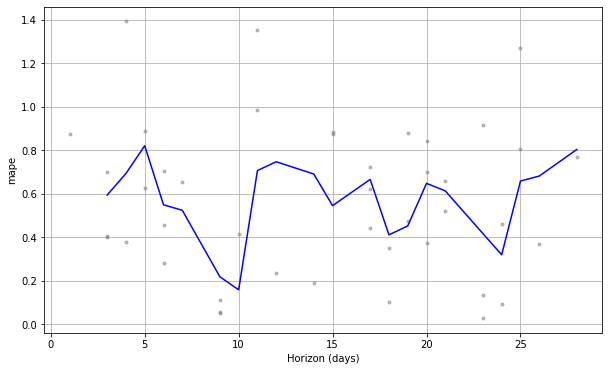

mape: 56.80%

1021264
      CategoryCode  ItemCode     DateID  DailySales
10057   category_1   1021264   1/1/2022           4
12668   category_1   1021264  1/10/2022           3
7263    category_1   1021264  1/11/2022           2
14756   category_1   1021264  1/12/2022           2
7163    category_1   1021264  1/13/2022           1
...            ...       ...        ...         ...
10505   category_1   1021264   2/4/2022           1
10714   category_1   1021264   2/5/2022           4
12241   category_1   1021264   2/6/2022           1
16313   category_1   1021264   2/7/2022           2
1944    category_1   1021264   2/8/2022           1

[75 rows x 4 columns]


Initial log joint probability = -39.5668
Iteration  1. Log joint probability =    84.9555. Improved by 124.522.
Iteration  2. Log joint probability =    101.271. Improved by 16.315.
Iteration  3. Log joint probability =    101.513. Improved by 0.242059.
Iteration  4. Log joint probability =    101.931. Improved by 0.418714.
Ite

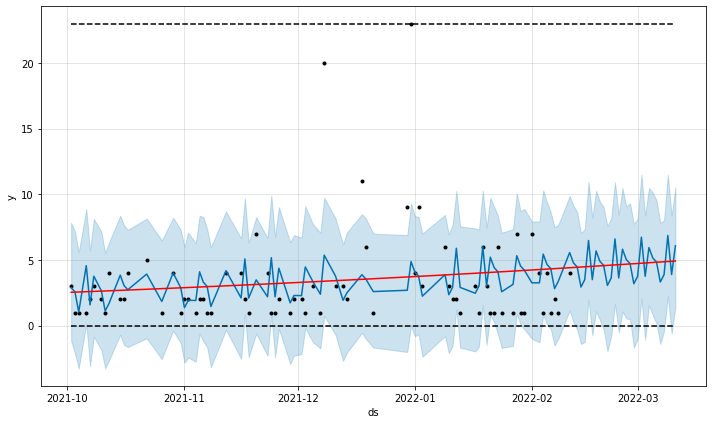

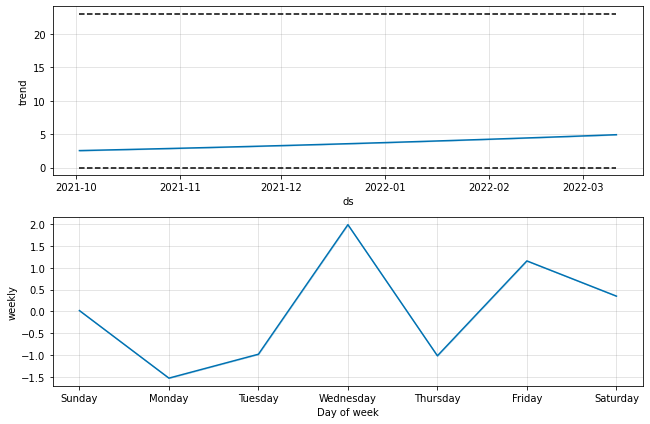

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -8.5008
Iteration  1. Log joint probability =    41.7416. Improved by 50.2424.
Iteration  2. Log joint probability =    57.5819. Improved by 15.8403.
Iteration  3. Log joint probability =    59.8403. Improved by 2.25836.
Iteration  4. Log joint probability =    60.3263. Improved by 0.485976.
Iteration  5. Log joint probability =     60.802. Improved by 0.475738.
Iteration  6. Log joint probability =    60.8189. Improved by 0.016853.
Iteration  7. Log joint probability =    60.8436. Improved by 0.0247232.
Iteration  8. Log joint probability =    60.8575. Improved by 0.0138871.
Iteration  9. Log joint probability =    60.8849. Improved by 0.0274037.
Iteration 10. Log joint probability =     60.889. Improved by 0.00410504.
Iteration 11. Log joint probability =    60.8914. Improved by 0.00244302.
Iteration 12. Log joint probability =    60.8968. Improved by 0.00532739.
Iteration 13. Log joint probability =    60.8989. Improved by 0.00218894.
Iteration 14. L

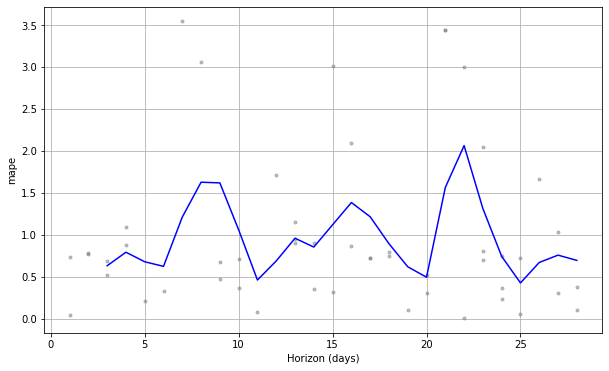

mape: 96.75%

1024810
      CategoryCode  ItemCode     DateID  DailySales
10333   category_4   1024810   1/1/2022          16
5347    category_4   1024810  1/11/2022           2
13908   category_4   1024810  1/12/2022           8
6706    category_4   1024810  1/13/2022          12
11186   category_4   1024810  1/14/2022           7
...            ...       ...        ...         ...
18994   category_4   1024810  12/8/2021           3
81      category_4   1024810  12/9/2021           2
14108   category_4   1024810   2/1/2022          35
10443   category_4   1024810  2/13/2022          21
13728   category_4   1024810   2/2/2022          49

[108 rows x 4 columns]

Initial log joint probability = -4.20346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81        143.85    7.0474e-09       96.6589      0.5404      0.5404      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE

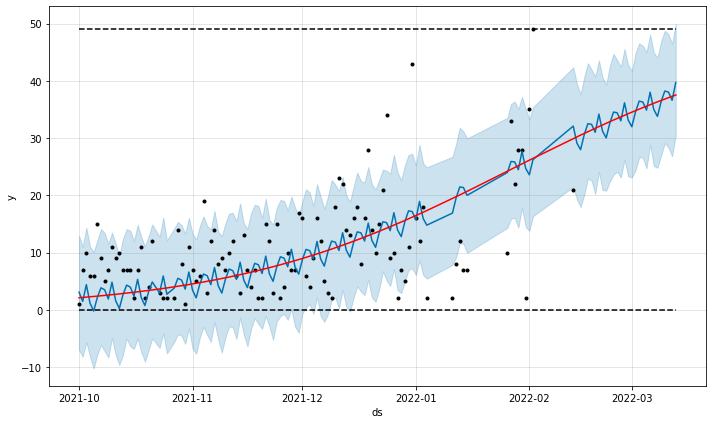

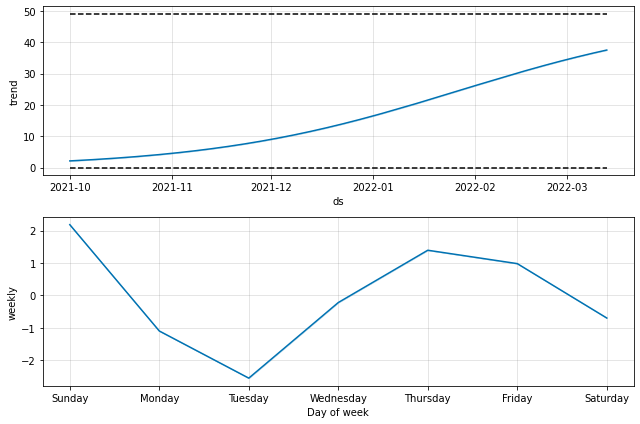

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -43.9483
Iteration  1. Log joint probability =    56.2483. Improved by 100.197.
Iteration  2. Log joint probability =     59.234. Improved by 2.98571.
Iteration  3. Log joint probability =    83.1549. Improved by 23.9208.
Iteration  4. Log joint probability =     83.159. Improved by 0.00418383.
Iteration  5. Log joint probability =     83.174. Improved by 0.0149233.
Iteration  6. Log joint probability =    83.2321. Improved by 0.058187.
Iteration  7. Log joint probability =     83.251. Improved by 0.0188602.
Iteration  8. Log joint probability =    83.3329. Improved by 0.0819223.
Iteration  9. Log joint probability =    83.3405. Improved by 0.00759728.
Iteration 10. Log joint probability =    83.4098. Improved by 0.0693041.
Iteration 11. Log joint probability =    83.4958. Improved by 0.0859741.
Iteration 12. Log joint probability =    83.5136. Improved by 0.0177864.
Iteration 13. Log joint probability =    83.5758. Improved by 0.0621801.
Iteration 14. 

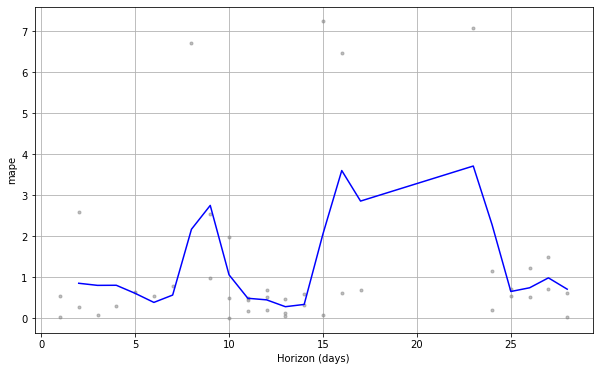

mape: 132.78%

1032532
      CategoryCode  ItemCode     DateID  DailySales
10719   category_1   1032532   1/1/2022          30
13756   category_1   1032532  1/10/2022           9
6574    category_1   1032532  1/11/2022          17
14023   category_1   1032532  1/12/2022           7
5616    category_1   1032532  1/13/2022          30
...            ...       ...        ...         ...
10237   category_1   1032532   2/5/2022           8
11165   category_1   1032532   2/6/2022          38
15336   category_1   1032532   2/7/2022          13
1362    category_1   1032532   2/8/2022          12
353     category_1   1032532   2/9/2022           8

[135 rows x 4 columns]

Initial log joint probability = -12.7343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       175.545   0.000502621        99.876   5.486e-06       0.001      125  LS failed, Hessian reset 
      99       175.582   1.59301e-06       78.7013      0.7291      0.7291      156 

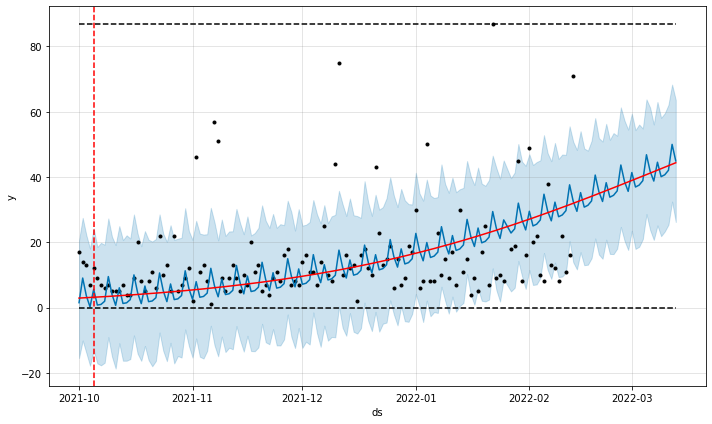

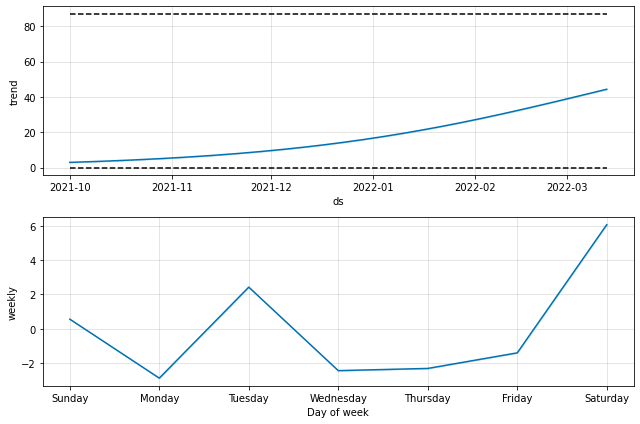

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -43.9244
Iteration  1. Log joint probability =    94.8724. Improved by 138.797.
Iteration  2. Log joint probability =     103.01. Improved by 8.13764.
Iteration  3. Log joint probability =    104.443. Improved by 1.43307.
Iteration  4. Log joint probability =    104.814. Improved by 0.371184.
Iteration  5. Log joint probability =    104.844. Improved by 0.0297665.
Iteration  6. Log joint probability =    104.878. Improved by 0.034311.
Iteration  7. Log joint probability =    104.898. Improved by 0.0198332.
Iteration  8. Log joint probability =    104.906. Improved by 0.00736411.
Iteration  9. Log joint probability =    104.912. Improved by 0.00615176.
Iteration 10. Log joint probability =    104.913. Improved by 0.000816505.
Iteration 11. Log joint probability =    104.913. Improved by 0.000430949.
Iteration 12. Log joint probability =    104.915. Improved by 0.00240121.
Iteration 13. Log joint probability =    104.921. Improved by 0.00607525.
Iteration

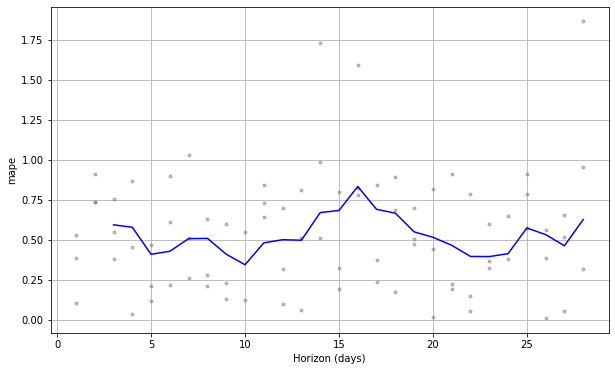

mape: 52.72%

1032559
      CategoryCode  ItemCode     DateID  DailySales
10045   category_1   1032559   1/1/2022           1
12379   category_1   1032559  1/10/2022           5
5909    category_1   1032559  1/11/2022           3
12971   category_1   1032559  1/12/2022           4
6304    category_1   1032559  1/13/2022           2
...            ...       ...        ...         ...
10010   category_1   1032559   2/5/2022           5
10986   category_1   1032559   2/6/2022           5
15283   category_1   1032559   2/7/2022           3
1687    category_1   1032559   2/8/2022           3
1017    category_1   1032559   2/9/2022           2

[115 rows x 4 columns]

Initial log joint probability = -27.0594
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66        145.66   4.74051e-06       97.7895   4.751e-08       0.001      129  LS failed, Hessian reset 
      86        145.66   7.02859e-09       96.0146      0.2899      0.2899      156  

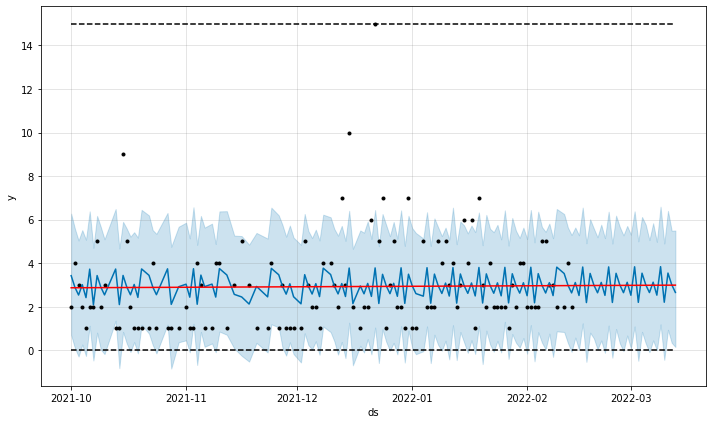

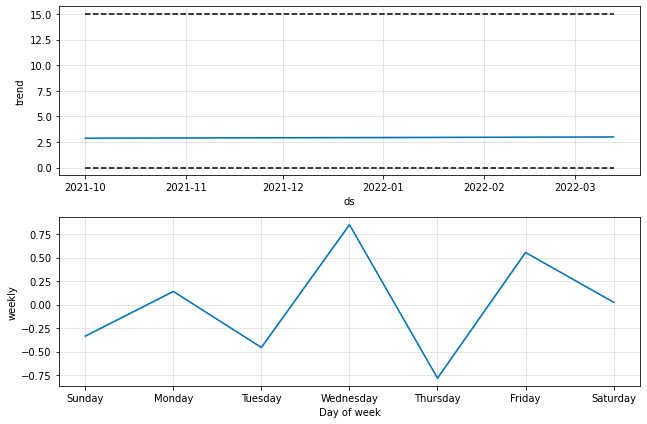

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -49.9431
Iteration  1. Log joint probability =    32.7571. Improved by 82.7002.
Iteration  2. Log joint probability =    46.7192. Improved by 13.9621.
Iteration  3. Log joint probability =    54.2285. Improved by 7.5093.
Iteration  4. Log joint probability =    55.9437. Improved by 1.71517.
Iteration  5. Log joint probability =    55.9525. Improved by 0.00880355.
Iteration  6. Log joint probability =    55.9636. Improved by 0.0111826.
Iteration  7. Log joint probability =     55.974. Improved by 0.0103459.
Iteration  8. Log joint probability =    55.9802. Improved by 0.0062077.
Iteration  9. Log joint probability =    55.9922. Improved by 0.012033.
Iteration 10. Log joint probability =    55.9974. Improved by 0.00520895.
Iteration 11. Log joint probability =     56.001. Improved by 0.00359623.
Iteration 12. Log joint probability =    56.0385. Improved by 0.0374579.
Iteration 13. Log joint probability =    56.0468. Improved by 0.00835262.
Iteration 14. L

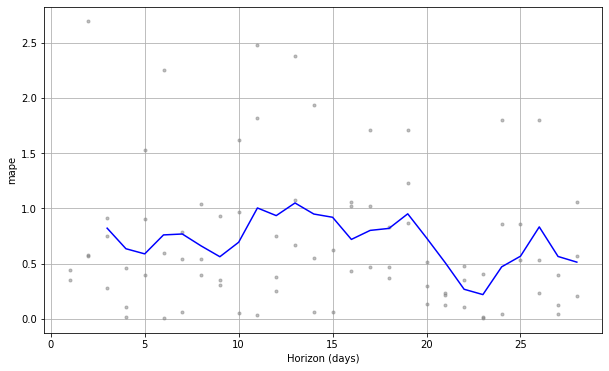

mape: 70.33%

1032568
      CategoryCode  ItemCode     DateID  DailySales
11839   category_1   1032568   1/1/2022           1
14397   category_1   1032568  1/10/2022           1
10848   category_1   1032568  1/15/2022          11
11533   category_1   1032568  1/16/2022           5
6160    category_1   1032568  1/17/2022           5
...            ...       ...        ...         ...
4865    category_1   1032568   2/3/2022           2
11697   category_1   1032568   2/4/2022           1
11967   category_1   1032568   2/6/2022           1
723     category_1   1032568   2/8/2022           1
663     category_1   1032568   2/9/2022           2

[79 rows x 4 columns]


Initial log joint probability = -58.345
Iteration  1. Log joint probability =    3.41466. Improved by 61.7596.
Iteration  2. Log joint probability =    22.2932. Improved by 18.8785.
Iteration  3. Log joint probability =    100.336. Improved by 78.0428.
Iteration  4. Log joint probability =    100.519. Improved by 0.1831.
Iterat

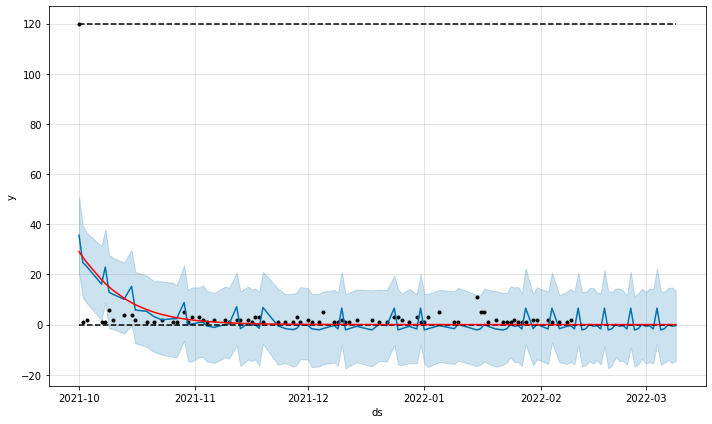

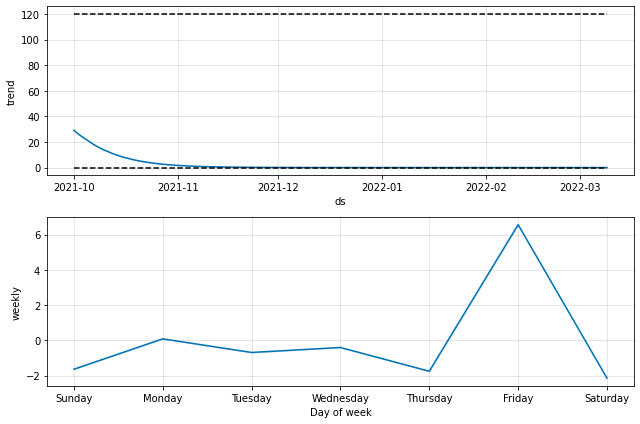

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -21.0063
Iteration  1. Log joint probability =   -2.01965. Improved by 18.9867.
Iteration  2. Log joint probability =    16.5757. Improved by 18.5953.
Iteration  3. Log joint probability =    41.3316. Improved by 24.7559.
Iteration  4. Log joint probability =    61.0419. Improved by 19.7102.
Iteration  5. Log joint probability =    65.9725. Improved by 4.9306.
Iteration  6. Log joint probability =    67.3778. Improved by 1.40537.
Iteration  7. Log joint probability =    67.6697. Improved by 0.291846.
Iteration  8. Log joint probability =    67.9268. Improved by 0.257163.
Iteration  9. Log joint probability =    68.2718. Improved by 0.344941.
Iteration 10. Log joint probability =    68.2752. Improved by 0.00342083.
Iteration 11. Log joint probability =    68.3201. Improved by 0.0448859.
Iteration 12. Log joint probability =    68.3593. Improved by 0.0391966.
Iteration 13. Log joint probability =    68.3832. Improved by 0.0238849.
Iteration 14. Log joint 

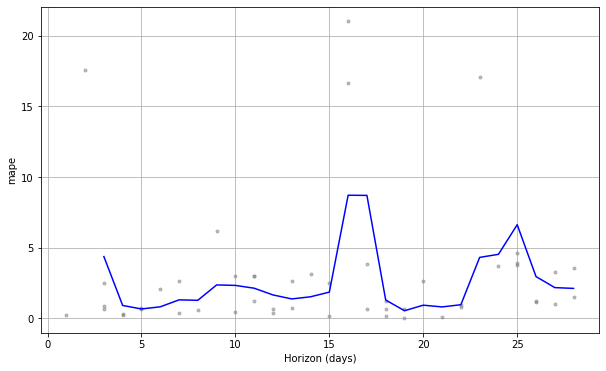

mape: 257.09%

1044610
      CategoryCode  ItemCode     DateID  DailySales
11144   category_1   1044610   1/1/2022           2
13122   category_1   1044610  1/10/2022           2
6693    category_1   1044610  1/11/2022           6
14347   category_1   1044610  1/12/2022           2
6312    category_1   1044610  1/13/2022           2
...            ...       ...        ...         ...
13629   category_1   1044610   2/2/2022           5
3857    category_1   1044610   2/3/2022           1
12091   category_1   1044610   2/4/2022           1
10592   category_1   1044610   2/6/2022           2
14942   category_1   1044610   2/7/2022           3

[97 rows x 4 columns]


Initial log joint probability = -62.088
Iteration  1. Log joint probability =    13.2842. Improved by 75.3722.
Iteration  2. Log joint probability =     71.871. Improved by 58.5869.
Iteration  3. Log joint probability =     89.717. Improved by 17.846.
Iteration  4. Log joint probability =    89.7379. Improved by 0.0208527.
Ite

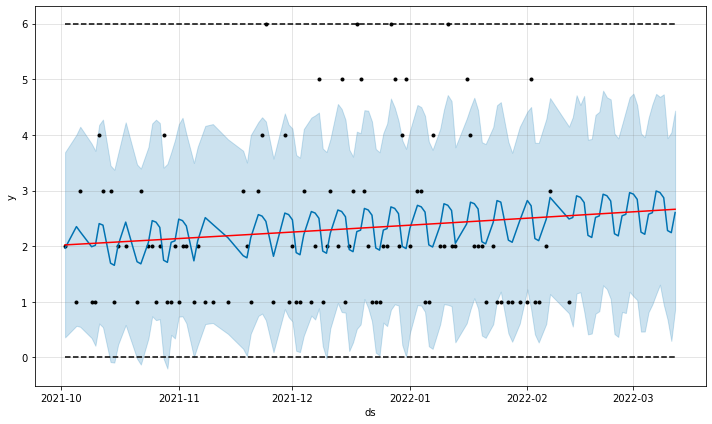

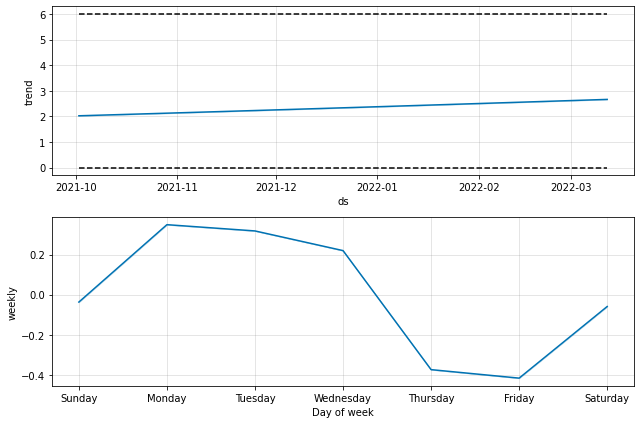

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -26.4633
Iteration  1. Log joint probability =    38.4909. Improved by 64.9541.
Iteration  2. Log joint probability =    51.1454. Improved by 12.6545.
Iteration  3. Log joint probability =    55.4966. Improved by 4.35119.
Iteration  4. Log joint probability =    55.5064. Improved by 0.0098238.
Iteration  5. Log joint probability =    55.5583. Improved by 0.0519004.
Iteration  6. Log joint probability =    55.5842. Improved by 0.0258557.
Iteration  7. Log joint probability =    55.6205. Improved by 0.0363063.
Iteration  8. Log joint probability =    55.6467. Improved by 0.0261943.
Iteration  9. Log joint probability =    55.6664. Improved by 0.0197533.
Iteration 10. Log joint probability =      55.78. Improved by 0.113553.
Iteration 11. Log joint probability =    55.8386. Improved by 0.0586507.
Iteration 12. Log joint probability =    55.8964. Improved by 0.0578048.
Iteration 13. Log joint probability =    55.9135. Improved by 0.0171246.
Iteration 14. Lo

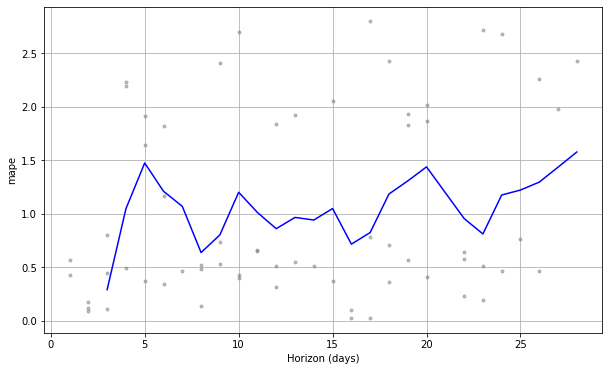

mape: 105.93%

1044691
      CategoryCode  ItemCode     DateID  DailySales
11735   category_1   1044691   1/1/2022           2
12912   category_1   1044691  1/10/2022           4
6349    category_1   1044691  1/11/2022          10
5908    category_1   1044691  1/13/2022           5
10948   category_1   1044691  1/15/2022           2
...            ...       ...        ...         ...
11939   category_1   1044691   2/5/2022           3
10528   category_1   1044691   2/6/2022          11
18948   category_1   1044691   2/7/2022           4
475     category_1   1044691   2/8/2022           2
40      category_1   1044691   2/9/2022           2

[105 rows x 4 columns]

Initial log joint probability = -4.00792
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       127.275   1.47532e-05       79.2035           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       1

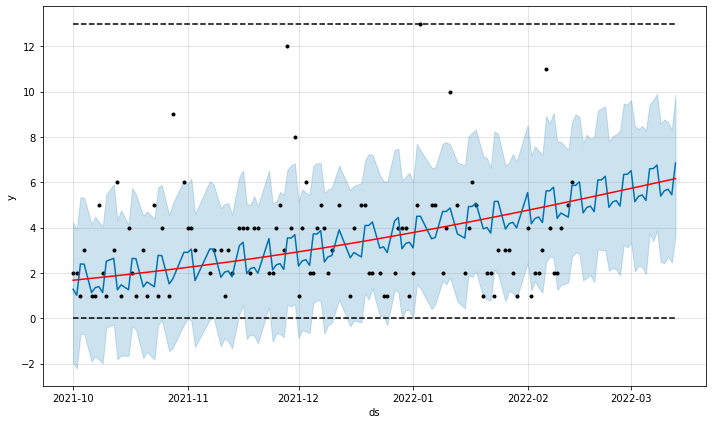

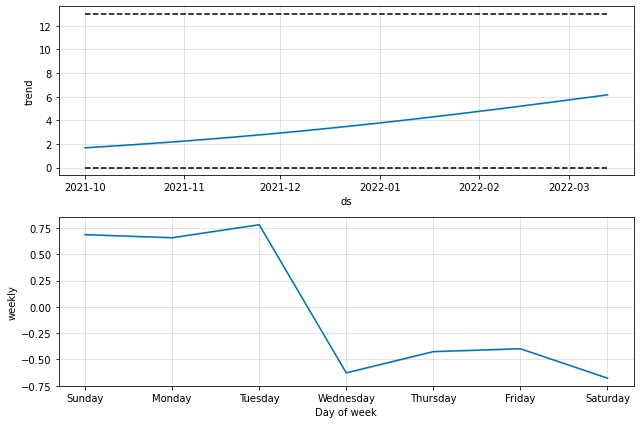

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -26.0361
Iteration  1. Log joint probability =    57.8827. Improved by 83.9188.
Iteration  2. Log joint probability =    80.7146. Improved by 22.8319.
Iteration  3. Log joint probability =    80.7824. Improved by 0.0677868.
Iteration  4. Log joint probability =    80.8591. Improved by 0.076696.
Iteration  5. Log joint probability =     80.942. Improved by 0.0829045.
Iteration  6. Log joint probability =    80.9539. Improved by 0.0118772.
Iteration  7. Log joint probability =     80.958. Improved by 0.00410067.
Iteration  8. Log joint probability =    80.9611. Improved by 0.00313581.
Iteration  9. Log joint probability =    80.9629. Improved by 0.00180649.
Iteration 10. Log joint probability =    80.9635. Improved by 0.000581545.
Iteration 11. Log joint probability =    80.9638. Improved by 0.00028138.
Iteration 12. Log joint probability =    80.9638. Improved by 2.25153e-05.
Iteration 13. Log joint probability =     80.964. Improved by 0.000220111.
Iter

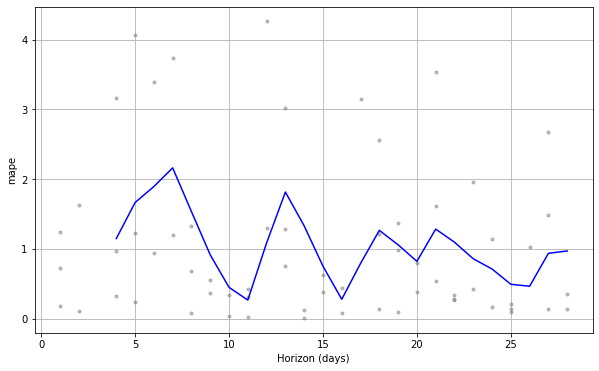

mape: 104.05%

1047967
      CategoryCode  ItemCode     DateID  DailySales
10469   category_1   1047967   1/1/2022          13
12670   category_1   1047967  1/10/2022           8
6177    category_1   1047967  1/11/2022          13
13364   category_1   1047967  1/12/2022          15
6675    category_1   1047967  1/13/2022          63
...            ...       ...        ...         ...
11308   category_1   1047967   2/5/2022           6
11406   category_1   1047967   2/6/2022           9
15542   category_1   1047967   2/7/2022          15
301     category_1   1047967   2/8/2022          12
447     category_1   1047967   2/9/2022          12

[136 rows x 4 columns]

Initial log joint probability = -27.6707
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       214.341   3.91374e-06       99.0509   3.918e-08       0.001      153  LS failed, Hessian reset 
      99       214.341   3.66256e-07       99.7165           1           1      174 

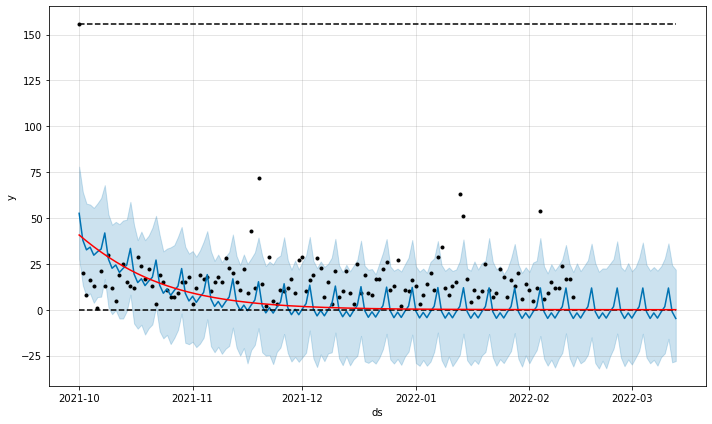

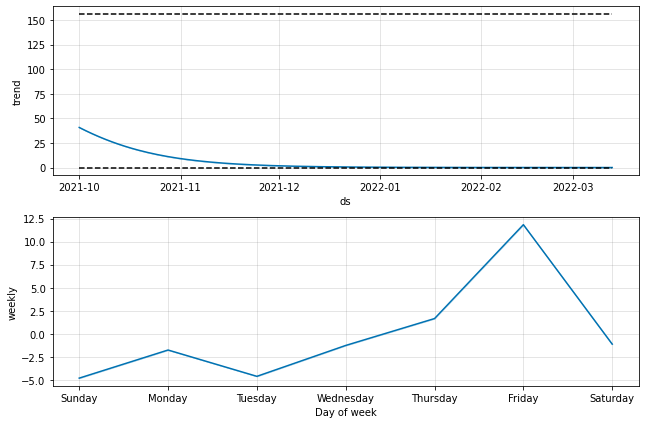

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -58.414
Iteration  1. Log joint probability =    84.4243. Improved by 142.838.
Iteration  2. Log joint probability =    118.877. Improved by 34.4523.
Iteration  3. Log joint probability =    121.093. Improved by 2.21622.
Iteration  4. Log joint probability =    131.075. Improved by 9.98182.
Iteration  5. Log joint probability =    131.085. Improved by 0.0106115.
Iteration  6. Log joint probability =    131.091. Improved by 0.00530342.
Iteration  7. Log joint probability =    131.128. Improved by 0.0379404.
Iteration  8. Log joint probability =    131.138. Improved by 0.00947017.
Iteration  9. Log joint probability =    131.155. Improved by 0.016886.
Iteration 10. Log joint probability =    131.163. Improved by 0.00843703.
Iteration 11. Log joint probability =    131.186. Improved by 0.0226665.
Iteration 12. Log joint probability =    131.245. Improved by 0.0587969.
Iteration 13. Log joint probability =    131.247. Improved by 0.00262179.
Iteration 14. L

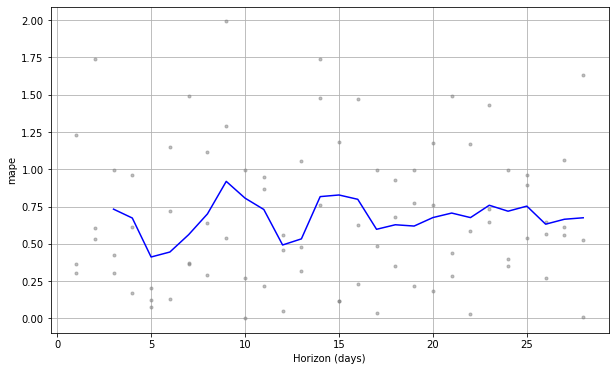

mape: 67.54%

1049776
      CategoryCode  ItemCode     DateID  DailySales
11875   category_1   1049776   1/1/2022           1
6403    category_1   1049776  1/11/2022           3
14772   category_1   1049776  1/12/2022           2
6672    category_1   1049776  1/13/2022           3
10103   category_1   1049776  1/14/2022           4
...            ...       ...        ...         ...
11963   category_1   1049776   2/5/2022           1
11095   category_1   1049776   2/6/2022           5
15363   category_1   1049776   2/7/2022          12
1810    category_1   1049776   2/8/2022           1
881     category_1   1049776   2/9/2022           3

[116 rows x 4 columns]

Initial log joint probability = -32.9746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       113.742   7.60577e-09       86.5971      0.1768      0.1768      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE

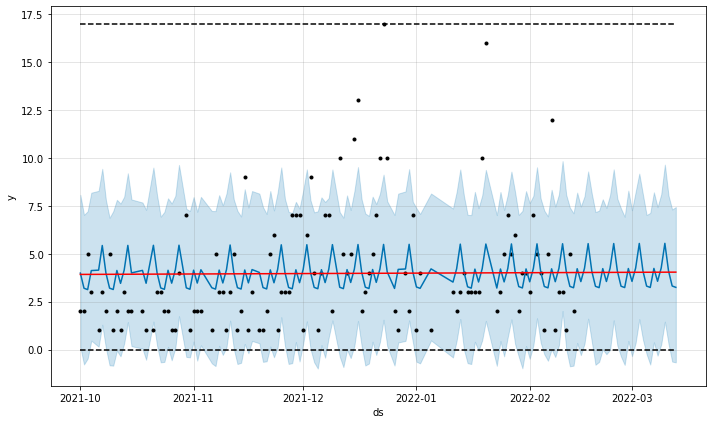

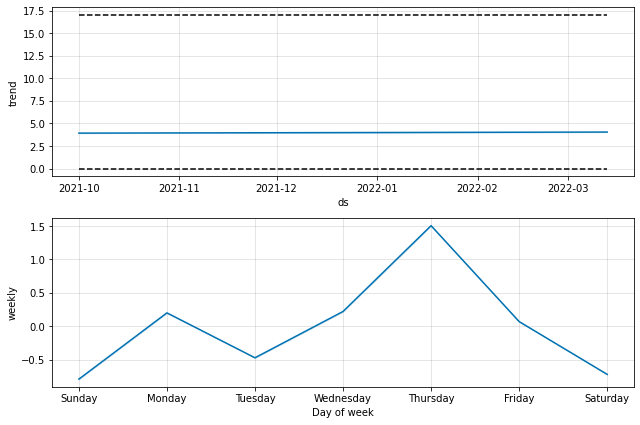

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -35.7241
Iteration  1. Log joint probability =    70.5129. Improved by 106.237.
Iteration  2. Log joint probability =    84.2521. Improved by 13.7392.
Iteration  3. Log joint probability =     84.814. Improved by 0.561898.
Iteration  4. Log joint probability =    85.6621. Improved by 0.848078.
Iteration  5. Log joint probability =    85.6765. Improved by 0.0144394.
Iteration  6. Log joint probability =     85.747. Improved by 0.070504.
Iteration  7. Log joint probability =    86.0633. Improved by 0.31624.
Iteration  8. Log joint probability =    86.1707. Improved by 0.10745.
Iteration  9. Log joint probability =    86.2473. Improved by 0.0765817.
Iteration 10. Log joint probability =    87.3676. Improved by 1.12029.
Iteration 11. Log joint probability =    87.5183. Improved by 0.150732.
Iteration 12. Log joint probability =    87.5746. Improved by 0.0562806.
Iteration 13. Log joint probability =    87.7275. Improved by 0.152876.
Iteration 14. Log joint 

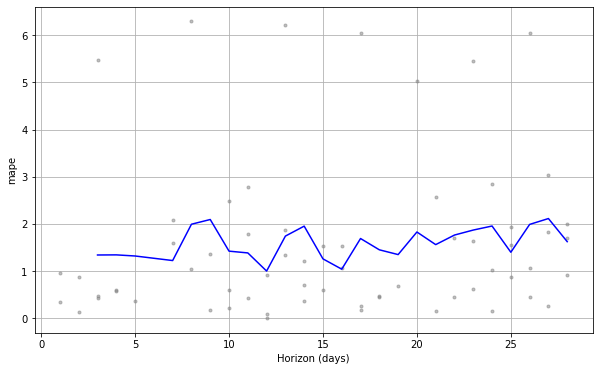

mape: 158.70%

1054978
      CategoryCode  ItemCode     DateID  DailySales
11669   category_1   1054978   1/1/2022           4
13314   category_1   1054978  1/10/2022           7
5600    category_1   1054978  1/11/2022          12
12578   category_1   1054978  1/12/2022          22
6598    category_1   1054978  1/13/2022          14
...            ...       ...        ...         ...
10727   category_1   1054978   2/5/2022           7
11639   category_1   1054978   2/6/2022          11
15010   category_1   1054978   2/7/2022           7
16      category_1   1054978   2/8/2022           7
1282    category_1   1054978   2/9/2022          12

[132 rows x 4 columns]

Initial log joint probability = -6.68144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       173.165   2.79767e-05       103.282   2.867e-07       0.001      147  LS failed, Hessian reset 
      99       173.167   5.83222e-07       94.6757      0.2435           1      169 

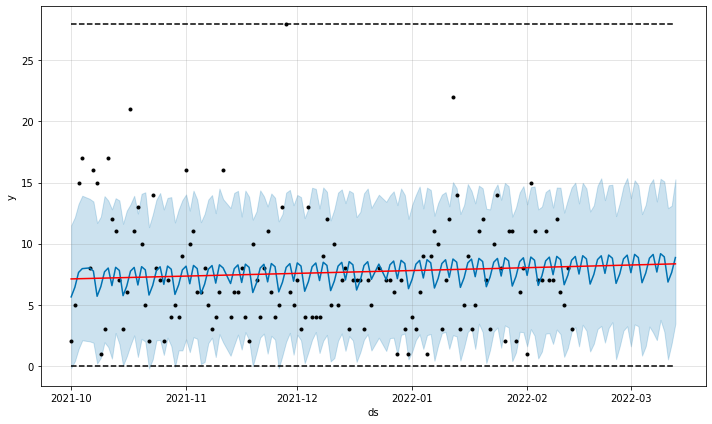

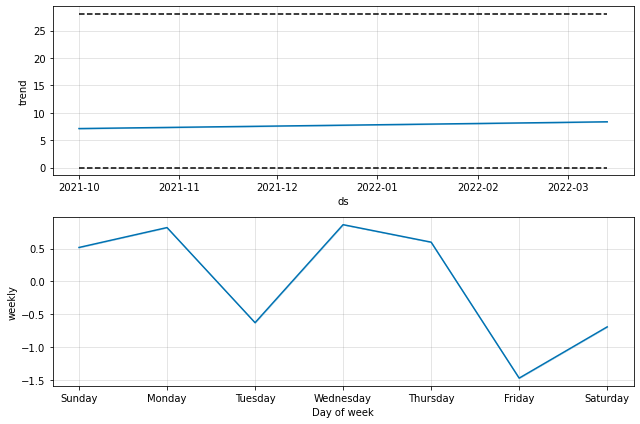

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -44.0246
Iteration  1. Log joint probability =     39.465. Improved by 83.4896.
Iteration  2. Log joint probability =    52.7397. Improved by 13.2748.
Iteration  3. Log joint probability =    64.4504. Improved by 11.7106.
Iteration  4. Log joint probability =    64.4547. Improved by 0.0043509.
Iteration  5. Log joint probability =      64.46. Improved by 0.00532125.
Iteration  6. Log joint probability =    64.4716. Improved by 0.0115281.
Iteration  7. Log joint probability =    64.4915. Improved by 0.0199305.
Iteration  8. Log joint probability =    64.5317. Improved by 0.0401791.
Iteration  9. Log joint probability =    64.5629. Improved by 0.0312604.
Iteration 10. Log joint probability =    64.6009. Improved by 0.0379226.
Iteration 11. Log joint probability =    64.6045. Improved by 0.00363532.
Iteration 12. Log joint probability =    64.7937. Improved by 0.189156.
Iteration 13. Log joint probability =    64.8435. Improved by 0.0498682.
Iteration 14. 

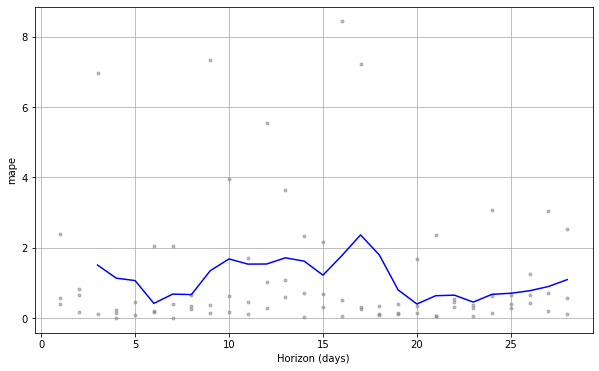

mape: 112.39%

1056463
      CategoryCode  ItemCode     DateID  DailySales
10870   category_1   1056463   1/1/2022           1
6623    category_1   1056463  1/11/2022          11
13401   category_1   1056463  1/12/2022           3
5530    category_1   1056463  1/13/2022           9
10102   category_1   1056463  1/14/2022           6
...            ...       ...        ...         ...
10551   category_1   1056463   2/4/2022           3
11549   category_1   1056463   2/5/2022          95
15133   category_1   1056463   2/7/2022           3
654     category_1   1056463   2/8/2022           6
1689    category_1   1056463   2/9/2022           2

[130 rows x 4 columns]

Initial log joint probability = -3.72327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72        210.54   4.83772e-06       101.309   4.792e-08       0.001      138  LS failed, Hessian reset 
      99       210.541   2.45195e-08       98.5308      0.6084      0.6084      174 

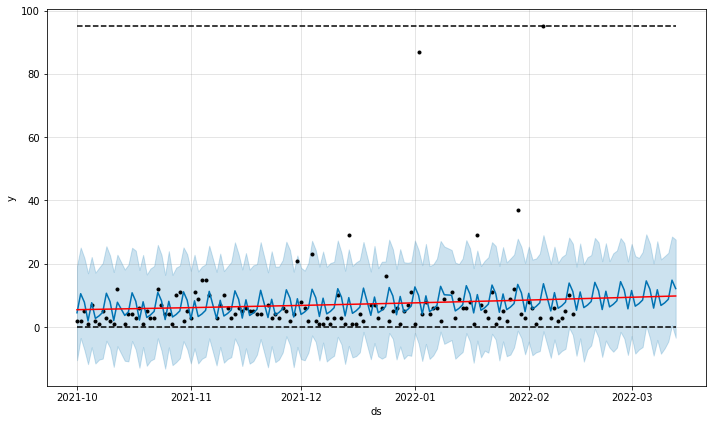

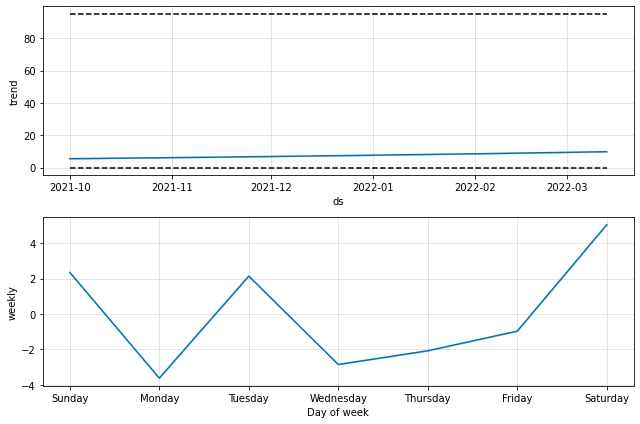

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -162.544
Iteration  1. Log joint probability =   -118.673. Improved by 43.871.
Iteration  2. Log joint probability =   -67.0618. Improved by 51.6116.
Iteration  3. Log joint probability =   -44.7571. Improved by 22.3047.
Iteration  4. Log joint probability =    51.6737. Improved by 96.4308.
Iteration  5. Log joint probability =    80.1092. Improved by 28.4355.
Iteration  6. Log joint probability =    90.9697. Improved by 10.8605.
Iteration  7. Log joint probability =    91.0078. Improved by 0.0380807.
Iteration  8. Log joint probability =    91.0089. Improved by 0.00110031.
Iteration  9. Log joint probability =    91.0274. Improved by 0.0185421.
Iteration 10. Log joint probability =    91.0455. Improved by 0.0180768.
Iteration 11. Log joint probability =    91.0633. Improved by 0.0178471.
Iteration 12. Log joint probability =    91.0988. Improved by 0.0354585.
Iteration 13. Log joint probability =    91.1165. Improved by 0.0177249.
Iteration 14. Log joi

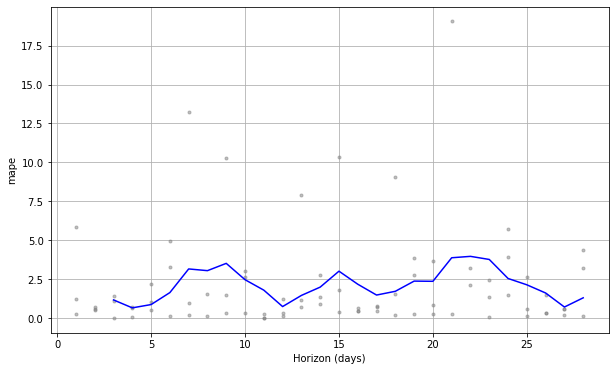

mape: 214.76%

1060630
      CategoryCode  ItemCode     DateID  DailySales
11220   category_3   1060630   1/1/2022           5
12844   category_3   1060630  1/10/2022           7
7005    category_3   1060630  1/11/2022           5
14764   category_3   1060630  1/12/2022           4
6605    category_3   1060630  1/13/2022           2
...            ...       ...        ...         ...
4444    category_3   1060630   2/3/2022           7
10141   category_3   1060630   2/4/2022           4
10629   category_3   1060630   2/5/2022           4
9996    category_3   1060630   2/6/2022           5
340     category_3   1060630   2/9/2022           5

[126 rows x 4 columns]

Initial log joint probability = -4.7996
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         141.7   1.39196e-05       89.4897      0.4964      0.4964      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       14

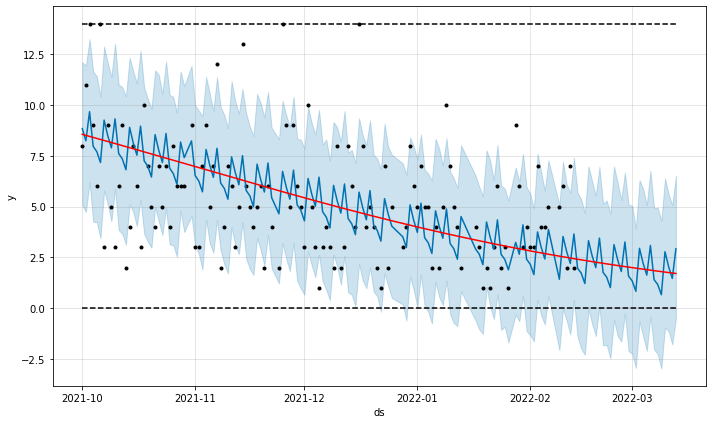

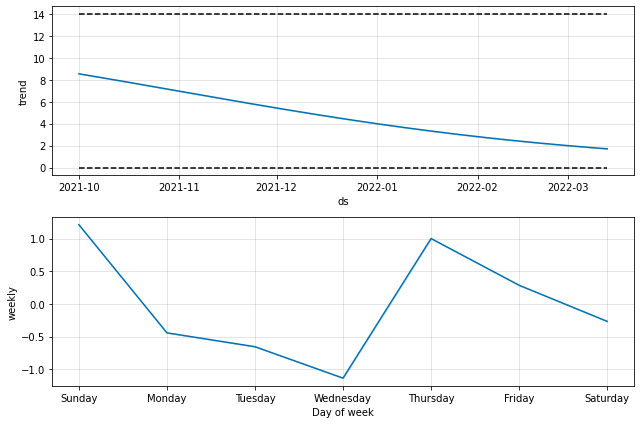

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -42.6289
Iteration  1. Log joint probability =     70.024. Improved by 112.653.
Iteration  2. Log joint probability =    81.0896. Improved by 11.0656.
Iteration  3. Log joint probability =    81.8689. Improved by 0.779248.
Iteration  4. Log joint probability =    81.9501. Improved by 0.0811955.
Iteration  5. Log joint probability =    81.9602. Improved by 0.010141.
Iteration  6. Log joint probability =    82.0387. Improved by 0.0784489.
Iteration  7. Log joint probability =    82.0758. Improved by 0.0371048.
Iteration  8. Log joint probability =    82.0992. Improved by 0.0234584.
Iteration  9. Log joint probability =    82.3531. Improved by 0.253828.
Iteration 10. Log joint probability =    82.3782. Improved by 0.025088.
Iteration 11. Log joint probability =    83.0054. Improved by 0.627226.
Iteration 12. Log joint probability =    83.0084. Improved by 0.00304177.
Iteration 13. Log joint probability =    83.0199. Improved by 0.0115261.
Iteration 14. Log

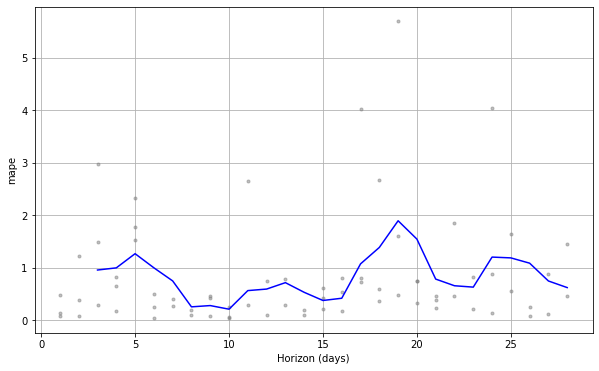

mape: 83.39%

1061341
      CategoryCode  ItemCode     DateID  DailySales
11981   category_1   1061341   1/1/2022           6
7632    category_1   1061341  1/11/2022           7
12725   category_1   1061341  1/12/2022           2
5751    category_1   1061341  1/13/2022           3
11253   category_1   1061341   1/2/2022          10
...            ...       ...        ...         ...
12325   category_1   1061341  12/5/2021           6
11      category_1   1061341  12/7/2021           8
16214   category_1   1061341  12/8/2021           5
546     category_1   1061341  12/9/2021           8
12956   category_1   1061341   2/1/2022           6

[104 rows x 4 columns]

Initial log joint probability = -3.87346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61         125.6   8.02413e-09        101.52      0.5116      0.5116       85   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE

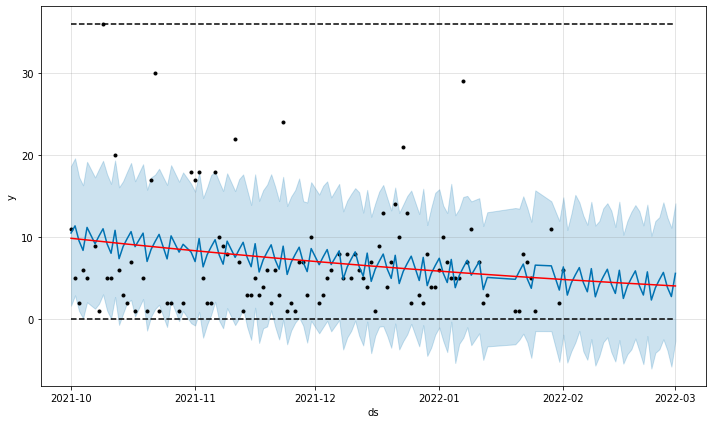

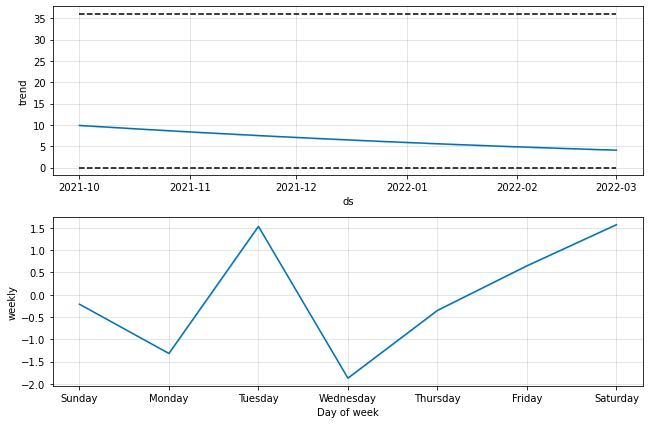

  0%|          | 0/2 [00:00<?, ?it/s]


Initial log joint probability = -39.3701
Iteration  1. Log joint probability =    53.3744. Improved by 92.7446.
Iteration  2. Log joint probability =    70.7316. Improved by 17.3571.
Iteration  3. Log joint probability =    77.2556. Improved by 6.52401.
Iteration  4. Log joint probability =     81.167. Improved by 3.91145.
Iteration  5. Log joint probability =    83.8472. Improved by 2.68019.
Iteration  6. Log joint probability =    83.8516. Improved by 0.00444317.
Iteration  7. Log joint probability =    83.8572. Improved by 0.00553518.
Iteration  8. Log joint probability =    83.8754. Improved by 0.0182193.
Iteration  9. Log joint probability =    83.9242. Improved by 0.0487716.
Iteration 10. Log joint probability =    85.4974. Improved by 1.57319.
Iteration 11. Log joint probability =    85.8753. Improved by 0.377894.
Iteration 12. Log joint probability =    86.1978. Improved by 0.32251.
Iteration 13. Log joint probability =    86.2003. Improved by 0.00249976.
Iteration 14. Log joi

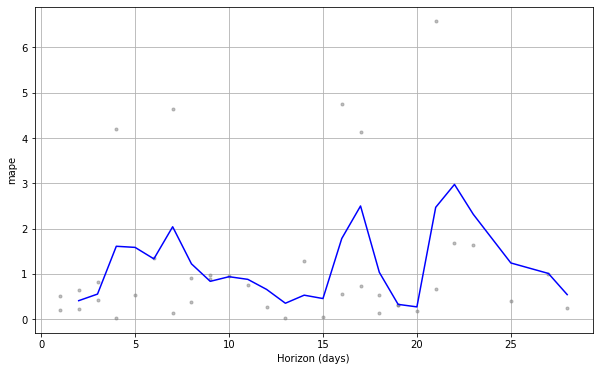

mape: 119.31%

1063600
      CategoryCode  ItemCode     DateID  DailySales
12663   category_3   1063600  1/10/2022           4
6204    category_3   1063600  1/11/2022           1
12321   category_3   1063600  1/15/2022           2
12340   category_3   1063600  1/16/2022           1
5995    category_3   1063600  1/17/2022           4
...            ...       ...        ...         ...
14307   category_3   1063600  2/12/2022           1
5119    category_3   1063600   2/3/2022           2
15105   category_3   1063600   2/7/2022           3
1736    category_3   1063600   2/8/2022           1
1224    category_3   1063600   2/9/2022           3

[93 rows x 4 columns]


Initial log joint probability = -68.8623
Iteration  1. Log joint probability =    50.8842. Improved by 119.746.
Iteration  2. Log joint probability =     86.645. Improved by 35.7608.
Iteration  3. Log joint probability =    115.564. Improved by 28.9191.
Iteration  4. Log joint probability =    120.131. Improved by 4.5665.
Iter

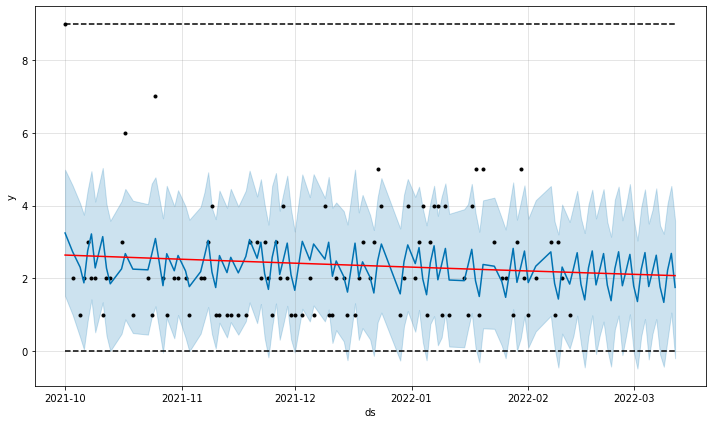

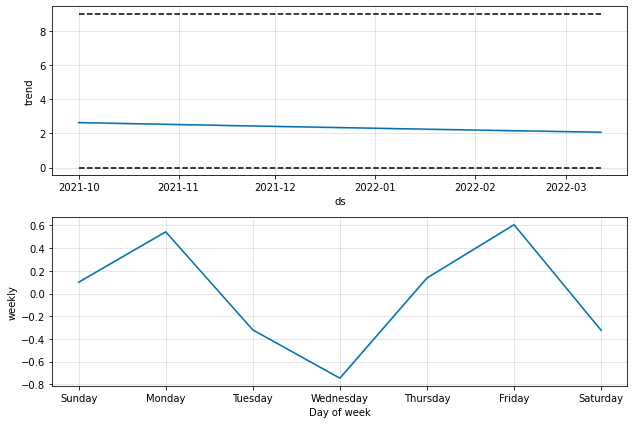

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -28.8568
Iteration  1. Log joint probability =    39.8593. Improved by 68.7161.
Iteration  2. Log joint probability =    68.9803. Improved by 29.121.
Iteration  3. Log joint probability =    75.0835. Improved by 6.10322.
Iteration  4. Log joint probability =    75.1176. Improved by 0.0341415.
Iteration  5. Log joint probability =    75.1853. Improved by 0.0677148.
Iteration  6. Log joint probability =    75.1939. Improved by 0.00853015.
Iteration  7. Log joint probability =    75.2182. Improved by 0.0242943.
Iteration  8. Log joint probability =    75.2216. Improved by 0.00349342.
Iteration  9. Log joint probability =    75.2329. Improved by 0.0112621.
Iteration 10. Log joint probability =    75.2347. Improved by 0.00177631.
Iteration 11. Log joint probability =    75.2393. Improved by 0.00457234.
Iteration 12. Log joint probability =    75.2406. Improved by 0.00133507.
Iteration 13. Log joint probability =    75.2427. Improved by 0.00210743.
Iteration 

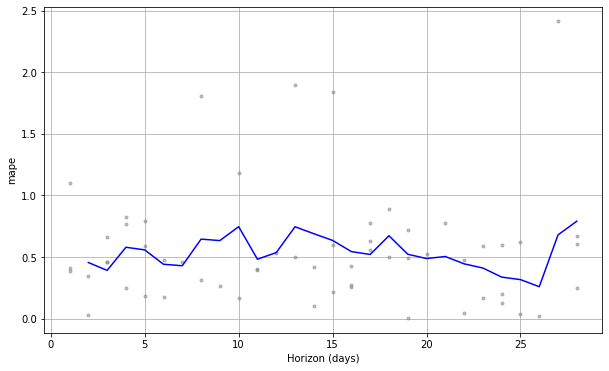

mape: 53.50%

1067074
      CategoryCode  ItemCode     DateID  DailySales
11651   category_2   1067074   1/1/2022           6
12920   category_2   1067074  1/10/2022           5
12437   category_2   1067074  1/12/2022          10
5257    category_2   1067074  1/13/2022           7
10261   category_2   1067074  1/14/2022           2
...            ...       ...        ...         ...
10544   category_2   1067074   2/4/2022           2
9995    category_2   1067074   2/5/2022           9
11649   category_2   1067074   2/6/2022          15
15471   category_2   1067074   2/7/2022           3
488     category_2   1067074   2/9/2022           4

[115 rows x 4 columns]

Initial log joint probability = -3.92484
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       193.613   8.07981e-09       101.795      0.6493      0.6493      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HERE

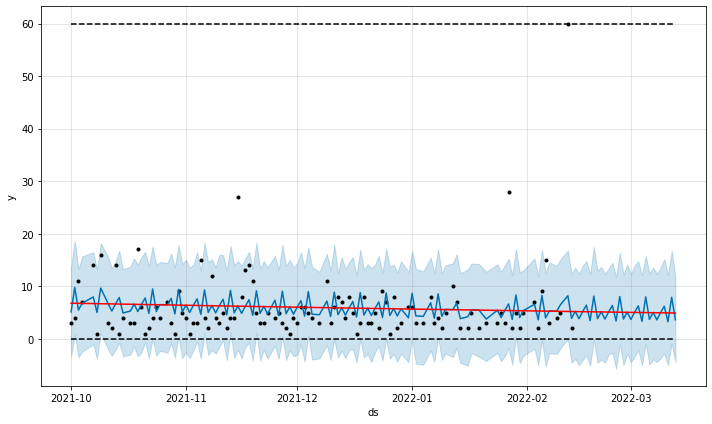

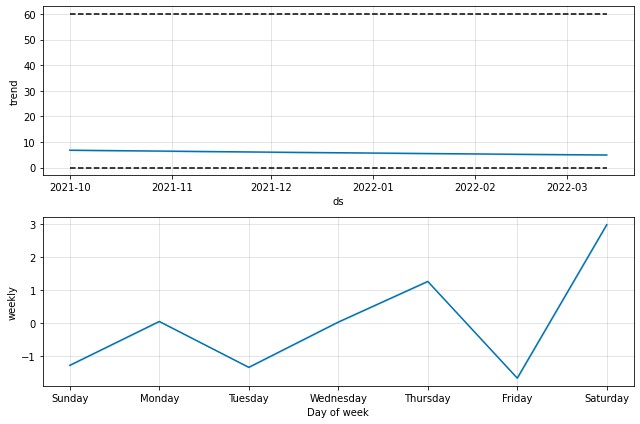

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -36.6207
Iteration  1. Log joint probability =   -2.40719. Improved by 34.2135.
Iteration  2. Log joint probability =    77.3128. Improved by 79.72.
Iteration  3. Log joint probability =    79.8586. Improved by 2.54579.
Iteration  4. Log joint probability =    84.2496. Improved by 4.39092.
Iteration  5. Log joint probability =    87.7031. Improved by 3.45356.
Iteration  6. Log joint probability =     87.712. Improved by 0.00891906.
Iteration  7. Log joint probability =    87.7235. Improved by 0.0114636.
Iteration  8. Log joint probability =    87.7302. Improved by 0.00673725.
Iteration  9. Log joint probability =    87.7382. Improved by 0.00800415.
Iteration 10. Log joint probability =    87.7478. Improved by 0.00955409.
Iteration 11. Log joint probability =    87.7845. Improved by 0.0366879.
Iteration 12. Log joint probability =    87.7968. Improved by 0.012291.
Iteration 13. Log joint probability =    87.8346. Improved by 0.0378277.
Iteration 14. Log 

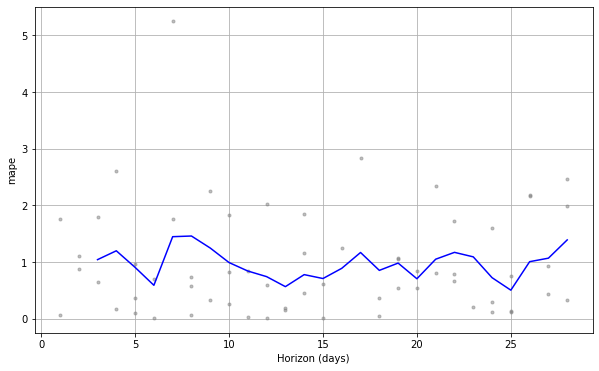

mape: 96.46%

1067119
      CategoryCode  ItemCode     DateID  DailySales
14257   category_1   1067119  1/10/2022           5
5664    category_1   1067119  1/11/2022           6
13886   category_1   1067119  1/12/2022           4
5966    category_1   1067119  1/13/2022           7
10576   category_1   1067119  1/14/2022           4
...            ...       ...        ...         ...
10892   category_1   1067119   2/5/2022           3
10554   category_1   1067119   2/6/2022           4
18550   category_1   1067119   2/7/2022           2
1339    category_1   1067119   2/8/2022           5
1509    category_1   1067119   2/9/2022           2

[125 rows x 4 columns]

Initial log joint probability = -6.71853
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       158.039   1.03099e-08       87.9828      0.2704      0.2704      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       15

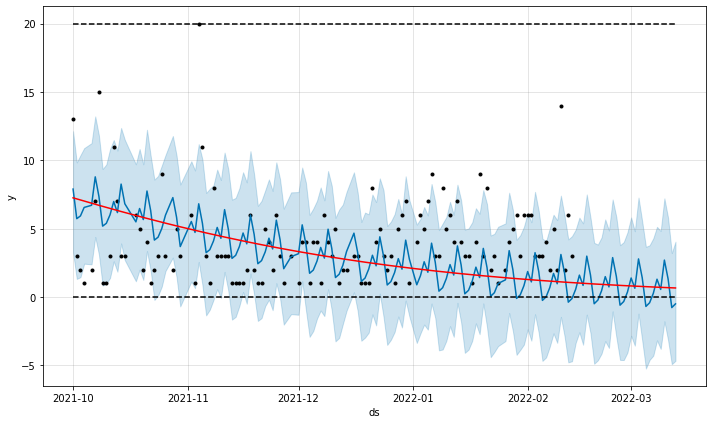

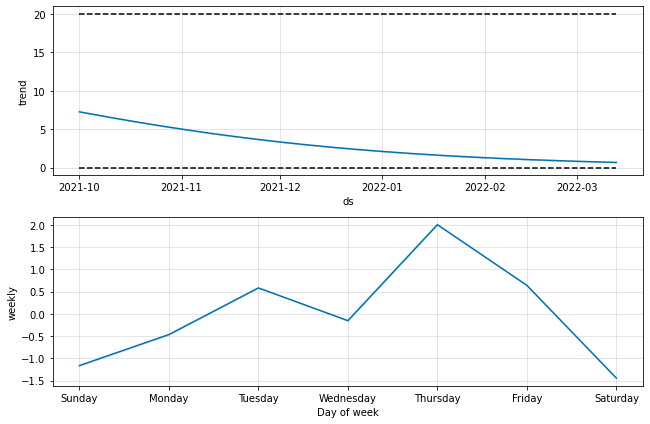

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -36.5116
Iteration  1. Log joint probability =    56.4865. Improved by 92.9981.
Iteration  2. Log joint probability =    56.6657. Improved by 0.179252.
Iteration  3. Log joint probability =    84.9475. Improved by 28.2817.
Iteration  4. Log joint probability =    86.0335. Improved by 1.08606.
Iteration  5. Log joint probability =    94.3271. Improved by 8.29355.
Iteration  6. Log joint probability =    96.0639. Improved by 1.73687.
Iteration  7. Log joint probability =    96.2934. Improved by 0.229431.
Iteration  8. Log joint probability =    96.4401. Improved by 0.146774.
Iteration  9. Log joint probability =    96.4984. Improved by 0.0582433.
Iteration 10. Log joint probability =    96.6806. Improved by 0.182174.
Iteration 11. Log joint probability =    97.0161. Improved by 0.33552.
Iteration 12. Log joint probability =    97.0212. Improved by 0.00508614.
Iteration 13. Log joint probability =    97.0402. Improved by 0.0190058.
Iteration 14. Log joint 

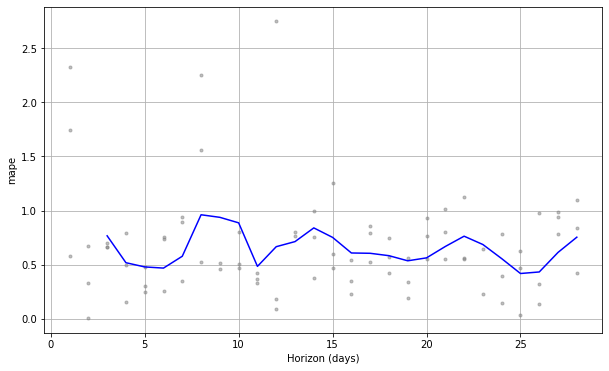

mape: 64.85%

1067128
      CategoryCode  ItemCode     DateID  DailySales
11955   category_1   1067128   1/1/2022          13
13311   category_1   1067128  1/10/2022           1
6734    category_1   1067128  1/13/2022           3
10894   category_1   1067128  1/16/2022           3
7546    category_1   1067128  1/19/2022           3
...            ...       ...        ...         ...
14088   category_1   1067128   2/2/2022           1
4339    category_1   1067128   2/3/2022           7
11922   category_1   1067128   2/5/2022           1
1388    category_1   1067128   2/8/2022           2
268     category_1   1067128   2/9/2022           2

[86 rows x 4 columns]


Initial log joint probability = -49.2432
Iteration  1. Log joint probability =    10.9887. Improved by 60.2319.
Iteration  2. Log joint probability =    52.3189. Improved by 41.3302.
Iteration  3. Log joint probability =    53.4229. Improved by 1.10398.
Iteration  4. Log joint probability =    53.4289. Improved by 0.00608376.
I

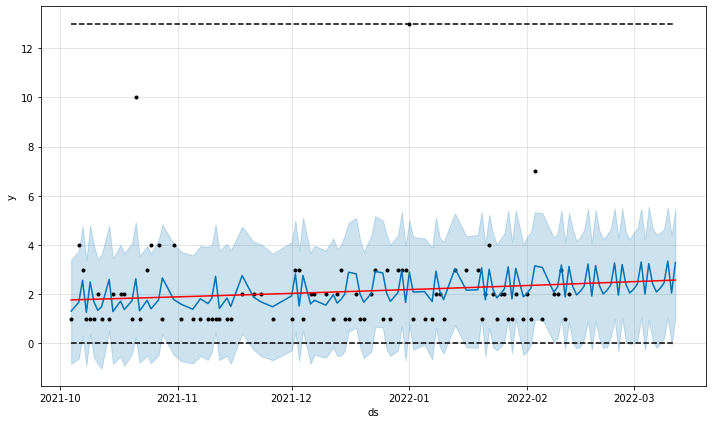

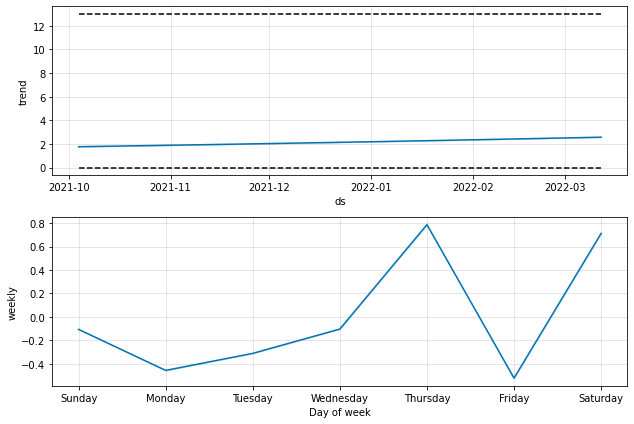

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -12.1856
Iteration  1. Log joint probability =    23.8597. Improved by 36.0453.
Iteration  2. Log joint probability =    54.4074. Improved by 30.5477.
Iteration  3. Log joint probability =    56.4298. Improved by 2.02236.
Iteration  4. Log joint probability =    59.1981. Improved by 2.76829.
Iteration  5. Log joint probability =    61.2631. Improved by 2.06502.
Iteration  6. Log joint probability =    61.7607. Improved by 0.497611.
Iteration  7. Log joint probability =    61.7641. Improved by 0.00333113.
Iteration  8. Log joint probability =    61.7672. Improved by 0.00316282.
Iteration  9. Log joint probability =    61.7747. Improved by 0.007444.
Iteration 10. Log joint probability =    61.8199. Improved by 0.0452132.
Iteration 11. Log joint probability =    61.8494. Improved by 0.0295061.
Iteration 12. Log joint probability =    61.8823. Improved by 0.0328955.
Iteration 13. Log joint probability =    61.9133. Improved by 0.0309879.
Iteration 14. Log j

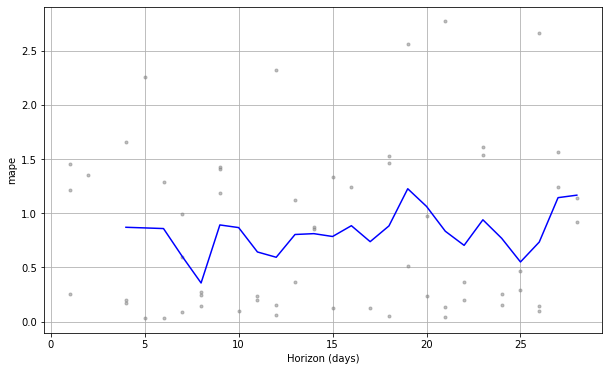

mape: 82.32%

1068883
      CategoryCode  ItemCode     DateID  DailySales
10601   category_1   1068883   1/1/2022           1
7214    category_1   1068883  1/13/2022           1
7065    category_1   1068883  1/19/2022           1
11823   category_1   1068883   1/2/2022           1
14778   category_1   1068883  1/20/2022           1
...            ...       ...        ...         ...
11850   category_1   1068883   2/4/2022           1
11075   category_1   1068883   2/6/2022           2
16247   category_1   1068883   2/7/2022           1
1134    category_1   1068883   2/8/2022           2
1244    category_1   1068883   2/9/2022           4

[62 rows x 4 columns]


Initial log joint probability = -34.5846
Iteration  1. Log joint probability =    6.84018. Improved by 41.4248.
Iteration  2. Log joint probability =    52.0581. Improved by 45.2179.
Iteration  3. Log joint probability =    55.3157. Improved by 3.25761.
Iteration  4. Log joint probability =    60.1904. Improved by 4.87473.
Iter

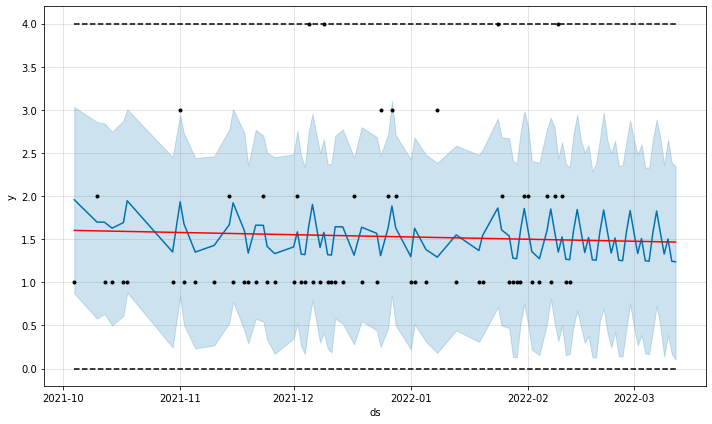

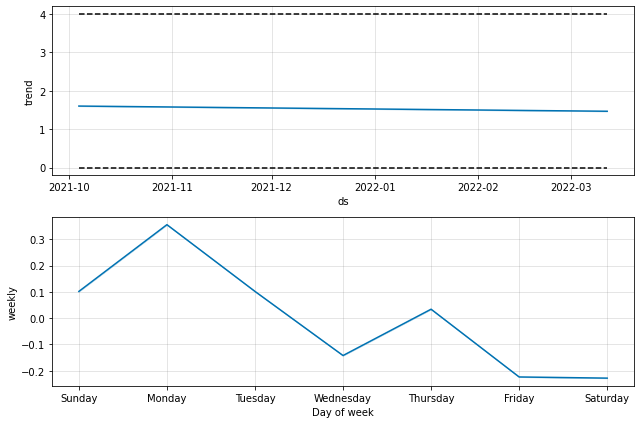

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -1.51551
Iteration  1. Log joint probability =    23.9446. Improved by 25.4601.
Iteration  2. Log joint probability =    36.9833. Improved by 13.0387.
Iteration  3. Log joint probability =    38.3268. Improved by 1.3435.
Iteration  4. Log joint probability =     39.013. Improved by 0.686124.
Iteration  5. Log joint probability =     39.028. Improved by 0.0150779.
Iteration  6. Log joint probability =    39.1696. Improved by 0.141612.
Iteration  7. Log joint probability =    39.1777. Improved by 0.00806904.
Iteration  8. Log joint probability =     39.184. Improved by 0.00632515.
Iteration  9. Log joint probability =    39.1878. Improved by 0.00376609.
Iteration 10. Log joint probability =    39.1903. Improved by 0.00244957.
Iteration 11. Log joint probability =     39.192. Improved by 0.00170599.
Iteration 12. Log joint probability =    39.1928. Improved by 0.000852703.
Iteration 13. Log joint probability =    39.1935. Improved by 0.000720379.
Iteration

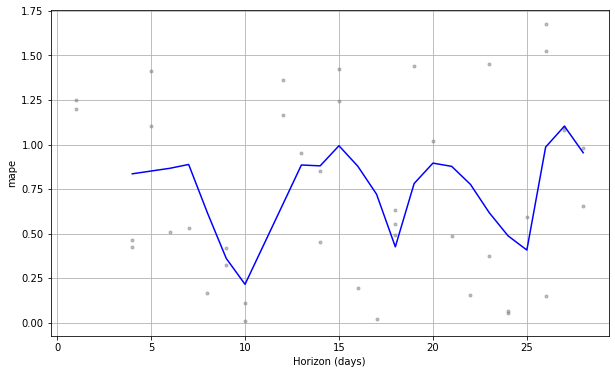

mape: 74.86%

1070818
      CategoryCode  ItemCode     DateID  DailySales
11217   category_2   1070818   1/1/2022           5
6041    category_2   1070818  1/13/2022           1
5354    category_2   1070818  1/17/2022           1
12004   category_2   1070818   1/2/2022           1
12664   category_2   1070818  1/20/2022           3
...            ...       ...        ...         ...
4905    category_2   1070818   2/3/2022           1
10927   category_2   1070818   2/4/2022           2
10051   category_2   1070818   2/5/2022           4
11119   category_2   1070818   2/6/2022           1
1386    category_2   1070818   2/8/2022           2

[85 rows x 4 columns]


Initial log joint probability = -62.2317
Iteration  1. Log joint probability =    76.4031. Improved by 138.635.
Iteration  2. Log joint probability =     95.866. Improved by 19.4629.
Iteration  3. Log joint probability =      104.5. Improved by 8.63433.
Iteration  4. Log joint probability =    108.376. Improved by 3.876.
Iterat

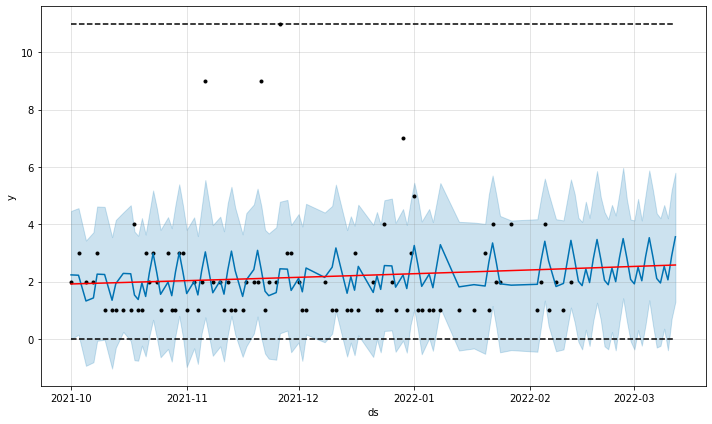

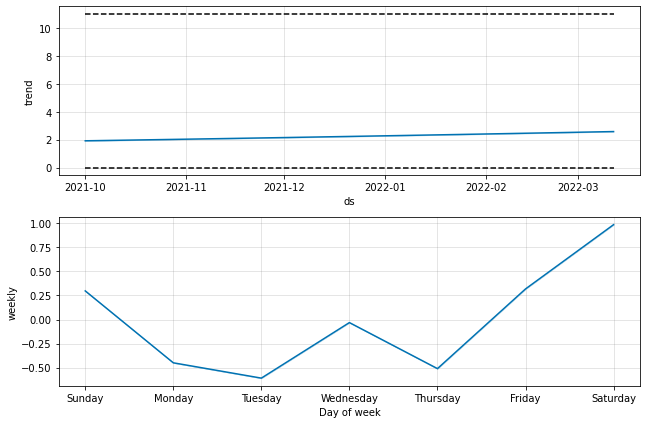

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -20.7154
Iteration  1. Log joint probability =    21.0475. Improved by 41.7629.
Iteration  2. Log joint probability =    54.9362. Improved by 33.8887.
Iteration  3. Log joint probability =    67.9833. Improved by 13.0471.
Iteration  4. Log joint probability =    68.1335. Improved by 0.150171.
Iteration  5. Log joint probability =    68.1788. Improved by 0.0453182.
Iteration  6. Log joint probability =    68.2122. Improved by 0.0334563.
Iteration  7. Log joint probability =    68.2649. Improved by 0.0526189.
Iteration  8. Log joint probability =     68.305. Improved by 0.0401742.
Iteration  9. Log joint probability =    68.4268. Improved by 0.121797.
Iteration 10. Log joint probability =    68.4421. Improved by 0.0152576.
Iteration 11. Log joint probability =    68.4572. Improved by 0.0151192.
Iteration 12. Log joint probability =     68.464. Improved by 0.00677292.
Iteration 13. Log joint probability =    68.4762. Improved by 0.0122342.
Iteration 14. Lo

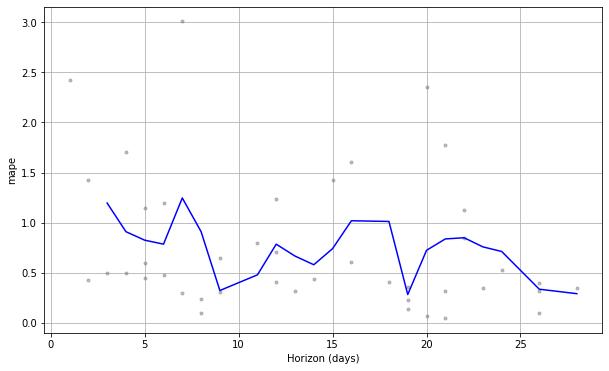

mape: 73.87%

1071115
      CategoryCode  ItemCode     DateID  DailySales
12133   category_2   1071115   1/1/2022           3
14674   category_2   1071115  1/10/2022           1
12834   category_2   1071115  1/12/2022           2
12266   category_2   1071115  1/16/2022           2
7425    category_2   1071115  1/19/2022           3
...            ...       ...        ...         ...
10496   category_2   1071115  2/13/2022           2
14576   category_2   1071115   2/2/2022           2
10134   category_2   1071115   2/4/2022           4
11125   category_2   1071115   2/5/2022           3
18713   category_2   1071115   2/7/2022           1

[72 rows x 4 columns]


Initial log joint probability = -37.7096
Iteration  1. Log joint probability =    42.2265. Improved by 79.9361.
Iteration  2. Log joint probability =    54.2409. Improved by 12.0144.
Iteration  3. Log joint probability =    81.1679. Improved by 26.927.
Iteration  4. Log joint probability =    84.1014. Improved by 2.9335.
Iterat

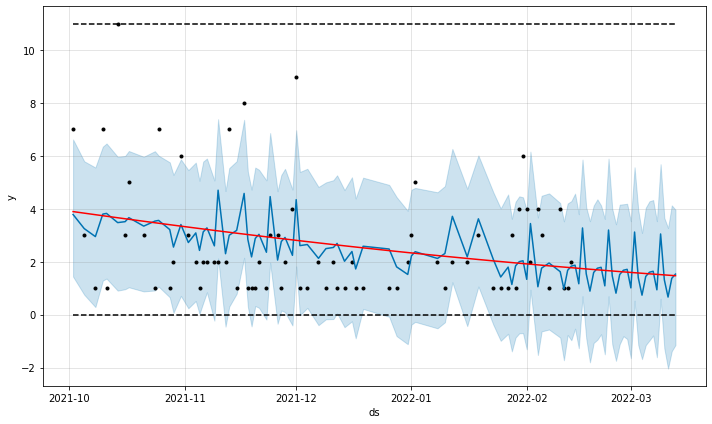

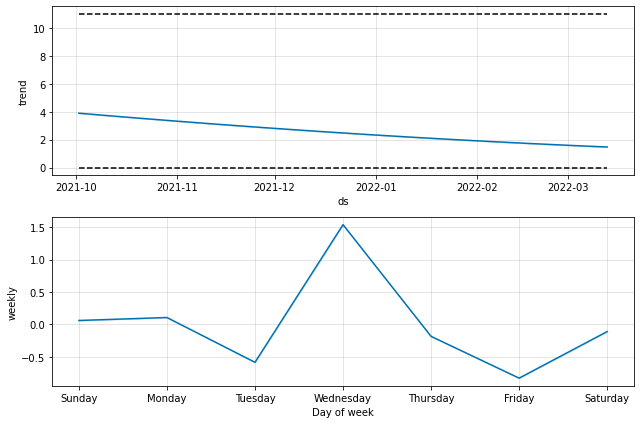

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -12.673
Iteration  1. Log joint probability =    38.3088. Improved by 50.9818.
Iteration  2. Log joint probability =    48.5538. Improved by 10.245.
Iteration  3. Log joint probability =    51.3728. Improved by 2.81902.
Iteration  4. Log joint probability =    51.4852. Improved by 0.112372.
Iteration  5. Log joint probability =     51.493. Improved by 0.00780132.
Iteration  6. Log joint probability =    51.5041. Improved by 0.0110857.
Iteration  7. Log joint probability =    51.5145. Improved by 0.0104025.
Iteration  8. Log joint probability =    51.5385. Improved by 0.0240068.
Iteration  9. Log joint probability =    51.5644. Improved by 0.0259253.
Iteration 10. Log joint probability =    51.6037. Improved by 0.0392343.
Iteration 11. Log joint probability =    51.6233. Improved by 0.0196214.
Iteration 12. Log joint probability =    51.7225. Improved by 0.0992032.
Iteration 13. Log joint probability =    51.7722. Improved by 0.0496837.
Iteration 14. Log

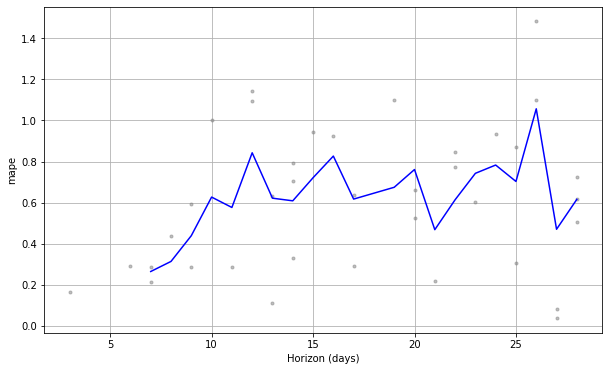

mape: 63.54%

1075651
      CategoryCode  ItemCode     DateID  DailySales
14490   category_1   1075651  1/10/2022           1
5764    category_1   1075651  1/11/2022           3
12240   category_1   1075651  1/16/2022           2
4583    category_1   1075651  1/22/2022           1
1353    category_1   1075651  1/24/2022           2
...            ...       ...        ...         ...
11383   category_1   1075651   2/4/2022           1
11950   category_1   1075651   2/5/2022           2
10174   category_1   1075651   2/6/2022           1
1652    category_1   1075651   2/8/2022           2
740     category_1   1075651   2/9/2022           5

[73 rows x 4 columns]


Initial log joint probability = -38.0384
Iteration  1. Log joint probability =    70.1203. Improved by 108.159.
Iteration  2. Log joint probability =    72.9044. Improved by 2.78411.
Iteration  3. Log joint probability =    75.9841. Improved by 3.07971.
Iteration  4. Log joint probability =    75.9886. Improved by 0.00449132.
I

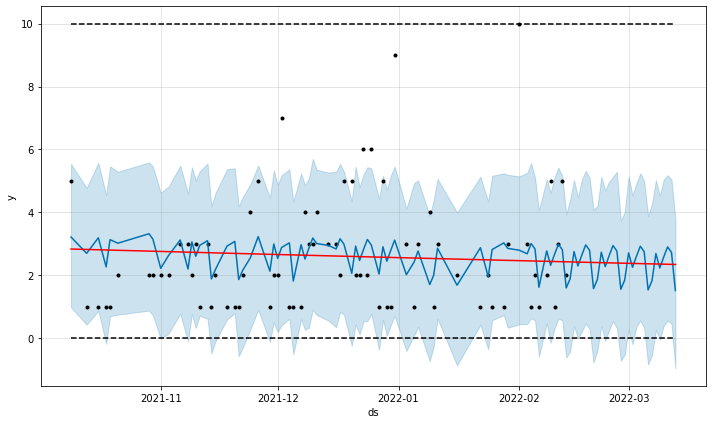

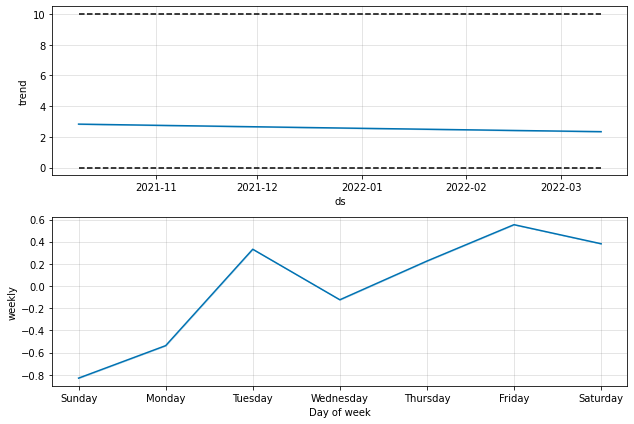

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -8.20866
Iteration  1. Log joint probability =    23.2448. Improved by 31.4535.
Iteration  2. Log joint probability =    44.9952. Improved by 21.7504.
Iteration  3. Log joint probability =    46.7604. Improved by 1.76519.
Iteration  4. Log joint probability =    47.0641. Improved by 0.303712.
Iteration  5. Log joint probability =    47.4196. Improved by 0.355464.
Iteration  6. Log joint probability =    47.4276. Improved by 0.00806501.
Iteration  7. Log joint probability =    47.4295. Improved by 0.00184844.
Iteration  8. Log joint probability =    47.5138. Improved by 0.0843153.
Iteration  9. Log joint probability =    47.8377. Improved by 0.323895.
Iteration 10. Log joint probability =    48.0065. Improved by 0.168815.
Iteration 11. Log joint probability =    48.0198. Improved by 0.0132779.
Iteration 12. Log joint probability =    48.0699. Improved by 0.0501562.
Iteration 13. Log joint probability =    48.0911. Improved by 0.0211169.
Iteration 14. Log

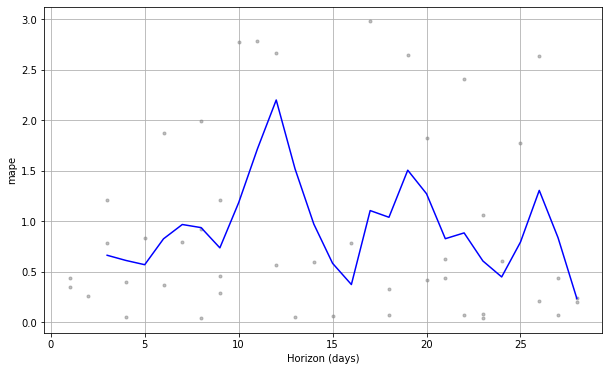

mape: 95.04%

1076929
      CategoryCode  ItemCode     DateID  DailySales
12383   category_2   1076929  1/12/2022           1
7392    category_2   1076929  1/13/2022           1
11936   category_2   1076929  1/16/2022           1
13579   category_2   1076929  1/18/2022           1
14507   category_2   1076929  1/20/2022           1
...            ...       ...        ...         ...
13247   category_2   1076929   2/1/2022           3
5490    category_2   1076929  2/11/2022           4
14622   category_2   1076929  2/12/2022           1
3911    category_2   1076929   2/3/2022           1
1210    category_2   1076929   2/9/2022           1

[64 rows x 4 columns]


Initial log joint probability = -114.848
Iteration  1. Log joint probability =   -33.8516. Improved by 80.9961.
Iteration  2. Log joint probability =    10.9283. Improved by 44.7798.
Iteration  3. Log joint probability =    11.9282. Improved by 0.999939.
Iteration  4. Log joint probability =    11.9377. Improved by 0.00951102.


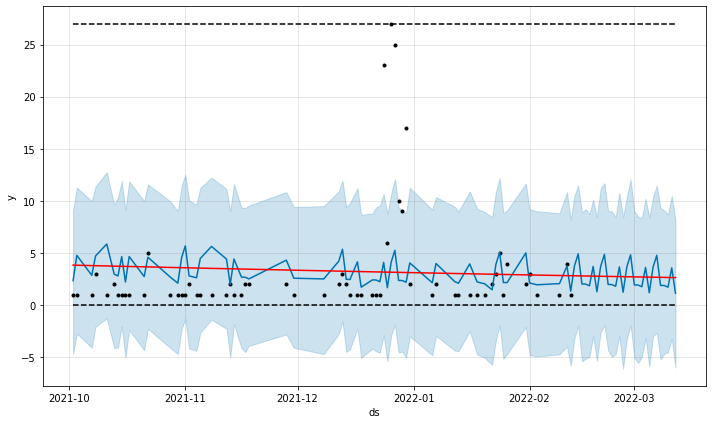

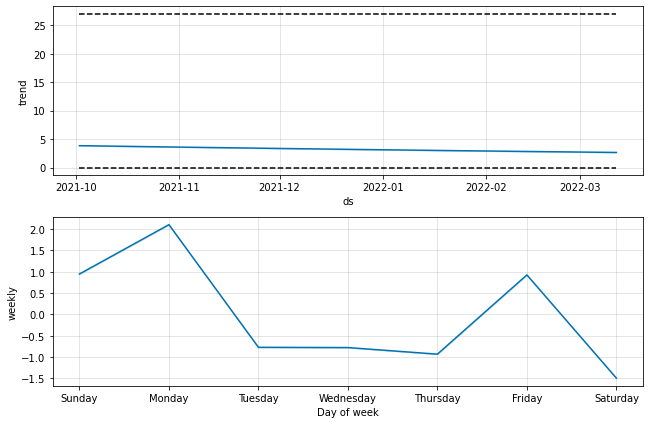

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -87.3146
Iteration  1. Log joint probability =   -51.4835. Improved by 35.8311.
Iteration  2. Log joint probability =   -23.7203. Improved by 27.7631.
Iteration  3. Log joint probability =     13.809. Improved by 37.5294.
Iteration  4. Log joint probability =    25.0231. Improved by 11.2141.
Iteration  5. Log joint probability =    34.9407. Improved by 9.91757.
Iteration  6. Log joint probability =    34.9443. Improved by 0.00365042.
Iteration  7. Log joint probability =    34.9533. Improved by 0.00897337.
Iteration  8. Log joint probability =    34.9663. Improved by 0.0130508.
Iteration  9. Log joint probability =    34.9813. Improved by 0.0149947.
Iteration 10. Log joint probability =    35.0032. Improved by 0.0218693.
Iteration 11. Log joint probability =    35.0085. Improved by 0.00530808.
Iteration 12. Log joint probability =    35.0636. Improved by 0.0551296.
Iteration 13. Log joint probability =    35.0774. Improved by 0.0137802.
Iteration 14. Lo

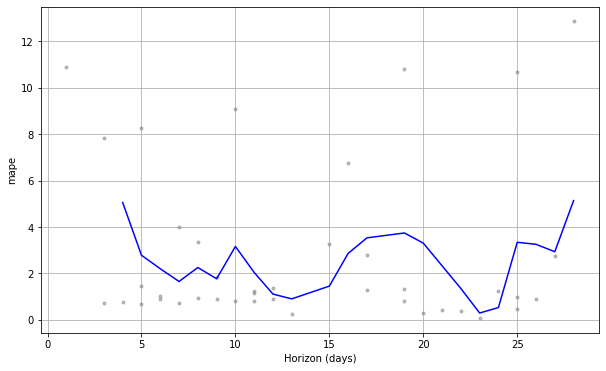

mape: 248.11%

1077118
      CategoryCode  ItemCode     DateID  DailySales
11765   category_1   1077118   1/1/2022           3
5686    category_1   1077118  1/11/2022           1
12926   category_1   1077118  1/12/2022           1
5676    category_1   1077118  1/13/2022           6
10038   category_1   1077118  1/14/2022           2
...            ...       ...        ...         ...
11768   category_1   1077118   2/4/2022          13
10803   category_1   1077118   2/5/2022          15
11904   category_1   1077118   2/6/2022           1
18805   category_1   1077118   2/7/2022           1
1945    category_1   1077118   2/8/2022           1

[66 rows x 4 columns]


Initial log joint probability = -31.7301
Iteration  1. Log joint probability =    33.8834. Improved by 65.6135.
Iteration  2. Log joint probability =    54.3042. Improved by 20.4207.
Iteration  3. Log joint probability =    62.0061. Improved by 7.70193.
Iteration  4. Log joint probability =    70.9003. Improved by 8.89421.
Ite

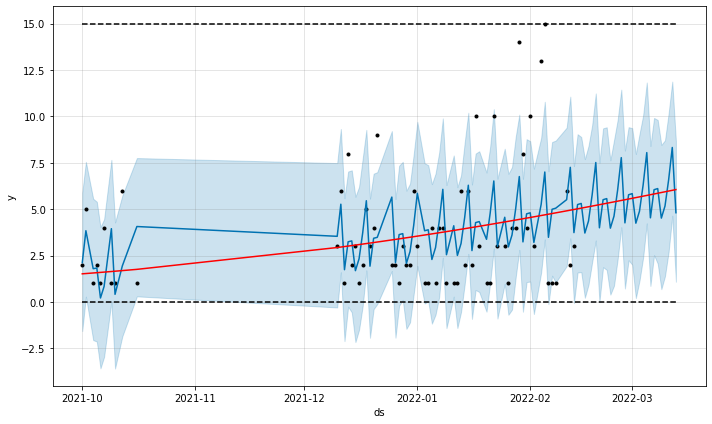

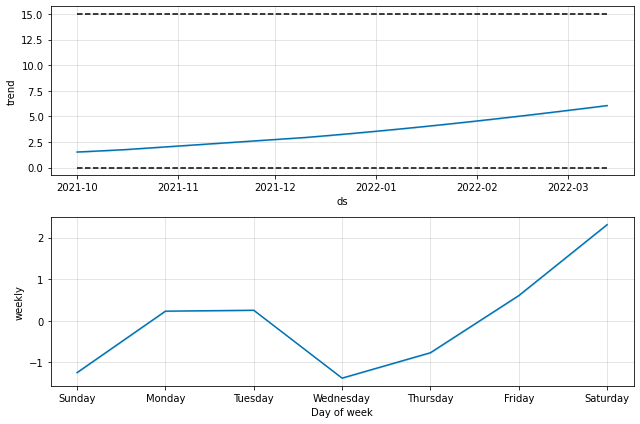

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -11.3987
Iteration  1. Log joint probability =    10.5638. Improved by 21.9625.
Iteration  2. Log joint probability =    16.0668. Improved by 5.50303.
Iteration  3. Log joint probability =     19.253. Improved by 3.18616.
Iteration  4. Log joint probability =    19.8732. Improved by 0.620264.
Iteration  5. Log joint probability =    20.0111. Improved by 0.137838.
Iteration  6. Log joint probability =    20.2143. Improved by 0.203243.
Iteration  7. Log joint probability =    20.3065. Improved by 0.0922138.
Iteration  8. Log joint probability =    20.3137. Improved by 0.00712955.
Iteration  9. Log joint probability =    20.3591. Improved by 0.0453792.
Iteration 10. Log joint probability =     20.361. Improved by 0.00193664.
Iteration 11. Log joint probability =    20.3625. Improved by 0.00151564.
Iteration 12. Log joint probability =    20.3656. Improved by 0.00314167.
Iteration 13. Log joint probability =    20.3662. Improved by 0.000533991.
Iteration 14

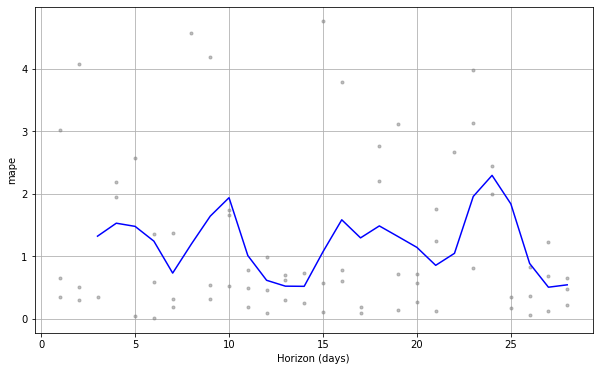

mape: 121.27%

1081060
      CategoryCode  ItemCode     DateID  DailySales
13191   category_3   1081060  1/10/2022           3
7252    category_3   1081060  1/11/2022           5
14480   category_3   1081060  1/12/2022           2
5618    category_3   1081060  1/13/2022           5
10452   category_3   1081060  1/16/2022           1
...            ...       ...        ...         ...
7351    category_3   1081060  2/11/2022           6
10323   category_3   1081060  2/13/2022           7
10743   category_3   1081060   2/5/2022           1
12334   category_3   1081060   2/6/2022           3
15175   category_3   1081060   2/7/2022          12

[110 rows x 4 columns]

Initial log joint probability = -5.90485
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       100.209   9.64587e-09       100.795      0.5116      0.5116      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
HER

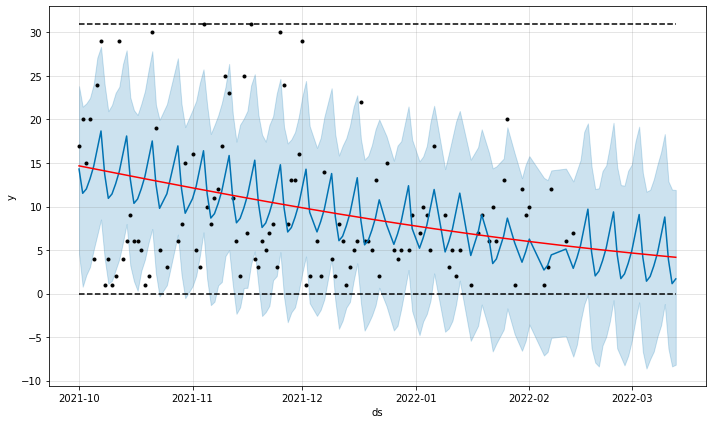

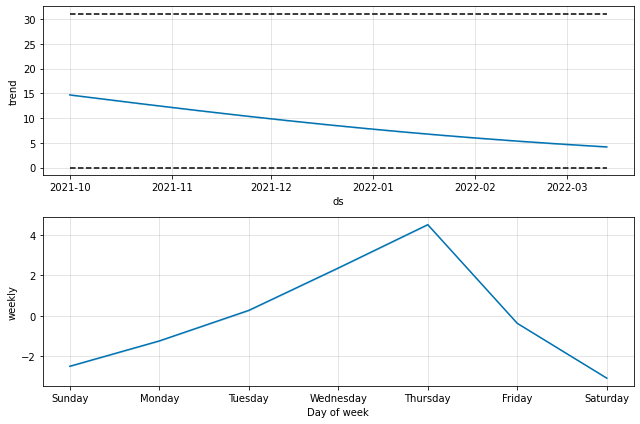

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -40.3422
Iteration  1. Log joint probability =     42.359. Improved by 82.7013.
Iteration  2. Log joint probability =    42.6101. Improved by 0.251115.
Iteration  3. Log joint probability =    50.6254. Improved by 8.01528.
Iteration  4. Log joint probability =    50.6285. Improved by 0.00306223.
Iteration  5. Log joint probability =    50.6391. Improved by 0.0106405.
Iteration  6. Log joint probability =    50.6735. Improved by 0.0344165.
Iteration  7. Log joint probability =    50.6998. Improved by 0.0262775.
Iteration  8. Log joint probability =    50.7013. Improved by 0.00152233.
Iteration  9. Log joint probability =    51.1162. Improved by 0.414815.
Iteration 10. Log joint probability =     51.218. Improved by 0.101825.
Iteration 11. Log joint probability =    51.2279. Improved by 0.00992194.
Iteration 12. Log joint probability =    55.3183. Improved by 4.09039.
Iteration 13. Log joint probability =    55.3349. Improved by 0.0165692.
Iteration 14. L

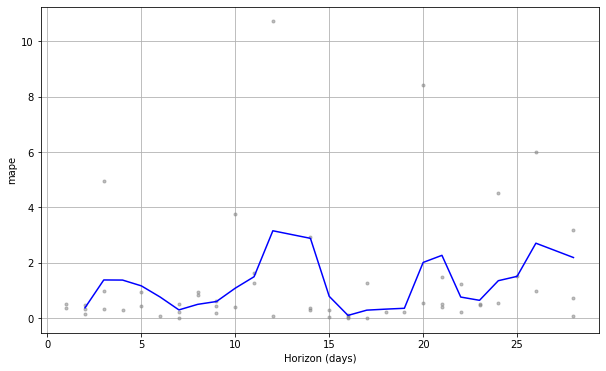

mape: 122.03%

1081069
      CategoryCode  ItemCode     DateID  DailySales
13584   category_3   1081069  1/10/2022           1
7024    category_3   1081069  1/11/2022           4
12672   category_3   1081069  1/12/2022           2
11851   category_3   1081069  1/14/2022           2
11824   category_3   1081069  1/15/2022           1
...            ...       ...        ...         ...
13640   category_3   1081069   2/2/2022           9
11337   category_3   1081069   2/6/2022           1
15227   category_3   1081069   2/7/2022           3
1558    category_3   1081069   2/8/2022           1
1903    category_3   1081069   2/9/2022           3

[82 rows x 4 columns]


Initial log joint probability = -46.1262
Iteration  1. Log joint probability =   -1.16777. Improved by 44.9584.
Iteration  2. Log joint probability =     18.776. Improved by 19.9438.
Iteration  3. Log joint probability =    32.6995. Improved by 13.9235.
Iteration  4. Log joint probability =    32.7067. Improved by 0.00720526.


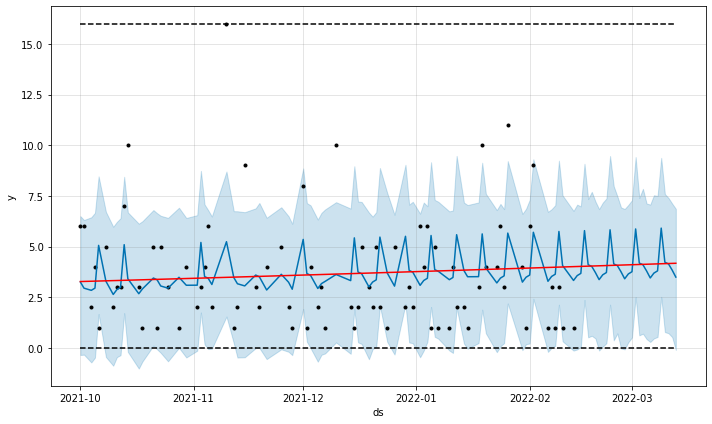

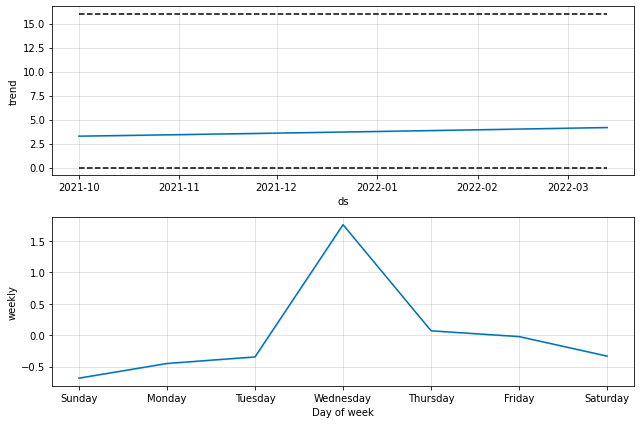

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -12.2211
Iteration  1. Log joint probability =    41.9931. Improved by 54.2142.
Iteration  2. Log joint probability =    52.8873. Improved by 10.8942.
Iteration  3. Log joint probability =    55.3557. Improved by 2.46836.
Iteration  4. Log joint probability =    55.6051. Improved by 0.249403.
Iteration  5. Log joint probability =    56.9979. Improved by 1.39282.
Iteration  6. Log joint probability =    57.0045. Improved by 0.00662588.
Iteration  7. Log joint probability =    57.1406. Improved by 0.136105.
Iteration  8. Log joint probability =    57.1406. Improved by 3.78409e-05.
Iteration  9. Log joint probability =    57.1726. Improved by 0.0319537.
Iteration 10. Log joint probability =    57.2376. Improved by 0.0649847.
Iteration 11. Log joint probability =    57.2428. Improved by 0.00517076.
Iteration 12. Log joint probability =     57.264. Improved by 0.021254.
Iteration 13. Log joint probability =    57.2866. Improved by 0.0225942.
Iteration 14. Lo

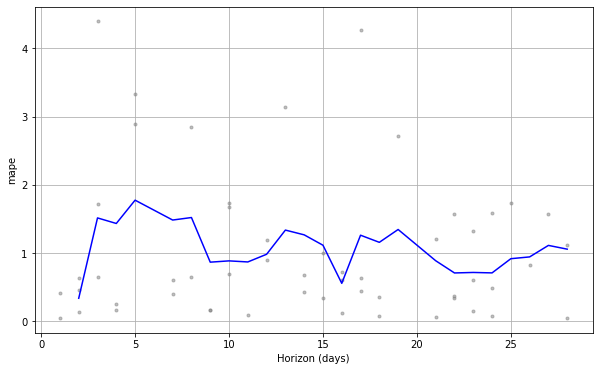

mape: 107.06%

1081078
      CategoryCode  ItemCode     DateID  DailySales
10109   category_3   1081078   1/1/2022           4
13130   category_3   1081078  1/12/2022           2
6186    category_3   1081078  1/13/2022           3
12146   category_3   1081078  1/14/2022           4
11838   category_3   1081078  1/15/2022           3
...            ...       ...        ...         ...
12037   category_3   1081078  2/13/2022           1
10481   category_3   1081078   2/4/2022           1
18653   category_3   1081078   2/7/2022           2
1745    category_3   1081078   2/8/2022           1
451     category_3   1081078   2/9/2022           3

[96 rows x 4 columns]


Initial log joint probability = -58.5644
Iteration  1. Log joint probability =    76.0184. Improved by 134.583.
Iteration  2. Log joint probability =    121.066. Improved by 45.0478.
Iteration  3. Log joint probability =    131.745. Improved by 10.679.
Iteration  4. Log joint probability =     132.98. Improved by 1.23463.
Iter

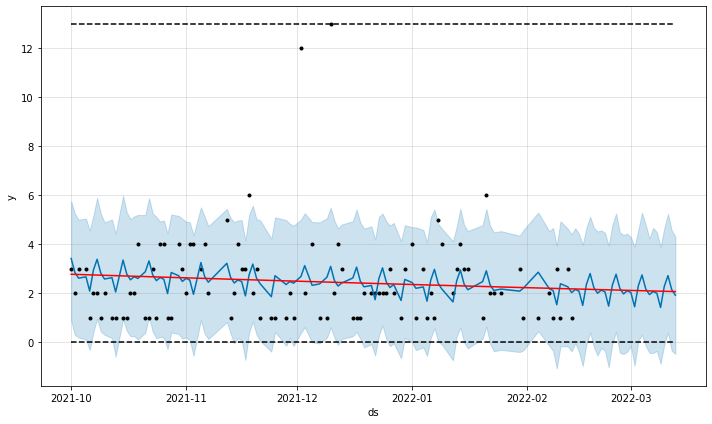

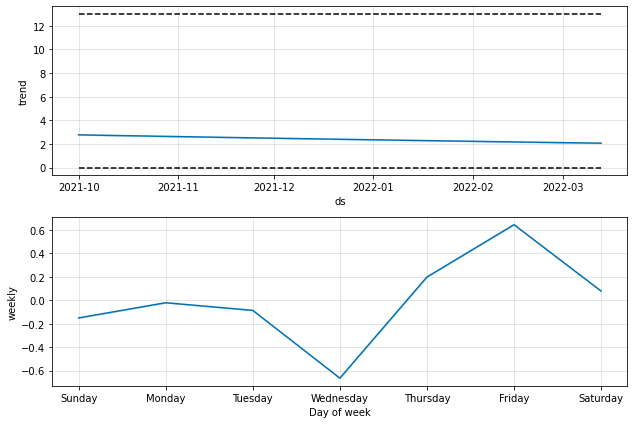

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -25.2401
Iteration  1. Log joint probability =    58.9514. Improved by 84.1916.
Iteration  2. Log joint probability =    72.0501. Improved by 13.0987.
Iteration  3. Log joint probability =    75.0393. Improved by 2.98916.
Iteration  4. Log joint probability =    75.0588. Improved by 0.019538.
Iteration  5. Log joint probability =     75.151. Improved by 0.0921371.
Iteration  6. Log joint probability =    75.1818. Improved by 0.030813.
Iteration  7. Log joint probability =    75.1914. Improved by 0.00958911.
Iteration  8. Log joint probability =    75.1988. Improved by 0.00743027.
Iteration  9. Log joint probability =    75.2046. Improved by 0.00576574.
Iteration 10. Log joint probability =    75.2418. Improved by 0.0371836.
Iteration 11. Log joint probability =     75.251. Improved by 0.00929539.
Iteration 12. Log joint probability =    75.2776. Improved by 0.0265271.
Iteration 13. Log joint probability =    75.2907. Improved by 0.0131094.
Iteration 14.

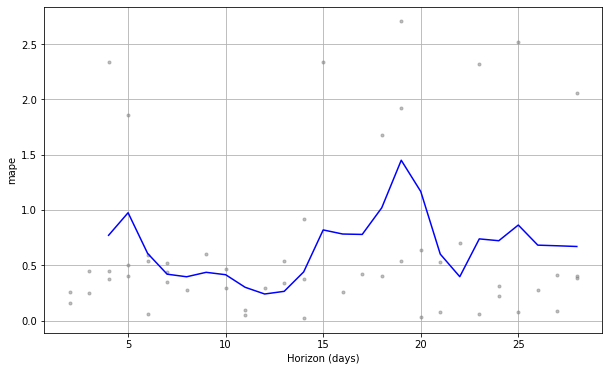

mape: 66.47%

1081321
      CategoryCode  ItemCode     DateID  DailySales
11605   category_1   1081321   1/1/2022           4
13961   category_1   1081321  1/10/2022           4
6179    category_1   1081321  1/11/2022           5
12456   category_1   1081321  1/12/2022           3
7139    category_1   1081321  1/13/2022           3
...            ...       ...        ...         ...
15861   category_1   1081321  12/8/2021           2
425     category_1   1081321  12/9/2021           7
5500    category_1   1081321  2/11/2022           3
14585   category_1   1081321  2/12/2022           2
11925   category_1   1081321  2/13/2022           1

[93 rows x 4 columns]


Initial log joint probability = -57.2862
Iteration  1. Log joint probability =    54.7569. Improved by 112.043.
Iteration  2. Log joint probability =    79.6691. Improved by 24.9123.
Iteration  3. Log joint probability =    81.7933. Improved by 2.12416.
Iteration  4. Log joint probability =     81.795. Improved by 0.00169061.
I

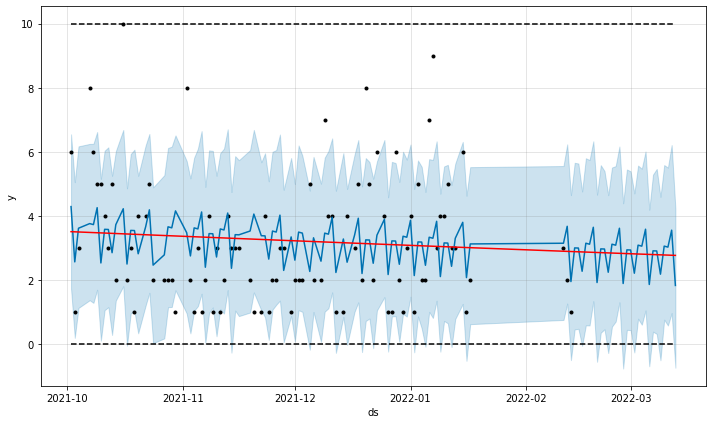

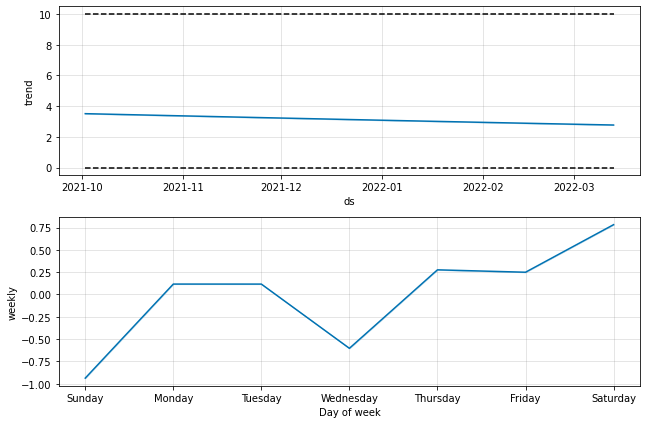

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -28.4423
Iteration  1. Log joint probability =    46.0537. Improved by 74.496.
Iteration  2. Log joint probability =    73.2484. Improved by 27.1947.
Iteration  3. Log joint probability =    74.8654. Improved by 1.61701.
Iteration  4. Log joint probability =    75.9978. Improved by 1.1324.
Iteration  5. Log joint probability =    76.1372. Improved by 0.139361.
Iteration  6. Log joint probability =    76.1894. Improved by 0.0521976.
Iteration  7. Log joint probability =    76.2929. Improved by 0.103522.
Iteration  8. Log joint probability =    76.3388. Improved by 0.0458619.
Iteration  9. Log joint probability =    76.3451. Improved by 0.00636755.
Iteration 10. Log joint probability =    76.3536. Improved by 0.00850205.
Iteration 11. Log joint probability =    76.3595. Improved by 0.00589916.
Iteration 12. Log joint probability =    76.3621. Improved by 0.00256723.
Iteration 13. Log joint probability =    76.3626. Improved by 0.000504187.
Iteration 14. L

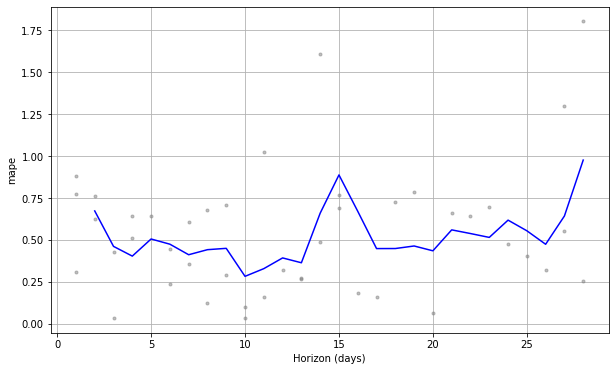

mape: 52.15%

1081339
      CategoryCode  ItemCode     DateID  DailySales
11351   category_1   1081339   1/1/2022           5
12128   category_1   1081339  1/14/2022           1
11924   category_1   1081339  1/16/2022           2
12427   category_1   1081339  1/18/2022           3
7652    category_1   1081339  1/19/2022           1
...            ...       ...        ...         ...
11826   category_1   1081339  12/5/2021           2
8898    category_1   1081339  12/6/2021           3
15350   category_1   1081339  12/8/2021           4
5824    category_1   1081339  2/11/2022           2
12180   category_1   1081339  2/13/2022           1

[72 rows x 4 columns]


Initial log joint probability = -36.6626
Iteration  1. Log joint probability =    44.1161. Improved by 80.7787.
Iteration  2. Log joint probability =     54.332. Improved by 10.2159.
Iteration  3. Log joint probability =    54.3382. Improved by 0.00622777.
Iteration  4. Log joint probability =    54.3439. Improved by 0.00569062

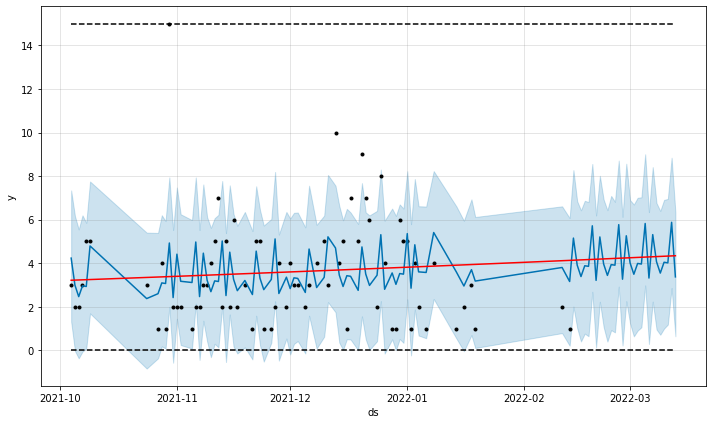

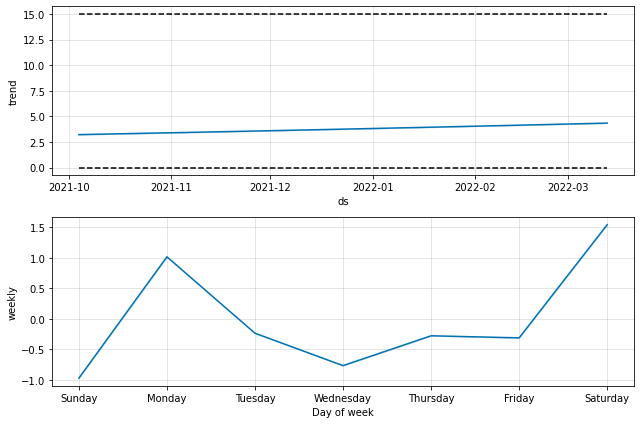

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -15.7834
Iteration  1. Log joint probability =    51.6278. Improved by 67.4112.
Iteration  2. Log joint probability =    64.5395. Improved by 12.9116.
Iteration  3. Log joint probability =    66.4289. Improved by 1.88948.
Iteration  4. Log joint probability =    66.4866. Improved by 0.057648.
Iteration  5. Log joint probability =    66.5302. Improved by 0.0436683.
Iteration  6. Log joint probability =    66.5313. Improved by 0.00102567.
Iteration  7. Log joint probability =    66.5349. Improved by 0.00364988.
Iteration  8. Log joint probability =    66.5474. Improved by 0.0125008.
Iteration  9. Log joint probability =    66.5554. Improved by 0.00798475.
Iteration 10. Log joint probability =    66.5594. Improved by 0.0039919.
Iteration 11. Log joint probability =    66.6623. Improved by 0.102896.
Iteration 12. Log joint probability =    66.8281. Improved by 0.165823.
Iteration 13. Log joint probability =    67.0332. Improved by 0.205071.
Iteration 14. Lo

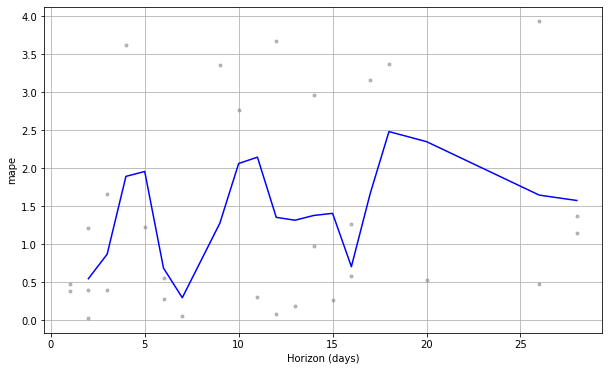

mape: 145.16%

1082743
      CategoryCode  ItemCode     DateID  DailySales
10304   category_4   1082743   1/1/2022           5
6240    category_4   1082743  1/11/2022           1
7770    category_4   1082743  1/13/2022           2
10077   category_4   1082743  1/14/2022           2
11782   category_4   1082743  1/15/2022           1
...            ...       ...        ...         ...
5368    category_4   1082743  2/11/2022          14
13070   category_4   1082743  2/12/2022          11
16121   category_4   1082743   2/7/2022          12
790     category_4   1082743   2/8/2022          35
223     category_4   1082743   2/9/2022           9

[71 rows x 4 columns]


Initial log joint probability = -35.5585
Iteration  1. Log joint probability =    75.9096. Improved by 111.468.
Iteration  2. Log joint probability =    91.0651. Improved by 15.1555.
Iteration  3. Log joint probability =    92.5514. Improved by 1.48632.
Iteration  4. Log joint probability =    93.5591. Improved by 1.00768.
Ite

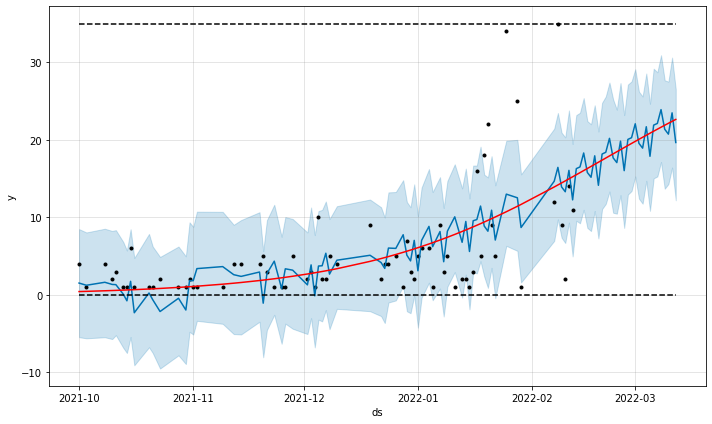

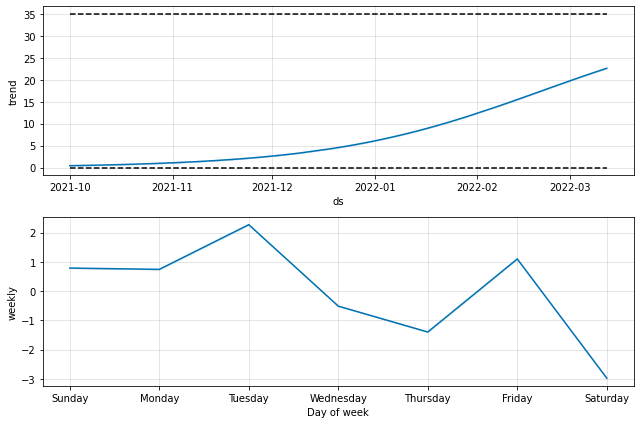

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -31.5018
Iteration  1. Log joint probability =    11.3822. Improved by 42.884.
Iteration  2. Log joint probability =    28.6471. Improved by 17.2649.
Iteration  3. Log joint probability =    35.7486. Improved by 7.10153.
Iteration  4. Log joint probability =    39.3596. Improved by 3.61095.
Iteration  5. Log joint probability =    41.3519. Improved by 1.99228.
Iteration  6. Log joint probability =    42.3241. Improved by 0.972244.
Iteration  7. Log joint probability =    42.9301. Improved by 0.606008.
Iteration  8. Log joint probability =     42.931. Improved by 0.000894421.
Iteration  9. Log joint probability =    42.9355. Improved by 0.00451948.
Iteration 10. Log joint probability =    42.9409. Improved by 0.00537842.
Iteration 11. Log joint probability =    42.9516. Improved by 0.0107412.
Iteration 12. Log joint probability =    42.9606. Improved by 0.00891841.
Iteration 13. Log joint probability =    42.9863. Improved by 0.025712.
Iteration 14. Log 

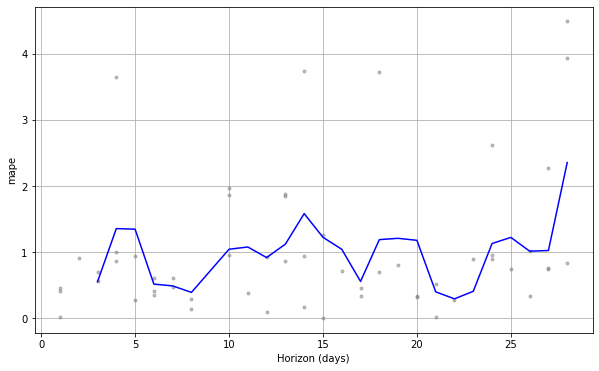

mape: 98.40%

1085749
      CategoryCode  ItemCode     DateID  DailySales
13893   category_1   1085749  1/10/2022           4
6886    category_1   1085749  1/11/2022           2
14184   category_1   1085749  1/12/2022           4
5954    category_1   1085749  1/13/2022           1
12243   category_1   1085749  1/14/2022           2
...            ...       ...        ...         ...
10344   category_1   1085749   2/5/2022           1
11660   category_1   1085749   2/6/2022           6
18644   category_1   1085749   2/7/2022           1
1763    category_1   1085749   2/8/2022           1
1534    category_1   1085749   2/9/2022           6

[84 rows x 4 columns]


Initial log joint probability = -48.3627
Iteration  1. Log joint probability =    9.81745. Improved by 58.1802.
Iteration  2. Log joint probability =    28.2989. Improved by 18.4814.
Iteration  3. Log joint probability =    28.3034. Improved by 0.00447501.
Iteration  4. Log joint probability =    28.3108. Improved by 0.00748236

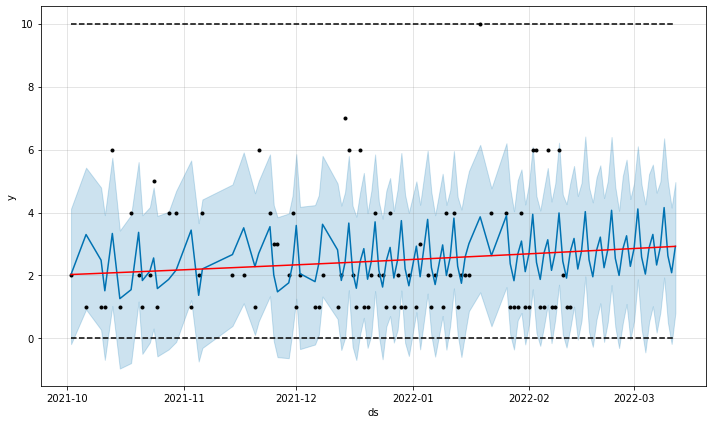

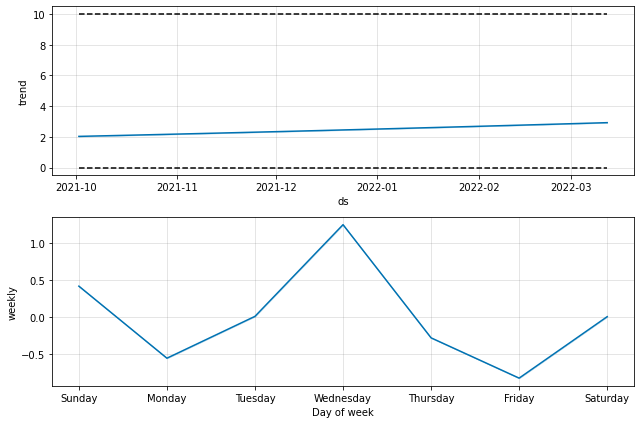

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -6.43903
Iteration  1. Log joint probability =    7.10835. Improved by 13.5474.
Iteration  2. Log joint probability =    27.7071. Improved by 20.5987.
Iteration  3. Log joint probability =    35.2108. Improved by 7.5038.
Iteration  4. Log joint probability =    35.5784. Improved by 0.367589.
Iteration  5. Log joint probability =    35.6168. Improved by 0.038398.
Iteration  6. Log joint probability =    35.6825. Improved by 0.0656182.
Iteration  7. Log joint probability =    35.6925. Improved by 0.0100703.
Iteration  8. Log joint probability =     35.699. Improved by 0.00652357.
Iteration  9. Log joint probability =    35.7003. Improved by 0.00129091.
Iteration 10. Log joint probability =    35.7017. Improved by 0.00137119.
Iteration 11. Log joint probability =    35.7028. Improved by 0.00112767.
Iteration 12. Log joint probability =    35.7031. Improved by 0.000252813.
Iteration 13. Log joint probability =    35.7032. Improved by 7.75533e-05.
Iteration 

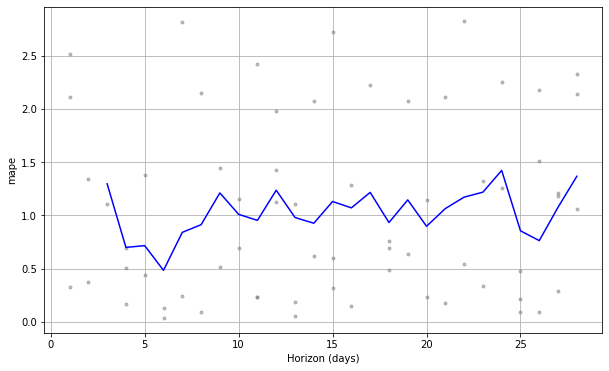

mape: 102.31%

1090024
      CategoryCode  ItemCode     DateID  DailySales
12426   category_3   1090024  1/10/2022          12
6314    category_3   1090024  1/11/2022           4
13134   category_3   1090024  1/12/2022           3
11484   category_3   1090024  1/14/2022           3
10135   category_3   1090024  1/15/2022           4
...            ...       ...        ...         ...
10257   category_3   1090024   2/5/2022           9
10794   category_3   1090024   2/6/2022           3
18618   category_3   1090024   2/7/2022           5
1302    category_3   1090024   2/8/2022          14
799     category_3   1090024   2/9/2022           6

[115 rows x 4 columns]

Initial log joint probability = -11.0351
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       142.842   1.34487e-07       95.1761      0.2129      0.2129      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       1

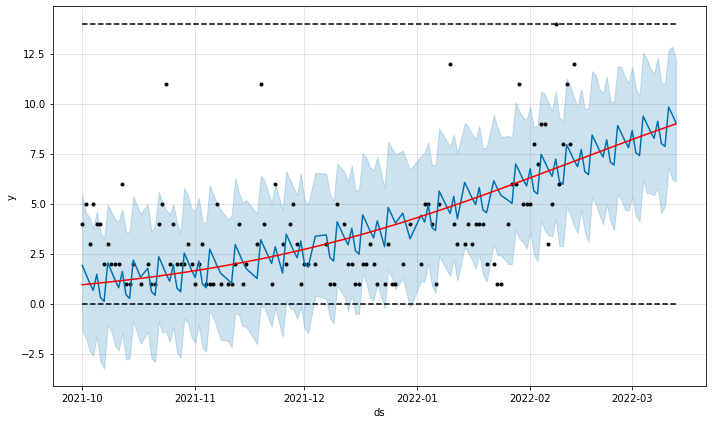

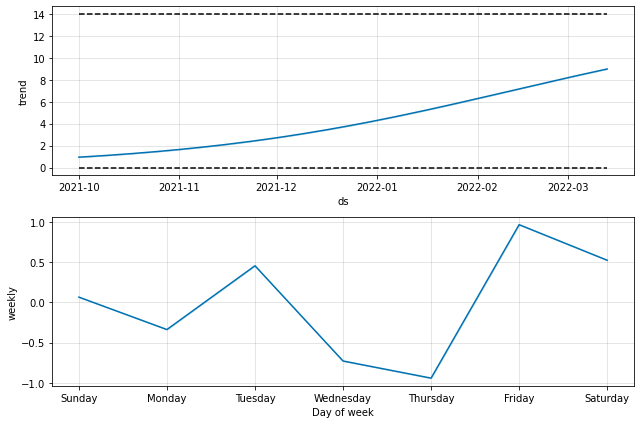

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -33.8472
Iteration  1. Log joint probability =     41.081. Improved by 74.9282.
Iteration  2. Log joint probability =    85.7079. Improved by 44.6269.
Iteration  3. Log joint probability =    89.2271. Improved by 3.51921.
Iteration  4. Log joint probability =    89.7652. Improved by 0.538114.
Iteration  5. Log joint probability =    89.8003. Improved by 0.0351417.
Iteration  6. Log joint probability =     89.821. Improved by 0.0206072.
Iteration  7. Log joint probability =    89.8391. Improved by 0.0181432.
Iteration  8. Log joint probability =    89.8487. Improved by 0.0096061.
Iteration  9. Log joint probability =    89.8517. Improved by 0.00300011.
Iteration 10. Log joint probability =    89.8577. Improved by 0.00599948.
Iteration 11. Log joint probability =    89.8601. Improved by 0.00235547.
Iteration 12. Log joint probability =     89.862. Improved by 0.0019271.
Iteration 13. Log joint probability =    89.8623. Improved by 0.000262364.
Iteration 1

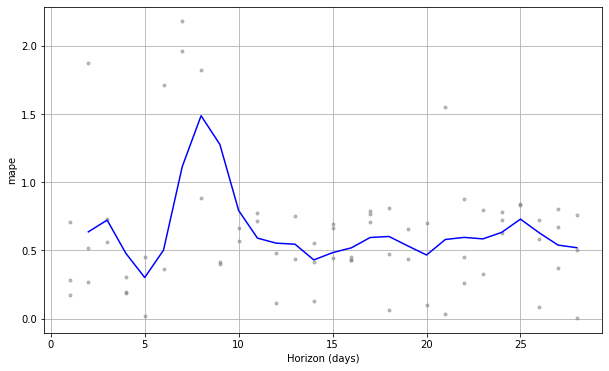

mape: 64.61%

1090258
      CategoryCode  ItemCode     DateID  DailySales
11344   category_2   1090258   1/1/2022           1
13869   category_2   1090258  1/10/2022           2
12698   category_2   1090258  1/12/2022           2
7560    category_2   1090258  1/13/2022           1
10717   category_2   1090258  1/14/2022          33
...            ...       ...        ...         ...
10131   category_2   1090258   2/5/2022           3
10104   category_2   1090258   2/6/2022           4
16430   category_2   1090258   2/7/2022           9
289     category_2   1090258   2/8/2022          11
125     category_2   1090258   2/9/2022           7

[75 rows x 4 columns]


Initial log joint probability = -112.109
Iteration  1. Log joint probability =    18.5742. Improved by 130.683.
Iteration  2. Log joint probability =    63.9217. Improved by 45.3474.
Iteration  3. Log joint probability =    79.8265. Improved by 15.9049.
Iteration  4. Log joint probability =    80.8828. Improved by 1.0563.
Itera

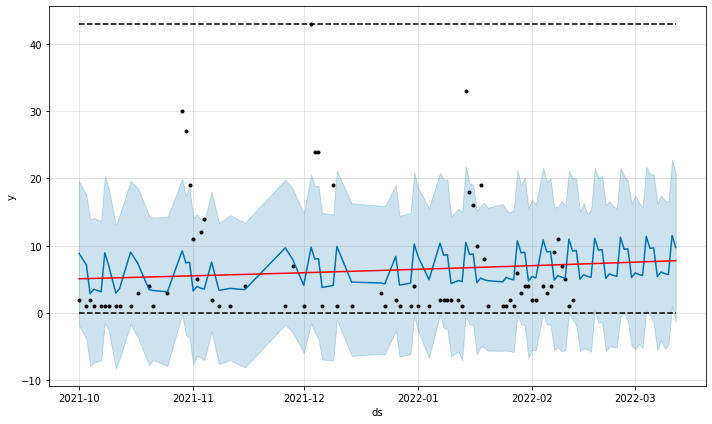

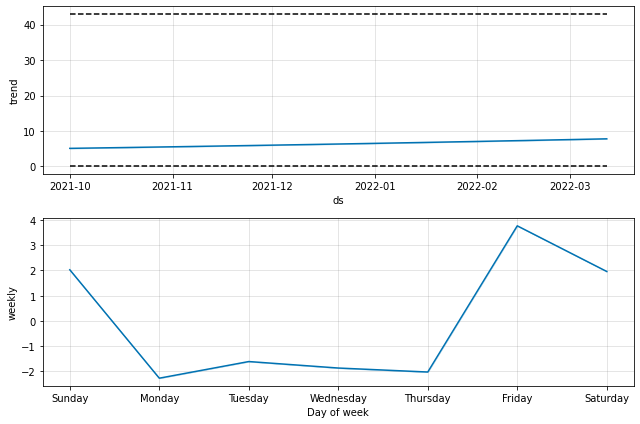

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -3.01325
Iteration  1. Log joint probability =    2.18934. Improved by 5.20259.
Iteration  2. Log joint probability =    4.06934. Improved by 1.88.
Iteration  3. Log joint probability =    23.7294. Improved by 19.6601.
Iteration  4. Log joint probability =    27.6727. Improved by 3.94329.
Iteration  5. Log joint probability =    31.1418. Improved by 3.46907.
Iteration  6. Log joint probability =    31.3951. Improved by 0.253275.
Iteration  7. Log joint probability =    31.3958. Improved by 0.000776935.
Iteration  8. Log joint probability =    31.4228. Improved by 0.0269646.
Iteration  9. Log joint probability =    32.1271. Improved by 0.704303.
Iteration 10. Log joint probability =    32.5289. Improved by 0.401851.
Iteration 11. Log joint probability =    32.5621. Improved by 0.0332005.
Iteration 12. Log joint probability =    32.5929. Improved by 0.0307272.
Iteration 13. Log joint probability =    32.5991. Improved by 0.0062309.
Iteration 14. Log joint

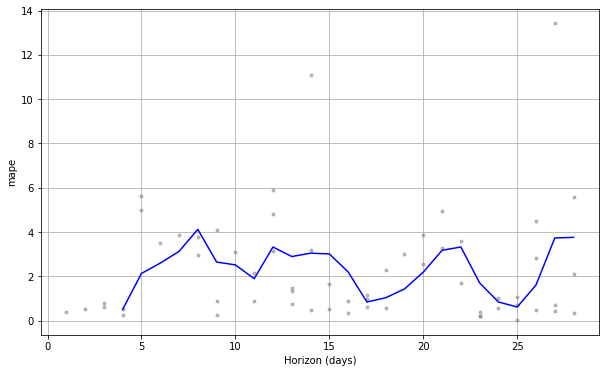

mape: 233.04%

1092184
      CategoryCode  ItemCode     DateID  DailySales
11929   category_2   1092184   1/1/2022           6
6644    category_2   1092184  1/11/2022           7
13919   category_2   1092184  1/12/2022           2
5815    category_2   1092184  1/13/2022           4
10454   category_2   1092184  1/14/2022           4
...            ...       ...        ...         ...
10504   category_2   1092184   2/5/2022           4
10750   category_2   1092184   2/6/2022           3
15956   category_2   1092184   2/7/2022           1
1040    category_2   1092184   2/8/2022           3
1581    category_2   1092184   2/9/2022           2

[115 rows x 4 columns]

Initial log joint probability = -6.77061
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      55        105.55   4.78415e-06       99.9217   4.736e-08       0.001      110  LS failed, Hessian reset 
      99        105.55   1.06688e-07       100.715      0.6611      0.1507      169 

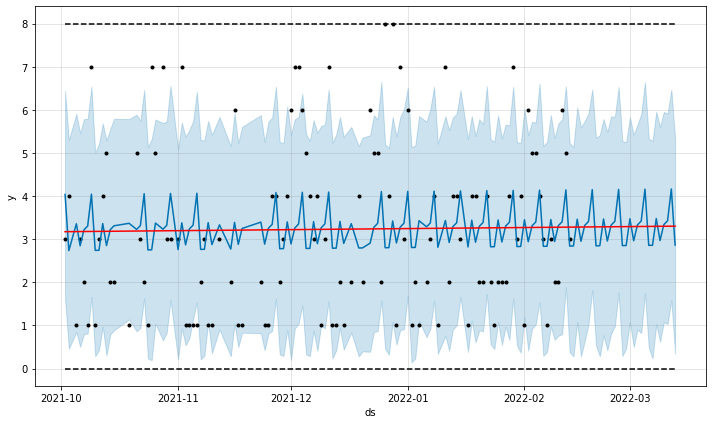

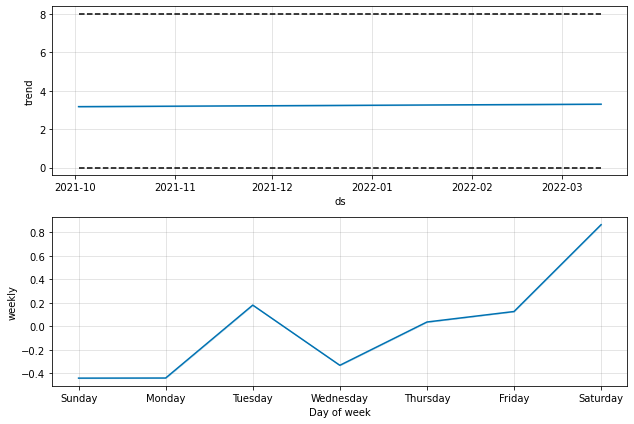

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -29.6314
Iteration  1. Log joint probability =    35.2072. Improved by 64.8386.
Iteration  2. Log joint probability =    47.5618. Improved by 12.3546.
Iteration  3. Log joint probability =    49.2848. Improved by 1.72305.
Iteration  4. Log joint probability =    49.4189. Improved by 0.134075.
Iteration  5. Log joint probability =    49.6408. Improved by 0.221873.
Iteration  6. Log joint probability =     49.701. Improved by 0.0602448.
Iteration  7. Log joint probability =    49.7455. Improved by 0.0444948.
Iteration  8. Log joint probability =    49.7519. Improved by 0.00636572.
Iteration  9. Log joint probability =    49.7611. Improved by 0.00923762.
Iteration 10. Log joint probability =     49.762. Improved by 0.000915064.
Iteration 11. Log joint probability =     49.767. Improved by 0.0049853.
Iteration 12. Log joint probability =     49.769. Improved by 0.00199424.
Iteration 13. Log joint probability =    49.7715. Improved by 0.00244497.
Iteration 1

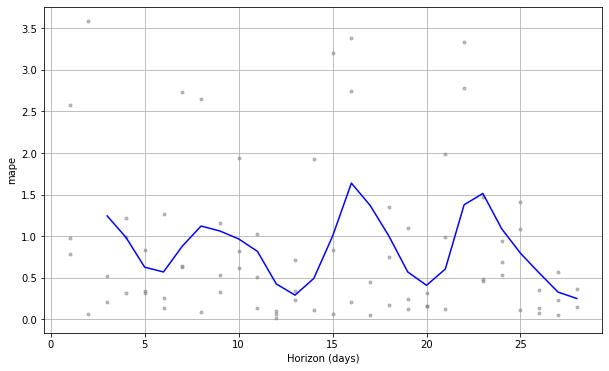

mape: 84.64%

1101553
      CategoryCode  ItemCode      DateID  DailySales
13249   category_2   1101553   1/10/2022           2
7321    category_2   1101553   1/11/2022           1
14192   category_2   1101553   1/12/2022           4
6000    category_2   1101553   1/13/2022           1
14232   category_2   1101553   1/18/2022           1
...            ...       ...         ...         ...
11100   category_2   1101553  12/31/2021           2
1910    category_2   1101553   12/7/2021           2
14839   category_2   1101553    2/1/2022           1
6026    category_2   1101553   2/10/2022           1
14437   category_2   1101553    2/2/2022           2

[75 rows x 4 columns]


Initial log joint probability = -39.8622
Iteration  1. Log joint probability =     22.588. Improved by 62.4502.
Iteration  2. Log joint probability =     42.591. Improved by 20.003.
Iteration  3. Log joint probability =    42.9915. Improved by 0.400424.
Iteration  4. Log joint probability =    43.0725. Improved by 0

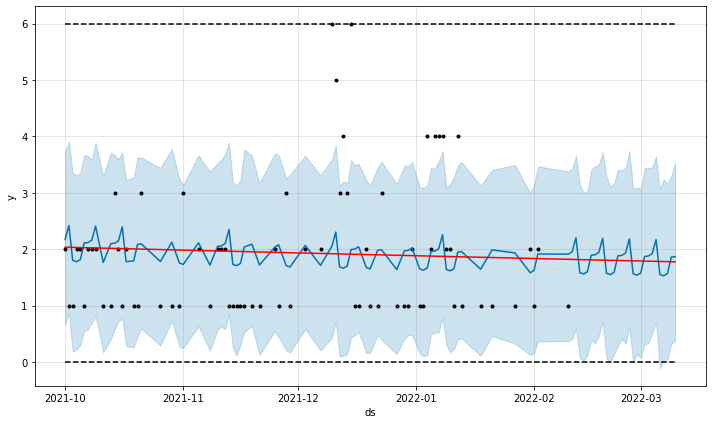

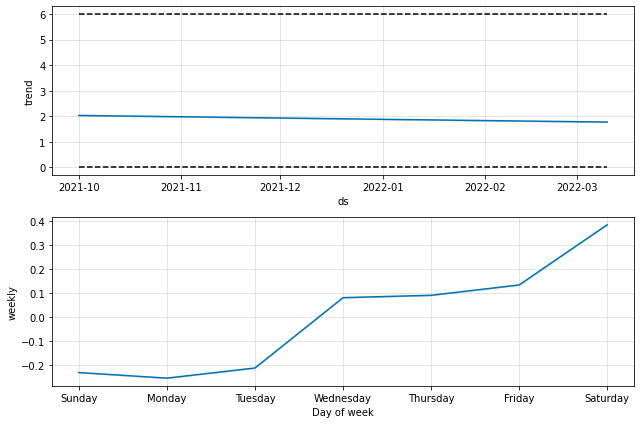

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -13.6749
Iteration  1. Log joint probability =     14.261. Improved by 27.9359.
Iteration  2. Log joint probability =    34.6367. Improved by 20.3756.
Iteration  3. Log joint probability =    35.4232. Improved by 0.786589.
Iteration  4. Log joint probability =    35.4339. Improved by 0.0106487.
Iteration  5. Log joint probability =     35.456. Improved by 0.0220726.
Iteration  6. Log joint probability =    35.5157. Improved by 0.0597571.
Iteration  7. Log joint probability =     35.516. Improved by 0.00026569.
Iteration  8. Log joint probability =    35.5511. Improved by 0.0351237.
Iteration  9. Log joint probability =    35.6317. Improved by 0.0806005.
Iteration 10. Log joint probability =     35.663. Improved by 0.0312929.
Iteration 11. Log joint probability =    35.7525. Improved by 0.0894465.
Iteration 12. Log joint probability =    36.0427. Improved by 0.290225.
Iteration 13. Log joint probability =    36.0928. Improved by 0.0500816.
Iteration 14. 

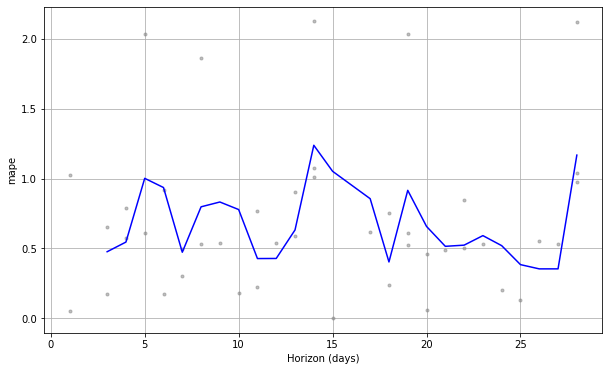

mape: 67.45%

1101562
      CategoryCode  ItemCode     DateID  DailySales
11907   category_2   1101562   1/1/2022           3
13224   category_2   1101562  1/10/2022           2
13237   category_2   1101562  1/12/2022           1
7433    category_2   1101562  1/13/2022           1
10640   category_2   1101562  1/14/2022           4
...            ...       ...        ...         ...
11901   category_2   1101562  2/13/2022           1
11081   category_2   1101562   2/5/2022           1
11370   category_2   1101562   2/6/2022           3
15911   category_2   1101562   2/7/2022           2
1101    category_2   1101562   2/9/2022           1

[94 rows x 4 columns]


Initial log joint probability = -57.9059
Iteration  1. Log joint probability =    35.7622. Improved by 93.6681.
Iteration  2. Log joint probability =    68.5579. Improved by 32.7957.
Iteration  3. Log joint probability =    96.2946. Improved by 27.7367.
Iteration  4. Log joint probability =    96.3346. Improved by 0.04002.
Iter

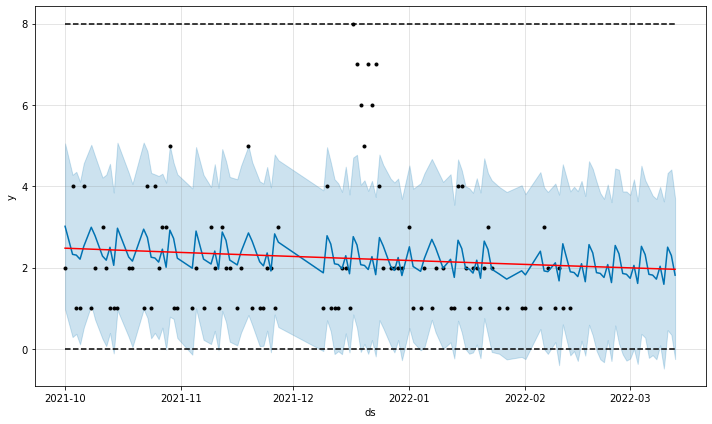

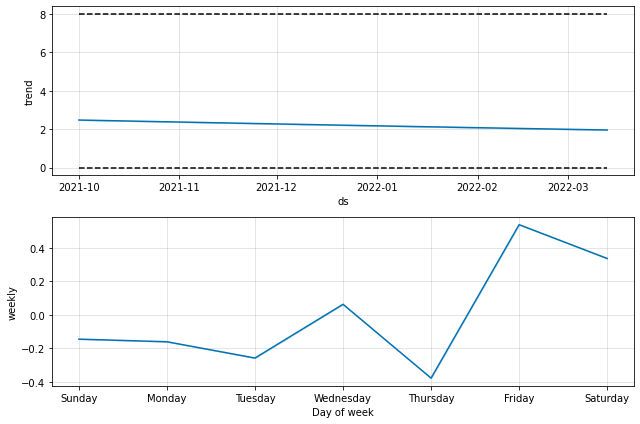

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -21.3621
Iteration  1. Log joint probability =    6.79408. Improved by 28.1562.
Iteration  2. Log joint probability =    11.8274. Improved by 5.03332.
Iteration  3. Log joint probability =     36.119. Improved by 24.2916.
Iteration  4. Log joint probability =    60.5379. Improved by 24.4189.
Iteration  5. Log joint probability =    60.5466. Improved by 0.00872432.
Iteration  6. Log joint probability =     60.551. Improved by 0.00436131.
Iteration  7. Log joint probability =    60.5529. Improved by 0.00192585.
Iteration  8. Log joint probability =    60.5538. Improved by 0.000962894.
Iteration  9. Log joint probability =    60.6658. Improved by 0.11199.
Iteration 10. Log joint probability =    60.6693. Improved by 0.00349319.
Iteration 11. Log joint probability =     60.681. Improved by 0.0116983.
Iteration 12. Log joint probability =     60.684. Improved by 0.00292401.
Iteration 13. Log joint probability =    60.6847. Improved by 0.000730969.
Iteration 

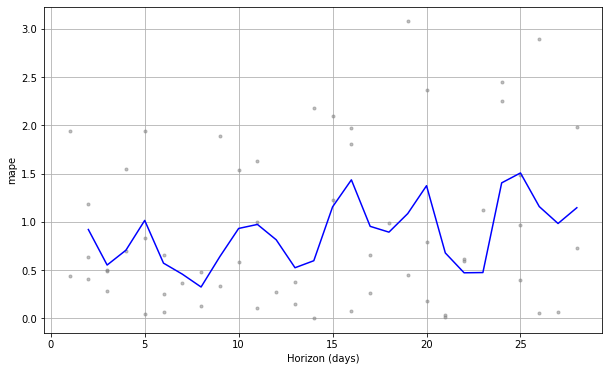

mape: 87.97%

1101571
      CategoryCode  ItemCode     DateID  DailySales
10127   category_2   1101571   1/1/2022           1
14152   category_2   1101571  1/10/2022           1
7767    category_2   1101571  1/11/2022           2
14499   category_2   1101571  1/12/2022           1
7669    category_2   1101571  1/13/2022           1
...            ...       ...        ...         ...
5962    category_2   1101571  2/11/2022           8
13884   category_2   1101571  2/12/2022           3
10137   category_2   1101571  2/13/2022           6
4349    category_2   1101571   2/3/2022           4
11393   category_2   1101571   2/4/2022           2

[80 rows x 4 columns]


Initial log joint probability = -44.7352
Iteration  1. Log joint probability =    64.3729. Improved by 109.108.
Iteration  2. Log joint probability =    74.7113. Improved by 10.3384.
Iteration  3. Log joint probability =    79.4555. Improved by 4.74426.
Iteration  4. Log joint probability =    79.7864. Improved by 0.330893.
Ite

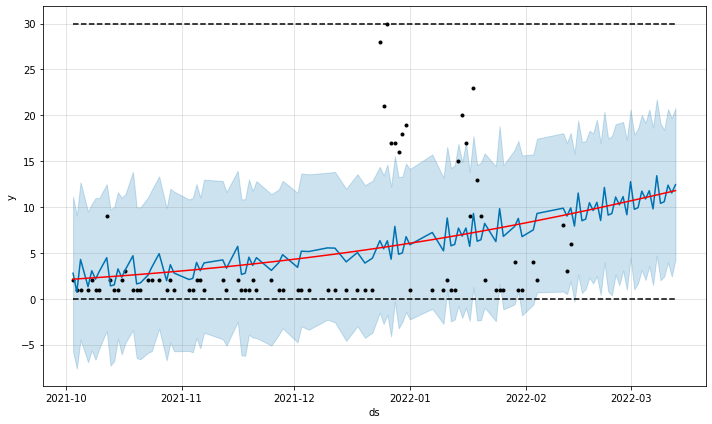

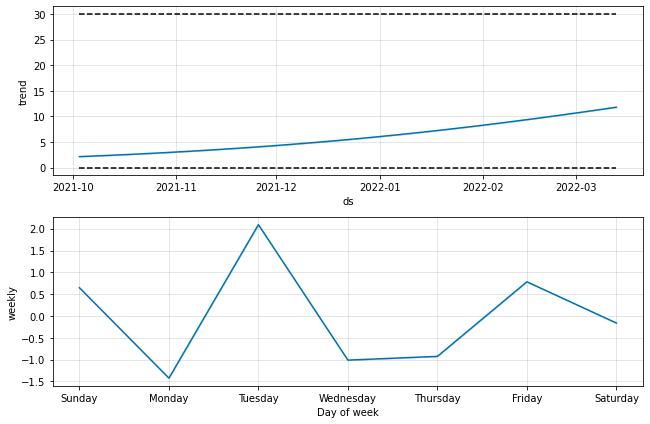

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -11.074
Iteration  1. Log joint probability =    49.8117. Improved by 60.8857.
Iteration  2. Log joint probability =     59.757. Improved by 9.94537.
Iteration  3. Log joint probability =    68.4874. Improved by 8.73033.
Iteration  4. Log joint probability =    68.6665. Improved by 0.179174.
Iteration  5. Log joint probability =    69.9036. Improved by 1.23708.
Iteration  6. Log joint probability =    69.9124. Improved by 0.00879832.
Iteration  7. Log joint probability =    69.9207. Improved by 0.00828933.
Iteration  8. Log joint probability =     69.931. Improved by 0.0103075.
Iteration  9. Log joint probability =    69.9361. Improved by 0.00508552.
Iteration 10. Log joint probability =    69.9615. Improved by 0.0254338.
Iteration 11. Log joint probability =    69.9787. Improved by 0.0171455.
Iteration 12. Log joint probability =    70.0119. Improved by 0.0332495.
Iteration 13. Log joint probability =    70.0286. Improved by 0.0166307.
Iteration 14. Lo

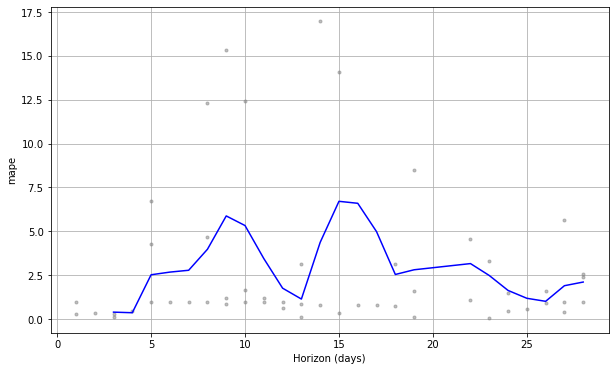

mape: 299.31%

1101769
      CategoryCode  ItemCode     DateID  DailySales
14549   category_2   1101769  1/10/2022           1
14494   category_2   1101769  1/12/2022           1
6044    category_2   1101769  1/13/2022           2
12122   category_2   1101769  1/14/2022           1
10980   category_2   1101769  1/15/2022           1
...            ...       ...        ...         ...
11666   category_2   1101769   2/5/2022           3
10243   category_2   1101769   2/6/2022           5
19002   category_2   1101769   2/7/2022           3
124     category_2   1101769   2/8/2022           3
290     category_2   1101769   2/9/2022           5

[76 rows x 4 columns]


Initial log joint probability = -44.3117
Iteration  1. Log joint probability =    65.3377. Improved by 109.649.
Iteration  2. Log joint probability =    86.5152. Improved by 21.1775.
Iteration  3. Log joint probability =    88.4131. Improved by 1.89793.
Iteration  4. Log joint probability =    89.5507. Improved by 1.13753.
Ite

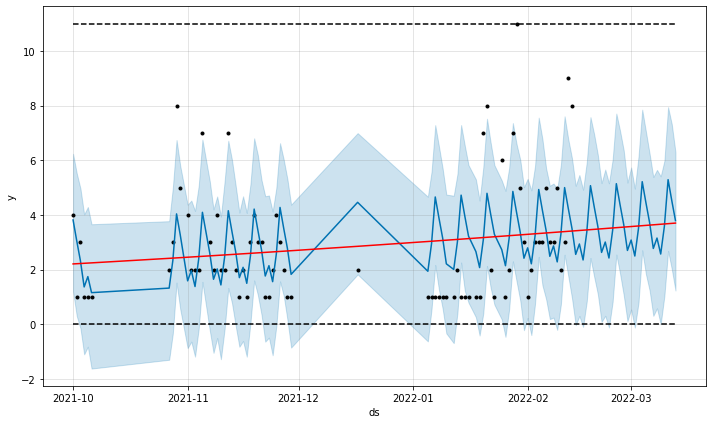

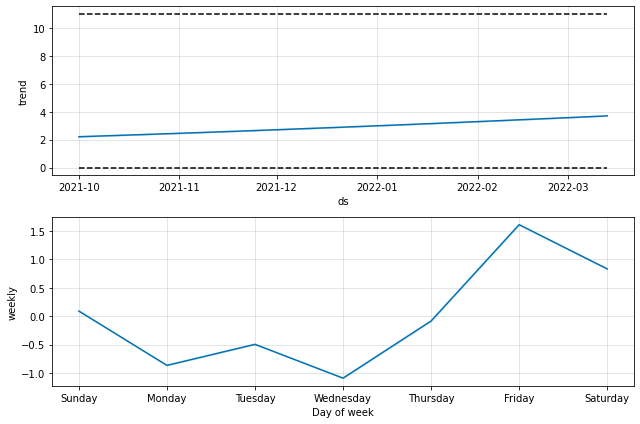

  0%|          | 0/3 [00:00<?, ?it/s]


Initial log joint probability = -5.88747
Iteration  1. Log joint probability =    26.1578. Improved by 32.0452.
Iteration  2. Log joint probability =    41.2136. Improved by 15.0558.
Iteration  3. Log joint probability =     43.808. Improved by 2.59437.
Iteration  4. Log joint probability =    44.0892. Improved by 0.281252.
Iteration  5. Log joint probability =     44.091. Improved by 0.00176787.
Iteration  6. Log joint probability =     44.098. Improved by 0.00703156.
Iteration  7. Log joint probability =     44.111. Improved by 0.0129247.
Iteration  8. Log joint probability =    44.1158. Improved by 0.00482006.
Iteration  9. Log joint probability =    44.1229. Improved by 0.00713449.
Iteration 10. Log joint probability =    44.1297. Improved by 0.00680516.
Iteration 11. Log joint probability =    44.1413. Improved by 0.0115816.
Iteration 12. Log joint probability =    44.2712. Improved by 0.129884.
Iteration 13. Log joint probability =    44.2803. Improved by 0.00905385.
Iteration 1

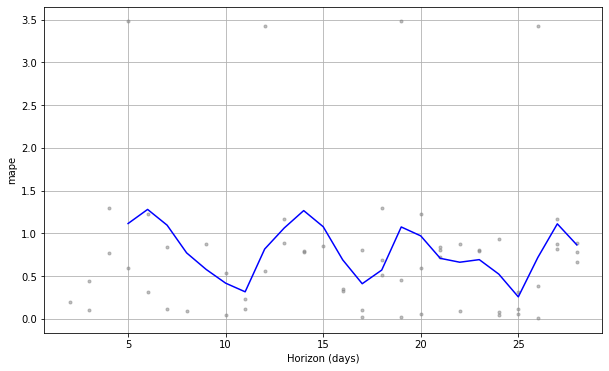

mape: 79.35%

1103056
      CategoryCode  ItemCode     DateID  DailySales
10296   category_2   1103056   1/1/2022           1
14694   category_2   1103056  1/10/2022           1
6604    category_2   1103056  1/11/2022           2
13791   category_2   1103056  1/12/2022           3
6370    category_2   1103056  1/13/2022           2
...            ...       ...        ...         ...
4315    category_2   1103056   2/3/2022           6
10862   category_2   1103056   2/5/2022           3
11795   category_2   1103056   2/6/2022           2
18980   category_2   1103056   2/7/2022           1
1001    category_2   1103056   2/8/2022           1

[104 rows x 4 columns]

Initial log joint probability = -4.09596
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       123.527   1.49777e-05       95.0923      0.8887      0.8887      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12

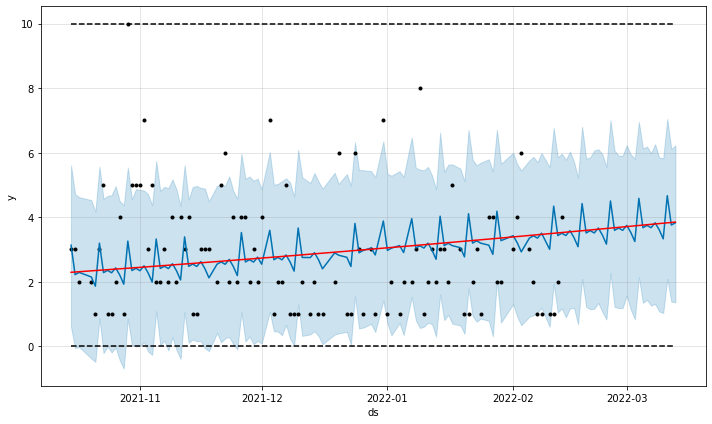

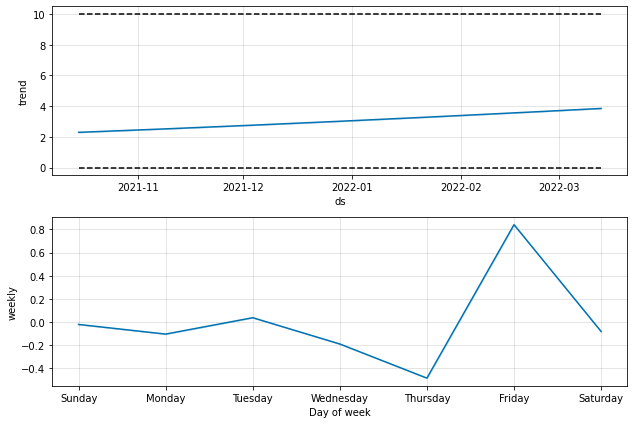

  0%|          | 0/2 [00:00<?, ?it/s]


Initial log joint probability = -34.719
Iteration  1. Log joint probability =    48.8187. Improved by 83.5378.
Iteration  2. Log joint probability =    76.4395. Improved by 27.6207.
Iteration  3. Log joint probability =    81.8971. Improved by 5.45764.
Iteration  4. Log joint probability =    83.2402. Improved by 1.34312.
Iteration  5. Log joint probability =    84.1725. Improved by 0.932301.
Iteration  6. Log joint probability =    86.2705. Improved by 2.09799.
Iteration  7. Log joint probability =    86.2763. Improved by 0.00577468.
Iteration  8. Log joint probability =    86.2819. Improved by 0.00563954.
Iteration  9. Log joint probability =    86.2824. Improved by 0.000463179.
Iteration 10. Log joint probability =    86.3026. Improved by 0.0202325.
Iteration 11. Log joint probability =    86.3127. Improved by 0.0100805.
Iteration 12. Log joint probability =    86.4082. Improved by 0.0954481.
Iteration 13. Log joint probability =    86.6337. Improved by 0.225563.
Iteration 14. Log 

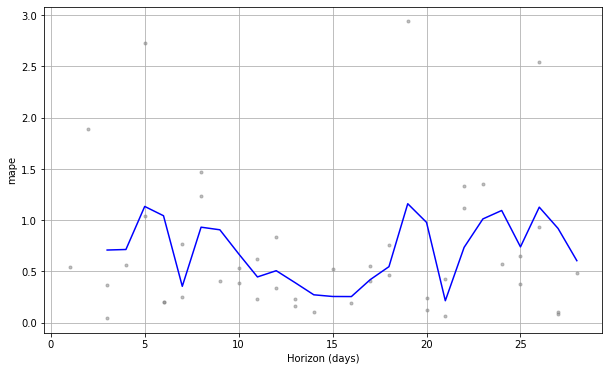

mape: 69.82%

1105018
      CategoryCode  ItemCode     DateID  DailySales
13170   category_2   1105018  1/10/2022           1
6769    category_2   1105018  1/11/2022           2
14725   category_2   1105018  1/12/2022           3
5971    category_2   1105018  1/13/2022           1
12256   category_2   1105018  1/14/2022           1
...            ...       ...        ...         ...
5718    category_2   1105018  2/10/2022           3
7655    category_2   1105018  2/11/2022           1
10961   category_2   1105018  2/13/2022           1
4401    category_2   1105018   2/3/2022           2
611     category_2   1105018   2/8/2022           1

[66 rows x 4 columns]


Initial log joint probability = -48.0748
Iteration  1. Log joint probability =   -9.69394. Improved by 38.3809.
Iteration  2. Log joint probability =    1.47865. Improved by 11.1726.
Iteration  3. Log joint probability =    53.6777. Improved by 52.199.
Iteration  4. Log joint probability =     77.702. Improved by 24.0243.
Itera

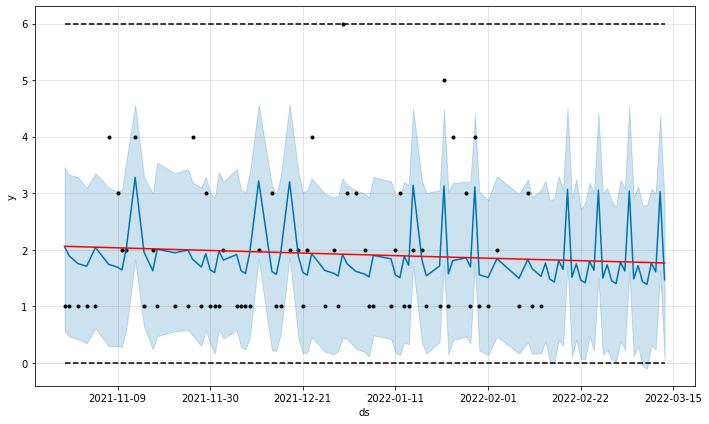

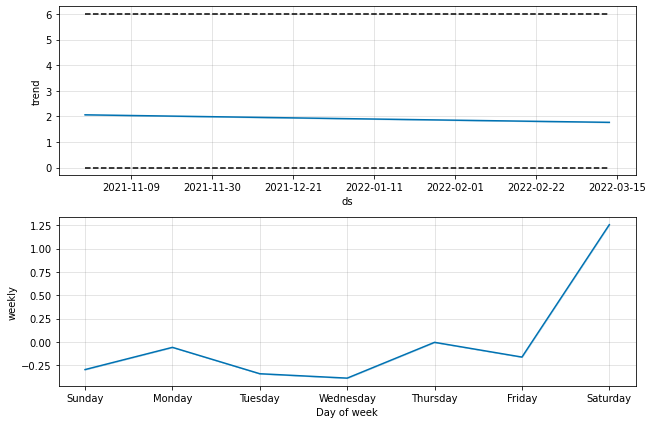

  0%|          | 0/1 [00:00<?, ?it/s]


Initial log joint probability = -16.0546
Iteration  1. Log joint probability =    41.3489. Improved by 57.4034.
Iteration  2. Log joint probability =    57.2518. Improved by 15.9029.
Iteration  3. Log joint probability =    59.4726. Improved by 2.22081.
Iteration  4. Log joint probability =    59.4984. Improved by 0.0258308.
Iteration  5. Log joint probability =    59.6267. Improved by 0.128224.
Iteration  6. Log joint probability =    59.9324. Improved by 0.305716.
Iteration  7. Log joint probability =    60.0145. Improved by 0.082084.
Iteration  8. Log joint probability =    60.0611. Improved by 0.0466392.
Iteration  9. Log joint probability =    60.1541. Improved by 0.0930168.
Iteration 10. Log joint probability =    60.1779. Improved by 0.0237397.
Iteration 11. Log joint probability =    60.1864. Improved by 0.0085283.
Iteration 12. Log joint probability =    60.1929. Improved by 0.00653631.
Iteration 13. Log joint probability =    60.1991. Improved by 0.00616306.
Iteration 14. Lo

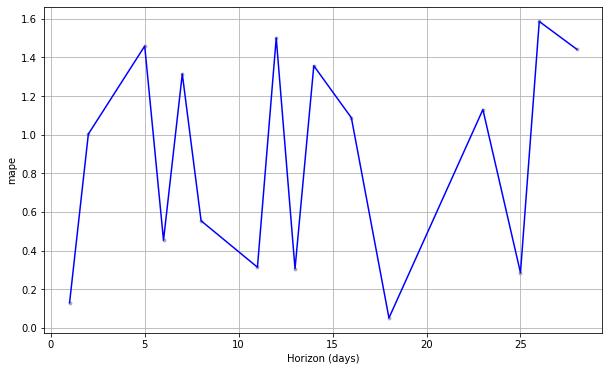

mape: 87.33%

1105027
      CategoryCode  ItemCode     DateID  DailySales
12186   category_2   1105027   1/1/2022           2
14902   category_2   1105027  1/10/2022           1
14818   category_2   1105027  1/12/2022           1
7390    category_2   1105027  1/13/2022           1
11976   category_2   1105027  1/14/2022           1
...            ...       ...        ...         ...
4948    category_2   1105027   2/3/2022           1
12257   category_2   1105027   2/4/2022           2
11991   category_2   1105027   2/6/2022           1
15700   category_2   1105027   2/7/2022           1
1095    category_2   1105027   2/9/2022           5

[78 rows x 4 columns]


Initial log joint probability = -44.4635
Iteration  1. Log joint probability =    39.3627. Improved by 83.8263.
Iteration  2. Log joint probability =    48.1378. Improved by 8.77512.
Iteration  3. Log joint probability =    66.5034. Improved by 18.3656.
Iteration  4. Log joint probability =    66.5211. Improved by 0.0176916.
It

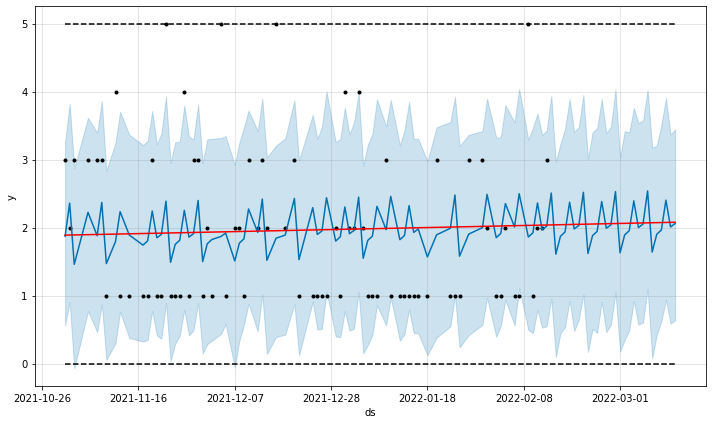

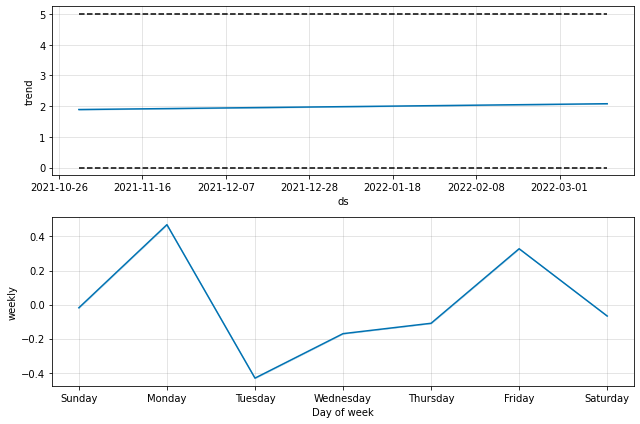

  0%|          | 0/1 [00:00<?, ?it/s]


Initial log joint probability = -26.0159
Iteration  1. Log joint probability =   -2.93317. Improved by 23.0827.
Iteration  2. Log joint probability =    26.0336. Improved by 28.9668.
Iteration  3. Log joint probability =    26.0366. Improved by 0.00300741.
Iteration  4. Log joint probability =    26.0507. Improved by 0.0140862.
Iteration  5. Log joint probability =    26.0811. Improved by 0.0304047.
Iteration  6. Log joint probability =     26.089. Improved by 0.007899.
Iteration  7. Log joint probability =    26.1633. Improved by 0.0742853.
Iteration  8. Log joint probability =    28.2234. Improved by 2.06016.
Iteration  9. Log joint probability =    30.5656. Improved by 2.3422.
Iteration 10. Log joint probability =    30.8985. Improved by 0.332847.
Iteration 11. Log joint probability =    31.0443. Improved by 0.145804.
Iteration 12. Log joint probability =    31.3065. Improved by 0.26226.
Iteration 13. Log joint probability =    31.6667. Improved by 0.360127.
Iteration 14. Log joint

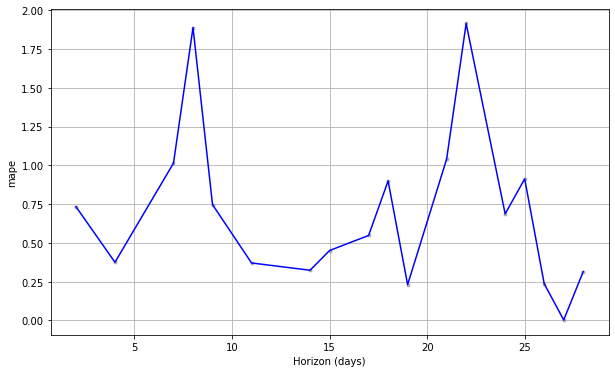

mape: 70.56%



In [20]:
dict_test= {}
for item in list_test:
    print(item)
    index = list_test.index(item)
    Item_3148_train_dataset = train_dataset.loc[train_dataset['ItemCode'] == item]
    Item_3148_train_dataset.sort_values(by='DateID', inplace=True)
    print(Item_3148_train_dataset)
    Item_3148_train_dataset_forTraining = Item_3148_train_dataset[['DateID', 'DailySales']]
    Item_3148_train_dataset_forTraining.head()
    Item_3148_train_dataset_forTraining.index = range(len(Item_3148_train_dataset_forTraining))
    Item_3148_series = Item_3148_train_dataset_forTraining["DailySales"].squeeze()
    print("")
    Phophet_df = Item_3148_train_dataset_forTraining.rename(columns= {'DateID':'ds', 'DailySales': 'y'})
    Phophet_df.head()
    
    m = Prophet(growth="logistic",
            daily_seasonality=False,
            weekly_seasonality=True,
            yearly_seasonality=False,
            )
    cap = Phophet_df['y']
    flr = Phophet_df['ds']
    Phophet_df['cap'] = Phophet_df['y'].max()
    Phophet_df['floor'] = 0
    m.fit(Phophet_df)

    future = m.make_future_dataframe(periods=28, freq='D')
    future['floor'] = 0
    future['cap'] = Phophet_df['y'].max()

    forecast = m.predict(future)
    print("HERE IS YOUR FORECAST")
    print(len(forecast))
    forecast_list = forecast['yhat'].tolist()[-28:]
    forecast_array = np.array(forecast_list)
    #print(forecast_array)
    key1 = np.sum(forecast_array[0:7])
    key2 = np.sum(forecast_array[7:14])
    key3 = np.sum(forecast_array[14:21])
    key4 = np.sum(forecast_array[21:28])
    fig = m.plot(forecast)
    a = add_changepoints_to_plot(fig.gca(), m, forecast)
    plt.show()
    fig2 = m.plot_components(forecast)
    plt.show()
    df_cv = cross_validation(m, initial='70 days', horizon='28 days')
    df_p = performance_metrics(df_cv)
    fig = plot_cross_validation_metric(df_cv, metric='mape')
    plt.show()
    key_MAPE = df_p['mape'].mean()
    keys = [item, key1, key2,key3, key4, key_MAPE]
    dict_test[index]= keys
    print('mape:', '{:.2f}%'.format(100 * df_p['mape'].mean()))
    print("")


In [21]:
print(dict_test)

{0: [9925, 19.34993973761045, 19.612048253375015, 19.876722260012418, 20.143960253964053, 1.061950605743681], 1: [16936, 107.96857410362705, 117.37364669277896, 127.47816628010636, 138.31302771599934, 1.863954835526442], 2: [23200, 92.80264725852805, 92.21404412243996, 91.62784423185265, 91.04405468714228, 3.4849510640360473], 3: [32245, 20.256126965811966, 19.058979355424345, 17.929352915122003, 16.86381251740357, 0.8012254402932217], 4: [35449, 27.362568870375824, 28.248775530010676, 29.15520002252916, 30.081758206083844, 1.8501664164234624], 5: [35530, 28.510623132518457, 28.972204305557888, 29.43862337752823, 29.909846257200382, 1.3309553092034438], 6: [36898, 89.18750490764486, 90.76741056252581, 92.36385562815967, 93.97661138851223, 0.7125290496118358], 7: [37510, 14.051199272387333, 14.236638653610797, 14.423964573752578, 14.613181437613012, 0.7990682866724269], 8: [37861, 198.95779088244154, 206.09275081822614, 213.39551507735558, 220.86379381567116, 0.7220300178714303], 9: [38

In [30]:
import pickle
  
#dictionary = {'geek': 1, 'supergeek': True, 4: 'geeky'}
  
with open('test_prophet.json', 'wb') as fp:
    pickle.dump(dict_test, fp)

In [31]:
with open('../input/weeklyforecasting/test_prophet.json', 'rb') as fp:
    data = pickle.load(fp)
print(data)

{0: [9925, 19.34993973761045, 19.612048253375015, 19.876722260012418, 20.143960253964053, 1.061950605743681], 1: [16936, 107.96857410362705, 117.37364669277896, 127.47816628010636, 138.31302771599934, 1.863954835526442], 2: [23200, 92.80264725852805, 92.21404412243996, 91.62784423185265, 91.04405468714228, 3.4849510640360473], 3: [32245, 20.256126965811966, 19.058979355424345, 17.929352915122003, 16.86381251740357, 0.8012254402932217], 4: [35449, 27.362568870375824, 28.248775530010676, 29.15520002252916, 30.081758206083844, 1.8501664164234624], 5: [35530, 28.510623132518457, 28.972204305557888, 29.43862337752823, 29.909846257200382, 1.3309553092034438], 6: [36898, 89.18750490764486, 90.76741056252581, 92.36385562815967, 93.97661138851223, 0.7125290496118358], 7: [37510, 14.051199272387333, 14.236638653610797, 14.423964573752578, 14.613181437613012, 0.7990682866724269], 8: [37861, 198.95779088244154, 206.09275081822614, 213.39551507735558, 220.86379381567116, 0.7220300178714303], 9: [38

In [ ]:
train_path = '../input/weeklyforecasting/weekly_train_data.csv'
train_dataset = pd.read_csv(train_path)
train_dataset = train_dataset.drop_duplicates(keep = 'first')
print(train_dataset)

In [ ]:
Item_3148_train_dataset = train_dataset.loc[train_dataset['ItemCode'] == 3418]
print(Item_3148_train_dataset)